In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score 
from sklearn.preprocessing import StandardScaler

C:\ProgramData\anaconda3\Lib\site-packages\pandas\core\arrays\masked.py:60: UserWarning: Pandas requires version '1.3.6' or newer of 'bottleneck' (version '1.3.5' currently installed).
  from pandas.core import (


In [2]:
import time

# Start time
start_time = time.time()

In [3]:
import warnings
# Suppress all warnings
warnings.filterwarnings("ignore")

In [4]:
np.random.seed(42)
df1 = pd.read_csv('E:\ML\Assignment 1\churn.csv')

In [5]:
unique_values = {}
for col in df1.columns:
    unique_values[col] = df1[col].value_counts().shape[0]

pd.DataFrame(unique_values, index=['unique value count']).transpose()

,unique value count
customer_id,4250
state,51
account_length,215
area_code,3
international_plan,2
voice_mail_plan,2
number_vmail_messages,46
total_day_minutes,1843
total_day_calls,120
total_day_charge,1843


In [6]:
df1['area_code'] = df1['area_code'].replace({'area_code_510': 0, 'area_code_415': 1, 'area_code_408': 2})

In [7]:
columns_1 = ['international_plan','voice_mail_plan','churn']
for col in columns_1:
    df1[col] = df1[col].astype(int)

In [8]:
df1 = df1.drop(columns=['customer_id','state'])

<Axes: title={'center': 'Correlation with Churn Column'}>

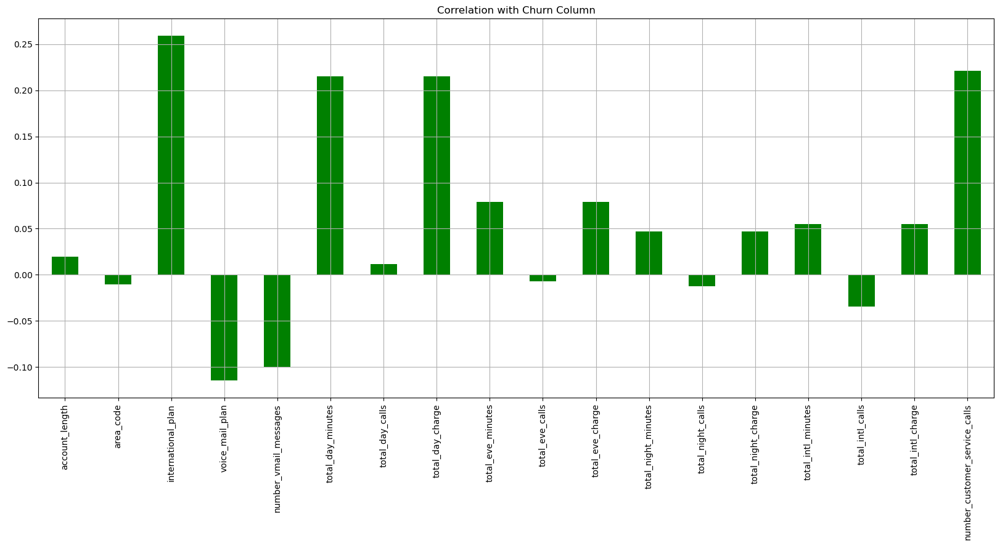

In [9]:
df1.drop('churn', axis=1).corrwith(df1.churn).plot(kind='bar', grid=True, figsize=(20, 8), title="Correlation with Churn Column", color='green')

array([[<Axes: title={'center': 'account_length'}>,
        <Axes: title={'center': 'area_code'}>,
        <Axes: title={'center': 'international_plan'}>,
        <Axes: title={'center': 'voice_mail_plan'}>],
       [<Axes: title={'center': 'number_vmail_messages'}>,
        <Axes: title={'center': 'total_day_minutes'}>,
        <Axes: title={'center': 'total_day_calls'}>,
        <Axes: title={'center': 'total_day_charge'}>],
       [<Axes: title={'center': 'total_eve_minutes'}>,
        <Axes: title={'center': 'total_eve_calls'}>,
        <Axes: title={'center': 'total_eve_charge'}>,
        <Axes: title={'center': 'total_night_minutes'}>],
       [<Axes: title={'center': 'total_night_calls'}>,
        <Axes: title={'center': 'total_night_charge'}>,
        <Axes: title={'center': 'total_intl_minutes'}>,
        <Axes: title={'center': 'total_intl_calls'}>],
       [<Axes: title={'center': 'total_intl_charge'}>,
        <Axes: title={'center': 'number_customer_service_calls'}>,
     

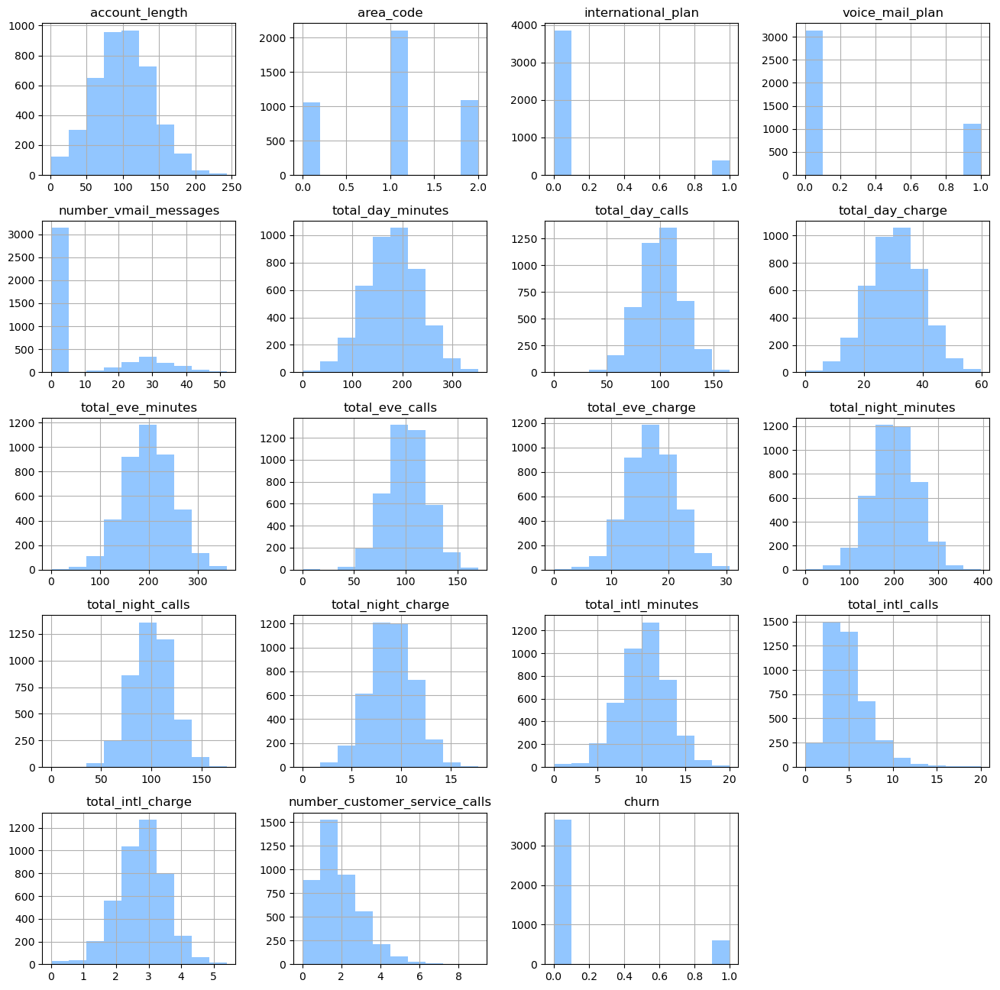

In [10]:
# plot data distributions
plt.style.use("seaborn-v0_8-pastel")
plt.rcParams['font.size'] = 10
df1.hist(figsize=(16, 16))

In [756]:
rank_churn = np.linalg.matrix_rank(X_train)
print("Rank of the churn dataset:", rank_churn)

Rank of the churn dataset: 18


In [770]:
correlation_matrix = df1.corr()
print(correlation_matrix)

                               account_length     area_code  \
account_length                   1.0000000000  0.0235300544   
area_code                        0.0235300544  1.0000000000   
international_plan               0.0270499082 -0.0271327510   
voice_mail_plan                  0.0016629710  0.0016217526   
number_vmail_messages           -0.0066264510  0.0024676140   
total_day_minutes               -0.0016115552 -0.0063440206   
total_day_calls                  0.0230020114  0.0090638927   
total_day_charge                -0.0016134525 -0.0063423474   
total_eve_minutes               -0.0103257623  0.0002439701   
total_eve_calls                  0.0055354335  0.0140314925   
total_eve_charge                -0.0103218288  0.0002289219   
total_night_minutes             -0.0099161344 -0.0190336424   
total_night_calls               -0.0018463689 -0.0228686384   
total_night_charge              -0.0099420854 -0.0190307772   
total_intl_minutes               0.0045387501 -0.013641

In [773]:
# Count values where absolute correlation is > 0.5 and < 1
count = np.sum((correlation_matrix.abs() > 0.7) & (correlation_matrix.abs() < 1))
count 

account_length                   0
area_code                        0
international_plan               0
voice_mail_plan                  1
number_vmail_messages            1
total_day_minutes                1
total_day_calls                  0
total_day_charge                 1
total_eve_minutes                1
total_eve_calls                  0
total_eve_charge                 1
total_night_minutes              1
total_night_calls                0
total_night_charge               1
total_intl_minutes               1
total_intl_calls                 0
total_intl_charge                1
number_customer_service_calls    0
churn                            0
dtype: int64

In [774]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

# Calculate VIF for each feature
vif_data = pd.DataFrame()
vif_data["feature"] = df1.columns
vif_data["VIF"] = [variance_inflation_factor(df1.values, i) for i in range(len(df1.columns))]
print(vif_data)

                          feature                  VIF
0                  account_length         7.1130439157
1                       area_code         2.9792489826
2              international_plan         1.1926144657
3                 voice_mail_plan        15.1927771182
4           number_vmail_messages        14.7880538910
5               total_day_minutes 126356942.8881355673
6                 total_day_calls        22.0909405310
7                total_day_charge 126360358.7626233548
8               total_eve_minutes  37138570.1377222985
9                 total_eve_calls        21.9548630963
10               total_eve_charge  37139397.5181262866
11            total_night_minutes  10576820.2599626407
12              total_night_calls        21.5061325031
13             total_night_charge  10576898.5560207125
14             total_intl_minutes   1008179.7333590274
15               total_intl_calls         4.1829653626
16              total_intl_charge   1008587.4086209248
17  number

In [775]:
condition_number = np.linalg.cond(df1.values)
print("Condition Number:", condition_number)

Condition Number: 143821.8008996862


In [776]:
eigenvalues, _ = np.linalg.eig(df1.corr())
print("Eigenvalues of the correlation matrix:", eigenvalues)

Eigenvalues of the correlation matrix: [2.125  1.9353 2.0387 2.0035 2.0144 0.0457 0.6073 1.2383 1.0561 1.0383
 0.9586 0.995  0.9765 0.9807 0.9865 0.     0.     0.     0.    ]


In [11]:
# sns.pairplot(df1, hue="churn")

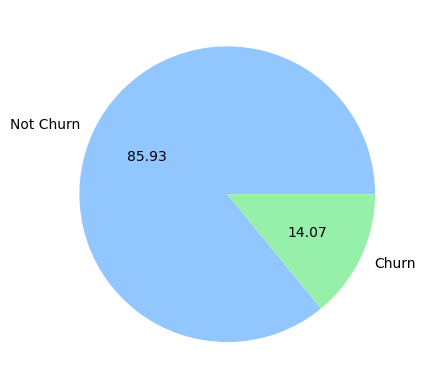

In [12]:
labels=['Not Churn', 'Churn']
plt.pie(df1["churn"].value_counts() ,labels=labels, autopct='%.02f' );

In [13]:
churn_df = df1[df1.churn == 1]
NotChurn_df = df1[df1.churn == 0]

In [14]:
churn_df.shape

(598, 19)

In [15]:
NotChurn_df.shape

(3652, 19)

In [16]:
NotChurn_sample = NotChurn_df.sample(n=598, random_state=42)

In [17]:
new_dataset = pd.concat([NotChurn_sample,churn_df], axis = 0 )

In [18]:
## Standardize all the numerical features 
scaler = StandardScaler()

numerial_features = new_dataset[['account_length', 'number_vmail_messages', 'total_day_minutes', 'total_day_calls', 
                                 'total_day_charge', 'total_eve_minutes','total_eve_calls','total_eve_charge',
                                 'total_night_minutes','total_night_calls','total_night_charge',
                                 'total_intl_minutes','total_intl_calls','total_intl_charge','number_customer_service_calls']]

standardized_features = scaler.fit_transform(numerial_features)
standardized_df = pd.DataFrame(standardized_features, columns=numerial_features.columns, index=numerial_features.index)
                                                                                                                        
new_dataset = pd.concat([new_dataset.drop(numerial_features.columns, axis=1), standardized_df], axis=1)

In [783]:
numerial_features.head()

,account_length,number_vmail_messages,total_day_minutes,total_day_calls,total_day_charge,total_eve_minutes,total_eve_calls,total_eve_charge,total_night_minutes,total_night_calls,total_night_charge,total_intl_minutes,total_intl_calls,total_intl_charge,number_customer_service_calls
1553,145,0,219.0000000000,98,37.2300000000,176.1000000000,109,14.9700000000,166.3000000000,132,7.4800000000,6.8000000000,3,1.8400000000,2
1985,118,0,189.3000000000,119,32.1800000000,233.5000000000,112,19.8500000000,270.9000000000,104,12.1900000000,10.0000000000,1,2.7000000000,2
282,131,0,197.0000000000,79,33.4900000000,201.0000000000,114,17.0900000000,151.2000000000,111,6.8000000000,11.6000000000,5,3.1300000000,1
3925,157,27,201.4000000000,85,34.2400000000,101.3000000000,60,8.6100000000,258.5000000000,113,11.6300000000,11.9000000000,5,3.2100000000,2
2646,67,0,138.9000000000,65,23.6100000000,208.9000000000,109,17.7600000000,232.4000000000,82,10.4600000000,9.2000000000,3,2.4800000000,2


In [787]:
from scipy.stats import shapiro
# Perform the Shapiro-Wilk test for all the numerical features
# Set the significance level
alpha = 0.05

# Loop through each column in the DataFrame
for feature in numerial_features.columns:
    # Perform the Shapiro-Wilk test
    stat, p_value = shapiro(numerial_features[feature])
    
    # Print the test statistic and p-value for each feature
    print(f"{feature} - Shapiro-Wilk Test Statistic: {stat}, p-value: {p_value}")
    
    # Interpret the result
    if p_value > alpha:
        print("Result: Data appears to be normally distributed (fail to reject H0)")
    else:
        print("Result: Data does not appear to be normally distributed (reject H0)")
    print()  # Blank line for readability between results

account_length - Shapiro-Wilk Test Statistic: 0.9962579607963562, p-value: 0.0054064467549324036
Result: Data does not appear to be normally distributed (reject H0)

number_vmail_messages - Shapiro-Wilk Test Statistic: 0.534835696220398, p-value: 0.0
Result: Data does not appear to be normally distributed (reject H0)

total_day_minutes - Shapiro-Wilk Test Statistic: 0.9948621392250061, p-value: 0.00041980246896855533
Result: Data does not appear to be normally distributed (reject H0)

total_day_calls - Shapiro-Wilk Test Statistic: 0.9969942569732666, p-value: 0.022634092718362808
Result: Data does not appear to be normally distributed (reject H0)

total_day_charge - Shapiro-Wilk Test Statistic: 0.9948655962944031, p-value: 0.00042236235458403826
Result: Data does not appear to be normally distributed (reject H0)

total_eve_minutes - Shapiro-Wilk Test Statistic: 0.9987689256668091, p-value: 0.5887870788574219
Result: Data appears to be normally distributed (fail to reject H0)

total_eve

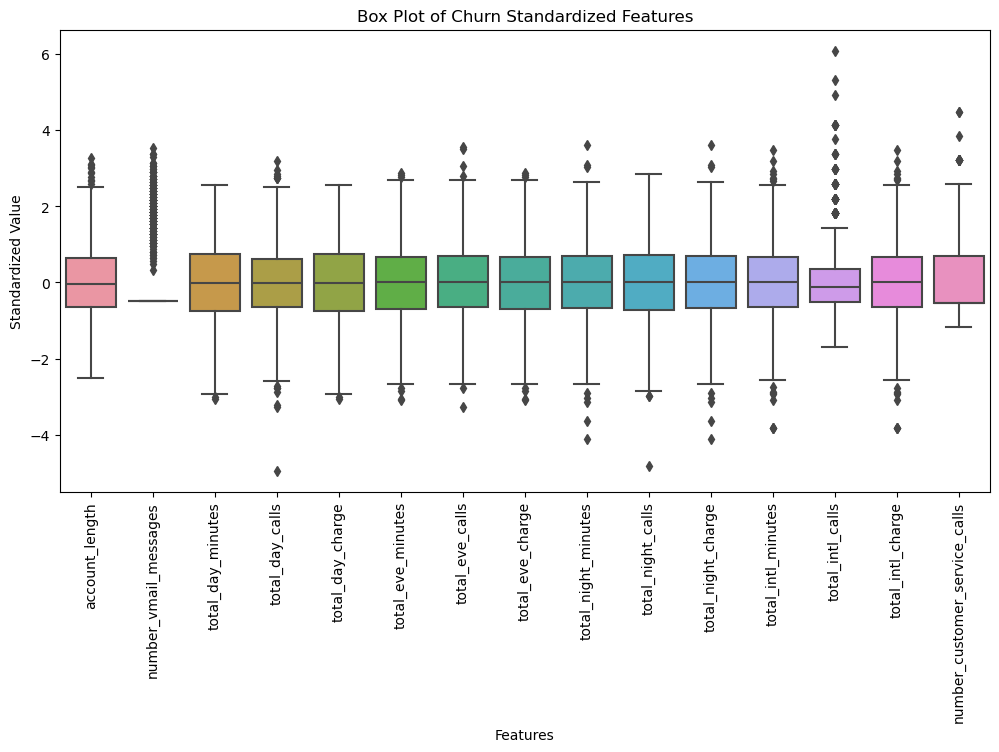

In [19]:
# Create a box plot for each column in standardized_df to detect outliers in the numerical features
plt.figure(figsize=(12, 6))
sns.boxplot(data=standardized_df)

# Set labels and title
plt.xticks(rotation=90)  # Rotate x-axis labels if needed for readability
plt.xlabel("Features")
plt.ylabel("Standardized Value")
plt.title("Box Plot of Churn Standardized Features")
plt.show()

In [20]:
### calculate the percentage of outliers in all the numerical features 
outlier_percentages = {}

# Loop through each column in the DataFrame
for col in standardized_df.columns:
    # Calculate Q1 (25th percentile) and Q3 (75th percentile) for the column
    Q1 = standardized_df[col].quantile(0.25)
    Q3 = standardized_df[col].quantile(0.75)
    
    # Calculate the IQR
    IQR = Q3 - Q1
    
    # Define the lower and upper bounds for outliers
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    
    # Count the number of outliers in the column
    outliers = standardized_df[(standardized_df[col] < lower_bound) | (standardized_df[col] > upper_bound)]
    
    # Calculate the percentage of outliers
    outlier_percentage = len(outliers) / len(standardized_df) * 100
    outlier_percentages[col] = outlier_percentage

# Display the outlier percentages for each column
for col, percentage in outlier_percentages.items():
    print(f"{col}: {percentage:.2f}% outliers")

account_length: 0.92% outliers
number_vmail_messages: 20.40% outliers
total_day_minutes: 0.17% outliers
total_day_calls: 1.17% outliers
total_day_charge: 0.17% outliers
total_eve_minutes: 0.59% outliers
total_eve_calls: 0.50% outliers
total_eve_charge: 0.59% outliers
total_night_minutes: 0.67% outliers
total_night_calls: 0.25% outliers
total_night_charge: 0.67% outliers
total_intl_minutes: 1.25% outliers
total_intl_calls: 6.94% outliers
total_intl_charge: 1.25% outliers
number_customer_service_calls: 1.00% outliers


In [21]:
## test the distribution of the numerical features are Gaussian or Non-Gaussian 
from scipy import stats 
res = stats.kurtosistest(standardized_df)
for col, stat in zip(standardized_df.columns, res.statistic):
    print(f"{col}: {np.round(stat, 4)}")

account_length: 0.451
number_vmail_messages: 6.3165
total_day_minutes: -4.3056
total_day_calls: 2.8563
total_day_charge: -4.3043
total_eve_minutes: -0.4046
total_eve_calls: 0.6294
total_eve_charge: -0.4058
total_night_minutes: 1.3713
total_night_calls: 1.6665
total_night_charge: 1.3729
total_intl_minutes: 2.5263
total_intl_calls: 10.3033
total_intl_charge: 2.528
number_customer_service_calls: 4.2837


# Diabetes Data Preprocessing 

In [22]:
df_diabetes = pd.read_csv('E:\ML\Assignment 1\diabetes_binary_health_indicators_BRFSS2015.csv')

In [23]:
unique_values = {}
for col in df_diabetes.columns:
    unique_values[col] = df_diabetes[col].value_counts().shape[0]
    
df_diabetes.drop_duplicates(inplace=True)

array([[<Axes: title={'center': 'Diabetes_binary'}>,
        <Axes: title={'center': 'HighBP'}>,
        <Axes: title={'center': 'HighChol'}>,
        <Axes: title={'center': 'CholCheck'}>,
        <Axes: title={'center': 'BMI'}>],
       [<Axes: title={'center': 'Smoker'}>,
        <Axes: title={'center': 'Stroke'}>,
        <Axes: title={'center': 'HeartDiseaseorAttack'}>,
        <Axes: title={'center': 'PhysActivity'}>,
        <Axes: title={'center': 'Fruits'}>],
       [<Axes: title={'center': 'Veggies'}>,
        <Axes: title={'center': 'HvyAlcoholConsump'}>,
        <Axes: title={'center': 'AnyHealthcare'}>,
        <Axes: title={'center': 'NoDocbcCost'}>,
        <Axes: title={'center': 'GenHlth'}>],
       [<Axes: title={'center': 'MentHlth'}>,
        <Axes: title={'center': 'PhysHlth'}>,
        <Axes: title={'center': 'DiffWalk'}>,
        <Axes: title={'center': 'Sex'}>, <Axes: title={'center': 'Age'}>],
       [<Axes: title={'center': 'Education'}>,
        <Axes: title=

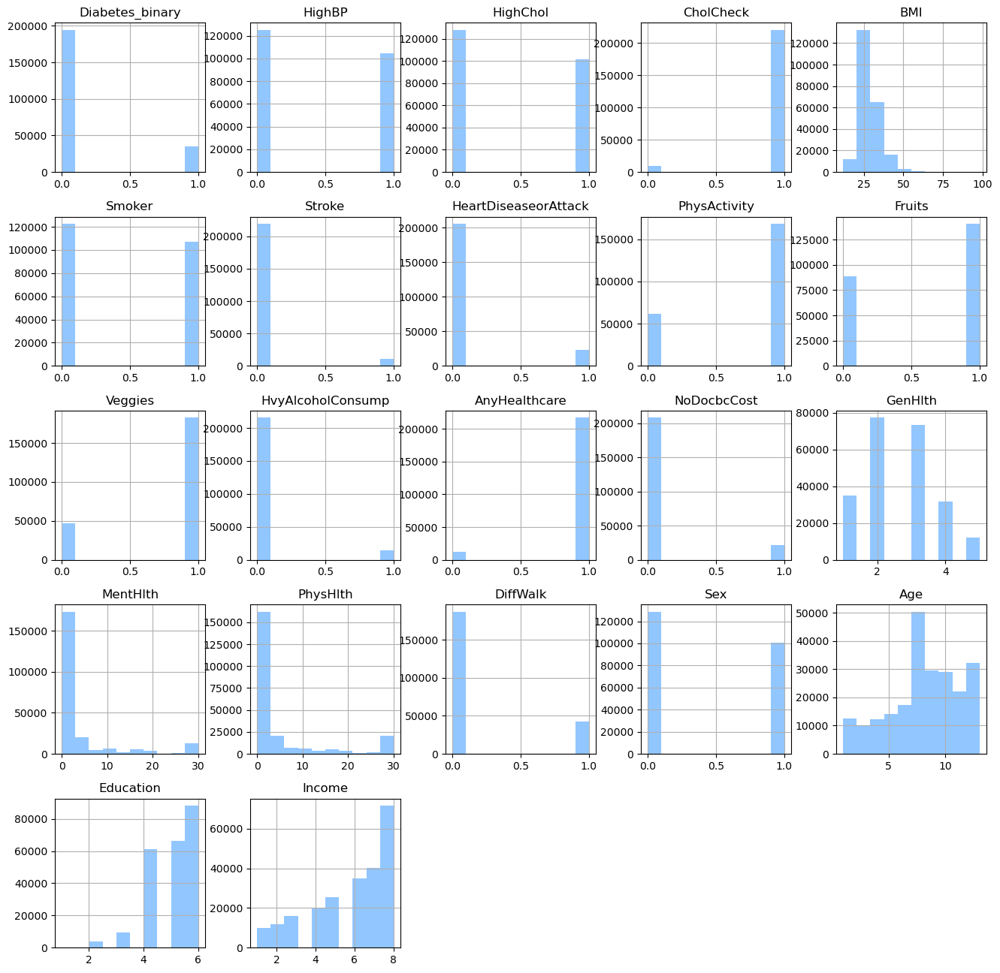

In [24]:
# Plot feature distributions in diabetes data
plt.style.use("seaborn-v0_8-pastel")
plt.rcParams['font.size'] = 10
df_diabetes.hist(figsize=(16, 16))

In [25]:
df_diabetes['Age'].value_counts()

Age
9.0     29678
10.0    29093
8.0     27272
7.0     23121
11.0    21993
6.0     17280
13.0    16791
12.0    15379
5.0     14040
4.0     12229
3.0     10023
2.0      7064
1.0      5511
Name: count, dtype: int64

In [26]:
df_diabetes['Income'].value_counts()

Income
8.0    71640
7.0    40131
6.0    34957
5.0    25326
4.0    19953
3.0    15920
2.0    11756
1.0     9791
Name: count, dtype: int64

<Axes: title={'center': 'Correlation with Diabetes Column'}>

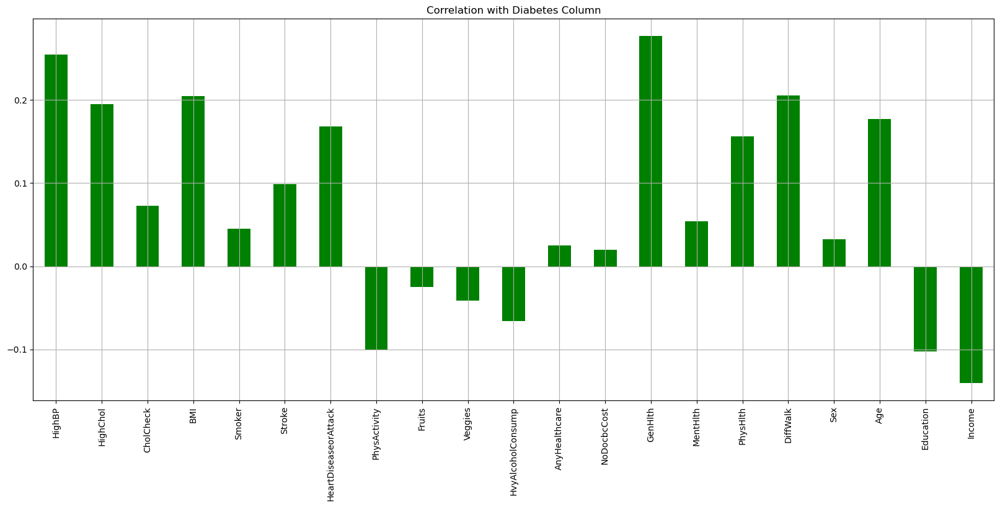

In [27]:
df_diabetes.drop('Diabetes_binary', axis=1).corrwith(df_diabetes.Diabetes_binary).plot(kind='bar', grid=True, figsize=(20, 8), title="Correlation with Diabetes Column", color='green')

Text(0.5, 1.0, 'Diabetes Data Label Distribution')

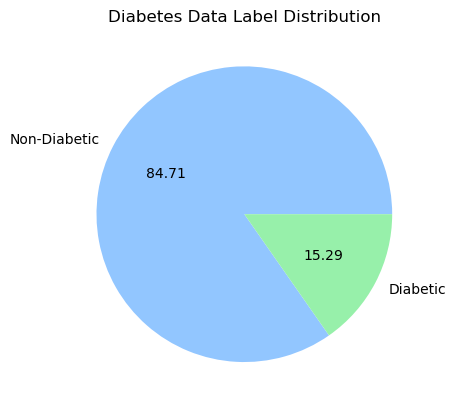

In [28]:
labels=['Non-Diabetic', 'Diabetic']
plt.pie(df_diabetes["Diabetes_binary"].value_counts() ,labels=labels, autopct='%.02f' );
plt.title('Diabetes Data Label Distribution')

In [761]:
correlation_matrix_diab = df_diabetes.corr()
print(correlation_matrix_diab)

                      Diabetes_binary        HighBP      HighChol  \
Diabetes_binary          1.0000000000  0.2543180248  0.1949441091   
HighBP                   0.2543180248  1.0000000000  0.2839625581   
HighChol                 0.1949441091  0.2839625581  1.0000000000   
CholCheck                0.0725233809  0.1112585865  0.0947721128   
BMI                      0.2050859637  0.1942184311  0.0897342080   
Smoker                   0.0455039891  0.0742641427  0.0745825933   
Stroke                   0.0991932967  0.1245584255  0.0893751332   
HeartDiseaseorAttack     0.1682131733  0.2014434362  0.1764461615   
PhysActivity            -0.1004043316 -0.1043823410 -0.0634427384   
Fruits                  -0.0248053361 -0.0194666886 -0.0262571365   
Veggies                 -0.0417337642 -0.0429938161 -0.0273994014   
HvyAlcoholConsump       -0.0659500184 -0.0141783558 -0.0190565448   
AnyHealthcare            0.0253313363  0.0520438412  0.0523626005   
NoDocbcCost              0.0200482

In [779]:
# Count values where absolute correlation is > 0.5 and < 1
count_diab = np.sum((correlation_matrix_diab.abs() > 0.5) & (correlation_matrix_diab.abs() < 1))
count_diab 

Diabetes_binary         0
HighBP                  0
HighChol                0
CholCheck               0
BMI                     0
Smoker                  0
Stroke                  0
HeartDiseaseorAttack    0
PhysActivity            0
Fruits                  0
Veggies                 0
HvyAlcoholConsump       0
AnyHealthcare           0
NoDocbcCost             0
GenHlth                 1
MentHlth                0
PhysHlth                1
DiffWalk                0
Sex                     0
Age                     0
Education               0
Income                  0
dtype: int64

In [767]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

# Calculate VIF for each feature
vif_data_diab = pd.DataFrame()
vif_data_diab["feature"] = df_diabetes.columns
vif_data_diab["VIF"] = [variance_inflation_factor(df_diabetes.values, i) for i in range(len(df_diabetes.columns))]
print(vif_data_diab)

                 feature           VIF
0        Diabetes_binary  1.3835539706
1                 HighBP  2.3831610258
2               HighChol  2.0835293421
3              CholCheck 21.4625492964
4                    BMI 17.5383312885
5                 Smoker  1.9864865926
6                 Stroke  1.1285121895
7   HeartDiseaseorAttack  1.3011583277
8           PhysActivity  4.1381194158
9                 Fruits  2.8257679111
10               Veggies  5.2807355262
11     HvyAlcoholConsump  1.0933148120
12         AnyHealthcare 18.9354985480
13           NoDocbcCost  1.2192560260
14               GenHlth 11.0691984792
15              MentHlth  1.4698066678
16              PhysHlth  2.0113381224
17              DiffWalk  1.8536755713
18                   Sex  1.9047645810
19                   Age  9.7698076891
20             Education 27.1043862640
21                Income 12.6014852212


In [768]:
condition_number_diab = np.linalg.cond(df_diabetes.values)
print("Condition Number:", condition_number_diab)

Condition Number: 165.95895688494355


In [769]:
eigenvalues, _ = np.linalg.eig(df_diabetes.corr())
print("Eigenvalues of the correlation matrix:", eigenvalues)

Eigenvalues of the correlation matrix: [3.4283 1.8118 1.3631 1.2222 1.1873 1.1364 0.4333 1.0348 0.5032 0.5283
 0.5681 0.9604 0.9338 0.8885 0.8349 0.6776 0.8048 0.7108 0.7593 0.7471
 0.7431 0.7229]


In [29]:
Diabetes_df = df_diabetes[df_diabetes.Diabetes_binary == 1]
NotDiabetes_df = df_diabetes[df_diabetes.Diabetes_binary == 0]

In [30]:
NotDiabetes_sample = NotDiabetes_df.sample(n=35097, random_state=42)

In [31]:
new_diabetes = pd.concat([NotDiabetes_sample,Diabetes_df], axis = 0 )

Text(0.5, 1.0, 'Diabetes Data Label Distribution')

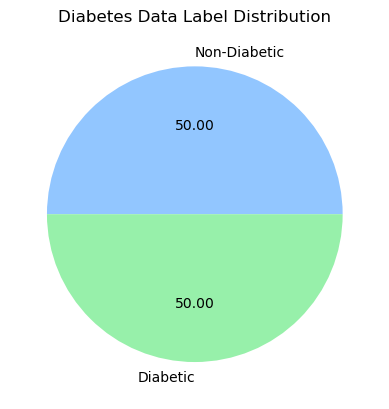

In [32]:
labels=['Non-Diabetic', 'Diabetic']
plt.pie(new_diabetes["Diabetes_binary"].value_counts() ,labels=labels, autopct='%.02f' );
plt.title('Diabetes Data Label Distribution')

In [33]:
unique_values = {}
for col in df_diabetes.columns:
    unique_values[col] = df_diabetes[col].value_counts().shape[0]

pd.DataFrame(unique_values, index=['unique value count']).transpose()

,unique value count
Diabetes_binary,2
HighBP,2
HighChol,2
CholCheck,2
BMI,84
Smoker,2
Stroke,2
HeartDiseaseorAttack,2
PhysActivity,2
Fruits,2


In [34]:
numerical_features_diab = new_diabetes[['BMI','MentHlth', 'PhysHlth']] 

standardized_features_diab = scaler.fit_transform(numerical_features_diab)
standardized_df_diab = pd.DataFrame(standardized_features_diab, columns=numerical_features_diab.columns, 
                                    index=numerical_features_diab.index)
                                                                                                                        
new_diabetes = pd.concat([new_diabetes.drop(numerical_features_diab.columns, axis=1), standardized_df_diab], axis=1)

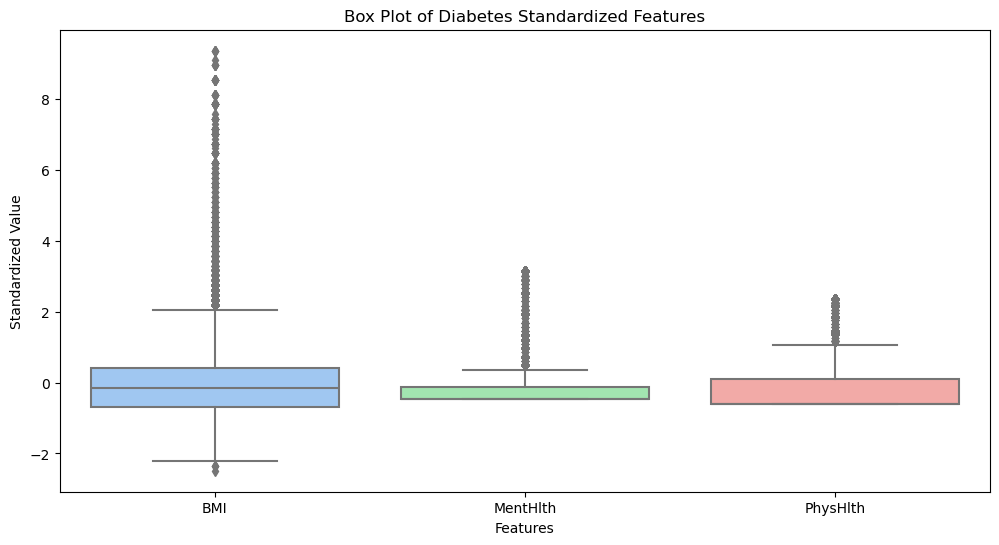

In [35]:
# Create a box plot for each column in standardized_df to detect outliers in the numerical features
plt.figure(figsize=(12, 6))
sns.boxplot(data=standardized_df_diab)

# Set labels and title
plt.xticks(rotation=0)  # Rotate x-axis labels if needed for readability
plt.xlabel("Features")
plt.ylabel("Standardized Value")
plt.title("Box Plot of Diabetes Standardized Features")
plt.show()

In [36]:
### calculate the percentage of outliers in all the numerical features 
outlier_percentages = {}

# Loop through each column in the DataFrame
for col in standardized_df_diab.columns:
    # Calculate Q1 (25th percentile) and Q3 (75th percentile) for the column
    Q1 = standardized_df_diab[col].quantile(0.25)
    Q3 = standardized_df_diab[col].quantile(0.75)
    
    # Calculate the IQR
    IQR = Q3 - Q1
    
    # Define the lower and upper bounds for outliers
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    
    # Count the number of outliers in the column
    outliers = standardized_df_diab[(standardized_df_diab[col] < lower_bound) | (standardized_df_diab[col] > upper_bound)]
    
    # Calculate the percentage of outliers
    outlier_percentage = len(outliers) / len(standardized_df_diab) * 100
    outlier_percentages[col] = outlier_percentage

# Display the outlier percentages for each column
for col, percentage in outlier_percentages.items():
    print(f"{col}: {percentage:.2f}% outliers")

BMI: 3.25% outliers
MentHlth: 15.88% outliers
PhysHlth: 15.52% outliers


In [37]:
## test the distribution of the numerical features are Gaussian or Non-Gaussian 
res_diab = stats.kurtosistest(standardized_df_diab)
for col, stat in zip(standardized_df_diab.columns, res_diab.statistic):
    print(f"{col}: {np.round(stat, 4)}")

BMI: 102.0939
MentHlth: 80.9085
PhysHlth: 35.9772


In [38]:
# split the diabetes data into training and testing sets
from sklearn.model_selection import learning_curve, train_test_split

X_diab = new_diabetes.drop('Diabetes_binary',axis=1)
y_diab = new_diabetes['Diabetes_binary']               # Target variable

X_train_diab, X_test_diab, y_train_diab, y_test_diab = train_test_split(X_diab, y_diab, test_size=0.3, random_state=42, stratify=y_diab)

In [758]:
X_train_diab.shape

(49135, 22)

In [759]:
rank_diab = np.linalg.matrix_rank(X_train_diab)
print("Rank of the diabetes dataset:", rank_diab)

Rank of the diabetes dataset: 22


# Split the churn data into training set and testing set

In [40]:
X = new_dataset.drop('churn',axis=1)   
y = new_dataset['churn'] 
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=188, stratify=y)




# Part 1 - Clustering with KMeans and EM

# KMeans

In [41]:
from sklearn.pipeline import make_pipeline
from sklearn import metrics
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.metrics import homogeneity_score, completeness_score, v_measure_score, adjusted_rand_score 
from sklearn.metrics import  adjusted_mutual_info_score, silhouette_score, calinski_harabasz_score, davies_bouldin_score

Churn Data: K-MEANS

In [42]:
def bench_k_means(kmeans, name, data, labels):
    """Benchmark to evaluate the KMeans initialization methods.

    Parameters
    ----------
    kmeans : KMeans instance
        A :class:`~sklearn.cluster.KMeans` instance with the initialization
        already set.
    name : str
        Name given to the strategy. It will be used to show the results in a
        table.
    data : ndarray of shape (n_samples, n_features)
        The data to cluster.
    labels : ndarray of shape (n_samples,)
        The labels used to compute the clustering metrics which requires some
        supervision.
    """
    t0 = time.time()
    estimator = make_pipeline(StandardScaler(), kmeans).fit(data)
    fit_time = time.time() - t0
    results = [name, round(fit_time,4), estimator[-1].inertia_]

    # Define the metrics which require only the true labels and estimator labels
    clustering_metrics = [
        metrics.homogeneity_score,
        metrics.completeness_score,
        metrics.v_measure_score,
        metrics.adjusted_rand_score,
        metrics.adjusted_mutual_info_score,
    ]
    results += [round(m(labels, estimator[-1].labels_),4) for m in clustering_metrics]

    # The silhouette score requires the full dataset
    silhouette = metrics.silhouette_score(data, estimator[-1].labels_, metric="euclidean", sample_size=800)
    results += [round(silhouette, 4)]  # Round the silhouette score 
    
    # Davies-Bouldin Index (lower is better)
    davies_bouldin = metrics.davies_bouldin_score(data, estimator[-1].labels_)
    results += [round(davies_bouldin, 4)]

    # Calinski-Harabasz Index (higher is better)
    calinski_harabasz = metrics.calinski_harabasz_score(data, estimator[-1].labels_)
    results += [round(calinski_harabasz, 4)]

    return results

In [43]:
kmeans = KMeans(init='random', n_clusters=5, n_init=4, random_state= 33)
results = bench_k_means(kmeans, 'random', X_train, y_train)

In [44]:
def evaluate_k_means_over_components(data, labels, clusters, seeds, init_name):
    results_list = []

    # Iterate over each number of clusters
    for n in clusters:
        # Temporary storage for metrics across seeds
        metrics_across_seeds = {
            "Fit Time (s)": [],
            "Inertia": [],
            "Homogeneity": [],
            "Completeness": [],
            "V-Measure": [],
            "ARI": [],
            "AMI": [],
            "Silhouette": [],
            "Davies-Bouldin": [],
            "Calinski-Harabasz": []
        }
        
        # Run KMeans with different seeds
        for seed in seeds:
            kmeans = KMeans(init=init_name, n_clusters=n, n_init=4, random_state=seed)
            results = bench_k_means(kmeans=kmeans, name=init_name, data=data, labels=labels)
            
            # Store each metric result
            metrics_across_seeds["Fit Time (s)"].append(results[1])
            metrics_across_seeds["Inertia"].append(results[2])
            metrics_across_seeds["Homogeneity"].append(results[3])
            metrics_across_seeds["Completeness"].append(results[4])
            metrics_across_seeds["V-Measure"].append(results[5])
            metrics_across_seeds["ARI"].append(results[6])
            metrics_across_seeds["AMI"].append(results[7])
            metrics_across_seeds["Silhouette"].append(results[8])
            metrics_across_seeds["Davies-Bouldin"].append(results[9])
            metrics_across_seeds["Calinski-Harabasz"].append(results[10])

        # Calculate minimum and variance for each metric
        mean_results = [n, init_name]  # Start with number of clusters and initialization name
        for metric in metrics_across_seeds.keys():
            mean_value = np.mean(metrics_across_seeds[metric])
            variance_value = np.var(metrics_across_seeds[metric])
            mean_results.extend([mean_value, variance_value])

        results_list.append(mean_results)

    # Create a DataFrame with min and variance columns for each metric
    columns = [
        "Clusters", "Initialization", 
        "Fit Time (Avg)", "Fit Time (Var)", 
        "Inertia (Avg)", "Inertia (Var)", 
        "Homogeneity (Avg)", "Homogeneity (Var)", 
        "Completeness (Avg)", "Completeness (Var)", 
        "V-Measure (Avg)", "V-Measure (Var)", 
        "ARI (Avg)", "ARI (Var)", 
        "AMI (Avg)", "AMI (Var)", 
        "Silhouette (Avg)", "Silhouette (Var)",
        "Davies-Bouldin (Avg)", "Davies-Bouldin (Var)",
        "Calinski-Harabasz (Avg)", "Calinski-Harabasz (Var)"
    ]
    results_df = pd.DataFrame(results_list, columns=columns)

    return results_df

In [45]:
seeds = np.arange(50,60)
clusters = np.arange(2,21)
results_kmeans = evaluate_k_means_over_components(data=X_train, labels=y_train, clusters=clusters,
                                                  seeds=seeds, init_name="k-means++" )

In [46]:
results_kmeans_random = evaluate_k_means_over_components(data=X_train, labels=y_train, clusters=clusters,
                                                  seeds=seeds, init_name="random" )

In [47]:
# Plotting the results
def plot_DBI(clusters,results_df):
    plt.figure(figsize=(10, 6))
    
    # plot Davies-Bouldin index and its variance 
    plt.plot(clusters, results_df['Davies-Bouldin (Avg)'], marker='o', label='Davies-Bouldin')
    plt.fill_between(
    clusters,  
    results_df['Davies-Bouldin (Avg)'] - np.sqrt(results_df['Davies-Bouldin (Var)']),  
    results_df['Davies-Bouldin (Avg)'] + np.sqrt(results_df['Davies-Bouldin (Var)']),  
    color="blue",  
    alpha=0.2,  
    label="Variance (1 SD)"  
     )
    
    
    """ 
    plt.text(
    0.5, 0.5,                     # X and Y position in figure coordinates (0 to 1)
    'ycheng456',                   # Watermark text
    fontsize=40,                  # Font size of the watermark
    color='gray',                 # Color of the watermark text
    alpha=0.5,                    # Transparency of the watermark
    ha='center',                  # Horizontal alignment
    va='center',                  # Vertical alignment
    rotation=30,                  # Rotation angle of the watermark
    transform=plt.gcf().transFigure # Use the figure's coordinate system
    )
    """
    
    plt.xticks(rotation=45)
    plt.xlabel('Number of Clusters')
    plt.ylabel('Davies-Bouldin Index')
    plt.title('K-Means: Davies-Bouldin Index vs Number of Clusters')
    plt.legend()
    plt.grid(False)
    
    plt.show()

In [48]:
def plot_CHI(clusters,results_df):
    plt.figure(figsize=(10, 6))
    
    # plot Calinski-Harabasz index and its variance 
    plt.plot(clusters, results_df['Calinski-Harabasz (Avg)'], marker='o', label='Calinski-Harabasz')
    plt.fill_between(
    clusters,  
    results_df['Calinski-Harabasz (Avg)'] - np.sqrt(results_df['Calinski-Harabasz (Var)']),  
    results_df['Calinski-Harabasz (Avg)'] + np.sqrt(results_df['Calinski-Harabasz (Var)']),  
    color="cyan",  
    alpha=0.2,  
    label="Variance (1 SD)"  
     )
    
    plt.xticks(rotation=45)
    plt.xlabel('Number of Clusters')
    plt.ylabel('Calinski-Harabasz Index')
    plt.title('K-Means: Calinski-Harabasz Index vs Number of Clusters')
    plt.legend()
    plt.grid(False)
    
    plt.show()

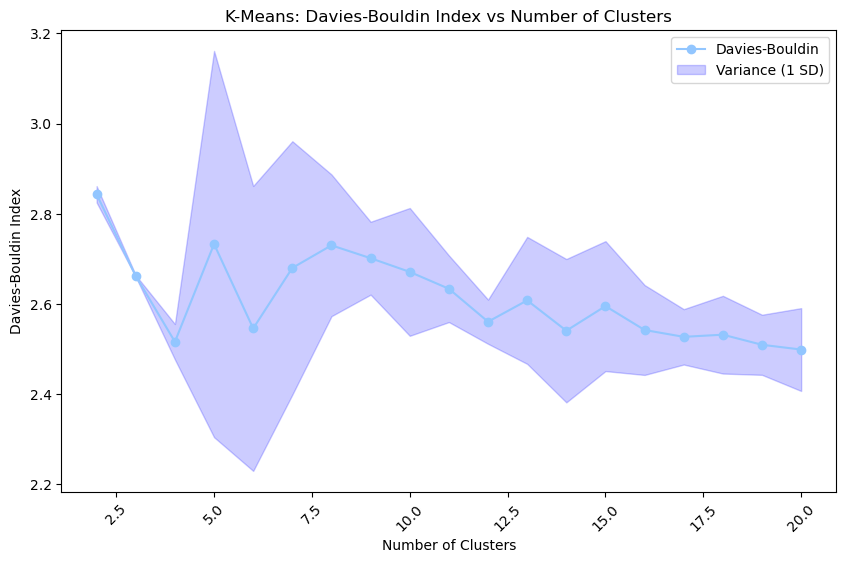

In [49]:
plot_DBI(clusters,results_kmeans)

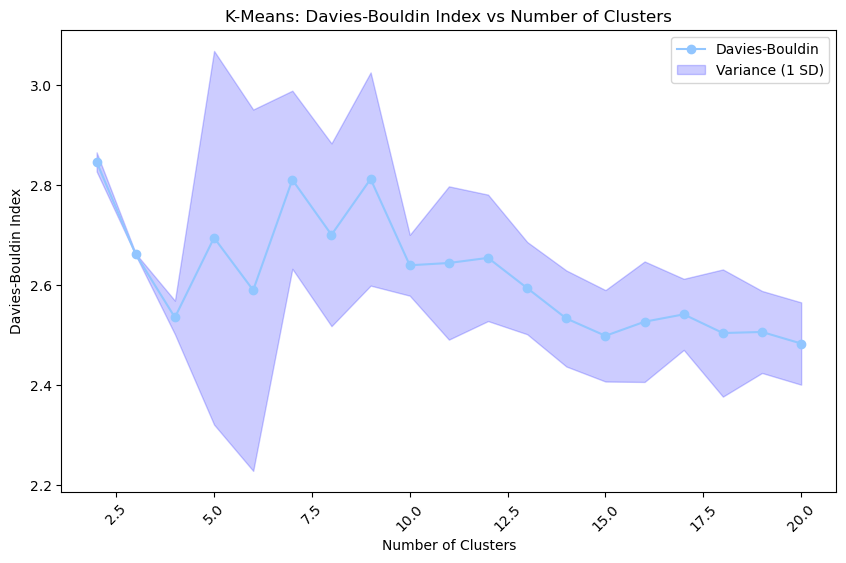

In [50]:
plot_DBI(clusters,results_kmeans_random)

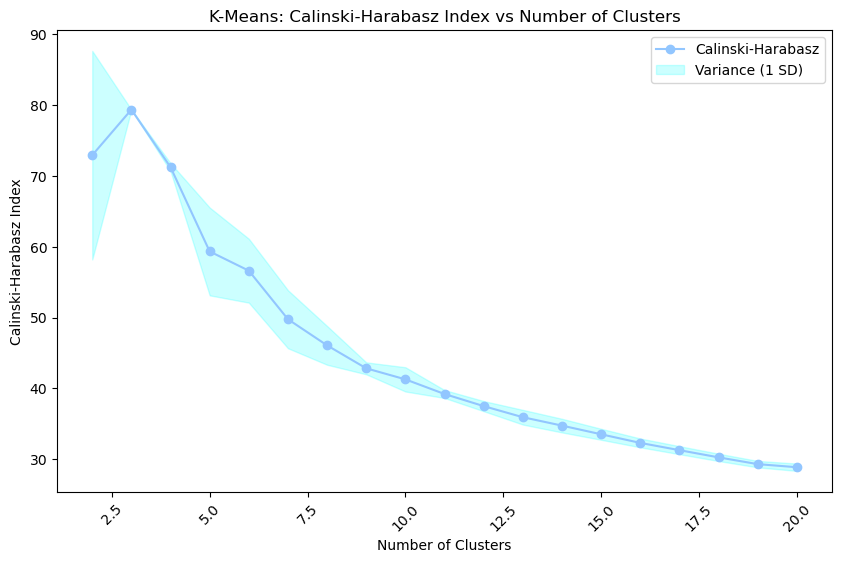

In [51]:
plot_CHI(clusters,results_kmeans)

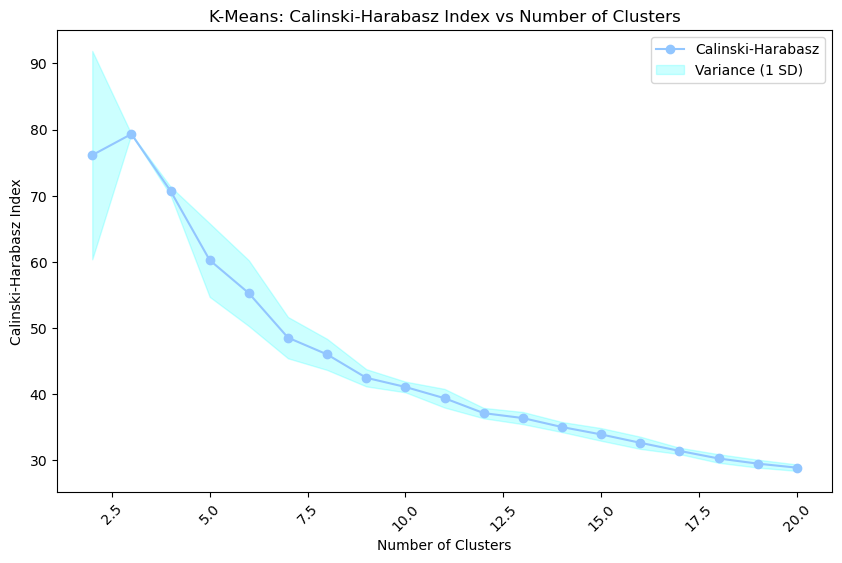

In [52]:
plot_CHI(clusters,results_kmeans_random)

In [53]:
results_kmeans[results_kmeans['Clusters'].isin([3, 4])]

,Clusters,Initialization,Fit Time (Avg),Fit Time (Var),Inertia (Avg),Inertia (Var),Homogeneity (Avg),Homogeneity (Var),Completeness (Avg),Completeness (Var),...,ARI (Avg),ARI (Var),AMI (Avg),AMI (Var),Silhouette (Avg),Silhouette (Var),Davies-Bouldin (Avg),Davies-Bouldin (Var),Calinski-Harabasz (Avg),Calinski-Harabasz (Var)
1,3,k-means++,0.02787,0.000059,12222.661558,0.030125,0.04804,7.224000e-07,0.03154,3.384000e-07,...,0.04370,6.480000e-07,0.03678,5.136000e-07,0.10320,0.000002,2.66186,0.000003,79.31482,0.00001
2,4,k-means++,0.02678,0.000045,11640.221888,126.802569,0.07984,1.199610e-03,0.04028,3.044116e-04,...,0.05687,7.501281e-04,0.05191,5.405189e-04,0.08494,0.000003,2.51629,0.001548,71.19727,0.31950


In [54]:
results_kmeans_random[results_kmeans_random['Clusters'].isin([3, 4])]

,Clusters,Initialization,Fit Time (Avg),Fit Time (Var),Inertia (Avg),Inertia (Var),Homogeneity (Avg),Homogeneity (Var),Completeness (Avg),Completeness (Var),...,ARI (Avg),ARI (Var),AMI (Avg),AMI (Var),Silhouette (Avg),Silhouette (Var),Davies-Bouldin (Avg),Davies-Bouldin (Var),Calinski-Harabasz (Avg),Calinski-Harabasz (Var)
1,3,random,0.03257,0.000026,12222.613314,0.028948,0.04776,7.284000e-07,0.03135,3.405000e-07,...,0.04343,6.561000e-07,0.03655,5.145000e-07,0.10366,5.384000e-07,2.66140,0.000003,79.31353,0.000008
2,4,random,0.03170,0.000009,11646.201615,117.955179,0.06327,1.136790e-03,0.03192,2.892316e-04,...,0.04362,7.075556e-04,0.04076,5.124724e-04,0.08356,2.370400e-06,2.53507,0.001136,70.71472,0.416675


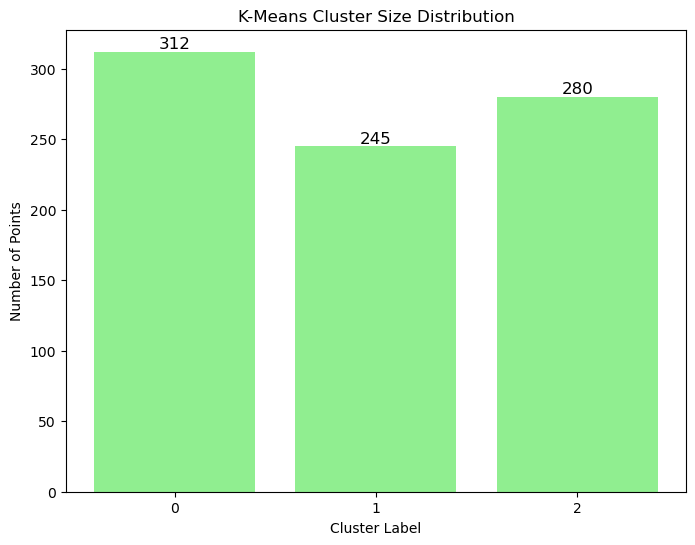

In [55]:
# Fit the best KMeans model 
kmeans_best = KMeans(init='k-means++', n_clusters=3, n_init=4, random_state=42)
kmeans_best.fit(X_train)

# Get cluster labels
cluster_labels = kmeans_best.labels_

# Create a DataFrame to count the number of points in each cluster
cluster_counts = pd.Series(cluster_labels).value_counts().sort_index()

# Plot Cluster Size Distribution for GMM
plt.figure(figsize=(8, 6))
bars = plt.bar(cluster_counts.index, cluster_counts.values, color='lightgreen')

# Add annotations (number of data points) on top of each bar
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, int(yval), 
             ha='center', va='bottom', fontsize=12)

# Customize the plot
plt.title('K-Means Cluster Size Distribution')
plt.xlabel('Cluster Label')
plt.ylabel('Number of Points')
plt.xticks(cluster_counts.index)
plt.grid(False)
plt.show()

In [56]:
wcss_km = kmeans_best.inertia_
wcss_km

10898.369275599305

In [57]:
from scipy.spatial.distance import cdist
from sklearn.metrics import pairwise_distances_argmin_min
_, distances_to_centroids = pairwise_distances_argmin_min(X_train, kmeans_best.cluster_centers_)
compactness_km = [np.mean(distances_to_centroids[kmeans_best.labels_ == i]) for i in range(kmeans_best.n_clusters)]
np.round(compactness_km,2)

array([3.44, 3.59, 3.55])

In [58]:
inter_cluster_distances_km = cdist(kmeans_best.cluster_centers_, kmeans_best.cluster_centers_)
inter_cluster_distances_km

array([[0.        , 2.77574392, 2.8745769 ],
       [2.77574392, 0.        , 2.63900503],
       [2.8745769 , 2.63900503, 0.        ]])

In [59]:
X_train.shape

(837, 18)

In [60]:
X_kmeans = kmeans_best.fit_transform(X_train)

In [61]:
X_kmeans.shape

(837, 3)

In [62]:
# set k =2 for churn kmeans
kmeans2 = KMeans(init='k-means++', n_clusters=2, n_init=4, random_state=42)
kmeans2.fit(X_train)

# Fit KMeans and get predictions
pred = kmeans2.fit_predict(X_train)

# Create a DataFrame with actual labels and predicted clusters
df = pd.DataFrame({'TrueLabel': y_train, 'Cluster': pred})

# Dynamically find unique clusters
unique_clusters = df['Cluster'].unique()

# Map each cluster to the most common true label
cluster_label_map = {}
for cluster in unique_clusters:
    # Get the most common label for the current cluster
    common_label = df[df['Cluster'] == cluster]['TrueLabel'].mode()[0]
    cluster_label_map[cluster] = common_label

# Map the predicted clusters to the corresponding labels using the mapping
mapped_labels = [cluster_label_map[cluster] for cluster in pred]

# Calculate accuracy
accuracy = accuracy_score(y_train, mapped_labels)
print(f"Accuracy: {accuracy * 100:.2f}%")

Accuracy: 58.18%


Diabetes Data

In [63]:
results_kmeans_diab = evaluate_k_means_over_components(data=X_train_diab, labels=y_train_diab, 
                                                       clusters=clusters,seeds=seeds, init_name="k-means++" )
results_kmeans_random_diab = evaluate_k_means_over_components(data=X_train_diab, labels=y_train_diab, 
                                                       clusters=clusters,seeds=seeds, init_name="random" )

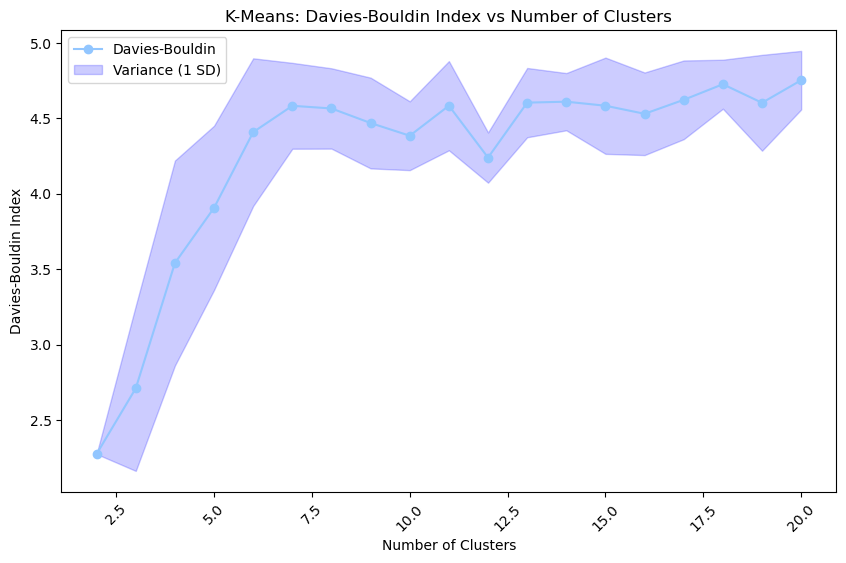

In [64]:
plot_DBI(clusters, results_kmeans_diab) 

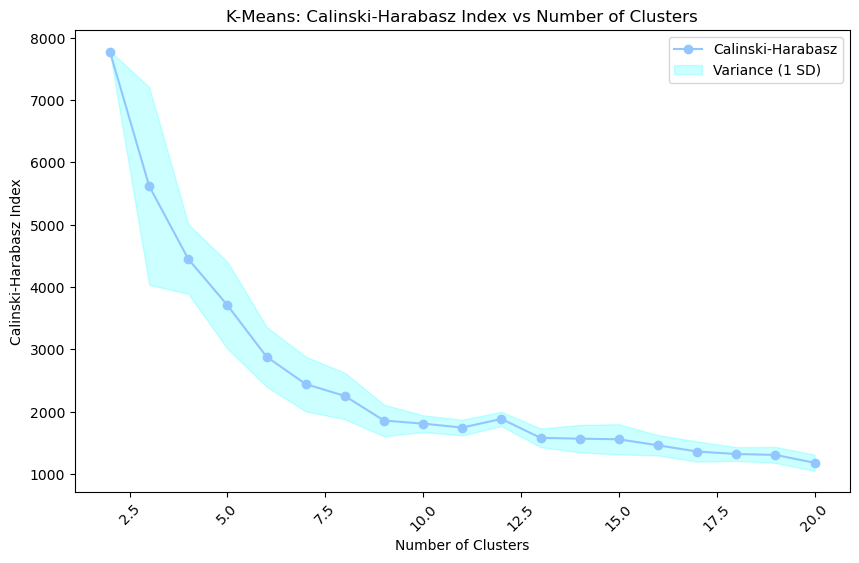

In [65]:
plot_CHI(clusters, results_kmeans_diab)

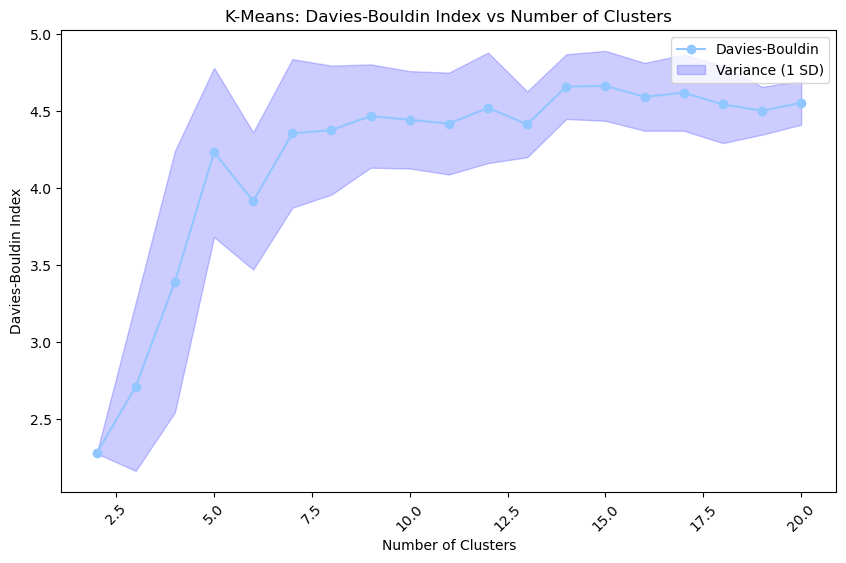

In [66]:
plot_DBI(clusters, results_kmeans_random_diab) 

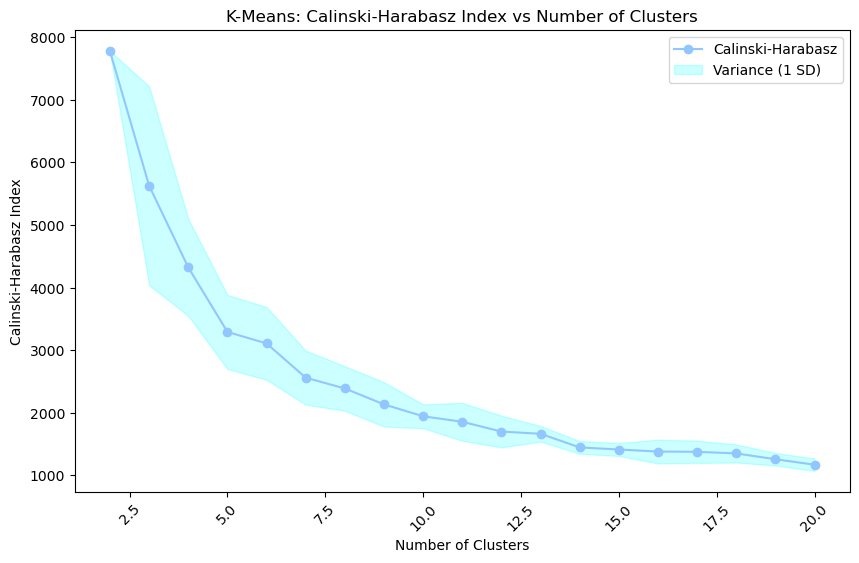

In [67]:
plot_CHI(clusters, results_kmeans_random_diab)

In [68]:
## 12 clusters for diabetes data 
results_kmeans_random_diab[results_kmeans_random_diab['Clusters'] == 3]

,Clusters,Initialization,Fit Time (Avg),Fit Time (Var),Inertia (Avg),Inertia (Var),Homogeneity (Avg),Homogeneity (Var),Completeness (Avg),Completeness (Var),...,ARI (Avg),ARI (Var),AMI (Avg),AMI (Var),Silhouette (Avg),Silhouette (Var),Davies-Bouldin (Avg),Davies-Bouldin (Var),Calinski-Harabasz (Avg),Calinski-Harabasz (Var)
1,3,random,0.09258,0.000406,865093.612208,38341.718762,0.11534,0.001113,0.08545,0.00013,...,0.1065,0.000508,0.09743,0.000378,0.08691,0.000084,2.70866,0.299283,5627.64595,2.524175e+06


In [69]:
results_kmeans_diab[results_kmeans_diab['Clusters'] == 3]

,Clusters,Initialization,Fit Time (Avg),Fit Time (Var),Inertia (Avg),Inertia (Var),Homogeneity (Avg),Homogeneity (Var),Completeness (Avg),Completeness (Var),...,ARI (Avg),ARI (Var),AMI (Avg),AMI (Var),Silhouette (Avg),Silhouette (Var),Davies-Bouldin (Avg),Davies-Bouldin (Var),Calinski-Harabasz (Avg),Calinski-Harabasz (Var)
1,3,k-means++,0.11944,0.000286,865093.451243,38289.101739,0.11529,0.001118,0.0854,0.000132,...,0.10641,0.000513,0.09739,0.000382,0.08378,0.000297,2.71024,0.299265,5621.59811,2.518482e+06


In [70]:
# set k =2 for diabetes kmeans
kmeans3_diab = KMeans(init='k-means++', n_clusters=3, n_init=4, random_state=42)
kmeans3_diab.fit(X_train_diab)

# Fit KMeans and get predictions
# pred_diab = kmeans3_diab.fit_predict(X_train_diab)

KMeans(n_clusters=3, n_init=4, random_state=42)

In [71]:
wcss_diab = kmeans3_diab.inertia_
np.round(wcss_diab,2)

583134.6

In [72]:
# Get distances to nearest centroid
_, distances_to_centroids = pairwise_distances_argmin_min(X_train_diab, kmeans3_diab.cluster_centers_)

In [73]:
compactness_diab = [np.mean(distances_to_centroids[kmeans3_diab.labels_ == i]) for i in range(kmeans3_diab.n_clusters)]
np.round(compactness_diab,2)

array([3.43, 2.96, 3.72])

In [74]:
inter_cluster_distances_km_diab = cdist(kmeans3_diab.cluster_centers_, kmeans3_diab.cluster_centers_)
inter_cluster_distances_km_diab

array([[0.        , 5.28183211, 6.2705063 ],
       [5.28183211, 0.        , 4.20715999],
       [6.2705063 , 4.20715999, 0.        ]])

In [75]:
## see how it match with the ground truth label 
# set k =2 for diabetes kmeans
kmeans2_diab = KMeans(init='k-means++', n_clusters=2, n_init=4, random_state=42)
kmeans2_diab.fit(X_train_diab)

# Fit KMeans and get predictions
pred_diab = kmeans2_diab.fit_predict(X_train_diab)

# Create a DataFrame with actual labels and predicted clusters
df_diab = pd.DataFrame({'TrueLabel': y_train_diab, 'Cluster': pred_diab})

# Dynamically find unique clusters
unique_clusters = df_diab['Cluster'].unique()

# Map each cluster to the most common true label
cluster_label_map = {}
for cluster in unique_clusters:
    # Get the most common label for the current cluster
    common_label = df_diab[df_diab['Cluster'] == cluster]['TrueLabel'].mode()[0]
    cluster_label_map[cluster] = common_label

# Map the predicted clusters to the corresponding labels using the mapping
mapped_labels = [cluster_label_map[cluster] for cluster in pred_diab]

# Calculate accuracy
accuracy = accuracy_score(y_train_diab, mapped_labels)
print(f"Accuracy: {accuracy * 100:.2f}%")

Accuracy: 63.30%


# Gaussian Mixture Model

In [76]:
from sklearn.mixture import GaussianMixture
from sklearn.model_selection import GridSearchCV


def gmm_bic_score(estimator, X_train):
    """Callable to pass to GridSearchCV that will use the BIC score."""
    # Make it negative since GridSearchCV expects a score to maximize
    return -estimator.bic(X_train)


param_grid = {
    "n_components": range(1, 7),
    "covariance_type": ["spherical", "tied", "diag", "full"],
}
grid_search = GridSearchCV(
    GaussianMixture(), param_grid=param_grid, scoring=gmm_bic_score
)

In [77]:
def find_best_gmm(X_train, param_grid=None, cv=5):
    """
    Function to find the best Gaussian Mixture Model (GMM) using BIC score and GridSearchCV.
    
    Parameters:
    -----------
    X_train : array-like of shape (n_samples, n_features)
        The data to fit the Gaussian Mixture Model.
    
    param_grid : dict, default=None
        The parameter grid for GridSearchCV to search over.
        Example: {'n_components': [2, 3, 4], 'covariance_type': ['full', 'tied', 'diag']}
    
    cv : int, default=5
        Number of cross-validation folds for GridSearchCV.
    
    Returns:
    --------
    best_gmm : GaussianMixture
        The best GaussianMixture model based on BIC score.
    
    best_params : dict
        Best parameters found by GridSearchCV.
    
    best_score : float
        The best (negative) BIC score found.
    """

    # Define a custom scoring function as a closure to capture the dataset
    def gmm_bic_score_closure(estimator):
        """BIC scoring function that captures X_train as closure."""
        return -estimator.bic(X_train)  # BIC score is negated for GridSearchCV

    param_grid = {
        "n_components": range(1, 7),
        "covariance_type": ["spherical", "tied", "diag", "full"],
      }
    grid_search = GridSearchCV(
         GaussianMixture(), param_grid=param_grid, scoring=gmm_bic_score
         )
    grid_search.fit(X_train)
    
    # Retrieve the best model and the corresponding parameters
    best_gmm = grid_search.best_estimator_
    best_params = grid_search.best_params_
    best_score = -grid_search.best_score_  # Remember to negate since we passed negative BIC score
    
    return best_gmm, best_params, best_score

In [78]:
def gmm_model_selection(data, comp_range):
    # Define a custom scoring function as a closure to capture the dataset
    def gmm_bic_score_closure(estimator):
        """BIC scoring function that captures X_train as closure."""
        return -estimator.bic(data)  # BIC score is negated for GridSearchCV

    param_grid = {
        "n_components": comp_range,
        "covariance_type": ["spherical", "tied", "diag", "full"],
      }
    grid_search = GridSearchCV(
         GaussianMixture(), param_grid=param_grid, scoring=gmm_bic_score
         )
    grid_search.fit(data)
    
    df = pd.DataFrame(grid_search.cv_results_)[
    ["param_n_components", "param_covariance_type", "mean_test_score"]
     ]
    df["mean_test_score"] = -df["mean_test_score"]
    df = df.rename(
         columns={
            "param_n_components": "Number of components",
            "param_covariance_type": "Type of covariance",
            "mean_test_score": "BIC score",
           }
    )
    print(df.sort_values(by="BIC score").head())
    
    # plot BIC scores of different models
    sns.catplot(
    data=df,
    kind="bar",
    x="Number of components",
    y="BIC score",
    hue="Type of covariance",
    )
    plt.show()

    Number of components Type of covariance    BIC score
39                     2               full -2929.158943
40                     3               full -2229.545635
16                     5               tied -2096.090646
15                     4               tied -2050.725407
17                     6               tied -1992.924395


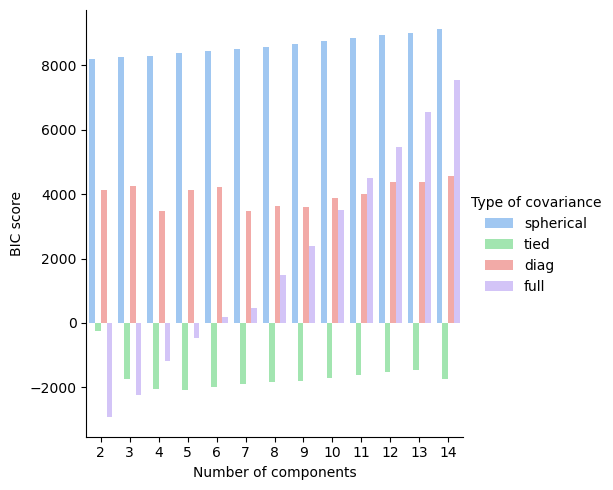

In [79]:
comp_range = np.arange(2,15,1)
gmm_model_selection(X_train, comp_range)

In [80]:
def gaussian_mixture_metrics(cov_type, n_comp, data, labels):
    """
    Parameters
    ----------
    cov_type : str
        Covariance type for GaussianMixture ('full', 'tied', 'diag', or 'spherical').
    n_comp : int
        Number of components (clusters) for the Gaussian Mixture Model.
    data : ndarray of shape (n_samples, n_features)
        The data to cluster.
    labels : ndarray of shape (n_samples,)
        The true labels used to compute the clustering metrics which requires some supervision.
    
    Returns
    -------
    list : Contains the results for each run including the metrics and timings.
    """
    t0 = time.time()
    
    # Create a GaussianMixture model with the specified covariance type
    gmm = GaussianMixture(n_components=n_comp, covariance_type=cov_type, random_state=42)
    
    # Fit the model to the data
    gmm.fit(data)
    
    # Predict cluster labels
    predicted_labels = gmm.predict(data)
    
    fit_time = time.time() - t0
    results = [cov_type, n_comp, round(fit_time, 4)]  # Round fit_time to 4 decimal places
    
    # Define the metrics which require only the true labels and predicted labels
    clustering_metrics = [
        homogeneity_score,
        completeness_score,
        v_measure_score,
        adjusted_rand_score,
        adjusted_mutual_info_score,
    ]
    
    # Round all clustering metrics to 4 decimals
    results += [round(m(labels, predicted_labels), 4) for m in clustering_metrics]
    
    # Silhouette Score
    silhouette = round(silhouette_score(data, predicted_labels, metric="euclidean", sample_size=800), 4)
    results.append(silhouette)
    
    # Log Likelihood (total)
    log_likelihood = round(gmm.score(data) * data.shape[0], 4)  # score gives average log likelihood per sample
    results.append(log_likelihood)
    
    # Log Likelihood (Avg)
    avg_log_likelihood = round(gmm.score(data),  4) 
    results.append(avg_log_likelihood)
    
    # Return the results as a list
    return results

In [81]:
def run_gmm_and_save_results(data, labels, cov_types, n_components_list):
    # List to store all results
    all_results = []
    
    # Loop over different covariance types and numbers of components
    for cov_type in cov_types:
        for n_comp in n_components_list:
            result = gaussian_mixture_metrics(cov_type, n_comp, data, labels)
            all_results.append(result)
    
    # Create a DataFrame from the results
    columns = [
        'Covariance Type', 'n_components', 'Fit Time (s)', 'Homogeneity', 
        'Completeness', 'V-Measure', 'Adjusted Rand Index', 
        'Adjusted Mutual Info', 'Silhouette Score', 
        'Log Likelihood(Total)', 'Log Likelihood(Avg)'
    ]
    df_results = pd.DataFrame(all_results, columns=columns)
    
    # Save the DataFrame to a CSV file
    df_results.to_csv('gmm_clustering_metrics.csv', index=False)
    
    return df_results

In [82]:
# Function to plot results from the DataFrame
def plot_gmm_results(df_results, metric):
    """
    Plots a specific metric (e.g., Silhouette Score, Homogeneity) for each covariance type and n_components.
    
    Parameters
    ----------
    df_results : DataFrame
        The DataFrame containing the results from Gaussian Mixture clustering.
    metric : str
        The metric to plot, should match one of the DataFrame columns.
    """
    plt.figure(figsize=(10, 6))
    for cov_type in df_results['Covariance Type'].unique():
        subset = df_results[df_results['Covariance Type'] == cov_type]
        plt.plot(subset['n_components'], subset[metric], marker='o', label=f'Covariance Type: {cov_type}')
    
    plt.title(f'{metric} vs. Number of Components for Different Covariance Types')
    plt.xlabel('Number of Components')
    plt.ylabel(metric)
    plt.legend()
    plt.grid(True)
    plt.show()

In [83]:
# Define the covariance types and number of components to test
cov_types = ['full', 'tied', 'diag', 'spherical']
n_components_list = np.arange(2,19)

# Run the analysis and store the results in a DataFrame
df_results = run_gmm_and_save_results(X_train, y_train, cov_types, n_components_list)

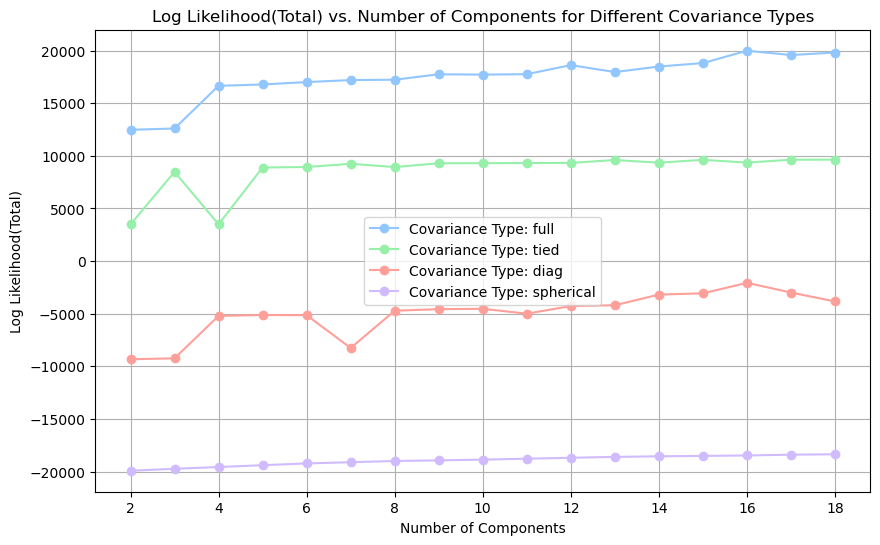

In [84]:
# Plot the Silhouette Score for different models
plot_gmm_results(df_results, 'Log Likelihood(Total)')

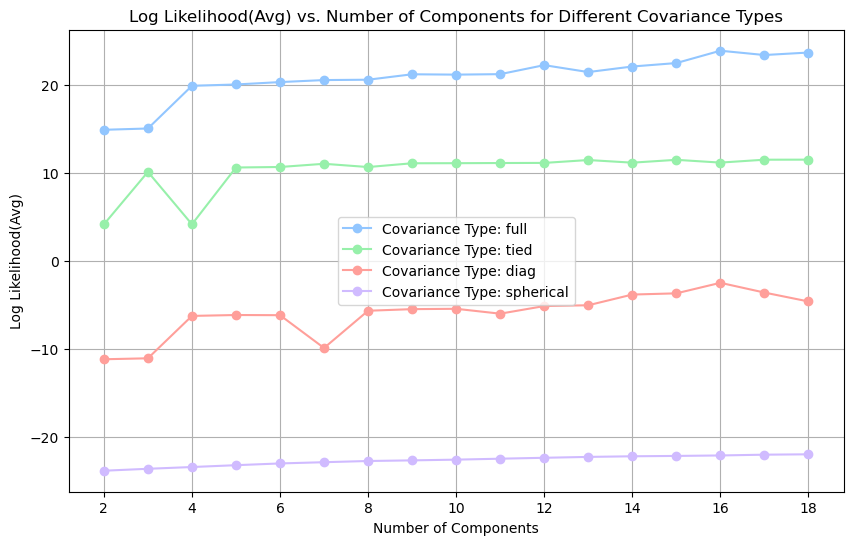

In [85]:
# Plot the Silhouette Score for different models
plot_gmm_results(df_results, 'Log Likelihood(Avg)')

In [86]:
df_results[(df_results['n_components'].isin([2,16])) & (df_results['Covariance Type'] == 'full') ]

,Covariance Type,n_components,Fit Time (s),Homogeneity,Completeness,V-Measure,Adjusted Rand Index,Adjusted Mutual Info,Silhouette Score,Log Likelihood(Total),Log Likelihood(Avg)
0,full,2,0.0246,0.0158,0.0219,0.0184,0.0132,0.0174,0.1081,12471.1060,14.8998
14,full,16,0.2731,0.1516,0.0581,0.0840,0.0482,0.0770,-0.0311,19983.2731,23.8749


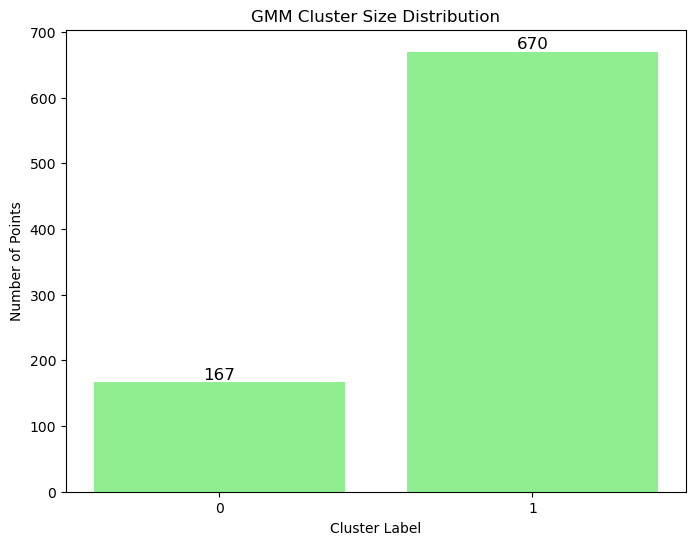

In [87]:
# Fit the best GMM model 
gmm = GaussianMixture(n_components=2, covariance_type='full', n_init =100, random_state=88)
gmm.fit(X_train)

# Get cluster labels
cluster_labels = gmm.predict(X_train)

# Create a DataFrame to count the number of points in each cluster
cluster_counts = pd.Series(cluster_labels).value_counts().sort_index()

# Plot Cluster Size Distribution for GMM
plt.figure(figsize=(8, 6))
bars = plt.bar(cluster_counts.index, cluster_counts.values, color='lightgreen')

# Add annotations (number of data points) on top of each bar
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, int(yval), 
             ha='center', va='bottom', fontsize=12)

# Customize the plot
plt.title('GMM Cluster Size Distribution')
plt.xlabel('Cluster Label')
plt.ylabel('Number of Points')
plt.xticks(cluster_counts.index)
plt.grid(False)
plt.show()

In [88]:
# check if the cluster labels match the ground truth labels
# Create a DataFrame with actual labels and predicted clusters
df = pd.DataFrame({'TrueLabel': y_train, 'Cluster': cluster_labels})

# Dynamically find unique clusters
unique_clusters = df['Cluster'].unique()

# Map each cluster to the most common true label
cluster_label_map = {}
for cluster in unique_clusters:
    # Get the most common label for the current cluster
    common_label = df[df['Cluster'] == cluster]['TrueLabel'].mode()[0]
    cluster_label_map[cluster] = common_label

# Map the predicted clusters to the corresponding labels using the mapping
mapped_labels = [cluster_label_map[cluster] for cluster in cluster_labels]

# Calculate accuracy
accuracy = accuracy_score(y_train, mapped_labels)
print(f"Churn-GMM using original data match rate: {accuracy * 100:.2f}%")

Churn-GMM using original data match rate: 55.91%


In [89]:
from scipy.spatial.distance import mahalanobis

# Calculate intra-cluster distances with soft assignment using Mahalanobis distance
intra_cluster_distances_gmm = []
for i in range(gmm.n_components):
    mean = gmm.means_[i]
    cov_inv = np.linalg.inv(gmm.covariances_[i])
    # Weighted distance for each point using `.iloc[j]` for DataFrame row access
    distances = [
        gmm.predict_proba(X_train)[j][i] * mahalanobis(X_train.iloc[j], mean, cov_inv) 
        for j in range(len(X_train))
    ]
    intra_cluster_distances_gmm.append(np.sum(distances) / np.sum(gmm.predict_proba(X_train)[:, i]))

print("Intra-cluster distances (soft assignment) for each cluster:",np.round(intra_cluster_distances_gmm,2))

Intra-cluster distances (soft assignment) for each cluster: [3.75 3.62]


In [90]:
# calculate the inter cluster distance in GMM
from scipy.spatial.distance import euclidean

inter_cluster_distances_gmm = []
for i in range(gmm.n_components):
    for j in range(i + 1, gmm.n_components):
        inter_cluster_distances_gmm.append(euclidean(gmm.means_[i], gmm.means_[j]))

print("Inter-cluster distances:", np.round(inter_cluster_distances_gmm,2))

Inter-cluster distances: [2.62]


In [91]:
gmm.weights_

array([0.1995221, 0.8004779])

In [92]:
gmm.means_

array([[ 1.10179641,  0.18562874,  1.        , -0.04496362,  1.87551851,
        -0.18512444, -0.02195378, -0.18511654, -0.18001829,  0.0365921 ,
        -0.17998927, -0.09619623,  0.05299215, -0.09639413,  0.11430363,
        -0.04789312,  0.11448109,  0.02398546],
       [ 0.99104478,  0.16567164,  0.        , -0.0185248 , -0.48669715,
         0.08661927, -0.02266392,  0.08661819,  0.02209646, -0.03178345,
         0.02209287, -0.01206746, -0.00635334, -0.01204333,  0.01121275,
        -0.01796404,  0.01127327,  0.00729188]])

In [93]:
gmm.lower_bound_

14.899768184762015

Diabetes Data 

    Number of components Type of covariance      BIC score
62                    22               diag -414236.428700
61                    21               diag -408010.828005
60                    20               diag -400053.772589
58                    18               diag -387881.794828
55                    15               diag -376974.101818


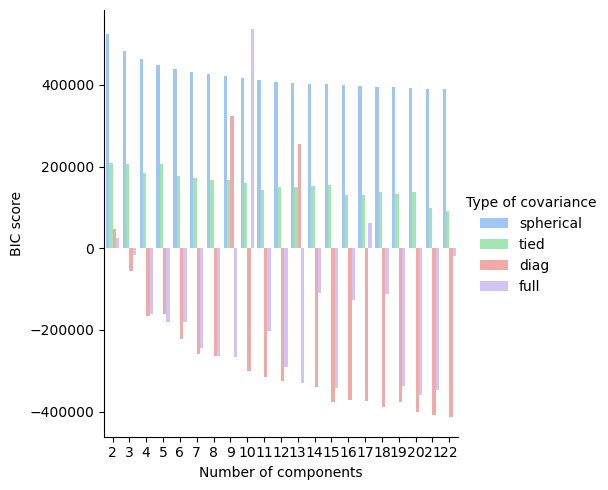

In [94]:
comp_range_diab = np.arange(2,23,1)
gmm_model_selection(X_train_diab, comp_range_diab)

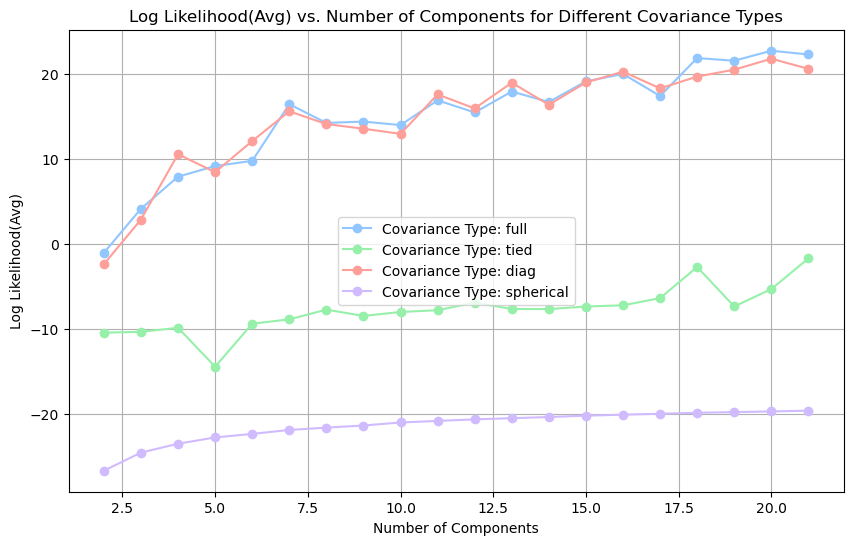

In [95]:
n_components_list_diab = np.arange(2,22,1)
df_results_diab = run_gmm_and_save_results(X_train_diab, y_train_diab, cov_types, n_components_list_diab)
plot_gmm_results(df_results_diab, 'Log Likelihood(Avg)')

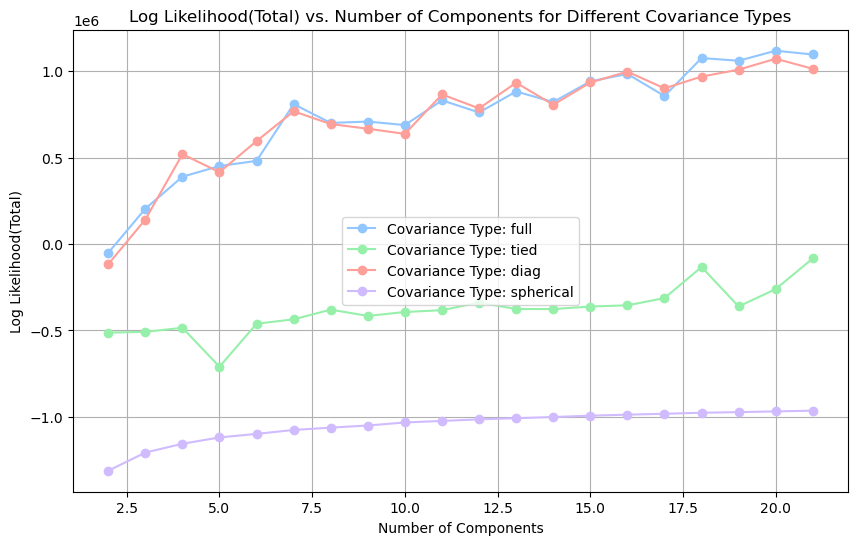

In [96]:
plot_gmm_results(df_results_diab, 'Log Likelihood(Total)')

In [97]:
df_results_diab.columns

Index(['Covariance Type', 'n_components', 'Fit Time (s)', 'Homogeneity',
       'Completeness', 'V-Measure', 'Adjusted Rand Index',
       'Adjusted Mutual Info', 'Silhouette Score', 'Log Likelihood(Total)',
       'Log Likelihood(Avg)'],
      dtype='object')

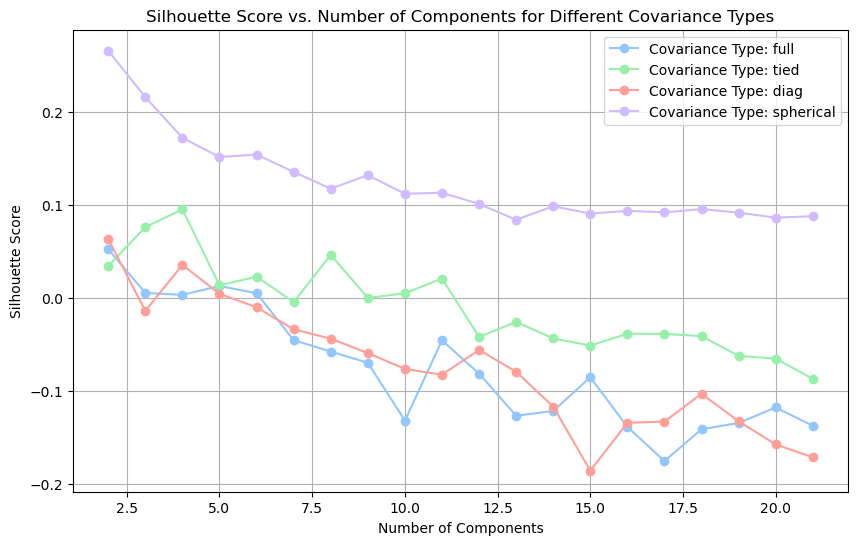

In [98]:
plot_gmm_results(df_results_diab, 'Silhouette Score')

In [99]:
df_results_diab[(df_results_diab['n_components'] == 16) & (df_results_diab['Covariance Type'] == 'diag' )]

,Covariance Type,n_components,Fit Time (s),Homogeneity,Completeness,V-Measure,Adjusted Rand Index,Adjusted Mutual Info,Silhouette Score,Log Likelihood(Total),Log Likelihood(Avg)
54,diag,16,2.024,0.072,0.0263,0.0386,0.0246,0.0384,-0.1343,997337.0159,20.2979


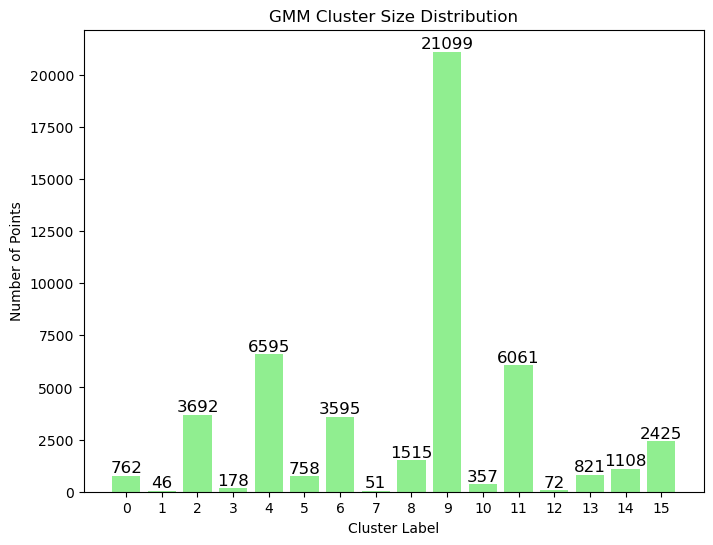

In [100]:
# Fit the best GMM model 
gmm_diab = GaussianMixture(n_components=16, covariance_type='diag', random_state=42)
gmm_diab.fit(X_train_diab)

# Get cluster labels
cluster_labels = gmm_diab.predict(X_train_diab)

# Create a DataFrame to count the number of points in each cluster
cluster_counts = pd.Series(cluster_labels).value_counts().sort_index()

# Plot Cluster Size Distribution for GMM
plt.figure(figsize=(8, 6))
bars = plt.bar(cluster_counts.index, cluster_counts.values, color='lightgreen')

# Add annotations (number of data points) on top of each bar
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, int(yval), 
             ha='center', va='bottom', fontsize=12)

# Customize the plot
plt.title('GMM Cluster Size Distribution')
plt.xlabel('Cluster Label')
plt.ylabel('Number of Points')
plt.xticks(cluster_counts.index)
plt.grid(False)
plt.show()

In [101]:
# choose two components for the GMM model- Diabetes data 
# Fit the best GMM model 
gmm_diab = GaussianMixture(n_components=2, covariance_type='spherical', random_state=42)
gmm_diab.fit(X_train_diab)

# Get cluster labels
cluster_labels = gmm_diab.predict(X_train_diab)

# Create a DataFrame with actual labels and predicted clusters
df = pd.DataFrame({'TrueLabel': y_train_diab, 'Cluster': cluster_labels})

# Dynamically find unique clusters
unique_clusters = df['Cluster'].unique()

# Map each cluster to the most common true label
cluster_label_map = {}
for cluster in unique_clusters:
    # Get the most common label for the current cluster
    common_label = df[df['Cluster'] == cluster]['TrueLabel'].mode()[0]
    cluster_label_map[cluster] = common_label

# Map the predicted clusters to the corresponding labels using the mapping
mapped_labels = [cluster_label_map[cluster] for cluster in cluster_labels]

# Calculate accuracy
accuracy = accuracy_score(y_train_diab, mapped_labels)
print(f"Churn-GMM using original data match rate: {accuracy * 100:.2f}%")

Churn-GMM using original data match rate: 63.44%


# Part II - Dimension Reduction

# Principal Component Analysis 

In [102]:
comp_var = []
for n in range(2,19):
    pca = PCA(n_components=n)
    pca.fit(X_train)
    explained_variance = sum(pca.explained_variance_ratio_)
    comp_var.append([n, explained_variance])

In [103]:
pca_df = pd.DataFrame(comp_var, columns=['n_components', 'explained_variance'])

In [104]:
pca = PCA()
pca.fit(X_train)
# Get eigenvalues for PCA churn data
eigenvalues = pca.explained_variance_

In [788]:
eigenvalues

array([2.125 , 1.9353, 2.0387, 2.0035, 2.0144, 0.0457, 0.6073, 1.2383,
       1.0561, 1.0383, 0.9586, 0.995 , 0.9765, 0.9807, 0.9865, 0.    ,
       0.    , 0.    , 0.    ])

In [106]:
pca_diab = PCA()
pca_diab.fit(X_train_diab)
eigenvalues_diab = pca_diab.explained_variance_

In [107]:
len(eigenvalues_diab)

21

In [108]:
if len(eigenvalues) < len(eigenvalues_diab):
    eigenvalues = np.pad(eigenvalues, (0, len(eigenvalues_diab) - len(eigenvalues)), 'edge')

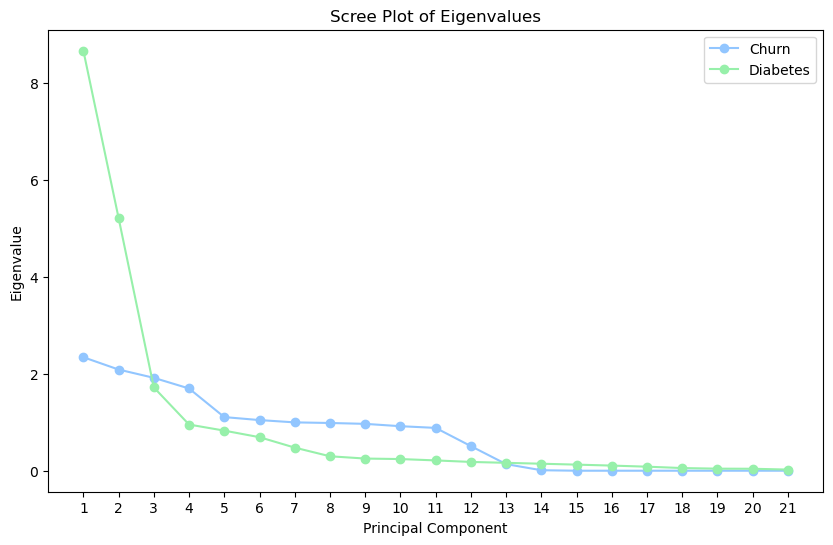

In [109]:
# Plot scree plot
plt.figure(figsize=(10, 6))
plt.plot(range(1, len(eigenvalues_diab) + 1), eigenvalues, marker='o', label = 'Churn')
plt.plot(range(1, len(eigenvalues_diab) + 1), eigenvalues_diab, marker='o', label = 'Diabetes')
plt.title('Scree Plot of Eigenvalues')
plt.xlabel('Principal Component')
plt.ylabel('Eigenvalue')
plt.xticks(range(1, len(eigenvalues_diab) + 1))
plt.grid(False)
plt.legend()
plt.show()

In [110]:
cumulative_variance_diab = np.cumsum(pca_diab.explained_variance_ratio_)
cumulative_variance = np.cumsum(pca.explained_variance_ratio_)

In [111]:
len(cumulative_variance_diab)

21

In [112]:
len(cumulative_variance)

18

In [113]:
if len(cumulative_variance) < len(cumulative_variance_diab):
    cumulative_variance = np.pad(cumulative_variance, (0, len(cumulative_variance_diab) - len(cumulative_variance)), 'edge')

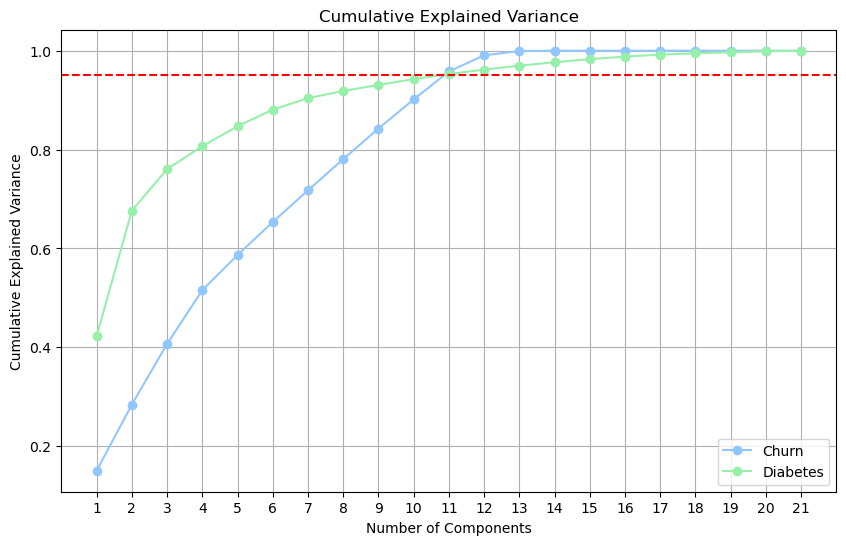

In [114]:
# Plot cumulative explained variance
plt.figure(figsize=(10, 6))
plt.plot(range(1, len(cumulative_variance_diab) + 1), cumulative_variance, marker='o', label='Churn')
plt.plot(range(1, len(cumulative_variance_diab) + 1), cumulative_variance_diab, marker='o', label = 'Diabetes')
plt.title('Cumulative Explained Variance')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.xticks(range(1, len(cumulative_variance_diab) + 1))
plt.grid()
plt.legend()
plt.axhline(y=0.95, color='r', linestyle='--')  # Line at 95%
plt.show()

In [115]:
X_train.shape

(837, 18)

In [116]:
pca3_churn = PCA(n_components = 3)
pca3_churn.fit(X_train)

PCA(n_components=3)

In [117]:
sum(pca3_churn.explained_variance_ratio_)

0.4067933780129938

In [118]:
X_3pca = pca3_churn.fit_transform(X_train)

In [119]:
X_3pca.shape

(837, 3)

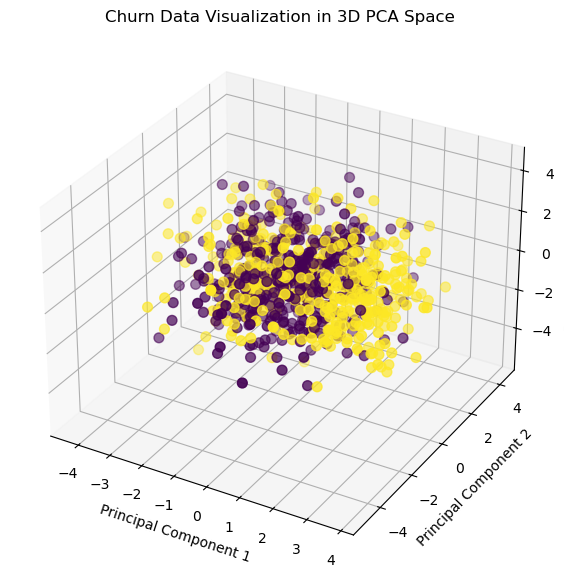

In [120]:
# Visualize the dimension reduced churn data in 3D new spaces
x_pca1 = X_3pca[:, 0]  
x_pca2 = X_3pca[:, 1]  
x_pca3 = X_3pca[:, 2]  

# Create a 3D scatter plot
fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')

# Scatter plot in 3D PCA space
scatter = ax.scatter(x_pca1, x_pca2, x_pca3, c=y_train, cmap='viridis', s=50)

# Setting labels with additional padding
ax.set_xlabel('Principal Component 1')
ax.set_ylabel('Principal Component 2')
ax.set_zlabel('Principal Component 3')
ax.set_title('Churn Data Visualization in 3D PCA Space')

plt.show()

In [121]:
# project the churn data to 11 dimensional space
pca = PCA(n_components = 11)
pca.fit(X_train)
X_pca = pca.fit_transform(X_train)
sum(pca.explained_variance_ratio_)

0.9580704747458003

In [122]:
# refit PCA for diabetes data with the chosen number of components
pca_diab_3 = PCA(n_components = 3)
pca_diab_3.fit(X_train_diab)

PCA(n_components=3)

In [123]:
pca_diab_3.explained_variance_

array([8.66176612, 5.21069306, 1.71782345])

In [124]:
sum(pca_diab_3.explained_variance_ratio_)

0.7603498024871369

In [125]:
X_3pca_diab = pca_diab_3.fit_transform(X_train_diab)

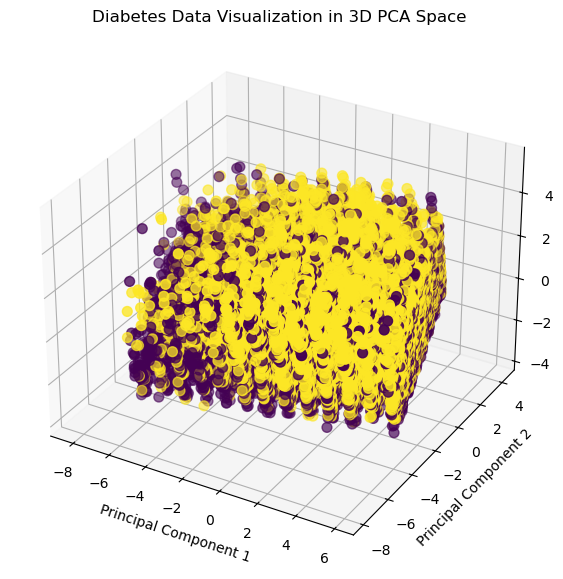

In [126]:
# Visualize the dimension reduced churn data in 3D new spaces
x_pca1_diab = X_3pca_diab[:, 0]  
x_pca2_diab = X_3pca_diab[:, 1]  
x_pca3_diab = X_3pca_diab[:, 2]  

# Create a 3D scatter plot
fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')

# Scatter plot in 3D PCA space
scatter = ax.scatter(x_pca1_diab, x_pca2_diab, x_pca3_diab, c=y_train_diab, cmap='viridis', s=50)

# Setting labels with additional padding
ax.set_xlabel('Principal Component 1')
ax.set_ylabel('Principal Component 2')
ax.set_zlabel('Principal Component 3')
ax.set_title('Diabetes Data Visualization in 3D PCA Space')

plt.show()

In [127]:
comp_var_diab = []
for n in range(2,22):
    pca_diab = PCA(n_components=n)
    pca_diab.fit(X_train_diab)
    explained_variance_diab = sum(pca_diab.explained_variance_ratio_)
    comp_var_diab.append([n, explained_variance_diab])

In [128]:
# transfer the diabetes data with 95% variance explained
pca_diab_11 = PCA(n_components = 11)
pca_diab_11.fit(X_train_diab)
X_pca_diab = pca_diab_11.fit_transform(X_train_diab)
sum(pca_diab_11.explained_variance_ratio_)

0.9529368105740474

# Independent Component Analysis 

In [129]:
from sklearn.decomposition import FastICA
from scipy.stats import kurtosis

In [130]:
def ica_kurtosis(data, num_components): 
    results = []
    for n in num_components:
        # Apply ICA
        ica = FastICA(n_components=n)
        X_ica = ica.fit_transform(data)

        # Calculate kurtosis for each independent component
        kurt_vals = kurtosis(X_ica, axis=0)
        results.append([n, np.abs(np.mean(kurt_vals))])
    results_df = pd.DataFrame(results, columns=['Number of Components', 'Average_Kurtosis'])
    return results_df

In [131]:
num_components = np.arange(2, 19)
results_ica = ica_kurtosis(X_train, num_components)

In [132]:
num_components_diab = np.arange(2, 23)
results_ica_diab = ica_kurtosis(X_train_diab, num_components_diab)

In [133]:
Kurtosis_churn = list(results_ica['Average_Kurtosis'])

In [134]:
if len(num_components) < len(num_components_diab):
    Kurtosis_churn = np.pad(Kurtosis_churn, (0, len(num_components_diab) - len(num_components)), 'edge')

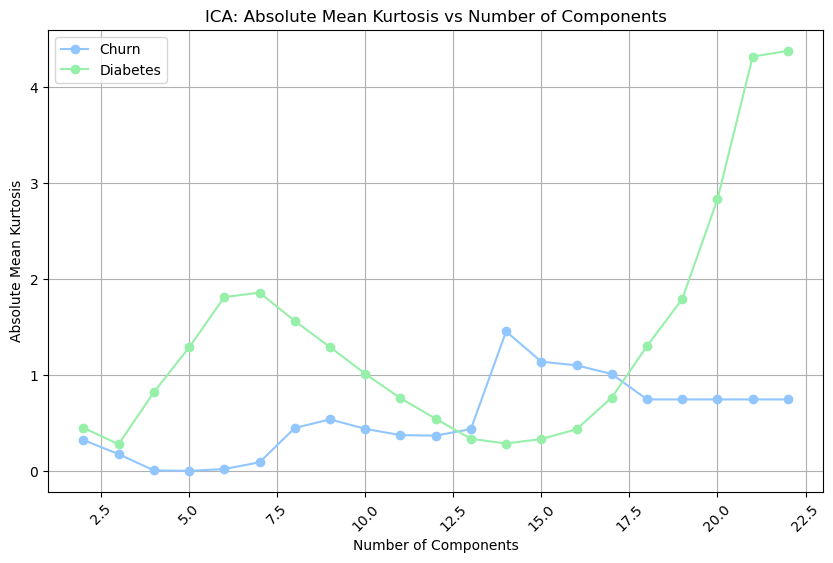

In [135]:
plt.figure(figsize=(10, 6))
plt.plot(results_ica_diab['Number of Components'], Kurtosis_churn, marker='o', label='Churn')
plt.plot(results_ica_diab['Number of Components'], results_ica_diab['Average_Kurtosis'], marker='o', label='Diabetes')
plt.xticks(rotation=45)
plt.xlabel('Number of Components')
plt.ylabel('Absolute Mean Kurtosis')
plt.title('ICA: Absolute Mean Kurtosis vs Number of Components')
plt.legend()
plt.grid(True)
plt.show()

In [136]:
# fit_transform returns X_new, a ndarray of shape (n_samples, n_components)
ica_churn = FastICA(n_components=14)
X_churn_ica = ica_churn.fit_transform(X_train)
X_churn_ica.shape

(837, 14)

In [137]:
# transform the diabetes data with ICA
ica_diab = FastICA(n_components=21)
X_diab_ica = ica_diab.fit_transform(X_train_diab)
X_diab_ica.shape

(49135, 21)

# Randomized Projections 

In [138]:
from sklearn.random_projection import GaussianRandomProjection, SparseRandomProjection
from sklearn.metrics import mean_squared_error

In [139]:
# Function to calculate reconstruction error for random projection with varying n_components
def calculate_reconstruction_error(data, n_components_range):
    results = []
    
    for n in n_components_range:
        seed_errors = []
        
        for seed in seeds:
            transformer = GaussianRandomProjection(n_components=n, random_state = seed)
            data_projected = transformer.fit_transform(data)
            
            # Get the projection matrix
            projection_matrix = transformer.components_.T

            # Compute the pseudo-inverse for reconstruction
            projection_matrix_pinv = np.linalg.pinv(projection_matrix)
            data_reconstructed = data_projected @ projection_matrix_pinv

            reconstruction_error = mean_squared_error(data, data_reconstructed)
            seed_errors.append(reconstruction_error)
        
        min_reconstruction_error = np.min(seed_errors)
        var_reconstruction_error = np.var(seed_errors)
        results.append([n, min_reconstruction_error, var_reconstruction_error])

    # Convert results to DataFrame with appropriate columns
    results_df = pd.DataFrame(results, columns=["n_components", "Min Reconstruction Error", "Variance of Reconstruction Error"])
    return results_df

In [140]:
seeds = np.arange(81,86,1)
n_components_range = range(2, 23)  
results_rp_gaussian= calculate_reconstruction_error(X_train, n_components_range)

In [141]:
results_rp_gaussian_diab = calculate_reconstruction_error(X_train_diab, n_components_range)

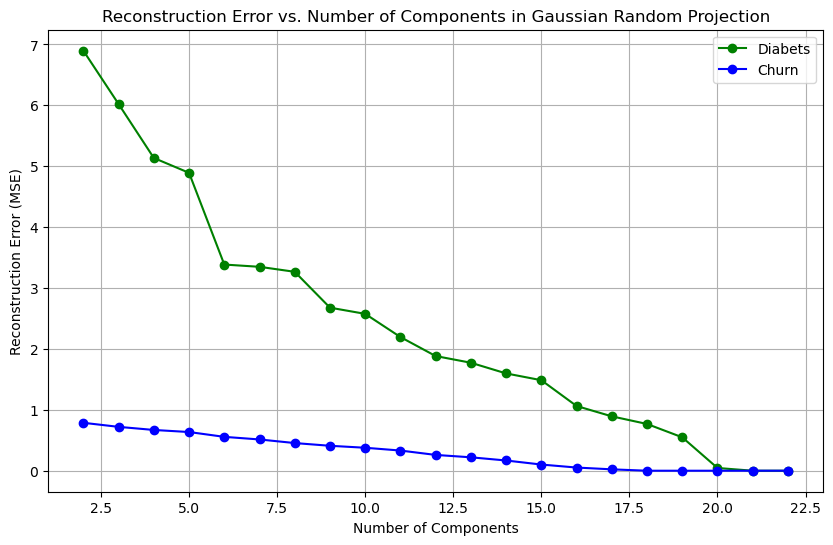

In [142]:
# Plot the reconstruction error against number of components
plt.figure(figsize=(10, 6))

# plot the reconstruction error and variance for the diabetes data 
plt.plot(n_components_range, results_rp_gaussian_diab["Min Reconstruction Error"], marker='o', linestyle='-', color='g',
        label = 'Diabets')
plt.plot(results_rp_gaussian["n_components"], results_rp_gaussian["Min Reconstruction Error"], 
         marker='o', linestyle='-', color='b', label = 'Churn')

plt.title('Reconstruction Error vs. Number of Components in Gaussian Random Projection')
plt.xlabel('Number of Components')
plt.ylabel('Reconstruction Error (MSE)')
plt.legend()
plt.grid(True)
plt.show()

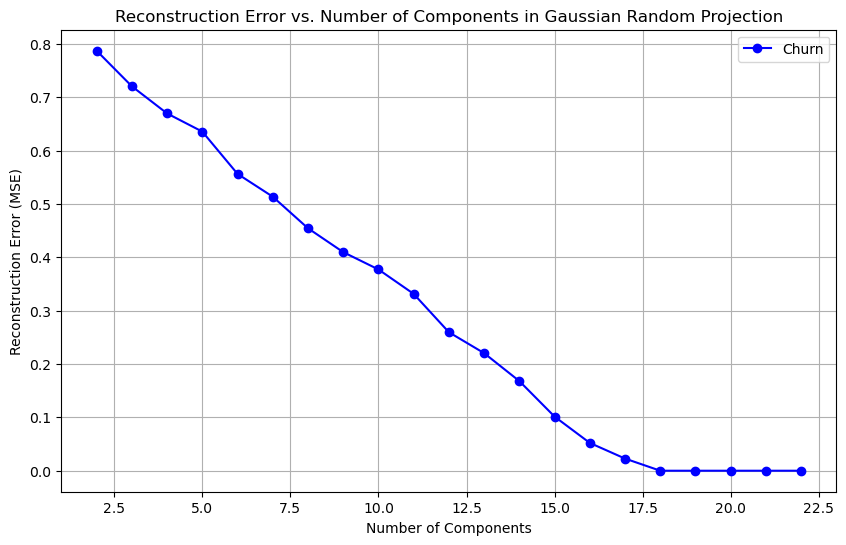

In [143]:
# Plot the reconstruction error against number of components
plt.figure(figsize=(10, 6))

# plot the reconstruction error and variance for the diabetes data 
#plt.plot(n_components_range, results_rp_gaussian_diab["Min Reconstruction Error"], marker='o', linestyle='-', color='g',label = 'Diabets')
plt.plot(results_rp_gaussian["n_components"], results_rp_gaussian["Min Reconstruction Error"], 
         marker='o', linestyle='-', color='b', label = 'Churn')

plt.title('Reconstruction Error vs. Number of Components in Gaussian Random Projection')
plt.xlabel('Number of Components')
plt.ylabel('Reconstruction Error (MSE)')
plt.legend()
plt.grid(True)
plt.show()

In [144]:
def calculate_reconstruction_error_sparse(data, n_components_range, seeds):
    results = []
    for n in n_components_range:
        seed_errors = []
        for seed in seeds:
            transformer = GaussianRandomProjection(n_components=n, random_state=seed)
            data_projected = transformer.fit_transform(data)

            # Ensure components_ is 2D
            projection_matrix = transformer.components_.T
            if projection_matrix.ndim == 1:  # Reshape if n_components=1
                projection_matrix = projection_matrix.reshape(-1, 1)

            # Compute pseudoinverse for reconstruction
            projection_matrix_pinv = np.linalg.pinv(projection_matrix)
            data_reconstructed = data_projected @ projection_matrix_pinv

            # Calculate reconstruction error
            reconstruction_error = mean_squared_error(data, data_reconstructed)
            seed_errors.append(reconstruction_error)
            
        avg_reconstruction_error = np.mean(seed_errors)
        var_reconstruction_error = np.var(seed_errors)
        results.append([n, avg_reconstruction_error, var_reconstruction_error])

    # Convert results to DataFrame with appropriate columns
    results_df = pd.DataFrame(results, columns=["n_components", "Average Reconstruction Error", "Variance of Reconstruction Error"])
    return results_df

In [145]:
seeds = [66, 68, 88, 99, 188]
n_components_range = range(2, 25)  
results_rp_sparse= calculate_reconstruction_error_sparse(X_train, n_components_range, seeds)

In [146]:
results_rp_sparse_diab= calculate_reconstruction_error_sparse(X_train_diab, n_components_range, seeds)

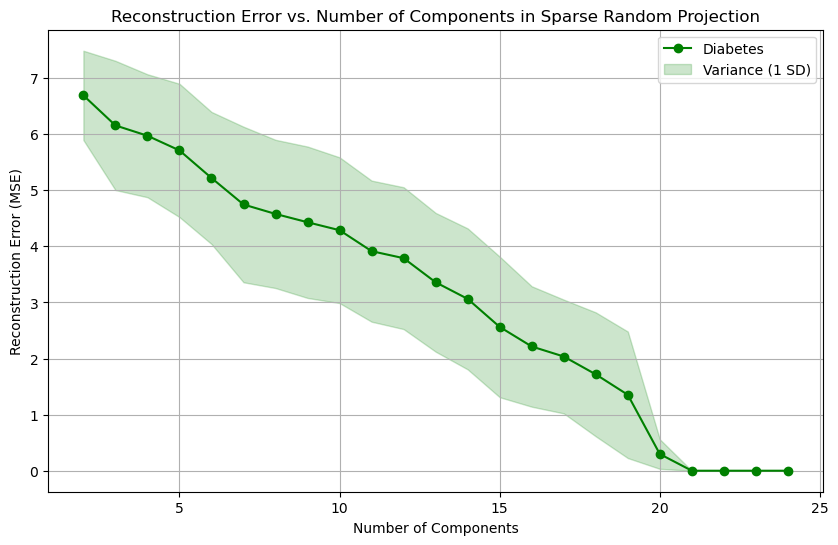

In [147]:
# Plot the reconstruction error against number of components
plt.figure(figsize=(10, 6))

# plot the reconstruction error and variance for the diabetes data 
plt.plot(results_rp_sparse_diab["n_components"], results_rp_sparse_diab["Average Reconstruction Error"], marker='o', 
         linestyle='-', color='g', label = 'Diabetes')
plt.fill_between(
    n_components_range,  
    results_rp_sparse_diab["Average Reconstruction Error"] - np.sqrt(results_rp_sparse_diab["Variance of Reconstruction Error"]),  
    results_rp_sparse_diab["Average Reconstruction Error"] + np.sqrt(results_rp_sparse_diab["Variance of Reconstruction Error"]),  
    color="g",  
    alpha=0.2,  
    label="Variance (1 SD)"  
     )

plt.title('Reconstruction Error vs. Number of Components in Sparse Random Projection')
plt.xlabel('Number of Components')
plt.ylabel('Reconstruction Error (MSE)')
plt.grid(True)
plt.legend()

plt.show()

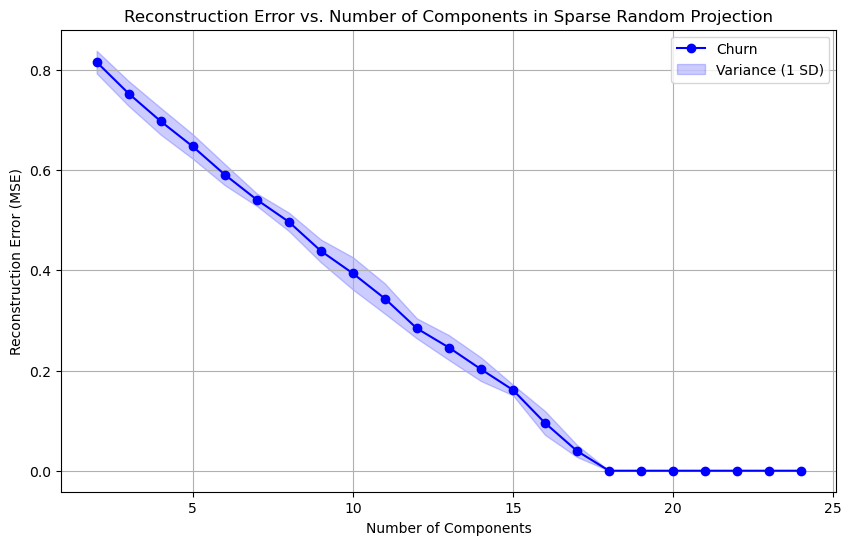

In [148]:
# Plot the reconstruction error against number of components
plt.figure(figsize=(10, 6))

# plot the reconstruction error and variance for the churn data 
plt.plot(results_rp_sparse["n_components"], results_rp_sparse["Average Reconstruction Error"], marker='o', linestyle='-', 
         color='b', label = 'Churn')
plt.fill_between(
    n_components_range,  
    results_rp_sparse["Average Reconstruction Error"] - np.sqrt(results_rp_sparse["Variance of Reconstruction Error"]),  
    results_rp_sparse["Average Reconstruction Error"] + np.sqrt(results_rp_sparse["Variance of Reconstruction Error"]),  
    color="b",  
    alpha=0.2,  
    label="Variance (1 SD)"  
     )

plt.title('Reconstruction Error vs. Number of Components in Sparse Random Projection')
plt.xlabel('Number of Components')
plt.ylabel('Reconstruction Error (MSE)')
plt.grid(True)
plt.legend()

""" 
plt.text(
    0.5, 0.5,                     # X and Y position in figure coordinates (0 to 1)
    'ycheng456',                   # Watermark text
    fontsize=40,                  # Font size of the watermark
    color='gray',                 # Color of the watermark text
    alpha=0.5,                    # Transparency of the watermark
    ha='center',                  # Horizontal alignment
    va='center',                  # Vertical alignment
    rotation=30,                  # Rotation angle of the watermark
    transform=plt.gcf().transFigure # Use the figure's coordinate system
    )
"""

plt.show()

In [149]:
from sklearn.metrics import pairwise_distances

def rp_pairwise_distance(data, components_range):
    original_distances = pairwise_distances(data)
    results = []

    for n_components in components_range:
        X_projected = random_projection(data, n_components)
        projected_distances = pairwise_distances(X_projected)
        error = np.mean(np.abs(original_distances - projected_distances))
        results.append(n_components, error)
    return results 

In [747]:
def rp_pairwise_distance_gaussian(data, components_range, seeds):
    # Calculate original pairwise distances
    original_distances = pairwise_distances(data)
    results = []
    for n in components_range:
        seed_errors = []
        for seed in seeds:
            # Apply GaussianRandomProjection with the desired number of components
            transformer = GaussianRandomProjection(n_components=n)
            X_projected = transformer.fit_transform(data)
            projected_distances = pairwise_distances(X_projected)

            # Calculate mean absolute difference between original and projected distances
            error = np.mean(np.abs(original_distances - projected_distances))
            seed_errors.append(error)
            
        avg_dist_diff = np.round(np.mean(seed_errors), 3)
        var_dist_diff = np.round(np.var(seed_errors), 3)
        results.append([n, avg_dist_diff, var_dist_diff])

    # Convert results to a DataFrame
    results_df = pd.DataFrame(results, columns=['n_components', 'avg_dist_diff', 'var_dist_diff'])
    
    return results_df

In [734]:
def rp_pairwise_distance_sparse(data, components_range, seeds):
    # Calculate original pairwise distances
    original_distances = pairwise_distances(data)
    results = []
    for n in components_range:
        seed_errors = []
        for seed in seeds:
            # Apply SparseRandomProjection with the desired number of components and seed
            transformer = SparseRandomProjection(n_components=n, density= 0.9, random_state=seed)
            X_projected = transformer.fit_transform(data)
            projected_distances = pairwise_distances(X_projected)

            # Calculate mean absolute difference between original and projected distances
            error = np.mean(np.abs(original_distances - projected_distances))
            seed_errors.append(error)
            
        avg_dist_diff = np.round(np.mean(seed_errors), 3)
        var_dist_diff = np.round(np.var(seed_errors), 3)
        results.append([n, avg_dist_diff, var_dist_diff])

    # Convert results to a DataFrame
    results_df = pd.DataFrame(results, columns=['n_components', 'avg_dist_diff', 'var_dist_diff'])
    
    return results_df

In [748]:
components_range = np.arange(2,19)
rp_pairwise_distances_gaussian = rp_pairwise_distance_gaussian(X_train, components_range, seeds)

In [749]:
rp_pairwise_distances_gaussian

,n_components,avg_dist_diff,var_dist_diff
0,2,2.1400000000,0.0170000000
1,3,1.7610000000,0.0240000000
2,4,1.5670000000,0.0090000000
3,5,1.3330000000,0.0150000000
4,6,1.1770000000,0.0080000000
5,7,1.1390000000,0.0020000000
6,8,1.0940000000,0.0160000000
7,9,0.9930000000,0.0040000000
8,10,0.9490000000,0.0040000000
9,11,0.9780000000,0.0250000000


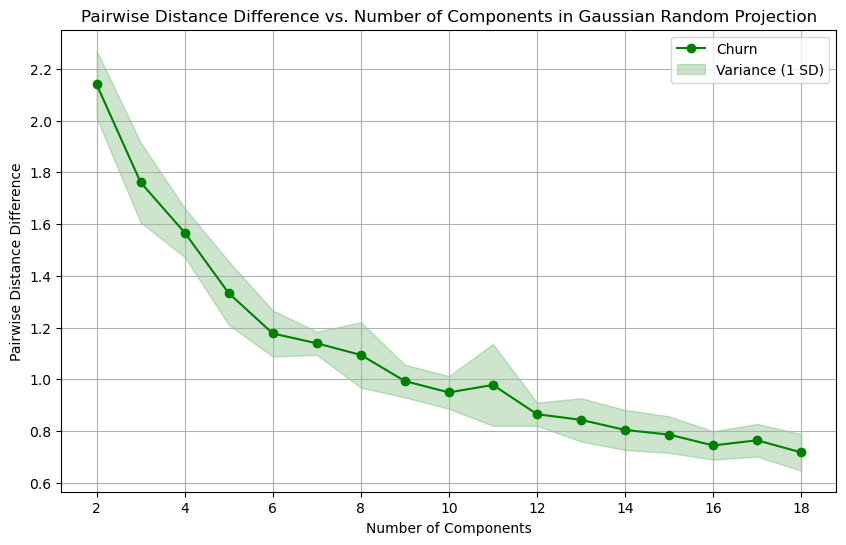

In [750]:
# Plot the pairwise distance difference against number of components
plt.figure(figsize=(10, 6))

# plot the pairwise distance difference  and variance for the diabetes data 
plt.plot(rp_pairwise_distances_gaussian["n_components"], rp_pairwise_distances_gaussian["avg_dist_diff"], marker='o', 
         linestyle='-', color='g', label = 'Churn')
plt.fill_between(
    rp_pairwise_distances_gaussian["n_components"],  
    rp_pairwise_distances_gaussian["avg_dist_diff"] - np.sqrt(rp_pairwise_distances_gaussian["var_dist_diff"]),  
    rp_pairwise_distances_gaussian["avg_dist_diff"] + np.sqrt(rp_pairwise_distances_gaussian["var_dist_diff"]),  
    color="g",  
    alpha=0.2,  
    label="Variance (1 SD)"  
     )

plt.title('Pairwise Distance Difference vs. Number of Components in Gaussian Random Projection')
plt.xlabel('Number of Components')
plt.ylabel('Pairwise Distance Difference')
plt.grid(True)
plt.legend()

plt.show()

In [752]:
rp_pairwise_distances_sparsity = rp_pairwise_distance_sparse(X_train, components_range, seeds)

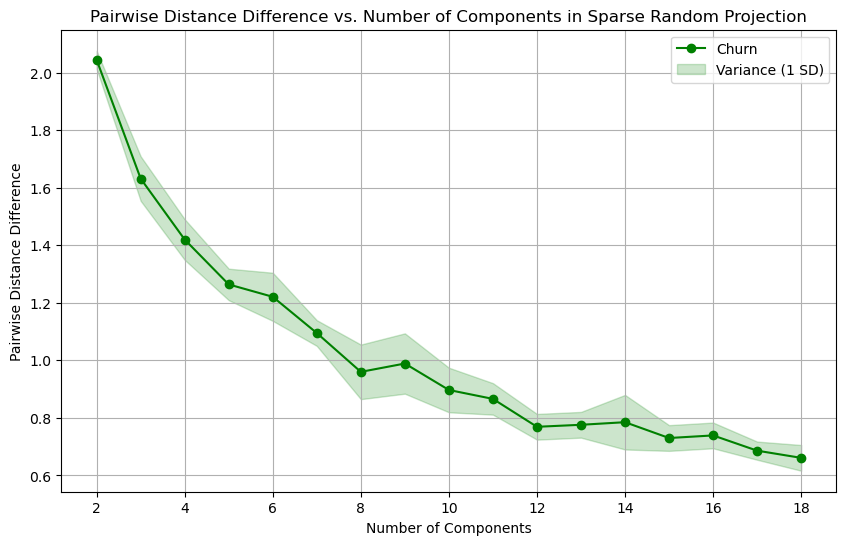

In [753]:
# Plot the pairwise distance difference against number of components
plt.figure(figsize=(10, 6))

# plot the pairwise distance difference  and variance for the diabetes data 
plt.plot(rp_pairwise_distances_sparsity["n_components"], rp_pairwise_distances_sparsity["avg_dist_diff"], marker='o', 
         linestyle='-', color='g', label = 'Churn')
plt.fill_between(
    rp_pairwise_distances_sparsity["n_components"],  
    rp_pairwise_distances_sparsity["avg_dist_diff"] - np.sqrt(rp_pairwise_distances_sparsity["var_dist_diff"]),  
    rp_pairwise_distances_sparsity["avg_dist_diff"] + np.sqrt(rp_pairwise_distances_sparsity["var_dist_diff"]),  
    color="g",  
    alpha=0.2,  
    label="Variance (1 SD)"  
     )

plt.title('Pairwise Distance Difference vs. Number of Components in Sparse Random Projection')
plt.xlabel('Number of Components')
plt.ylabel('Pairwise Distance Difference')
plt.grid(True)
plt.legend()

plt.show()

In [754]:
rp_pairwise_distances_sparsity

,n_components,avg_dist_diff,var_dist_diff
0,2,2.0450000000,0.0010000000
1,3,1.6320000000,0.0060000000
2,4,1.4200000000,0.0050000000
3,5,1.2640000000,0.0030000000
4,6,1.2210000000,0.0070000000
5,7,1.0950000000,0.0020000000
6,8,0.9600000000,0.0090000000
7,9,0.9890000000,0.0110000000
8,10,0.8970000000,0.0060000000
9,11,0.8660000000,0.0030000000


In [729]:
def rp_error_tolerance(data, error_tolerances, seeds):
    # Calculate original pairwise distances
    original_distances = pairwise_distances(data)
    results = []
    for tolerance in error_tolerances:
        seed_errors = []
        for seed in seeds:
            # Apply SparseRandomProjection with the desired number of components and seed
            transformer = SparseRandomProjection(n_components=12, density= 0.9, eps=tolerance, random_state=seed)
            X_projected = transformer.fit_transform(data)
            projected_distances = pairwise_distances(X_projected)

            # Calculate mean absolute difference between original and projected distances
            error = np.mean(np.abs(original_distances - projected_distances))
            seed_errors.append(error)
            
        avg_dist_diff = np.round(np.mean(seed_errors), 3)
        var_dist_diff = np.round(np.var(seed_errors), 3)
        results.append([tolerance, avg_dist_diff, var_dist_diff])

    # Convert results to a DataFrame
    results_df = pd.DataFrame(results, columns=['Error Tolerance', 'avg_dist_diff', 'var_dist_diff'])
    
    return results_df

In [730]:
error_tolerances = np.arange(0.01, 0.15, 0.01)
results_rp_tolerance= rp_error_tolerance(X_train, error_tolerances, seeds)

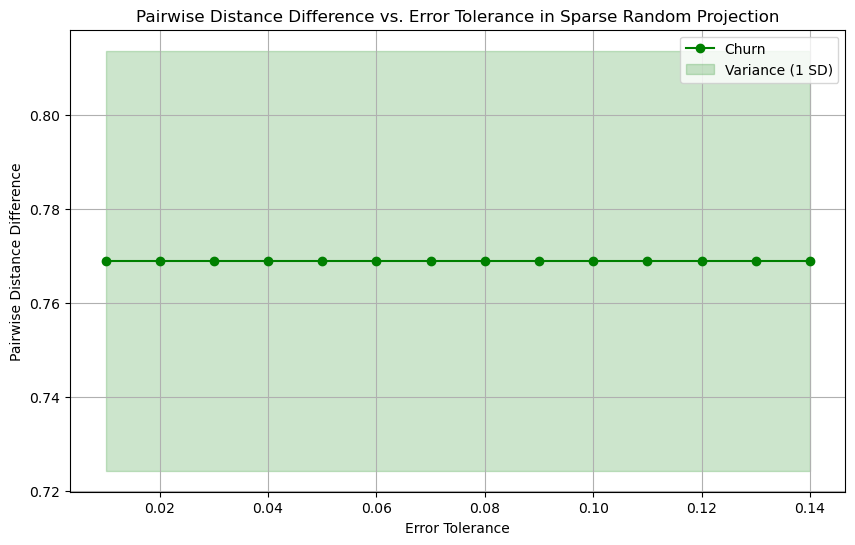

In [731]:
# Plot the pairwise distance difference  against number of components
plt.figure(figsize=(10, 6))

# plot the pairwise distance difference  and variance for the diabetes data 
plt.plot(results_rp_tolerance["Error Tolerance"], results_rp_tolerance["avg_dist_diff"], marker='o', 
         linestyle='-', color='g', label = 'Churn')
plt.fill_between(
    results_rp_tolerance["Error Tolerance"],  
    results_rp_tolerance["avg_dist_diff"] - np.sqrt(results_rp_tolerance["var_dist_diff"]),  
    results_rp_tolerance["avg_dist_diff"] + np.sqrt(results_rp_tolerance["var_dist_diff"]),  
    color="g",  
    alpha=0.2,  
    label="Variance (1 SD)"  
     )

plt.title('Pairwise Distance Difference vs. Error Tolerance in Sparse Random Projection')
plt.xlabel('Error Tolerance')
plt.ylabel('Pairwise Distance Difference')
plt.grid(True)
plt.legend()

plt.show()

In [722]:
1/ np.sqrt(18)

0.23570226039551587

In [723]:
def rp_sparsity_level(data, densities, seeds):
    # Calculate original pairwise distances
    original_distances = pairwise_distances(data)
    results = []
    for dens in densities:
        seed_errors = []
        for seed in seeds:
            # Apply SparseRandomProjection with the desired number of components and seed
            transformer = SparseRandomProjection(n_components=12, density= dens, eps= 0.1,  random_state=seed)
            X_projected = transformer.fit_transform(data)
            projected_distances = pairwise_distances(X_projected)

            # Calculate mean absolute difference between original and projected distances
            error = np.mean(np.abs(original_distances - projected_distances))
            seed_errors.append(error)
            
        avg_dist_diff = np.round(np.mean(seed_errors), 3)
        var_dist_diff = np.round(np.var(seed_errors), 3)
        results.append([dens, avg_dist_diff, var_dist_diff])

    # Convert results to a DataFrame
    results_df = pd.DataFrame(results, columns=['Sparcity Level', 'avg_dist_diff', 'var_dist_diff'])
    
    return results_df

In [727]:
densities = np.arange(0.1, 0.99, 0.05)
results_sparcity = rp_sparsity_level(X_train, densities, seeds)

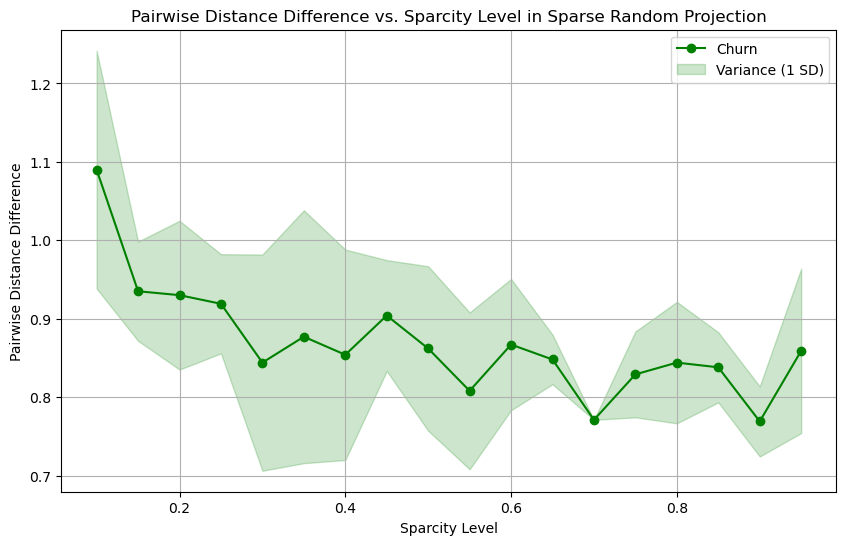

In [728]:
# Plot the pairwise distance difference  against number of components
plt.figure(figsize=(10, 6))

# plot the pairwise distance difference  and variance for the diabetes data 
plt.plot(results_sparcity["Sparcity Level"], results_sparcity["avg_dist_diff"], marker='o', 
         linestyle='-', color='g', label = 'Churn')
plt.fill_between(
    results_sparcity["Sparcity Level"],  
    results_sparcity["avg_dist_diff"] - np.sqrt(results_sparcity["var_dist_diff"]),  
    results_sparcity["avg_dist_diff"] + np.sqrt(results_sparcity["var_dist_diff"]),  
    color="g",  
    alpha=0.2,  
    label="Variance (1 SD)"  
     )

plt.title('Pairwise Distance Difference vs. Sparcity Level in Sparse Random Projection')
plt.xlabel('Sparcity Level')
plt.ylabel('Pairwise Distance Difference')
plt.grid(True)
plt.legend()

plt.show()

In [726]:
results_sparcity

,Sparcity Level,avg_dist_diff,var_dist_diff
0,0.1000000000,1.0900000000,0.0230000000
1,0.2000000000,0.9300000000,0.0090000000
2,0.3000000000,0.8440000000,0.0190000000
3,0.4000000000,0.8540000000,0.0180000000
4,0.5000000000,0.8020000000,0.0040000000
5,0.6000000000,0.8670000000,0.0070000000
6,0.7000000000,0.7710000000,0.0000000000
7,0.8000000000,0.8440000000,0.0060000000
8,0.9000000000,0.7690000000,0.0020000000


In [155]:
# Set the target number of components manually
transformer_sparse = SparseRandomProjection(n_components=12)  
X_rp_sparse= transformer_sparse.fit_transform(X_train)
print(X_rp_sparse.shape)

(837, 10)


In [156]:
# Set the target number of components manually
transformer_sparse_diab = SparseRandomProjection(n_components=14)  
X_rp_sparse_diab= transformer_sparse_diab.fit_transform(X_train_diab)
print(X_rp_sparse_diab.shape)

(49135, 14)


# t-SNE

Churn Data

In [157]:
from sklearn.manifold import TSNE

In [789]:
def tune_perplexity(data, perp_ranges):
    results =[]
    for perp in perp_ranges:
        tsne = TSNE(n_components=3, learning_rate='auto', init='random', perplexity= perp)
        X_embedded = tsne.fit(data)
        kl_divergence = X_embedded.kl_divergence_
        results.append([perp, kl_divergence])
    return results

In [799]:
perp_ranges = np.arange(5,155,5)

In [800]:
def plot_divergence(data, perp_ranges): 
    perp_divergence = tune_perplexity(data, perp_ranges)
    divergence_df = pd.DataFrame(perp_divergence, columns=[['Perplexity', 'KL Divergence']])
    plt.plot(perp_ranges, divergence_df["KL Divergence"], marker='o', linestyle='-', 
         color='b', label = 'KL Divergence')
    plt.title('KL Divergence vs. Perplexity')
    plt.xlabel('Perplexity')
    plt.ylabel('KL Divergence')
    plt.grid(True)
    plt.legend()
    plt.show()

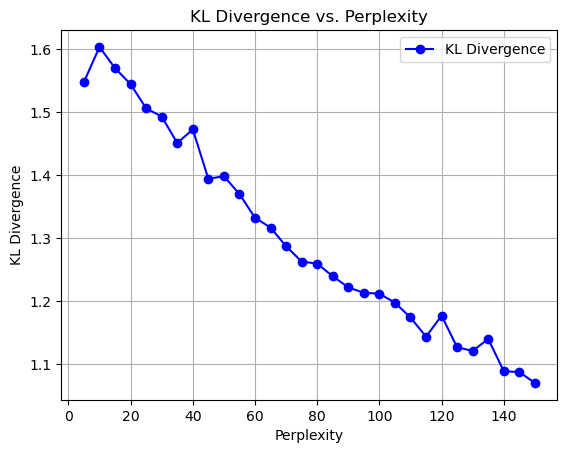

In [801]:
plot_divergence(X_train, perp_ranges)

In [793]:
tsne = TSNE(n_components=3, learning_rate='auto', init='random', perplexity= 50)
X_transformed = tsne.fit_transform(X_train)  

# Access the KL divergence
kl_divergence = tsne.kl_divergence_
print(f"Final KL Divergence: {kl_divergence:.4f}")

Final KL Divergence: 1.4182


In [163]:
from mpl_toolkits.mplot3d import Axes3D  # For 3D plotting

In [164]:
def tsne_plot_rotate(data, labels, elev=30, azim=45):
    fig = plt.figure(figsize=(10, 7))
    ax = fig.add_subplot(111, projection='3d')
    
    # Use labels to color the points
    scatter = ax.scatter(data[:, 0], data[:, 1], data[:, 2], 
                         c=labels, cmap='coolwarm', marker='o', alpha=0.7)
    
    # Add color bar to show binary label distinction
    cbar = plt.colorbar(scatter, ax=ax, pad=0.1)
    cbar.set_label('Binary Labels')

    # Set axis labels
    ax.set_xlabel('t-SNE Dimension 1')
    ax.set_ylabel('t-SNE Dimension 2')
    ax.set_zlabel('t-SNE Dimension 3')
    
    # Set rotation angles
    ax.view_init(elev=elev, azim=azim)

    plt.title('3D Visualization of t-SNE Results with True Binary Labels')
    plt.show()

In [165]:
def tsne_plotting(data):
    fig = plt.figure(figsize=(10, 7))
    ax = fig.add_subplot(111, projection='3d')
    
    ax.scatter(data[:, 0], data[:, 1], data[:, 2], 
           c='blue', marker='o', alpha=0.7)

    ax.set_xlabel('t-SNE Dimension 1')
    ax.set_ylabel('t-SNE Dimension 2')
    ax.set_zlabel('t-SNE Dimension 3')
    plt.title('3D Visualization of t-SNE Results')
    plt.show()

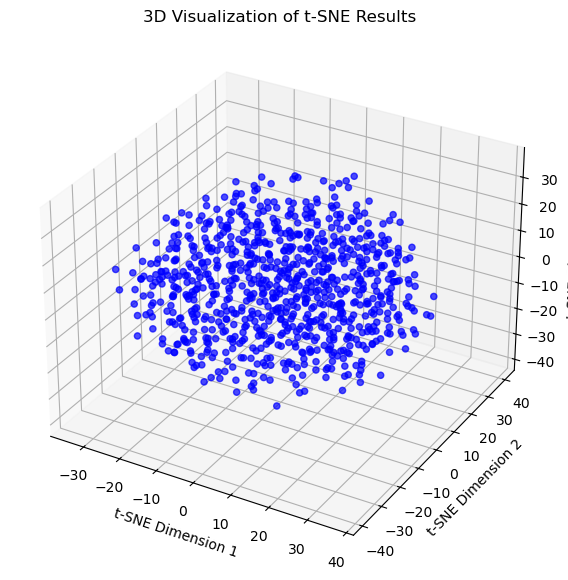

In [166]:
tsne_plotting(X_transformed)

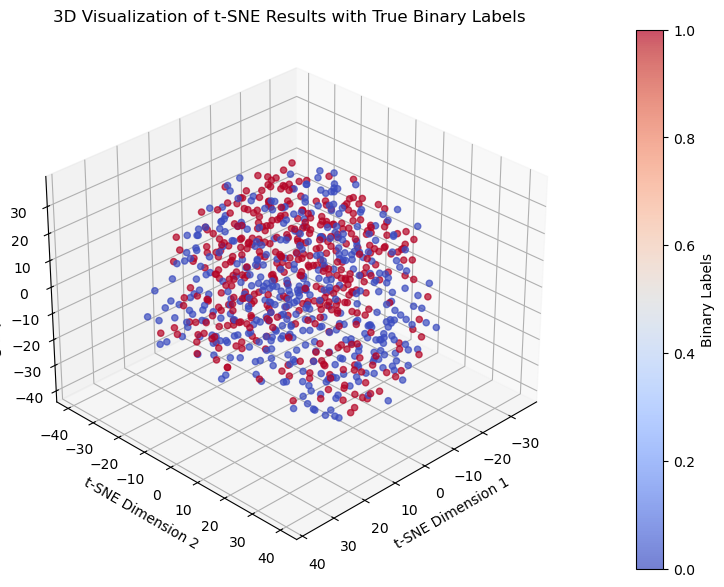

In [167]:
 tsne_plot_rotate(X_transformed, y_train, elev=30, azim=45)

t-SNE: Diabetes Data

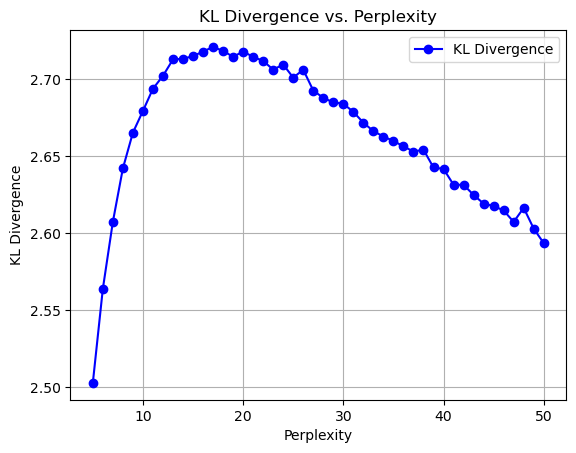

In [264]:
plot_divergence(X_train_diab, perp_ranges)

In [265]:
perp_ranges_diab = np.arange(1,6,1)

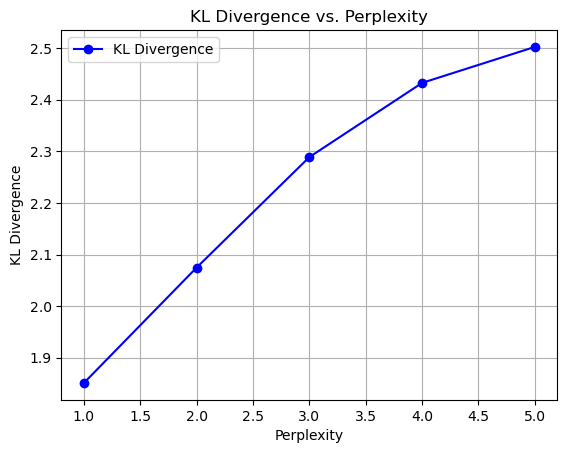

In [266]:
plot_divergence(X_train_diab, perp_ranges_diab)

In [267]:
tsne = TSNE(n_components=3, learning_rate='auto', init='random', perplexity= 1)
X_tsne_diab = tsne.fit_transform(X_train_diab)  

# Access the KL divergence
kl_divergence = tsne.kl_divergence_
print(f"Final KL Divergence: {kl_divergence:.4f}")

Final KL Divergence: 1.8528


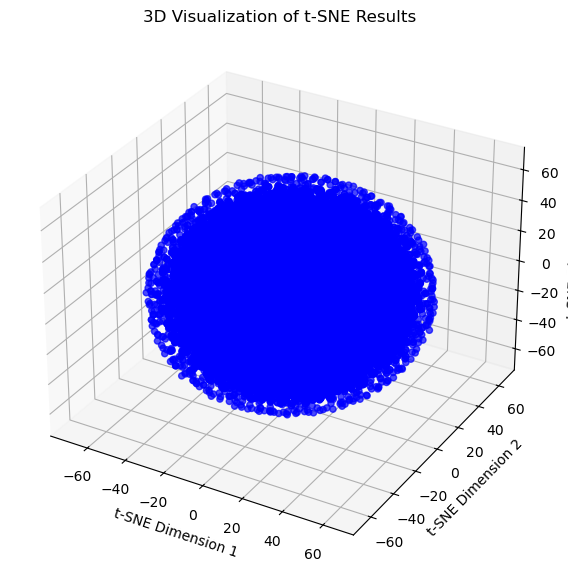

In [268]:
tsne_plotting(X_tsne_diab)

# Part III - Clustering the data with reduced dimensions

# PCA-KMeans

In [269]:
X_pca.shape

(837, 11)

In [270]:
clusters = np.arange(2,21)

In [271]:
seeds = np.arange(0,6)
results_kmeans_pca = evaluate_k_means_over_components(data=X_pca, labels=y_train, clusters=clusters, seeds = seeds, 
                                                      init_name="k-means++" )

In [272]:
results_kmeans_random_pca = evaluate_k_means_over_components(data=X_pca, labels=y_train, clusters=clusters,
                                                             seeds = seeds, init_name="random" )

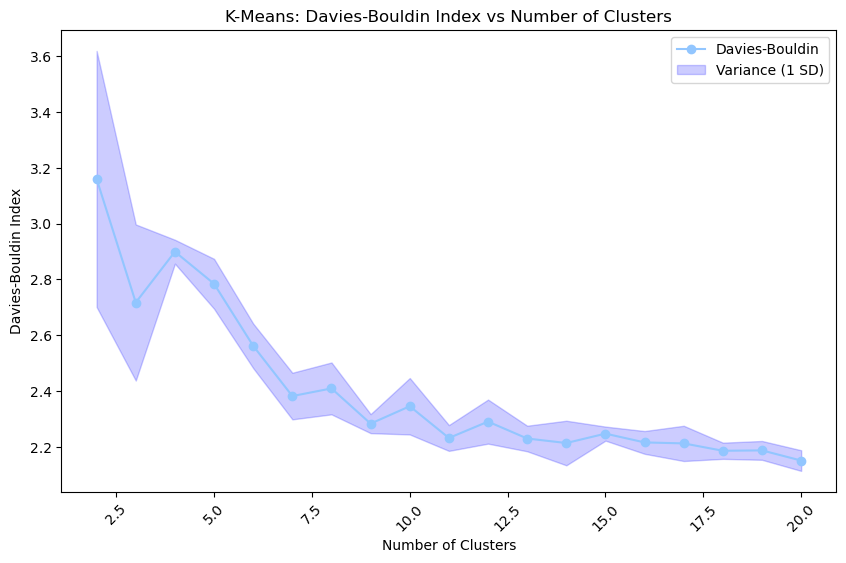

In [273]:
plot_DBI(clusters,results_kmeans_pca)

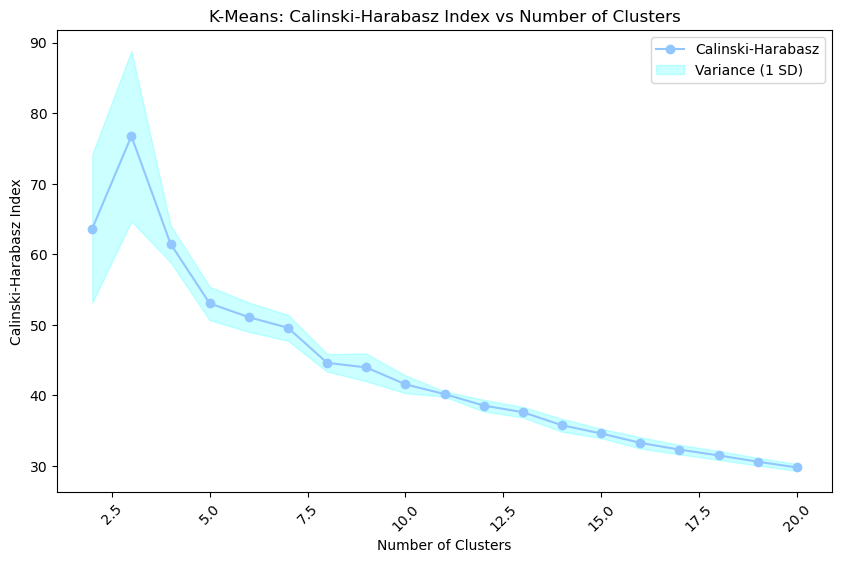

In [274]:
plot_CHI(clusters,results_kmeans_pca)

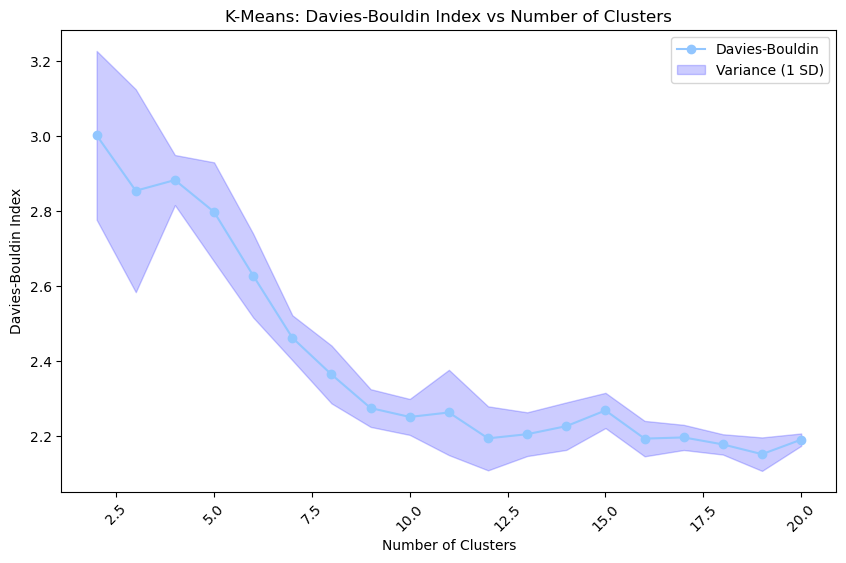

In [275]:
plot_DBI(clusters,results_kmeans_random_pca)

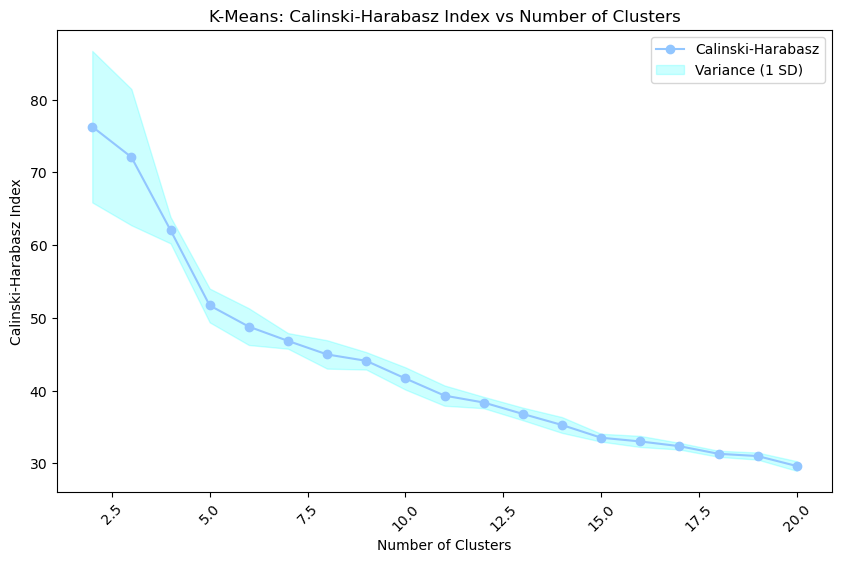

In [276]:
plot_CHI(clusters,results_kmeans_random_pca)

In [277]:
results_kmeans_random_pca[results_kmeans_random_pca['Clusters'].isin([2,3,12])]

,Clusters,Initialization,Fit Time (Avg),Fit Time (Var),Inertia (Avg),Inertia (Var),Homogeneity (Avg),Homogeneity (Var),Completeness (Avg),Completeness (Var),...,ARI (Avg),ARI (Var),AMI (Avg),AMI (Var),Silhouette (Avg),Silhouette (Var),Davies-Bouldin (Avg),Davies-Bouldin (Var),Calinski-Harabasz (Avg),Calinski-Harabasz (Var)
0,2,random,0.031467,9.802222e-06,8555.542101,9442.425036,0.012983,0.000050,0.014983,0.000067,...,0.01435,0.000092,0.012900,0.000055,0.096333,0.000207,3.001633,0.050617,76.300067,108.590927
1,3,random,0.031417,2.805556e-08,7915.200744,525.092613,0.045683,0.000091,0.030117,0.000040,...,0.04210,0.000094,0.035000,0.000058,0.092783,0.000212,2.853917,0.073092,72.108917,87.848327
10,12,random,0.036017,7.298472e-05,6017.722042,619.636638,0.108150,0.000115,0.030467,0.000009,...,0.02355,0.000006,0.043533,0.000022,0.061700,0.000004,2.194000,0.007279,38.361867,0.615448


In [278]:
results_kmeans_pca[results_kmeans_pca['Clusters'].isin([2,3,9,12])]

,Clusters,Initialization,Fit Time (Avg),Fit Time (Var),Inertia (Avg),Inertia (Var),Homogeneity (Avg),Homogeneity (Var),Completeness (Avg),Completeness (Var),...,ARI (Avg),ARI (Var),AMI (Avg),AMI (Var),Silhouette (Avg),Silhouette (Var),Davies-Bouldin (Avg),Davies-Bouldin (Var),Calinski-Harabasz (Avg),Calinski-Harabasz (Var)
0,2,k-means++,0.040883,0.000068,8516.497287,9643.099022,0.017233,0.000113,0.021067,0.000142,...,0.017583,0.000165,0.017917,0.000125,0.09195,0.000529,3.159467,0.210143,63.620150,110.533487
1,3,k-means++,0.037700,0.000049,7935.989372,8591.849485,0.050967,0.000020,0.033417,0.000007,...,0.046333,0.000010,0.039033,0.000011,0.09945,0.000332,2.717217,0.078067,76.733783,146.005775
7,9,k-means++,0.034100,0.000035,6411.830168,147.589669,0.104467,0.000707,0.033333,0.000073,...,0.031267,0.000074,0.047350,0.000168,0.06360,0.000038,2.283583,0.001159,43.927933,3.845704
10,12,k-means++,0.035233,0.000004,6044.509746,288.091079,0.108833,0.000061,0.030583,0.000005,...,0.023450,0.000006,0.043750,0.000012,0.06060,0.000009,2.290833,0.006218,38.518217,0.678764


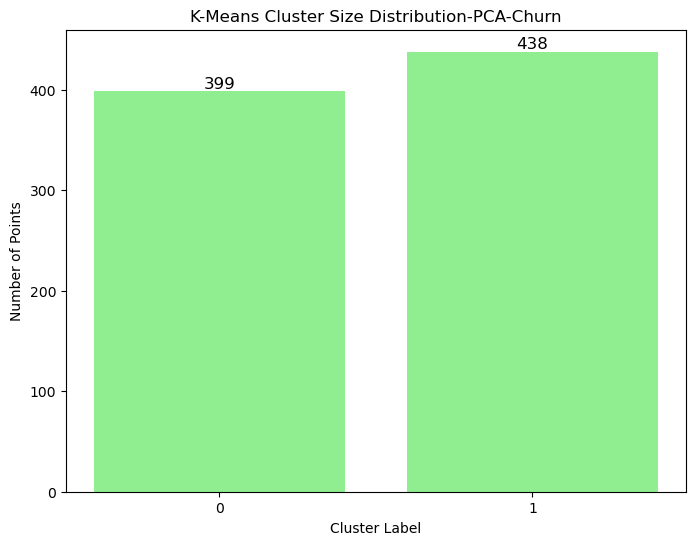

In [279]:
# Fit the best KMeans model 
kmeans_pca = KMeans(init='random', n_clusters=2, n_init=4, random_state=42)
kmeans_pca.fit(X_pca)

# Get cluster labels
cluster_labels = kmeans_pca.labels_

# Create a DataFrame to count the number of points in each cluster
cluster_counts = pd.Series(cluster_labels).value_counts().sort_index()

# Plot Cluster Size Distribution for GMM
plt.figure(figsize=(8, 6))
bars = plt.bar(cluster_counts.index, cluster_counts.values, color='lightgreen')

# Add annotations (number of data points) on top of each bar
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, int(yval), 
             ha='center', va='bottom', fontsize=12)

# Customize the plot
plt.title('K-Means Cluster Size Distribution-PCA-Churn')
plt.xlabel('Cluster Label')
plt.ylabel('Number of Points')
plt.xticks(cluster_counts.index)
plt.grid(False)
plt.show()

In [280]:
# Fit KMeans and get predictions
pred_pca = kmeans_pca.fit_predict(X_pca)

# Create a DataFrame with actual labels and predicted clusters
df_pca = pd.DataFrame({'TrueLabel': y_train, 'Cluster': pred_pca})

# Dynamically find unique clusters
unique_clusters = df_pca['Cluster'].unique()

# Map each cluster to the most common true label
cluster_label_map = {}
for cluster in unique_clusters:
    # Get the most common label for the current cluster
    common_label = df_pca[df_pca['Cluster'] == cluster]['TrueLabel'].mode()[0]
    cluster_label_map[cluster] = common_label

# Map the predicted clusters to the corresponding labels using the mapping
mapped_labels = [cluster_label_map[cluster] for cluster in pred_pca]

# Calculate accuracy
accuracy = accuracy_score(y_train, mapped_labels)
print(f"Accuracy: {accuracy * 100:.2f}%")

Accuracy: 58.66%


In [281]:
# Get distances to nearest centroid and calculate compactness
_, distances_to_centroids = pairwise_distances_argmin_min(X_pca, kmeans_pca.cluster_centers_)
compactness = [np.mean(distances_to_centroids[kmeans_pca.labels_ == i]) for i in range(kmeans_pca.n_clusters)]
np.round(compactness,2)

array([3.47, 3.61])

In [282]:
wcss_pca = np.round(kmeans_pca.inertia_,2)
wcss_pca

11116.47

In [283]:
# ## calculate inter cluster distance 
inter_cluster_distances_KMpca = np.round(cdist(kmeans_pca.cluster_centers_, kmeans_pca.cluster_centers_),2)
inter_cluster_distances_KMpca

array([[0.  , 2.56],
       [2.56, 0.  ]])

In [284]:
## 2 cluster on 3 principal components for visualization 
kmeans2_pca = KMeans(init='random', n_clusters=2, n_init=4, random_state=42)
kmeans2_pca.fit(X_3pca)

# Fit KMeans and get predictions
pred_3pca = kmeans2_pca.fit_predict(X_3pca)

In [285]:
def plot_clusters(colors, clusters, model, data, pred_labels):
    colors = colors
    # Plotting
    fig = plt.figure(figsize=(10, 8))
    ax = fig.add_subplot(111, projection='3d')

    # Scatter plot for each cluster
    for cluster in range(clusters):
        cluster_data = data[pred_labels == cluster]
        ax.scatter(cluster_data[:, 0], cluster_data[:, 1], cluster_data[:, 2], 
               color=colors[cluster], label=f'Cluster {cluster + 1}', s=30)

    # Plotting centroids
    centroids = model.cluster_centers_
    ax.scatter(centroids[:, 0], centroids[:, 1], centroids[:, 2], 
           color='black', marker='X', s=100, label='Centroids')

    # Labeling the plot
    ax.set_title(f"K-Means Clustering with {clusters} Clusters on 3 Principal Components")
    ax.set_xlabel("PCA Component 1")
    ax.set_ylabel("PCA Component 2")
    ax.set_zlabel("PCA Component 3")
    ax.legend()

    plt.show()

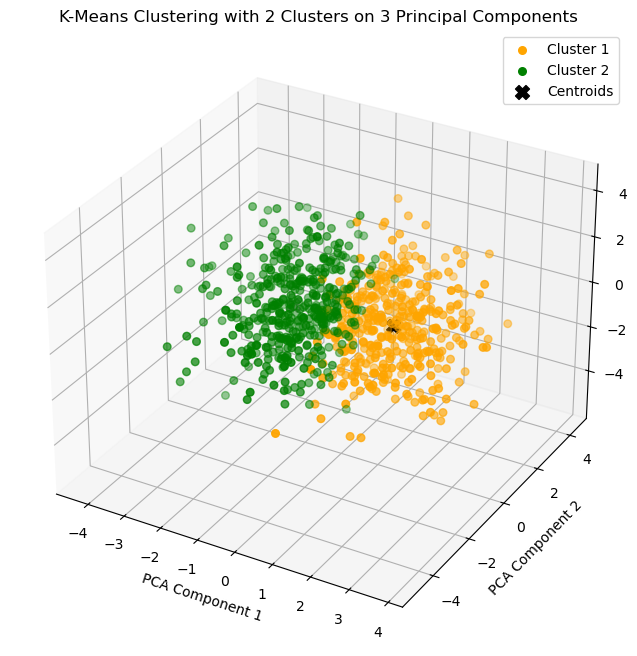

In [286]:
colors2 = ['orange', 'green']
plot_clusters(colors2, 2, kmeans2_pca, X_3pca, pred_3pca )

In [287]:
## 2 cluster on 3 principal components for visualization 
kmeans3_pca = KMeans(init='k-means++', n_clusters=3, n_init=4, random_state=42)
kmeans3_pca.fit(X_3pca)

# Fit KMeans and get predictions
pred3_3pca = kmeans3_pca.fit_predict(X_3pca)

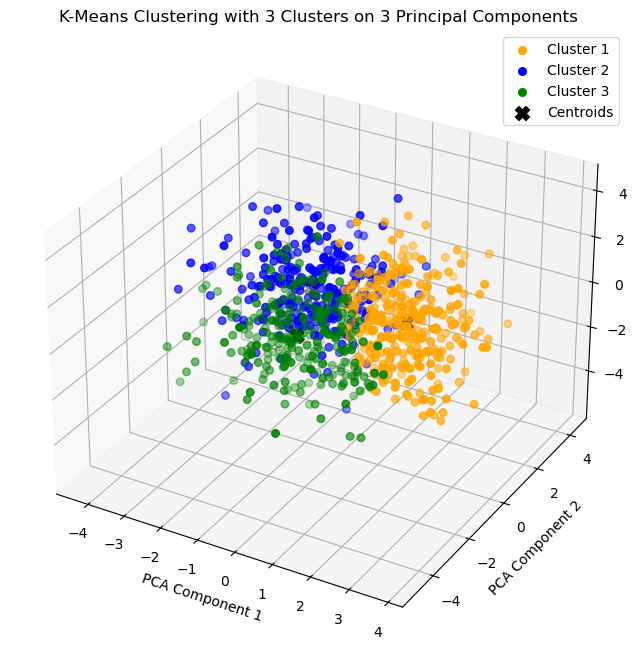

In [288]:
colors3 = ['orange', 'blue','green']
plot_clusters(colors3, 3, kmeans3_pca, X_3pca, pred3_3pca )

Diabetes Data

In [289]:
results_kmeans_pca_diab = evaluate_k_means_over_components(data=X_pca_diab, labels=y_train_diab, clusters=clusters, 
                                                           seeds = seeds,  init_name="k-means++" )
results_kmeans_random_pca_diab = evaluate_k_means_over_components(data=X_pca_diab, labels=y_train_diab, clusters=clusters,
                                                             seeds = seeds, init_name="random" )

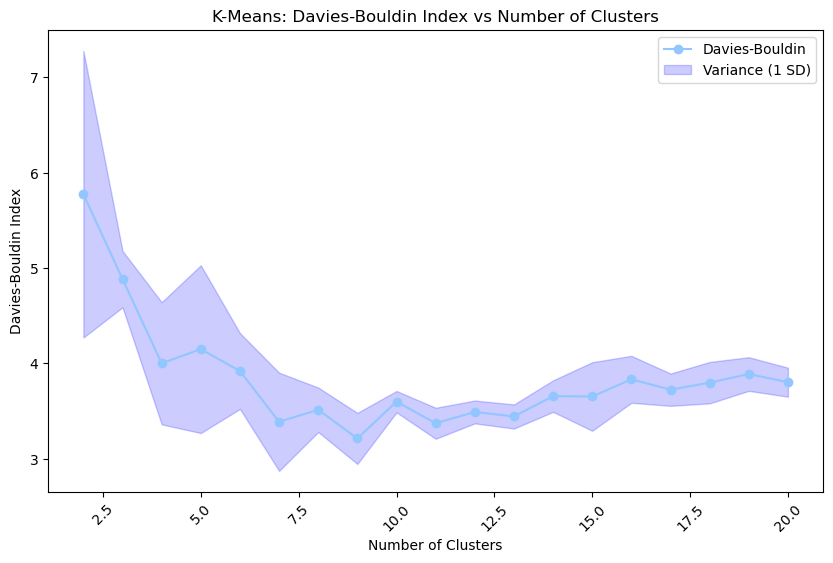

In [290]:
plot_DBI(clusters,results_kmeans_pca_diab)

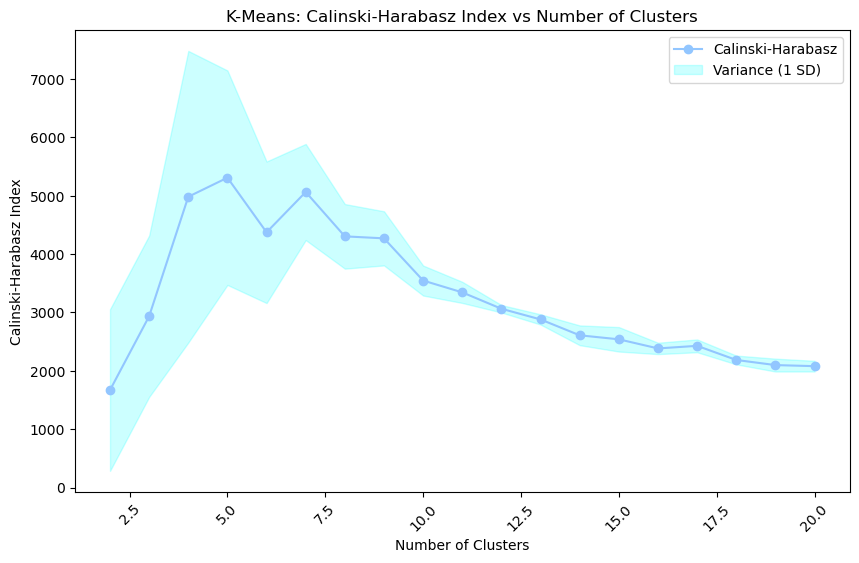

In [291]:
plot_CHI(clusters,results_kmeans_pca_diab)

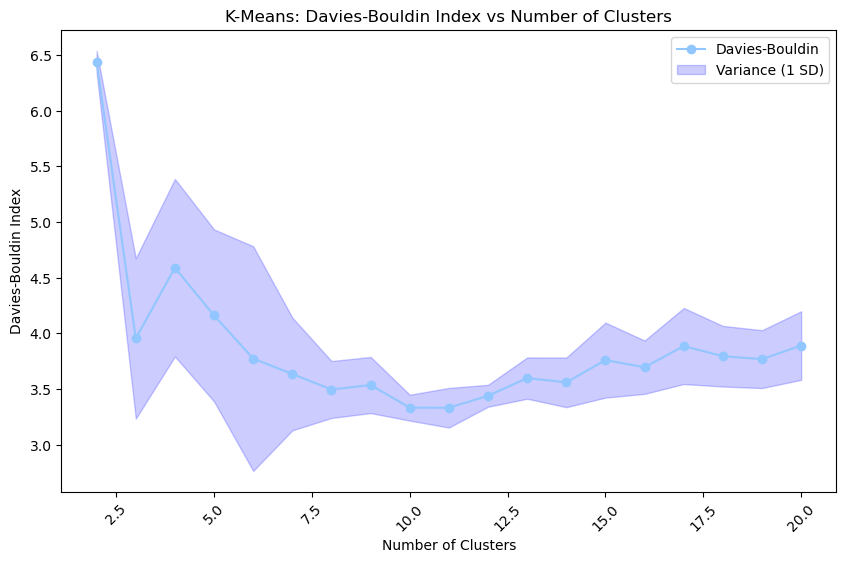

In [292]:
plot_DBI(clusters,results_kmeans_random_pca_diab)

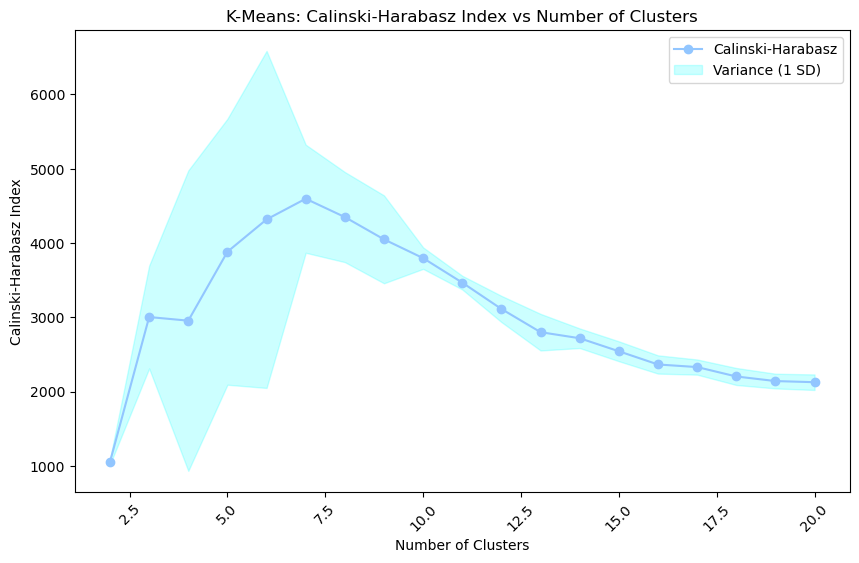

In [293]:
plot_CHI(clusters,results_kmeans_random_pca_diab)

In [294]:
results_kmeans_pca_diab[results_kmeans_pca_diab['Clusters'].isin([5, 6, 9])]

,Clusters,Initialization,Fit Time (Avg),Fit Time (Var),Inertia (Avg),Inertia (Var),Homogeneity (Avg),Homogeneity (Var),Completeness (Avg),Completeness (Var),...,ARI (Avg),ARI (Var),AMI (Avg),AMI (Var),Silhouette (Avg),Silhouette (Var),Davies-Bouldin (Avg),Davies-Bouldin (Var),Calinski-Harabasz (Avg),Calinski-Harabasz (Var)
3,5,k-means++,0.145900,0.000227,414404.536300,3.614376e+07,0.065817,0.000677,0.029967,0.000143,...,0.028083,0.000115,0.041133,0.000269,0.057933,0.000683,4.148517,0.774713,5307.319733,3.374259e+06
4,6,k-means++,0.145567,0.000269,396916.289412,2.275702e+07,0.068900,0.000508,0.027650,0.000075,...,0.025583,0.000088,0.039433,0.000157,0.045233,0.000327,3.919050,0.158301,4372.098633,1.470249e+06
7,9,k-means++,0.232633,0.000599,358331.568919,4.876562e+05,0.083733,0.000035,0.026917,0.000003,...,0.022250,0.000004,0.040667,0.000008,0.038367,0.000087,3.211950,0.071826,4268.263983,2.150600e+05


In [295]:
results_kmeans_random_pca_diab[results_kmeans_random_pca_diab['Clusters'].isin([4, 5, 9])]

,Clusters,Initialization,Fit Time (Avg),Fit Time (Var),Inertia (Avg),Inertia (Var),Homogeneity (Avg),Homogeneity (Var),Completeness (Avg),Completeness (Var),...,ARI (Avg),ARI (Var),AMI (Avg),AMI (Var),Silhouette (Avg),Silhouette (Var),Davies-Bouldin (Avg),Davies-Bouldin (Var),Calinski-Harabasz (Avg),Calinski-Harabasz (Var)
2,4,random,0.085050,0.000615,434593.686497,1.273186e+07,0.027717,0.000709,0.015367,0.000217,...,0.017667,0.000336,0.019733,0.000360,0.029567,0.000508,4.589617,0.634507,2953.792283,4.088827e+06
3,5,random,0.091767,0.000372,415026.984934,2.728796e+07,0.043633,0.000892,0.019750,0.000182,...,0.021217,0.000186,0.027183,0.000345,0.041967,0.000643,4.161733,0.595825,3881.292450,3.203369e+06
7,9,random,0.157833,0.000571,358796.551271,5.326651e+06,0.082300,0.000057,0.026383,0.000005,...,0.021817,0.000008,0.039917,0.000013,0.025917,0.000359,3.537183,0.063471,4048.166350,3.498068e+05


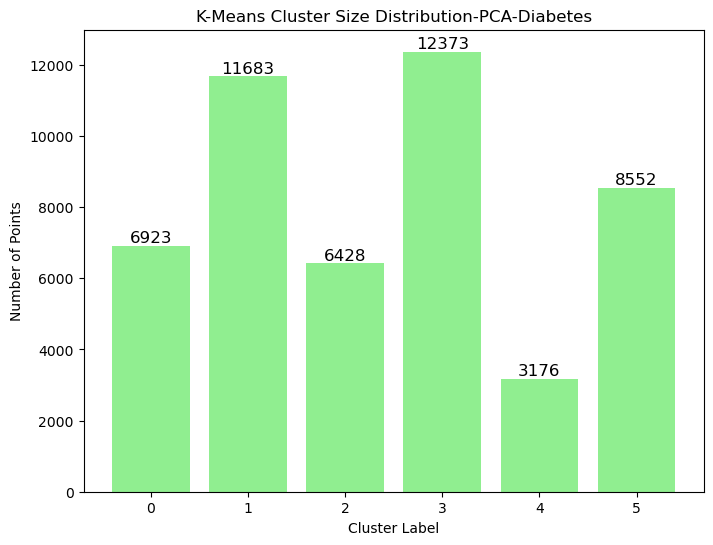

In [296]:
kmeans_pca_diab = KMeans(init='k-means++', n_clusters=6, n_init=4, random_state=42)
kmeans_pca_diab.fit(X_pca_diab)

# Get cluster labels
cluster_labels = kmeans_pca_diab.labels_

# Create a DataFrame to count the number of points in each cluster
cluster_counts = pd.Series(cluster_labels).value_counts().sort_index()

# Plot Cluster Size Distribution for GMM
plt.figure(figsize=(8, 6))
bars = plt.bar(cluster_counts.index, cluster_counts.values, color='lightgreen')

# Add annotations (number of data points) on top of each bar
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, int(yval), 
             ha='center', va='bottom', fontsize=12)

# Customize the plot
plt.title('K-Means Cluster Size Distribution-PCA-Diabetes')
plt.xlabel('Cluster Label')
plt.ylabel('Number of Points')
plt.xticks(cluster_counts.index)
plt.grid(False)
plt.show()

In [297]:
X_kmeans_pca_diab = kmeans_pca_diab.fit_transform(X_pca_diab)

In [298]:
# Get distances to nearest centroid and calculate compactness 
_, distances_to_centroids = pairwise_distances_argmin_min(X_pca_diab, kmeans_pca_diab.cluster_centers_)
compactness = [np.mean(distances_to_centroids[kmeans_pca_diab.labels_ == i]) for i in range(kmeans_pca_diab.n_clusters)]
np.round(compactness,2)

array([3.39, 2.51, 2.52, 2.52, 3.26, 2.82])

In [299]:
wcss_pca_diab =np.round(kmeans_pca_diab.inertia_,2)
wcss_pca_diab

403478.51

In [300]:
## calculate inter cluster distance 
inter_cluster_distances_pca_diab =np.round(cdist(kmeans_pca_diab.cluster_centers_, kmeans_pca_diab.cluster_centers_),2)
inter_cluster_distances_pca_diab

array([[0.  , 5.47, 6.74, 4.83, 4.79, 3.74],
       [5.47, 0.  , 6.93, 3.06, 7.97, 3.61],
       [6.74, 6.93, 0.  , 3.91, 4.1 , 8.42],
       [4.83, 3.06, 3.91, 0.  , 5.51, 5.09],
       [4.79, 7.97, 4.1 , 5.51, 0.  , 7.59],
       [3.74, 3.61, 8.42, 5.09, 7.59, 0.  ]])

In [301]:
# set k =2 for diabetes kmeans_ica
kmeans2_pca_diab = KMeans(init='random', n_clusters=2, n_init=4, random_state=42)
kmeans2_pca_diab.fit(X_pca_diab)

# Fit KMeans and get predictions
pred_pca_diab = kmeans2_pca_diab.fit_predict(X_pca_diab)

# Create a DataFrame with actual labels and predicted clusters
df_pca_diab = pd.DataFrame({'TrueLabel': y_train_diab, 'Cluster': pred_pca_diab})

# Dynamically find unique clusters
unique_clusters_diab = df_pca_diab['Cluster'].unique()

# Map each cluster to the most common true label
cluster_label_map = {}
for cluster in unique_clusters_diab:
    # Get the most common label for the current cluster
    common_label = df_pca_diab[df_pca_diab['Cluster'] == cluster]['TrueLabel'].mode()[0]
    cluster_label_map[cluster] = common_label

# Map the predicted clusters to the corresponding labels using the mapping
mapped_labels = [cluster_label_map[cluster] for cluster in pred_pca_diab]

# Calculate accuracy
accuracy = accuracy_score(y_train_diab, mapped_labels)
print(f"Accuracy: {accuracy * 100:.2f}%")

Accuracy: 63.30%


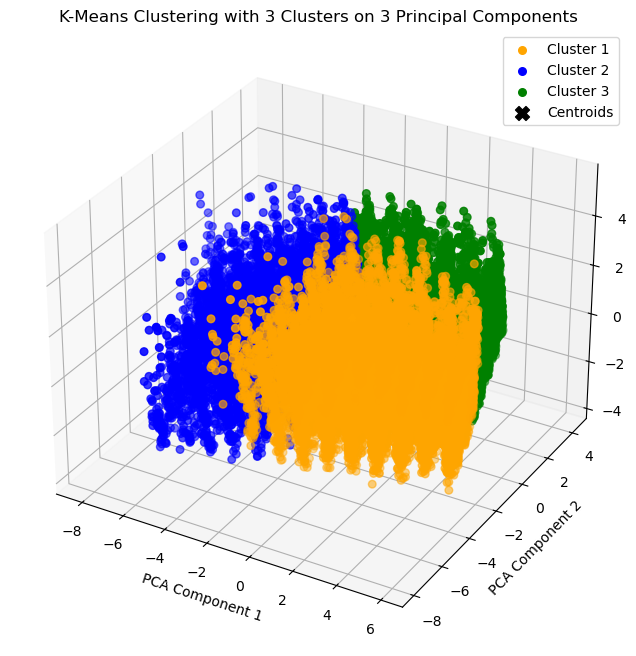

In [302]:
# set k =2 for diabetes kmeans_ica
kmeans2_pca_diab = KMeans(init='random', n_clusters=3, n_init=4, random_state=42)
kmeans2_pca_diab.fit(X_3pca_diab)

# Fit KMeans and get predictions
pred_pca_diab = kmeans2_pca_diab.fit_predict(X_3pca_diab)

plot_clusters(colors3, 3, kmeans2_pca_diab, X_3pca_diab, pred_pca_diab )

# ICA-KMeans

In [303]:
X_churn_ica.shape

(837, 14)

In [304]:
clusters = np.arange(2,21)
results_kmeans_ica = evaluate_k_means_over_components(data=X_churn_ica, labels=y_train, clusters=clusters, 
                                                      seeds = seeds, init_name="k-means++" )

In [305]:
results_kmeans_random_ica = evaluate_k_means_over_components(data=X_churn_ica, labels=y_train, 
                                                             clusters=clusters,  seeds = seeds, init_name="random" )

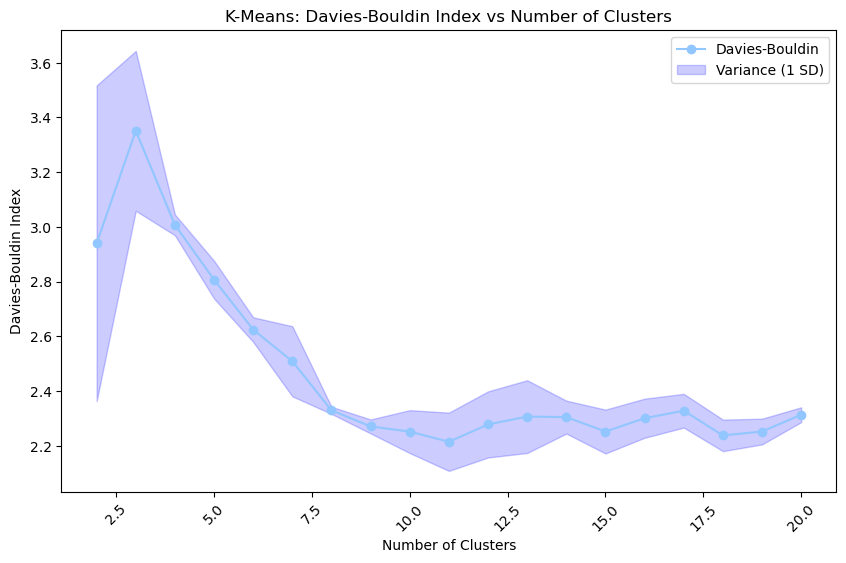

In [306]:
plot_DBI(clusters, results_kmeans_ica)

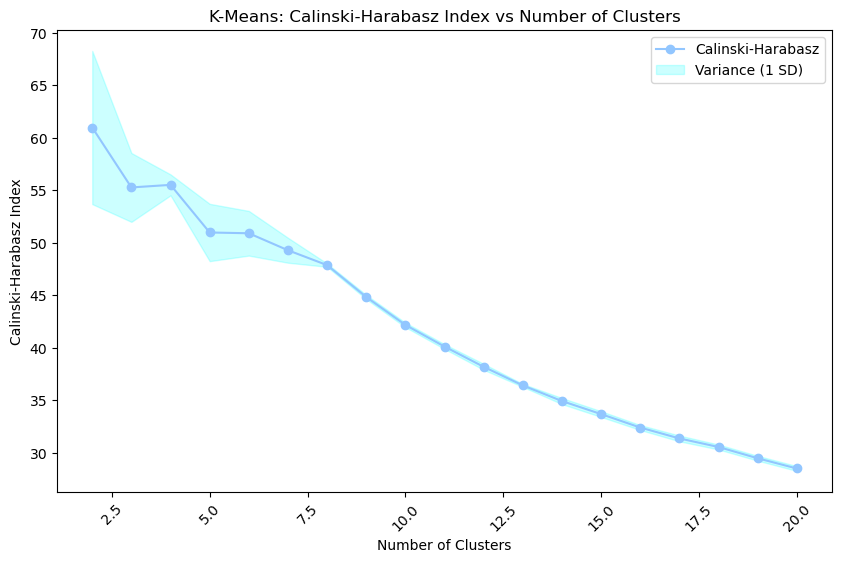

In [307]:
plot_CHI(clusters, results_kmeans_ica)

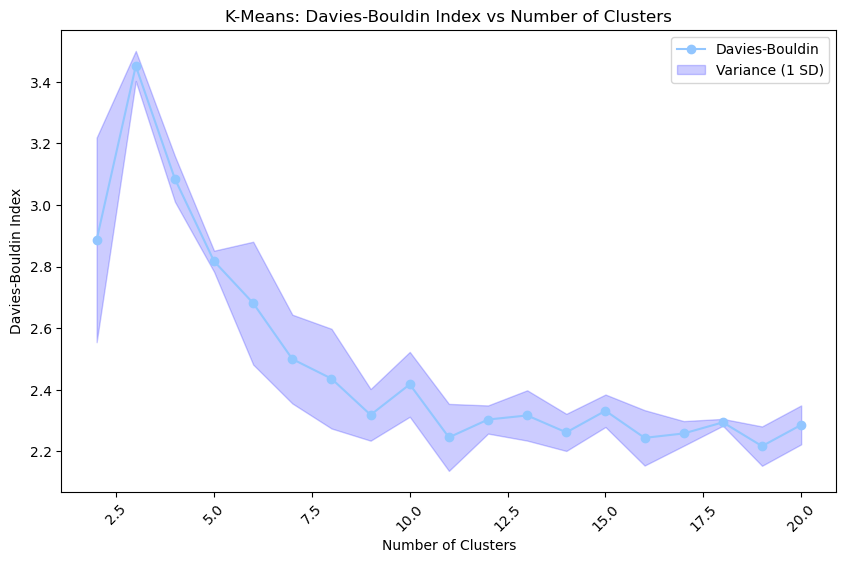

In [308]:
plot_DBI(clusters, results_kmeans_random_ica)

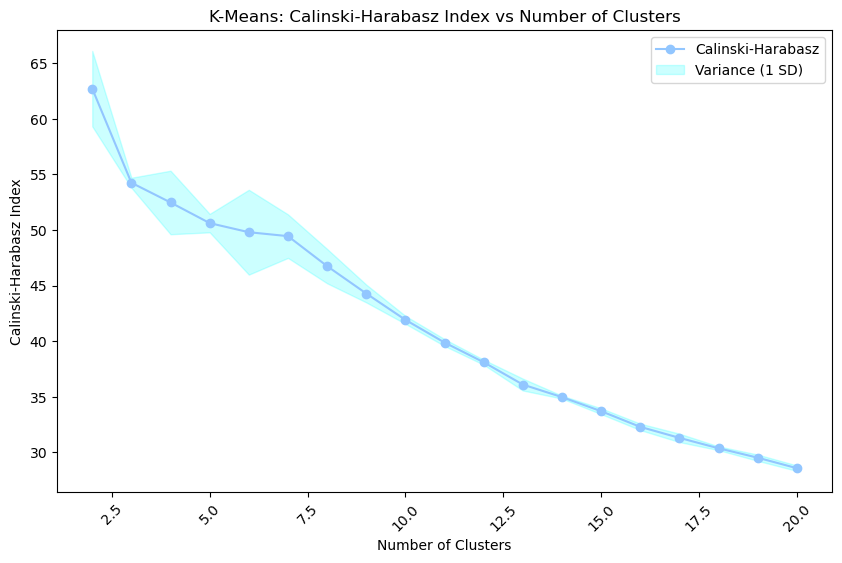

In [309]:
plot_CHI(clusters, results_kmeans_random_ica)

In [310]:
results_kmeans_ica[results_kmeans_ica['Clusters'].isin([2, 6, 9])]

,Clusters,Initialization,Fit Time (Avg),Fit Time (Var),Inertia (Avg),Inertia (Var),Homogeneity (Avg),Homogeneity (Var),Completeness (Avg),Completeness (Var),...,ARI (Avg),ARI (Var),AMI (Avg),AMI (Var),Silhouette (Avg),Silhouette (Var),Davies-Bouldin (Avg),Davies-Bouldin (Var),Calinski-Harabasz (Avg),Calinski-Harabasz (Var)
0,2,k-means++,0.036667,0.000090,10921.339449,8136.355750,0.044717,0.000688,0.067667,0.001632,...,0.0322,0.000348,0.052917,0.001010,0.114617,0.000908,2.939733,0.333094,60.969600,53.177127
4,6,k-means++,0.039500,0.000067,8971.368014,7791.971901,0.142600,0.002161,0.057633,0.000342,...,0.0635,0.000809,0.079800,0.000704,0.074833,0.000025,2.624317,0.002026,50.903917,4.522861
7,9,k-means++,0.038117,0.000050,8176.069009,118.666128,0.183850,0.000348,0.058800,0.000034,...,0.0565,0.000023,0.086017,0.000080,0.070983,0.000004,2.270450,0.000655,44.837200,0.039091


In [311]:
results_kmeans_random_ica[results_kmeans_random_ica['Clusters'].isin([2,9])]

,Clusters,Initialization,Fit Time (Avg),Fit Time (Var),Inertia (Avg),Inertia (Var),Homogeneity (Avg),Homogeneity (Var),Completeness (Avg),Completeness (Var),...,ARI (Avg),ARI (Var),AMI (Avg),AMI (Var),Silhouette (Avg),Silhouette (Var),Davies-Bouldin (Avg),Davies-Bouldin (Var),Calinski-Harabasz (Avg),Calinski-Harabasz (Var)
0,2,random,0.030333,0.000012,10899.558641,1722.115791,0.038017,0.000632,0.056683,0.001558,...,0.028200,0.000289,0.044533,0.000946,0.128933,0.000286,2.886617,0.110499,62.71260,11.524656
7,9,random,0.034000,0.000033,8206.999242,1996.120552,0.171083,0.001823,0.054900,0.000182,...,0.053783,0.000169,0.080017,0.000424,0.070483,0.000002,2.317983,0.007039,44.28225,0.641660


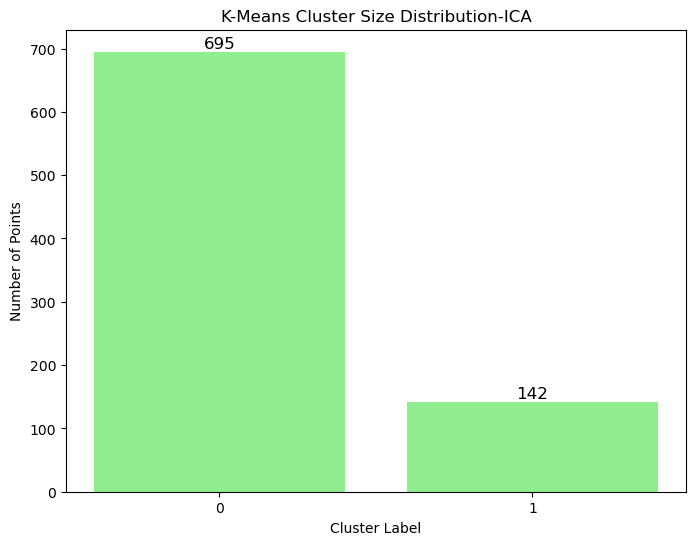

In [312]:
# Fit the best KMeans model 
kmeans_ica = KMeans(init='k-means++', n_clusters=2, n_init=4, random_state=42)
kmeans_ica.fit(X_churn_ica)

# Get cluster labels
cluster_labels = kmeans_ica.labels_

# Create a DataFrame to count the number of points in each cluster
cluster_counts = pd.Series(cluster_labels).value_counts().sort_index()

# Plot Cluster Size Distribution for GMM
plt.figure(figsize=(8, 6))
bars = plt.bar(cluster_counts.index, cluster_counts.values, color='lightgreen')

# Add annotations (number of data points) on top of each bar
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, int(yval), 
             ha='center', va='bottom', fontsize=12)

# Customize the plot
plt.title('K-Means Cluster Size Distribution-ICA')
plt.xlabel('Cluster Label')
plt.ylabel('Number of Points')
plt.xticks(cluster_counts.index)
plt.grid(False)
plt.show()

In [313]:
# Fit KMeans and get predictions
pred_ica = kmeans_ica.fit_predict(X_churn_ica)

# Create a DataFrame with actual labels and predicted clusters
df_ica = pd.DataFrame({'TrueLabel': y_train, 'Cluster': pred_ica})

# Dynamically find unique clusters
unique_clusters = df_ica['Cluster'].unique()

# Map each cluster to the most common true label
cluster_label_map = {}
for cluster in unique_clusters:
    # Get the most common label for the current cluster
    common_label = df_ica[df_ica['Cluster'] == cluster]['TrueLabel'].mode()[0]
    cluster_label_map[cluster] = common_label

# Map the predicted clusters to the corresponding labels using the mapping
mapped_labels = [cluster_label_map[cluster] for cluster in pred_ica]

# Calculate accuracy
accuracy = accuracy_score(y_train, mapped_labels)
print(f"Accuracy: {accuracy * 100:.2f}%")

Accuracy: 60.69%


In [314]:
# Get distances to nearest centroid and calculate compactness 
_, distances_to_centroids = pairwise_distances_argmin_min(X_churn_ica, kmeans_ica.cluster_centers_)
compactness = [np.mean(distances_to_centroids[kmeans_ica.labels_ == i]) for i in range(kmeans_ica.n_clusters)]
np.round(compactness, 2)

array([3.51, 3.47])

In [315]:
wcss_ica = np.round(kmeans_ica.inertia_, 2)
wcss_ica

10881.0

In [316]:
## calculate inter cluster distance 
inter_cluster_distances_KMica = np.round(cdist(kmeans_ica.cluster_centers_, kmeans_ica.cluster_centers_), 2) 
inter_cluster_distances_KMica

array([[0.  , 2.66],
       [2.66, 0.  ]])

Diabetes Data

In [317]:
results_kmeans_ica_diab = evaluate_k_means_over_components(data=X_diab_ica, labels=y_train_diab, clusters=clusters, 
                                                      seeds = seeds, init_name="k-means++" )
results_kmeans_random_ica_diab = evaluate_k_means_over_components(data=X_diab_ica, labels=y_train_diab, 
                                                             clusters=clusters,  seeds = seeds, init_name="random" )

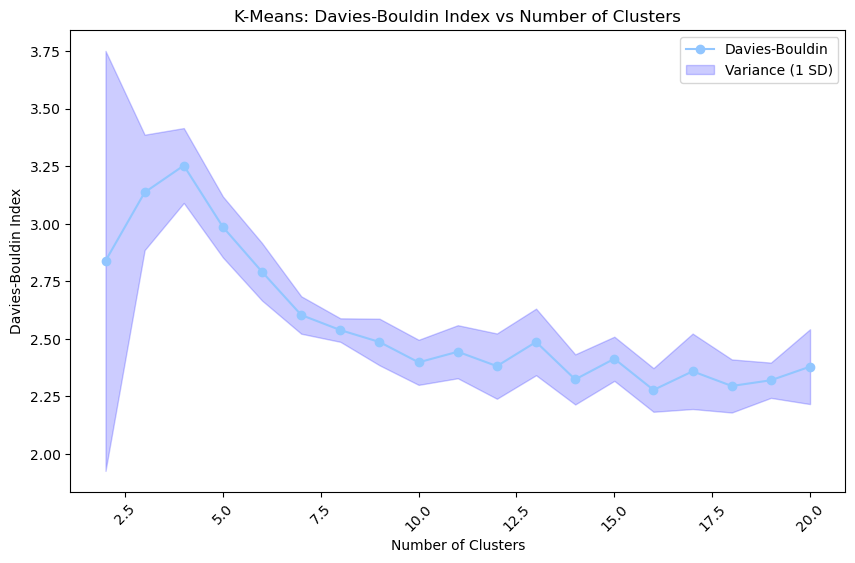

In [318]:
plot_DBI(clusters, results_kmeans_ica_diab) 

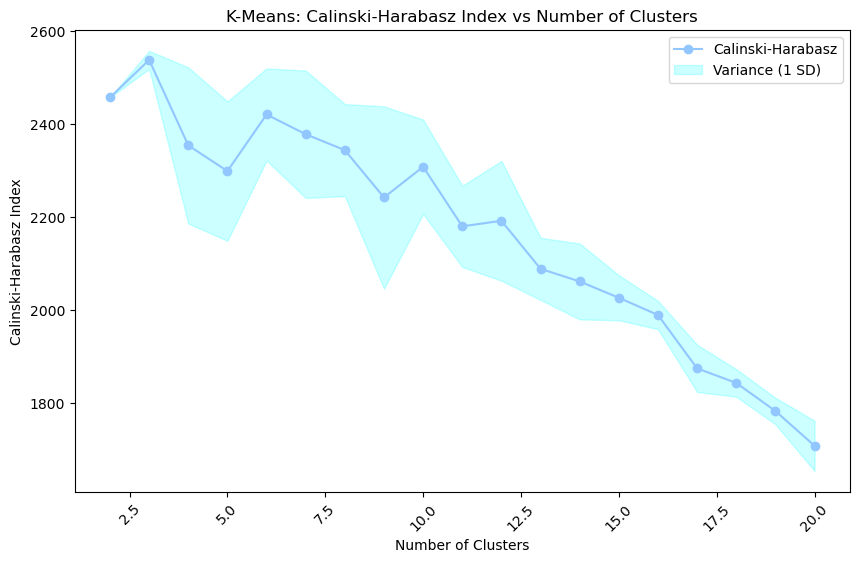

In [319]:
plot_CHI(clusters, results_kmeans_ica_diab)

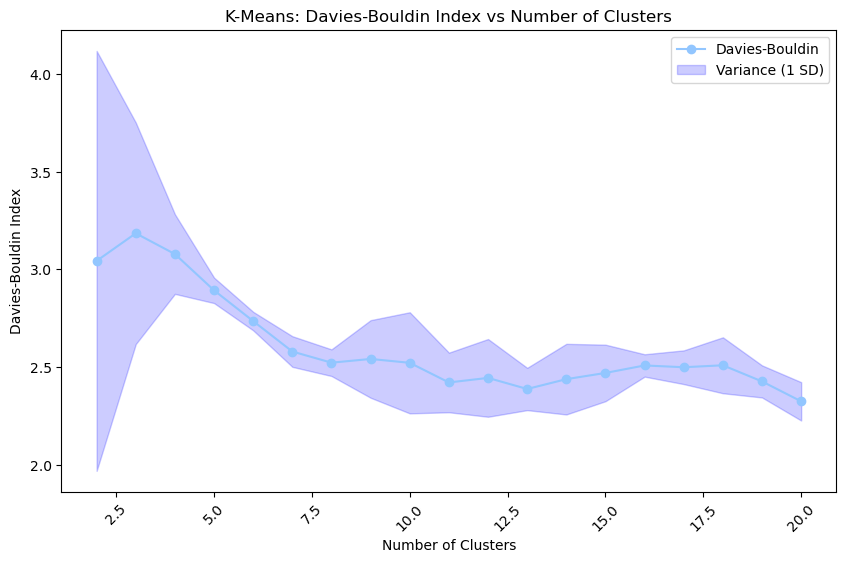

In [320]:
plot_DBI(clusters, results_kmeans_random_ica_diab)

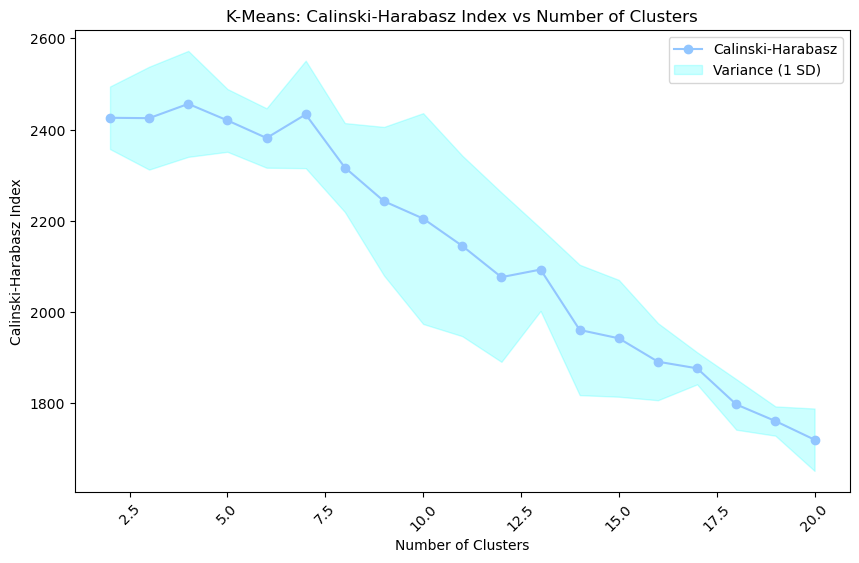

In [321]:
plot_CHI(clusters, results_kmeans_random_ica_diab)

In [322]:
results_kmeans_ica_diab[results_kmeans_ica_diab['Clusters'].isin([2, 11])]

,Clusters,Initialization,Fit Time (Avg),Fit Time (Var),Inertia (Avg),Inertia (Var),Homogeneity (Avg),Homogeneity (Var),Completeness (Avg),Completeness (Var),...,ARI (Avg),ARI (Var),AMI (Avg),AMI (Var),Silhouette (Avg),Silhouette (Var),Davies-Bouldin (Avg),Davies-Bouldin (Var),Calinski-Harabasz (Avg),Calinski-Harabasz (Var)
0,2,k-means++,0.062733,0.000118,982700.000000,2.936381e-20,0.025833,0.001255,0.031617,0.001250,...,0.030017,0.002204,0.027633,0.001271,0.16325,0.004389,2.837783,0.832750,2456.6500,0.000000
9,11,k-means++,0.210983,0.000248,714840.218864,7.596044e+07,0.093983,0.000152,0.028800,0.000013,...,0.025633,0.000019,0.044050,0.000030,0.05745,0.000018,2.443067,0.013287,2179.4619,7628.008035


In [323]:
results_kmeans_random_ica_diab[results_kmeans_random_ica_diab['Clusters'].isin([3, 15])]

,Clusters,Initialization,Fit Time (Avg),Fit Time (Var),Inertia (Avg),Inertia (Var),Homogeneity (Avg),Homogeneity (Var),Completeness (Avg),Completeness (Var),...,ARI (Avg),ARI (Var),AMI (Avg),AMI (Var),Silhouette (Avg),Silhouette (Var),Davies-Bouldin (Avg),Davies-Bouldin (Var),Calinski-Harabasz (Avg),Calinski-Harabasz (Var)
1,3,random,0.068467,0.000225,939142.883820,1.551944e+07,0.033683,0.001674,0.025850,0.000664,...,0.030217,0.001545,0.028667,0.001010,0.089567,0.002404,3.184983,0.322075,2425.104183,12750.044037
13,15,random,0.167783,0.000284,664594.676814,2.495909e+08,0.100800,0.000085,0.026983,0.000005,...,0.020433,0.000017,0.042483,0.000014,0.063300,0.000027,2.469700,0.020969,1941.807917,16449.075450


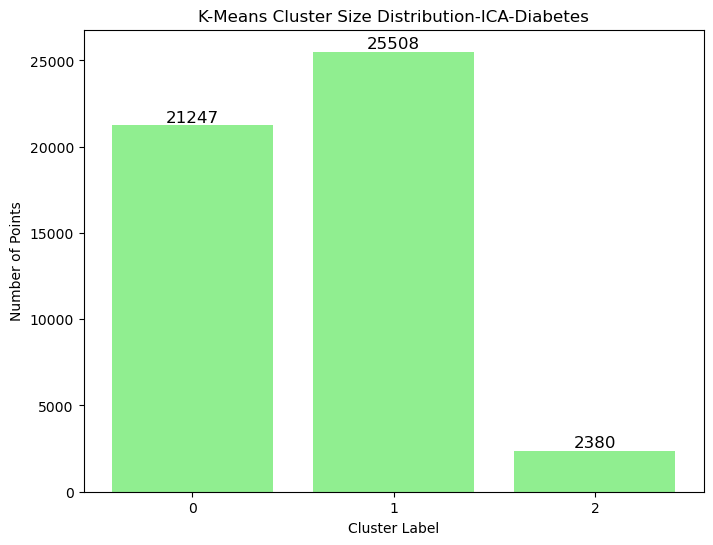

In [324]:
# Fit the best KMeans model 
kmeans_ica_diab = KMeans(init='random', n_clusters=3, n_init=4, random_state=42)
kmeans_ica_diab.fit(X_diab_ica)

# Get cluster labels
cluster_labels = kmeans_ica_diab.labels_

# Create a DataFrame to count the number of points in each cluster
cluster_counts = pd.Series(cluster_labels).value_counts().sort_index()

# Plot Cluster Size Distribution for GMM
plt.figure(figsize=(8, 6))
bars = plt.bar(cluster_counts.index, cluster_counts.values, color='lightgreen')

# Add annotations (number of data points) on top of each bar
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, int(yval), 
             ha='center', va='bottom', fontsize=12)

# Customize the plot
plt.title('K-Means Cluster Size Distribution-ICA-Diabetes')
plt.xlabel('Cluster Label')
plt.ylabel('Number of Points')
plt.xticks(cluster_counts.index)
plt.grid(False)
plt.show()

In [325]:
# Get distances to nearest centroid and calculate compactness 
_, distances_to_centroids = pairwise_distances_argmin_min(X_diab_ica, kmeans_ica_diab.cluster_centers_)
compactness_diab_ica = [np.mean(distances_to_centroids[kmeans_ica_diab.labels_ == i]) for i in range(kmeans_ica_diab.n_clusters)]
np.round(compactness_diab_ica, 2)

array([4.15, 4.18, 4.91])

In [326]:
wcss_ica_diab = np.round(kmeans_ica_diab.inertia_, 2)
wcss_ica_diab

935951.35

In [327]:
## calculate inter cluster distance 
inter_cluster_distances_KMica_diab = np.round(cdist(kmeans_ica_diab.cluster_centers_, kmeans_ica_diab.cluster_centers_), 2) 
inter_cluster_distances_KMica_diab

array([[0.  , 2.01, 4.79],
       [2.01, 0.  , 4.75],
       [4.79, 4.75, 0.  ]])

In [328]:
# set k =2 for diabetes kmeans_ica
kmeans2_ica_diab = KMeans(init='random', n_clusters=2, n_init=4, random_state=42)
kmeans2_ica_diab.fit(X_diab_ica)

# Fit KMeans and get predictions
pred_ica_diab = kmeans2_ica_diab.fit_predict(X_diab_ica)

# Create a DataFrame with actual labels and predicted clusters
df_ica_diab = pd.DataFrame({'TrueLabel': y_train_diab, 'Cluster': pred_ica_diab})

# Dynamically find unique clusters
unique_clusters_diab = df_ica_diab['Cluster'].unique()

# Map each cluster to the most common true label
cluster_label_map = {}
for cluster in unique_clusters_diab:
    # Get the most common label for the current cluster
    common_label = df_ica_diab[df_ica_diab['Cluster'] == cluster]['TrueLabel'].mode()[0]
    cluster_label_map[cluster] = common_label

# Map the predicted clusters to the corresponding labels using the mapping
mapped_labels = [cluster_label_map[cluster] for cluster in pred_ica_diab]

# Calculate accuracy
accuracy = accuracy_score(y_train_diab, mapped_labels)
print(f"Accuracy: {accuracy * 100:.2f}%")

Accuracy: 52.34%


# RP-KMeans

In [521]:
X_rp_sparse.shape

(837, 10)

In [522]:
clusters = np.arange(2,21)
results_kmeans_rp_sparse = evaluate_k_means_over_components(data=X_rp_sparse, labels=y_train, clusters=clusters,
                                                            seeds = seeds, init_name="k-means++" )

In [523]:
results_kmeans_random_rp_sparse  = evaluate_k_means_over_components(data=X_rp_sparse , labels=y_train, clusters=clusters, 
                                                                   seeds = seeds, init_name="random" )

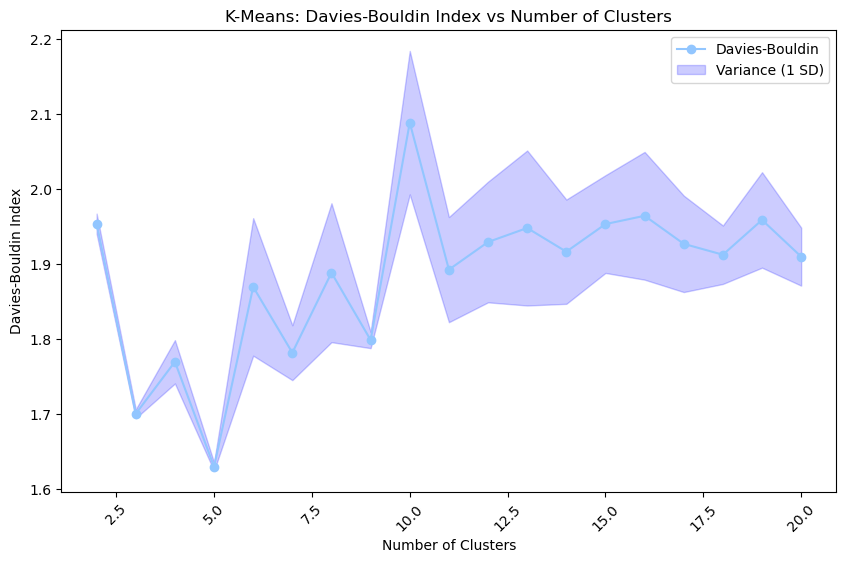

In [524]:
plot_DBI(clusters, results_kmeans_rp_sparse)

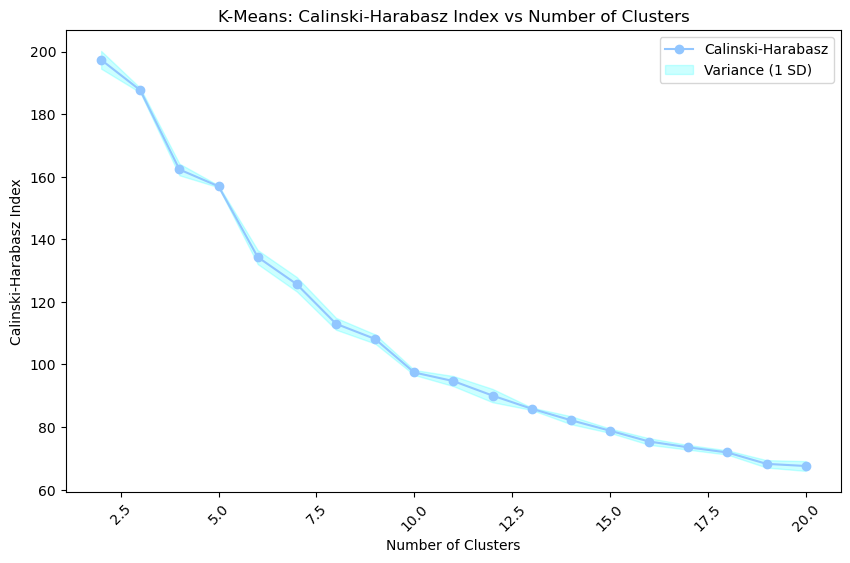

In [525]:
plot_CHI(clusters, results_kmeans_rp_sparse)

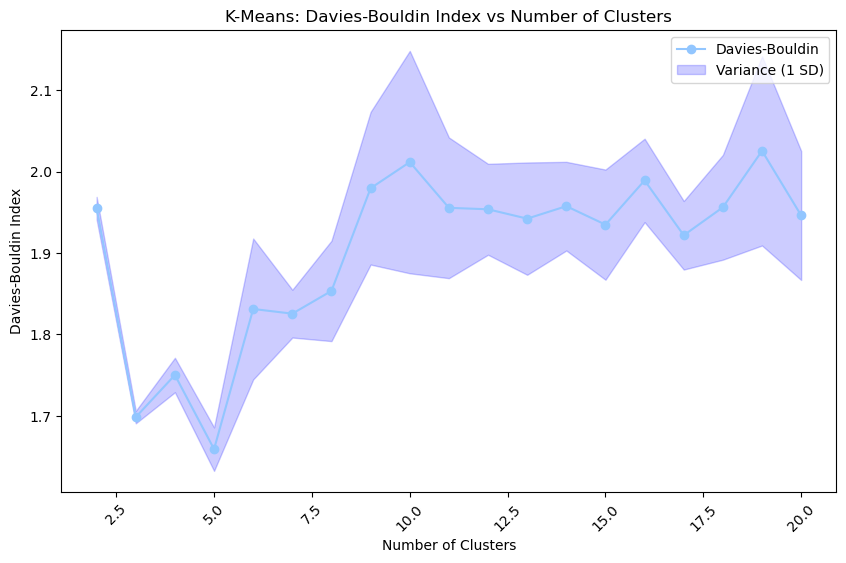

In [526]:
plot_DBI(clusters, results_kmeans_random_rp_sparse)

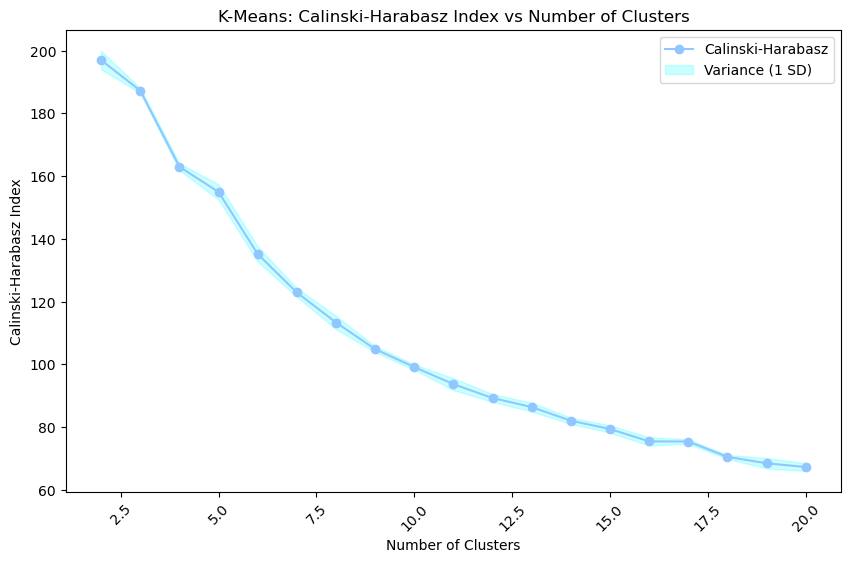

In [527]:
plot_CHI(clusters, results_kmeans_random_rp_sparse)

In [528]:
results_kmeans_rp_sparse[results_kmeans_rp_sparse['Clusters'].isin([2,7])]

,Clusters,Initialization,Fit Time (Avg),Fit Time (Var),Inertia (Avg),Inertia (Var),Homogeneity (Avg),Homogeneity (Var),Completeness (Avg),Completeness (Var),...,ARI (Avg),ARI (Var),AMI (Avg),AMI (Var),Silhouette (Avg),Silhouette (Var),Davies-Bouldin (Avg),Davies-Bouldin (Var),Calinski-Harabasz (Avg),Calinski-Harabasz (Var)
0,2,k-means++,0.0351000000,0.0000171520,6862.6451159017,50.1131118661,0.0054600000,0.0000006784,0.0054600000,0.0000006784,...,0.0064000000,0.0000013360,0.0046400000,0.0000007344,0.1714400000,0.0000082744,1.9534200000,0.0001807656,197.3494600000,8.0837524024
5,7,k-means++,0.0357000000,0.0000318440,4614.0094288654,89.1713131323,0.0435400000,0.0000190224,0.0156000000,0.0000024800,...,0.0136600000,0.0000021704,0.0202400000,0.0000053784,0.1110400000,0.0000363344,1.7813200000,0.0013396696,125.6018200000,5.3569937816


In [529]:
results_kmeans_random_rp_sparse[results_kmeans_random_rp_sparse['Clusters'].isin([2,7])]

,Clusters,Initialization,Fit Time (Avg),Fit Time (Var),Inertia (Avg),Inertia (Var),Homogeneity (Avg),Homogeneity (Var),Completeness (Avg),Completeness (Var),...,ARI (Avg),ARI (Var),AMI (Avg),AMI (Var),Silhouette (Avg),Silhouette (Var),Davies-Bouldin (Avg),Davies-Bouldin (Var),Calinski-Harabasz (Avg),Calinski-Harabasz (Var)
0,2,random,0.0301400000,0.0000079224,6862.3692020108,51.7943021855,0.0057000000,0.0000006400,0.0057000000,0.0000006400,...,0.0067400000,0.0000012544,0.0048800000,0.0000007056,0.1706200000,0.0000053496,1.9549600000,0.0001926544,197.0172800000,8.6175125136
5,7,random,0.0318200000,0.0000035656,4608.2548304095,0.6674443033,0.0391800000,0.0000218176,0.0140200000,0.0000028536,...,0.0122200000,0.0000028936,0.0179200000,0.0000060056,0.1058200000,0.0000115736,1.8254400000,0.0008599024,122.9277000000,1.9079572400


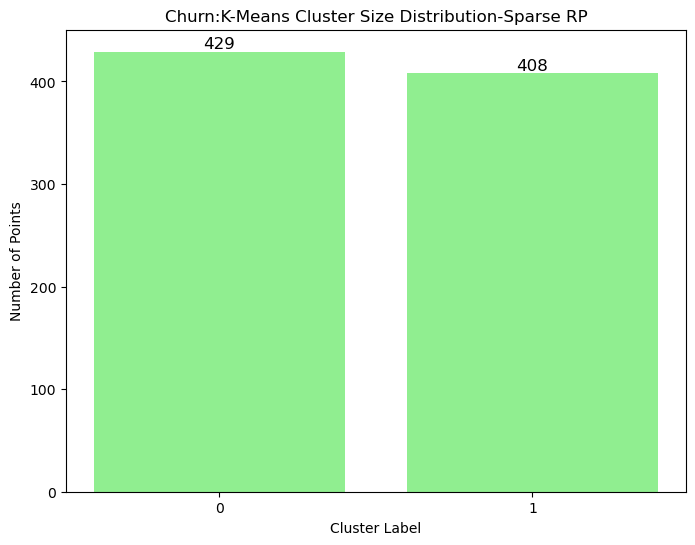

In [530]:
# Fit the best KMeans model 
kmeans_rp_sparse = KMeans(init='random', n_clusters=2, n_init=4, random_state=42)
kmeans_rp_sparse.fit(X_rp_sparse)

# Get cluster labels
cluster_labels = kmeans_rp_sparse.labels_

# Create a DataFrame to count the number of points in each cluster
cluster_counts = pd.Series(cluster_labels).value_counts().sort_index()

# Plot Cluster Size Distribution for GMM
plt.figure(figsize=(8, 6))
bars = plt.bar(cluster_counts.index, cluster_counts.values, color='lightgreen')

# Add annotations (number of data points) on top of each bar
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, int(yval), 
             ha='center', va='bottom', fontsize=12)

# Customize the plot
plt.title('Churn:K-Means Cluster Size Distribution-Sparse RP')
plt.xlabel('Cluster Label')
plt.ylabel('Number of Points')
plt.xticks(cluster_counts.index)
plt.grid(False)
plt.show()

In [531]:
## check if the cluster labels match with the ground truth labels
from sklearn.metrics import accuracy_score

# Fit KMeans and get predictions
pred_rp_sparse = kmeans_rp_sparse.fit_predict(X_rp_sparse)

# Create a DataFrame with actual labels and predicted clusters
df_rp_sparse = pd.DataFrame({'TrueLabel': y_train, 'Cluster': pred_rp_sparse})

# Dynamically find unique clusters
unique_clusters = df_rp_sparse['Cluster'].unique()

# Map each cluster to the most common true label
cluster_label_map = {}
for cluster in unique_clusters:
    # Get the most common label for the current cluster
    common_label = df_rp_sparse[df_rp_sparse['Cluster'] == cluster]['TrueLabel'].mode()[0]
    cluster_label_map[cluster] = common_label

# Map the predicted clusters to the corresponding labels using the mapping
mapped_labels = [cluster_label_map[cluster] for cluster in pred_rp_sparse]

# Calculate accuracy
accuracy = accuracy_score(y_train, mapped_labels)
print(f"Accuracy: {accuracy * 100:.2f}%")

Accuracy: 52.09%


In [532]:
# Get distances to nearest centroid and calculate compactness 
_, distances_to_centroids = pairwise_distances_argmin_min(X_rp_sparse, kmeans_rp_sparse.cluster_centers_)
compactnessrp_sparse = [np.mean(distances_to_centroids[kmeans_rp_sparse.labels_ == i]) for i in range(kmeans_rp_sparse.n_clusters)]
np.round(compactnessrp_sparse, 2)

array([2.94, 3.08])

In [533]:
## calculate inter cluster distance 
inter_cluster_distances_KM_rp_sparse = np.round(cdist(kmeans_rp_sparse.cluster_centers_, kmeans_rp_sparse.cluster_centers_), 2) 
inter_cluster_distances_KM_rp_sparse

array([[0.  , 3.15],
       [3.15, 0.  ]])

In [534]:
# calculate the Overall Intra-cluster Distance
wcss_rp_sparse = np.round(kmeans_rp_sparse.inertia_, 2)
wcss_rp_sparse

8402.86

Diabetes Data

In [535]:
results_kmeans_rp_sparse_diab = evaluate_k_means_over_components(data=X_rp_sparse_diab, labels=y_train_diab, clusters=clusters,
                                                            seeds = seeds, init_name="k-means++" )
results_kmeans_random_rp_sparse_diab  = evaluate_k_means_over_components(data=X_rp_sparse_diab , labels=y_train_diab, clusters=clusters, 
                                                                   seeds = seeds, init_name="random" )

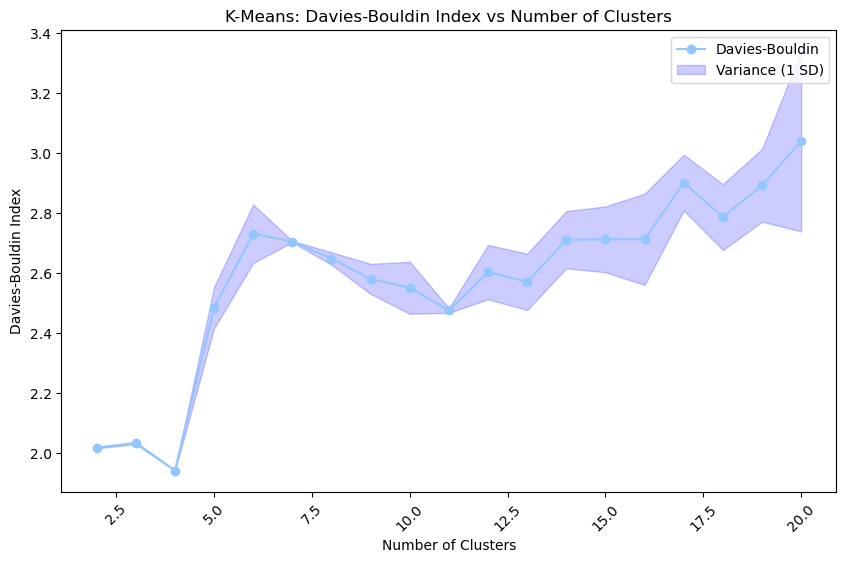

In [536]:
plot_DBI(clusters, results_kmeans_rp_sparse_diab)

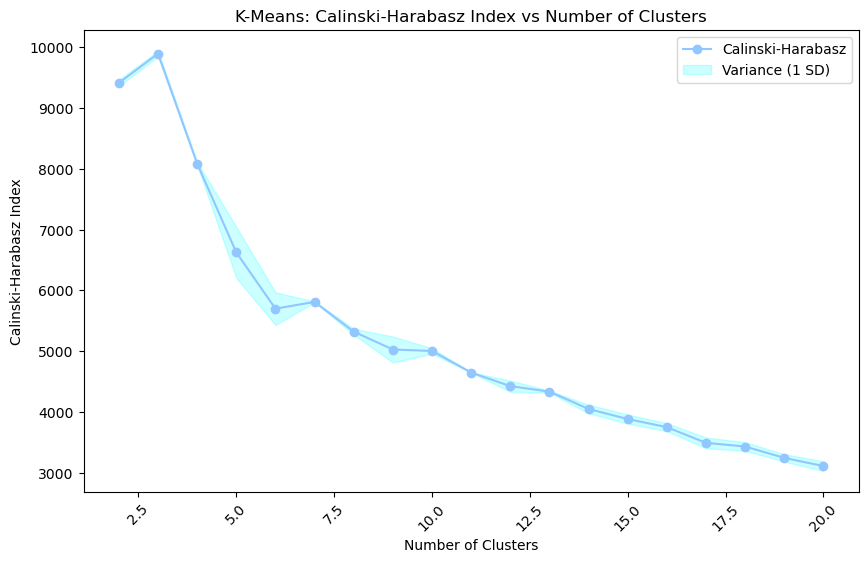

In [537]:
plot_CHI(clusters, results_kmeans_rp_sparse_diab)

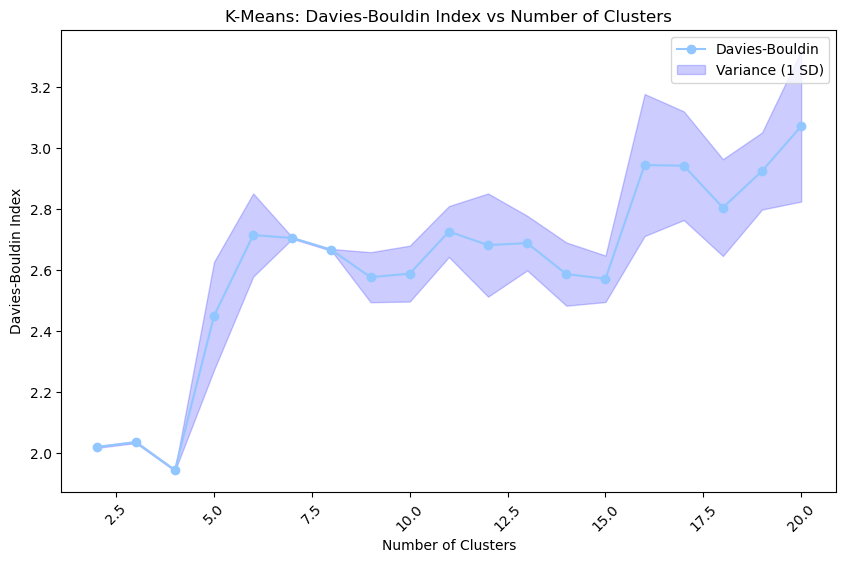

In [538]:
plot_DBI(clusters, results_kmeans_random_rp_sparse_diab)

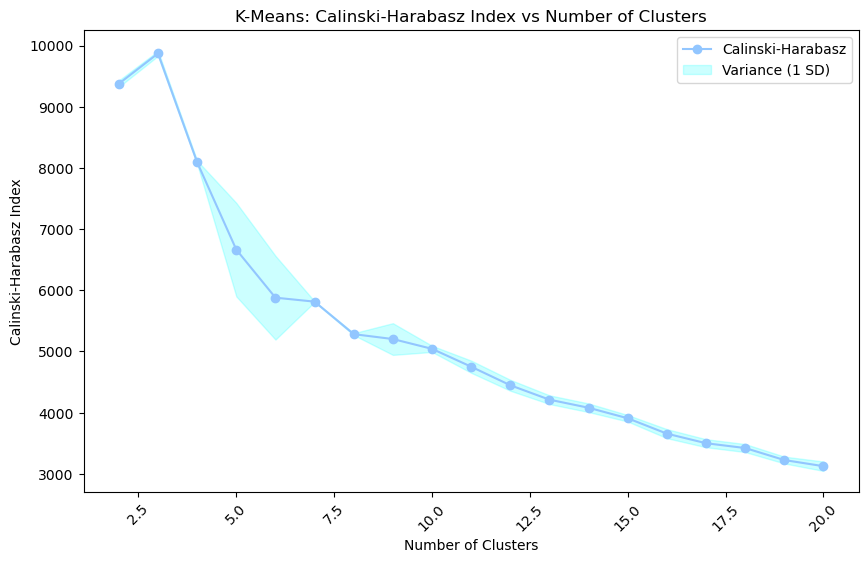

In [539]:
plot_CHI(clusters, results_kmeans_random_rp_sparse_diab)

In [540]:
results_kmeans_rp_sparse_diab[results_kmeans_rp_sparse_diab['Clusters'] == 2]

,Clusters,Initialization,Fit Time (Avg),Fit Time (Var),Inertia (Avg),Inertia (Var),Homogeneity (Avg),Homogeneity (Var),Completeness (Avg),Completeness (Var),...,ARI (Avg),ARI (Var),AMI (Avg),AMI (Var),Silhouette (Avg),Silhouette (Var),Davies-Bouldin (Avg),Davies-Bouldin (Var),Calinski-Harabasz (Avg),Calinski-Harabasz (Var)
0,2,k-means++,0.0761000000,0.0001597240,575199.6722126893,0.7792702898,0.0391800000,0.0000000056,0.0449800000,0.0000000056,...,0.0441200000,0.0000000536,0.0418800000,0.0000000056,0.1989000000,0.0000414200,2.0185200000,0.0000049816,9414.9571000000,2708.8898708920


In [541]:
results_kmeans_random_rp_sparse_diab[results_kmeans_random_rp_sparse_diab['Clusters'] == 2]

,Clusters,Initialization,Fit Time (Avg),Fit Time (Var),Inertia (Avg),Inertia (Var),Homogeneity (Avg),Homogeneity (Var),Completeness (Avg),Completeness (Var),...,ARI (Avg),ARI (Var),AMI (Avg),AMI (Var),Silhouette (Avg),Silhouette (Var),Davies-Bouldin (Avg),Davies-Bouldin (Var),Calinski-Harabasz (Avg),Calinski-Harabasz (Var)
0,2,random,0.0623200000,0.0001375856,575199.2182442320,0.5544764712,0.0391800000,0.0000000136,0.0450600000,0.0000000064,...,0.0440000000,0.0000000480,0.0418800000,0.0000000056,0.1928400000,0.0001063424,2.0199800000,0.0000078456,9376.2893400000,2827.0990424984


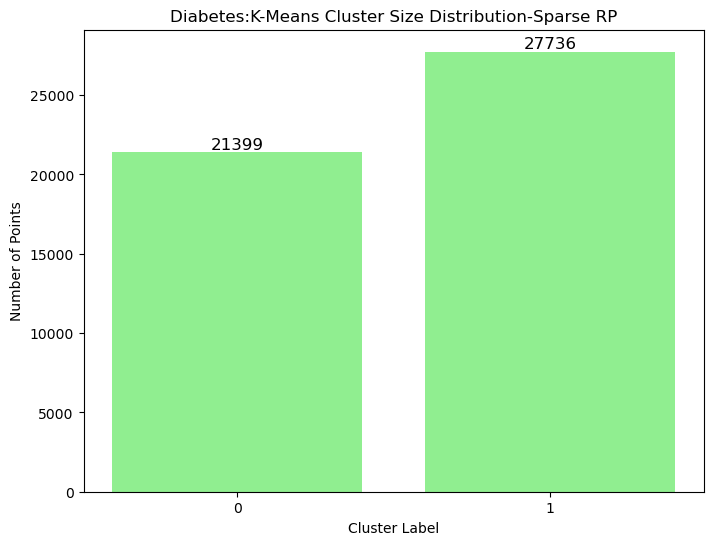

In [542]:
# Fit the best KMeans model 
kmeans_rp_sparse_diab = KMeans(init='k-means++', n_clusters=2, n_init=4, random_state=42)
kmeans_rp_sparse_diab.fit(X_rp_sparse_diab)

# Get cluster labels
cluster_labels = kmeans_rp_sparse_diab.labels_

# Create a DataFrame to count the number of points in each cluster
cluster_counts = pd.Series(cluster_labels).value_counts().sort_index()

# Plot Cluster Size Distribution for GMM
plt.figure(figsize=(8, 6))
bars = plt.bar(cluster_counts.index, cluster_counts.values, color='lightgreen')

# Add annotations (number of data points) on top of each bar
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, int(yval), 
             ha='center', va='bottom', fontsize=12)

# Customize the plot
plt.title('Diabetes:K-Means Cluster Size Distribution-Sparse RP')
plt.xlabel('Cluster Label')
plt.ylabel('Number of Points')
plt.xticks(cluster_counts.index)
plt.grid(False)
plt.show()

In [543]:
# Get distances to nearest centroid and calculate compactness 
_, distances_to_centroids = pairwise_distances_argmin_min(X_rp_sparse_diab, kmeans_rp_sparse_diab.cluster_centers_)
compactness_rp_sparse_diab = [np.mean(distances_to_centroids[kmeans_rp_sparse_diab.labels_ == i]) 
                              for i in range(kmeans_rp_sparse_diab.n_clusters)]
np.round(compactness_rp_sparse_diab, 2)

array([3.22, 2.66])

In [544]:
## calculate inter cluster distance 
inter_cluster_distances_KM_rp_sparse_diab = np.round(cdist(kmeans_rp_sparse_diab.cluster_centers_, 
                                                           kmeans_rp_sparse_diab.cluster_centers_), 2) 
inter_cluster_distances_KM_rp_sparse_diab

array([[0.  , 4.22],
       [4.22, 0.  ]])

In [545]:
# calculate the Overall Intra-cluster Distance
wcss_rp_sparse_diab = np.round(kmeans_rp_sparse_diab.inertia_, 2)
wcss_rp_sparse_diab

453430.1

In [546]:
# Fit the best KMeans model 
kmeans2_rp_sparse_diab = KMeans(init='k-means++', n_clusters=2, n_init=4, random_state=42)
kmeans2_rp_sparse_diab.fit(X_rp_sparse_diab)

KMeans(n_clusters=2, n_init=4, random_state=42)

In [547]:
from sklearn.metrics import accuracy_score

# Fit KMeans and get predictions
pred_rp_sparse_diab = kmeans2_rp_sparse_diab.fit_predict(X_rp_sparse_diab)

# Create a DataFrame with actual labels and predicted clusters
df_rp_sparse_diab = pd.DataFrame({'TrueLabel': y_train_diab, 'Cluster': pred_rp_sparse_diab})

# Dynamically find unique clusters
unique_clusters_diab = df_rp_sparse_diab['Cluster'].unique()

# Map each cluster to the most common true label
cluster_label_map = {}
for cluster in unique_clusters_diab:
    # Get the most common label for the current cluster
    common_label = df_rp_sparse_diab[df_rp_sparse_diab['Cluster'] == cluster]['TrueLabel'].mode()[0]
    cluster_label_map[cluster] = common_label

# Map the predicted clusters to the corresponding labels using the mapping
mapped_labels = [cluster_label_map[cluster] for cluster in pred_rp_sparse_diab]

# Calculate accuracy
accuracy = accuracy_score(y_train_diab, mapped_labels)
print(f"Accuracy: {accuracy * 100:.2f}%")

Accuracy: 50.48%


# TSNE-KMEANS

Churn Data

In [548]:
results_kmeans_tsne = evaluate_k_means_over_components(data= X_transformed, labels= y_train, clusters=clusters,
                                                            seeds = seeds, init_name="k-means++" )
results_kmeans_random_tsne  = evaluate_k_means_over_components(data= X_transformed , labels= y_train, 
                                                                         clusters=clusters, seeds = seeds, init_name="random" )

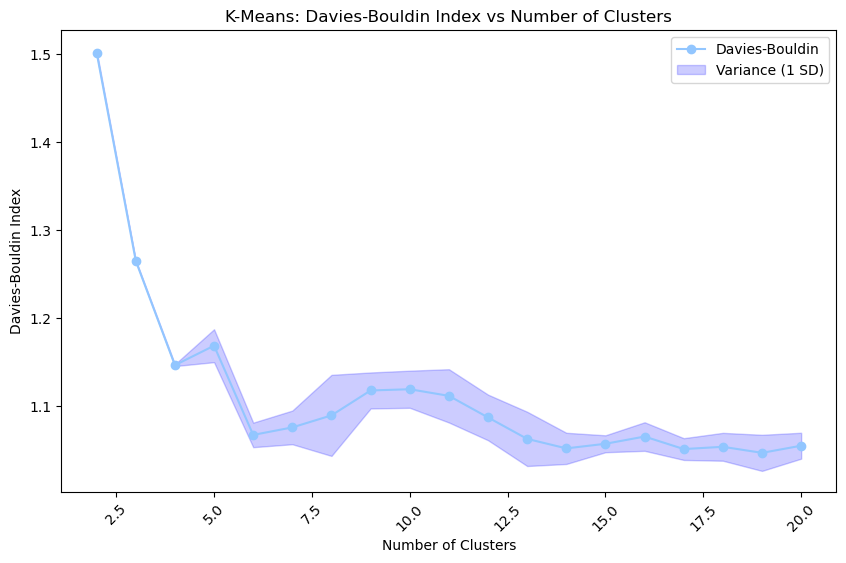

In [549]:
plot_DBI(clusters, results_kmeans_tsne)

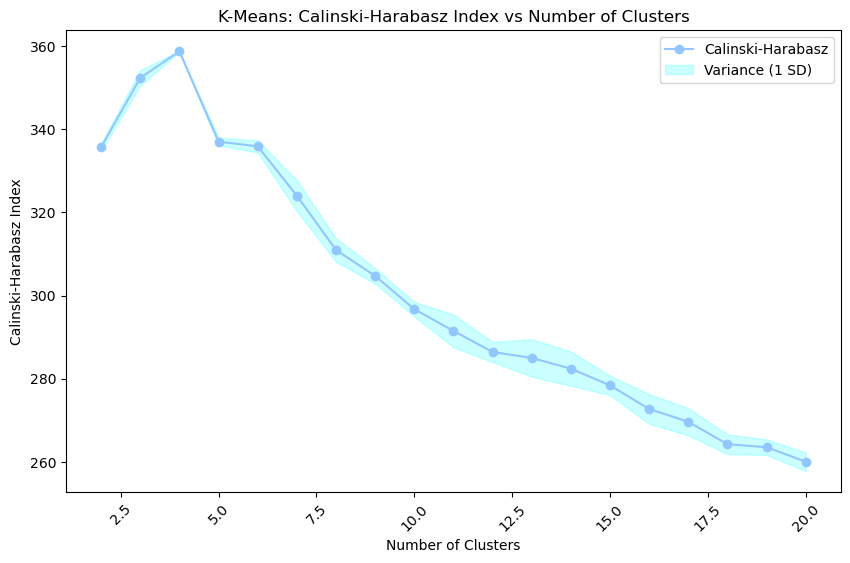

In [550]:
plot_CHI(clusters, results_kmeans_tsne)

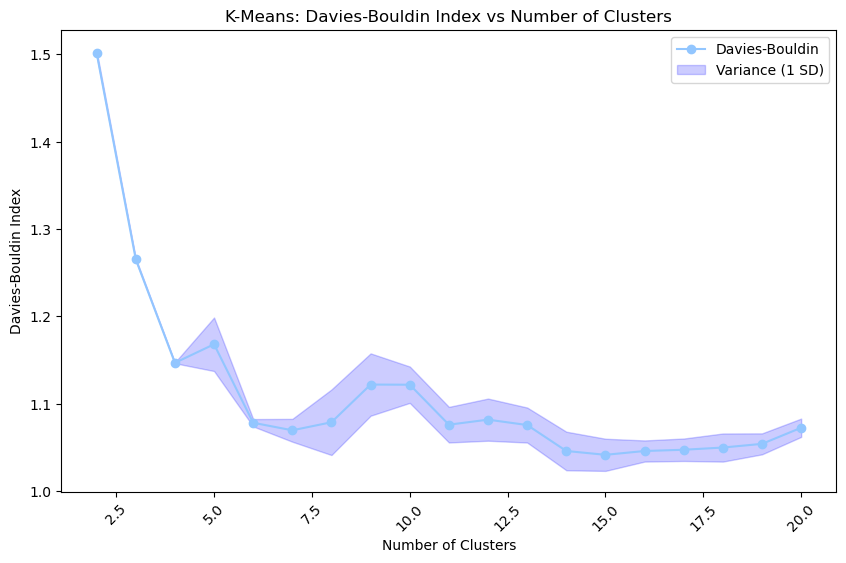

In [551]:
plot_DBI(clusters, results_kmeans_random_tsne)

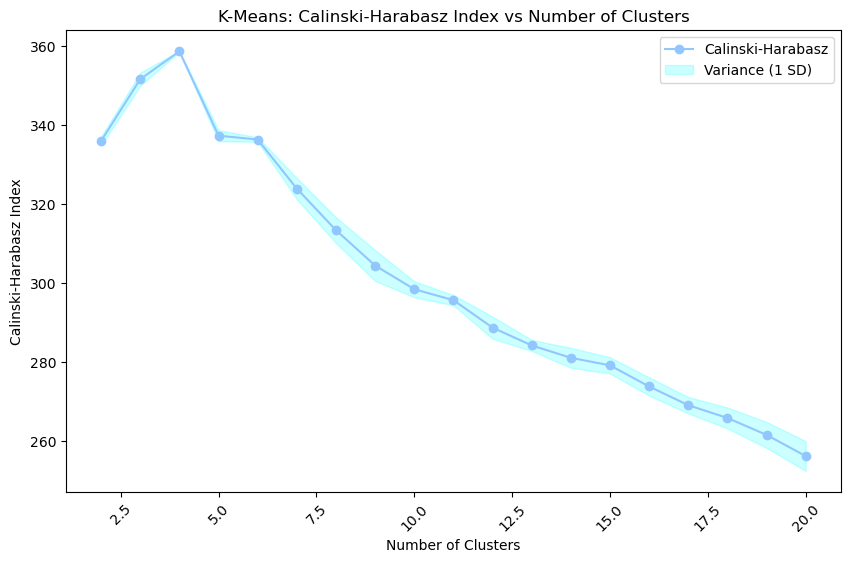

In [552]:
plot_CHI(clusters, results_kmeans_random_tsne)

In [553]:
results_kmeans_random_tsne[results_kmeans_random_tsne['Clusters'].isin([2, 4])]

,Clusters,Initialization,Fit Time (Avg),Fit Time (Var),Inertia (Avg),Inertia (Var),Homogeneity (Avg),Homogeneity (Var),Completeness (Avg),Completeness (Var),...,ARI (Avg),ARI (Var),AMI (Avg),AMI (Var),Silhouette (Avg),Silhouette (Var),Davies-Bouldin (Avg),Davies-Bouldin (Var),Calinski-Harabasz (Avg),Calinski-Harabasz (Var)
0,2,random,0.0301200000,0.0000288056,1804.0659423828,0.0057916486,0.0234800000,0.0000003456,0.0234800000,0.0000003456,...,0.0312400000,0.0000007144,0.0226800000,0.0000003456,0.2628999949,0.0000017560,1.5013000000,0.0000058080,336.0770600000,1.2415209544
2,4,random,0.0340600000,0.0000121904,1090.6862792969,0.0066611350,0.0700800000,0.0000049176,0.0351600000,0.0000011904,...,0.0503800000,0.0000022936,0.0452200000,0.0000021856,0.2822600007,0.0000026224,1.1469200000,0.0000002176,358.7663000000,0.0124587040


In [554]:
results_kmeans_tsne[results_kmeans_tsne['Clusters'].isin([2, 4])]

,Clusters,Initialization,Fit Time (Avg),Fit Time (Var),Inertia (Avg),Inertia (Var),Homogeneity (Avg),Homogeneity (Var),Completeness (Avg),Completeness (Var),...,ARI (Avg),ARI (Var),AMI (Avg),AMI (Var),Silhouette (Avg),Silhouette (Var),Davies-Bouldin (Avg),Davies-Bouldin (Var),Calinski-Harabasz (Avg),Calinski-Harabasz (Var)
0,2,k-means++,0.0313600000,0.0000054384,1804.0562255859,0.0075018382,0.0238800000,0.0000008856,0.0238800000,0.0000008856,...,0.0317400000,0.0000016184,0.0230200000,0.0000008656,0.2644000053,0.0000034520,1.5021200000,0.0000033656,335.7146800000,0.7329706256
2,4,k-means++,0.0385600000,0.0000153464,1090.6949218750,0.0061990047,0.0696800000,0.0000087936,0.0349400000,0.0000021984,...,0.0500600000,0.0000044224,0.0449400000,0.0000039544,0.2818399966,0.0000012984,1.1467800000,0.0000010816,358.7929200000,0.0126450136


In [555]:
# set k =4 for diabetes kmeans_TSNE
kmeans4_tsne = KMeans(init='random', n_clusters = 4, n_init=4, random_state=42)
kmeans4_tsne.fit(X_transformed)

# Fit KMeans and get predictions
pred_tsne4 = kmeans4_tsne.fit_predict(X_transformed)

In [556]:
# Get distances to nearest centroid and calculate compactness 
_, distances_to_centroids = pairwise_distances_argmin_min(X_transformed, kmeans4_tsne.cluster_centers_)
compactness_tsne4 = [np.mean(distances_to_centroids[kmeans4_tsne.labels_ == i]) for i in range(kmeans4_tsne.n_clusters)]
np.round(compactness_tsne4 , 2)

array([17.39, 16.74, 18.1 , 17.01])

In [557]:
## calculate inter cluster distance 
inter_cluster_distances_tsne4 = np.round(cdist(kmeans4_tsne.cluster_centers_, kmeans4_tsne.cluster_centers_), 2) 
inter_cluster_distances_tsne4

array([[ 0.  , 36.83, 30.9 , 28.96],
       [36.83,  0.  , 38.33, 33.73],
       [30.9 , 38.33,  0.  , 33.81],
       [28.96, 33.73, 33.81,  0.  ]])

In [558]:
# calculate the Overall Intra-cluster Distance
wcss_tsne4 = np.round(kmeans4_tsne.inertia_, 2)
wcss_tsne4

278695.62

In [559]:
def tsne_cluster_plotting(colors, clusters, model, data, pred_labels):
    colors = colors
    fig = plt.figure(figsize=(10, 8))
    ax = fig.add_subplot(111, projection='3d')

    # Scatter plot for each cluster
    for cluster in range(clusters):
        cluster_data = data[pred_labels == cluster]
        ax.scatter(cluster_data[:, 0], cluster_data[:, 1], cluster_data[:, 2], 
               color=colors[cluster], label=f'Cluster {cluster + 1}', s=30)

    # Plotting centroids
    centroids = model.cluster_centers_
    ax.scatter(centroids[:, 0], centroids[:, 1], centroids[:, 2], 
           color='black', marker='X', s=100, label='Centroids')

    ax.set_xlabel('t-SNE Dimension 1')
    ax.set_ylabel('t-SNE Dimension 2')
    ax.set_zlabel('t-SNE Dimension 3')
    plt.title('3D Visualization of t-SNE Results')
    plt.show()

In [560]:
colors2 = ['green','orange']
colors4 = ['cyan','blue','green','orange']

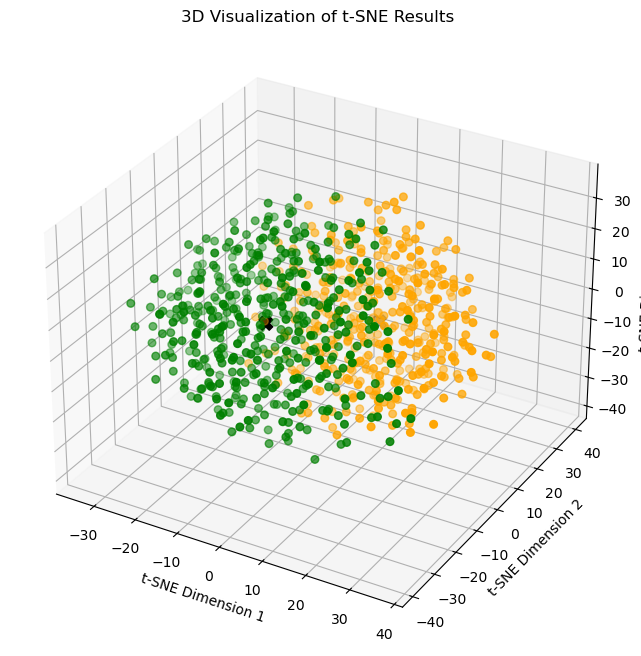

In [561]:
# set k =2 for diabetes kmeans_TSNE
kmeans2_tsne = KMeans(init='random', n_clusters = 2, n_init=4, random_state=42)
kmeans2_tsne.fit(X_transformed)

# Fit KMeans and get predictions
pred_tsne2 = kmeans2_tsne.fit_predict(X_transformed)
tsne_cluster_plotting(colors2, 2, kmeans2_tsne, X_transformed, pred_tsne2 )

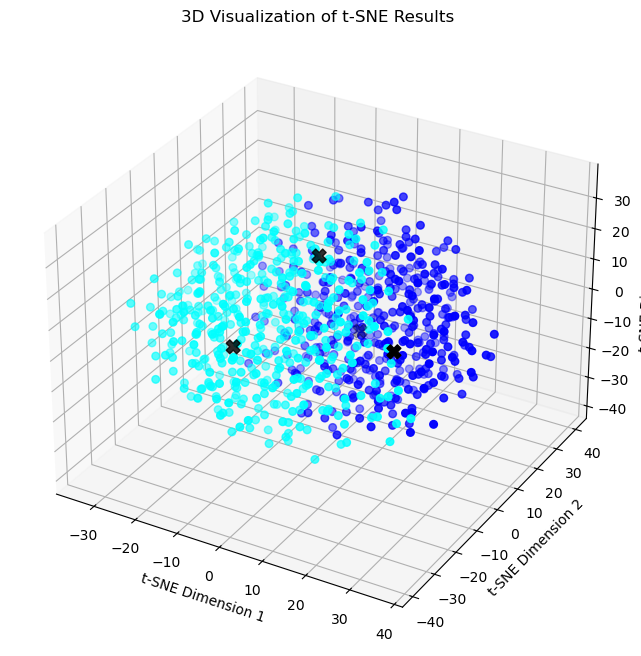

In [563]:
tsne_cluster_plotting(colors4, 4, kmeans4_tsne, X_transformed, pred_tsne2 )

In [707]:
def tsne_cluster_rotate(colors, clusters, model, data, pred_labels):
    fig = plt.figure(figsize=(10, 8))
    ax = fig.add_subplot(111, projection='3d')

    # Scatter plot for each cluster
    for cluster in range(clusters):
        cluster_data = data[pred_labels == cluster]
        ax.scatter(cluster_data[:, 0], cluster_data[:, 1], cluster_data[:, 2], 
                   color=colors[cluster], label=f'Cluster {cluster + 1}', s=30)

    # Plotting centroids
    centroids = model.cluster_centers_
    ax.scatter(centroids[:, 0], centroids[:, 1], centroids[:, 2], 
               color='black', marker='X', s=100, label='Centroids')

    ax.set_xlabel('t-SNE Dimension 1')
    ax.set_ylabel('t-SNE Dimension 2')
    ax.set_zlabel('t-SNE Dimension 3')
    plt.title('3D Visualization of t-SNE Results')

    # Set the view to rotate 90 degrees clockwise
    ax.view_init(elev=5, azim=130)  # Adjust elev as needed; azim=90 for 90-degree rotation

    plt.show()

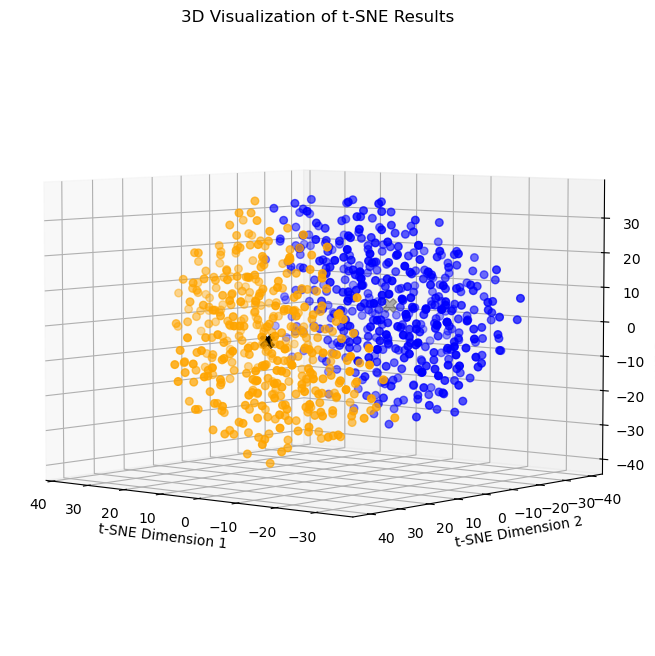

In [708]:
tsne_cluster_rotate(colors2, 2, kmeans2_tsne, X_transformed, pred_tsne2)

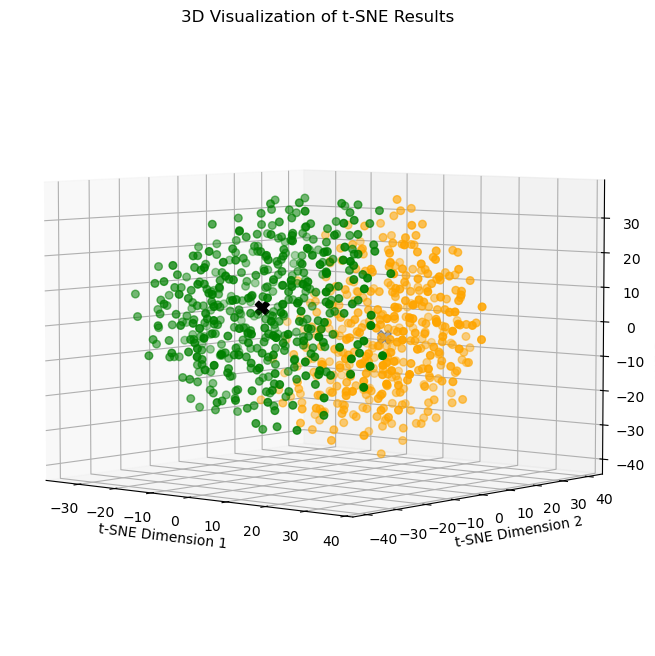

In [567]:
tsne_cluster_rotate(colors2, 2, kmeans2_tsne, X_transformed, pred_tsne2)

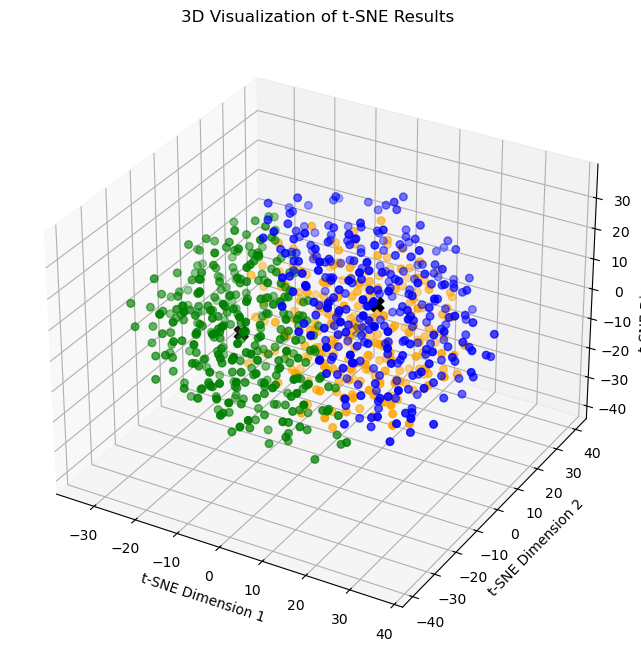

In [568]:
# set k =3 for diabetes kmeans_ica
kmeans3_tsne = KMeans(init='k-means++', n_clusters=3, n_init=4, random_state=42)
kmeans3_tsne.fit(X_transformed)

# Fit KMeans and get predictions
pred_tsne3 = kmeans3_tsne.fit_predict(X_transformed)

tsne_cluster_plotting(colors3, 3, kmeans3_tsne, X_transformed, pred_tsne3 )

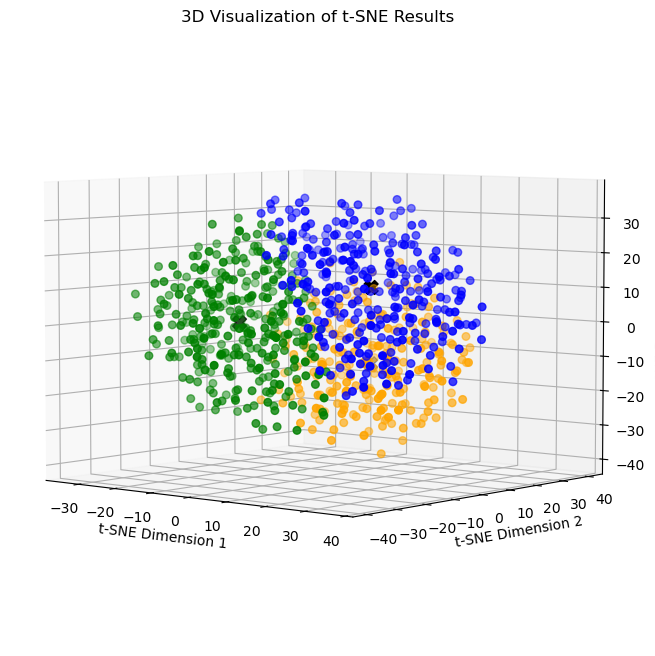

In [569]:
tsne_cluster_rotate(colors3, 3, kmeans3_tsne, X_transformed, pred_tsne3)

In [570]:
# set k =2 for diabetes kmeans_ica
kmeans2_tsne = KMeans(init='k-means++', n_clusters=2, n_init=4, random_state=42)
kmeans2_tsne.fit(X_transformed)

# Fit KMeans and get predictions
pred_tsne2 = kmeans2_tsne.fit_predict(X_transformed)
# Create a DataFrame with actual labels and predicted clusters
df_tsne2 = pd.DataFrame({'TrueLabel': y_train, 'Cluster': pred_tsne2})

# Dynamically find unique clusters
unique_clusters_tsne2 = df_tsne2['Cluster'].unique()

# Map each cluster to the most common true label
cluster_label_map = {}
for cluster in unique_clusters_tsne2:
    # Get the most common label for the current cluster
    common_label = df_tsne2[df_tsne2['Cluster'] == cluster]['TrueLabel'].mode()[0]
    cluster_label_map[cluster] = common_label

# Map the predicted clusters to the corresponding labels using the mapping
mapped_labels = [cluster_label_map[cluster] for cluster in pred_tsne2]

# Calculate accuracy
accuracy = accuracy_score(y_train, mapped_labels)
print(f"Accuracy: {accuracy * 100:.2f}%")

Accuracy: 58.42%


In [571]:
# Get distances to nearest centroid and calculate compactness 
_, distances_to_centroids = pairwise_distances_argmin_min(X_transformed, kmeans2_tsne.cluster_centers_)
compactness_tsne2 = [np.mean(distances_to_centroids[kmeans2_tsne.labels_ == i]) for i in range(kmeans2_tsne.n_clusters)]
np.round(compactness_tsne2 , 2)

array([22.02, 22.34])

In [572]:
## calculate inter cluster distance 
inter_cluster_distances_tsne2 = np.round(cdist(kmeans2_tsne.cluster_centers_, kmeans2_tsne.cluster_centers_), 2) 
inter_cluster_distances_tsne2

array([[ 0.  , 29.91],
       [29.91,  0.  ]])

In [573]:
# calculate the Overall Intra-cluster Distance
wcss_tsne2 = np.round(kmeans2_tsne.inertia_, 2)
wcss_tsne2

453095.47

# Diabetes Data-TSNE-KMeans

In [574]:
results_kmeans_tsne_diab = evaluate_k_means_over_components(data= X_tsne_diab, labels= y_train_diab, clusters=clusters,
                                                            seeds = seeds, init_name="k-means++" )
results_kmeans_random_tsne_diab  = evaluate_k_means_over_components(data= X_tsne_diab , labels= y_train_diab, 
                                                                         clusters=clusters, seeds = seeds, init_name="random" )

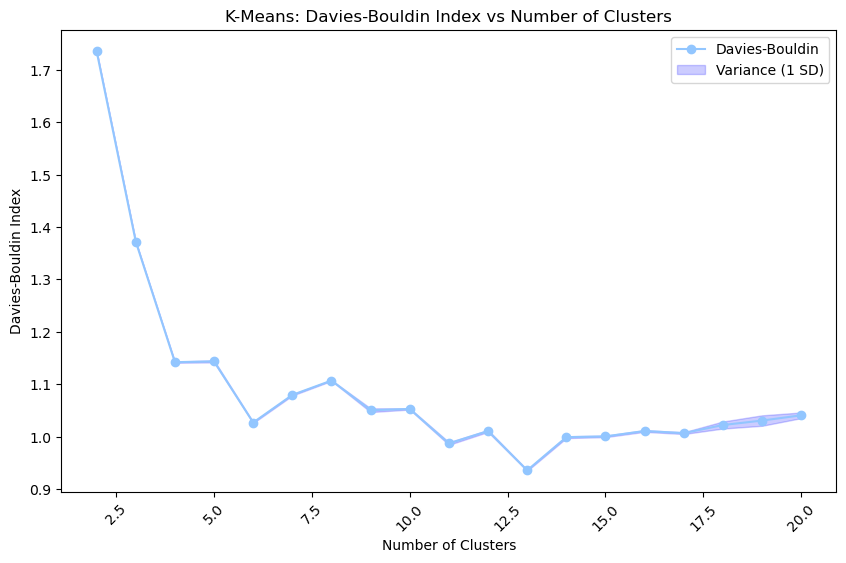

In [575]:
plot_DBI(clusters, results_kmeans_tsne_diab)

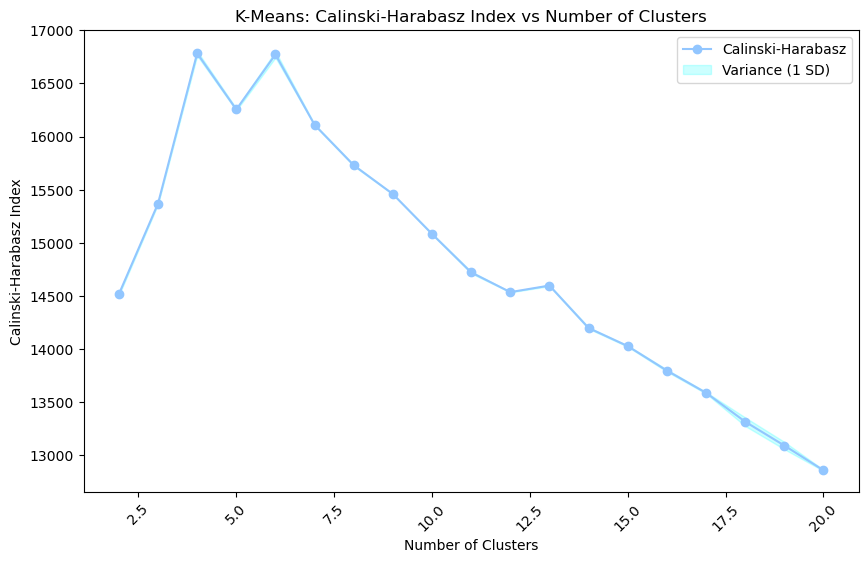

In [576]:
plot_CHI(clusters, results_kmeans_tsne_diab)

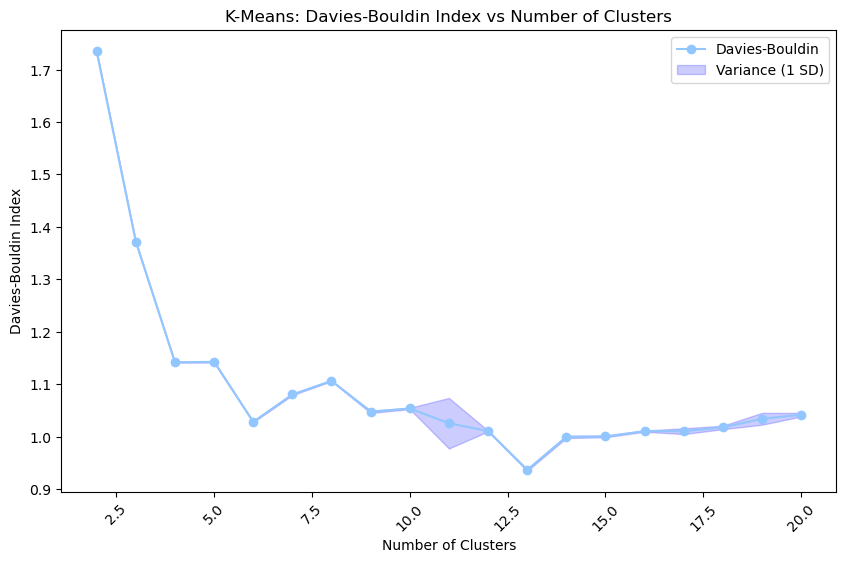

In [577]:
plot_DBI(clusters, results_kmeans_random_tsne_diab)

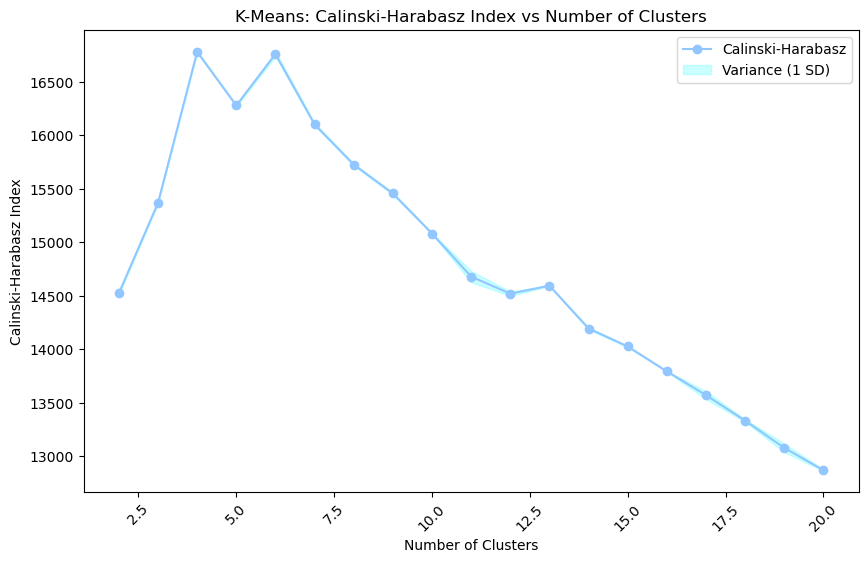

In [578]:
plot_CHI(clusters, results_kmeans_random_tsne_diab)

In [579]:
results_kmeans_tsne_diab[results_kmeans_tsne_diab['Clusters'].isin([4,6,13])]

,Clusters,Initialization,Fit Time (Avg),Fit Time (Var),Inertia (Avg),Inertia (Var),Homogeneity (Avg),Homogeneity (Var),Completeness (Avg),Completeness (Var),...,ARI (Avg),ARI (Var),AMI (Avg),AMI (Var),Silhouette (Avg),Silhouette (Var),Davies-Bouldin (Avg),Davies-Bouldin (Var),Calinski-Harabasz (Avg),Calinski-Harabasz (Var)
2,4,k-means++,0.0719800000,0.0000323936,72798.1750000000,2443.2757226563,0.0000800000,0.0000000016,0.0000000000,0.0000000000,...,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.2445000112,0.0000531080,1.1422200000,0.0000012456,16784.0716800000,508.2081680936
4,6,k-means++,0.1256600000,0.0000553784,54452.8562500000,3868.7966638184,0.0000800000,0.0000000016,0.0000000000,0.0000000000,...,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.2466399968,0.0000437544,1.0270800000,0.0000009536,16773.1877800000,918.4835838376
11,13,k-means++,0.2846600000,0.0001083304,32285.2453125000,97.4658471680,0.0003400000,0.0000000104,0.0000800000,0.0000000016,...,0.0000400000,0.0000000024,0.0000600000,0.0000000024,0.2422599792,0.0000408504,0.9358800000,0.0000011136,14596.3537800000,32.4433666296


In [580]:
results_kmeans_random_tsne_diab[results_kmeans_random_tsne_diab['Clusters'].isin([4,6,13])]

,Clusters,Initialization,Fit Time (Avg),Fit Time (Var),Inertia (Avg),Inertia (Var),Homogeneity (Avg),Homogeneity (Var),Completeness (Avg),Completeness (Var),...,ARI (Avg),ARI (Var),AMI (Avg),AMI (Var),Silhouette (Avg),Silhouette (Var),Davies-Bouldin (Avg),Davies-Bouldin (Var),Calinski-Harabasz (Avg),Calinski-Harabasz (Var)
2,4,random,0.0366200000,0.0000554576,72802.4953125000,363.3260888672,0.0000400000,0.0000000024,0.0000400000,0.0000000024,...,0.0000200000,0.0000000016,0.0000200000,0.0000000016,0.2395400107,0.0001240584,1.1418600000,0.0000004024,16782.1403000000,75.0665254720
4,6,random,0.0491800000,0.0000232096,54476.6695312500,2022.0035620117,0.0001800000,0.0000000056,0.0000800000,0.0000000016,...,0.0000400000,0.0000000024,0.0000600000,0.0000000024,0.2442000210,0.0000202360,1.0283600000,0.0000007424,16761.4237000000,484.6677256960
11,13,random,0.1230800000,0.0005414656,32285.8511718750,53.5187246704,0.0003800000,0.0000000056,0.0001000000,0.0000000000,...,0.0000400000,0.0000000024,0.0001000000,0.0000000000,0.2393800020,0.0000432135,0.9366200000,0.0000032936,14596.0092000000,17.6274256880


In [581]:
# set k =2 for diabetes kmeans_TSNE
kmeans4_tsne_diab = KMeans(init='k-means++', n_clusters=4, n_init=4, random_state=42)
kmeans4_tsne_diab.fit(X_tsne_diab)

# Fit KMeans and get predictions
pred_tsne4_diab = kmeans4_tsne_diab.fit_predict(X_tsne_diab)

In [582]:
# Get distances to nearest centroid and calculate compactness 
_, distances_to_centroids = pairwise_distances_argmin_min(X_tsne_diab, kmeans4_tsne_diab.cluster_centers_)
compactness_tsne_diab = [np.mean(distances_to_centroids[kmeans4_tsne_diab.labels_ == i]) for i in range(kmeans4_tsne_diab.n_clusters)]
np.round(compactness_tsne_diab , 2)

array([27.29, 27.3 , 27.35, 27.34])

In [583]:
## calculate inter cluster distance 
inter_cluster_distances_tsne_diab = np.round(cdist(kmeans4_tsne_diab.cluster_centers_, kmeans4_tsne_diab.cluster_centers_), 2) 
inter_cluster_distances_tsne_diab

array([[ 0.  , 47.98, 47.79, 48.05],
       [47.98,  0.  , 47.94, 47.78],
       [47.79, 47.94,  0.  , 47.97],
       [48.05, 47.78, 47.97,  0.  ]])

In [584]:
# calculate the Overall Intra-cluster Distance
wcss_tsne_diab = np.round(kmeans4_tsne_diab.inertia_, 2)
wcss_tsne_diab

41283624.0

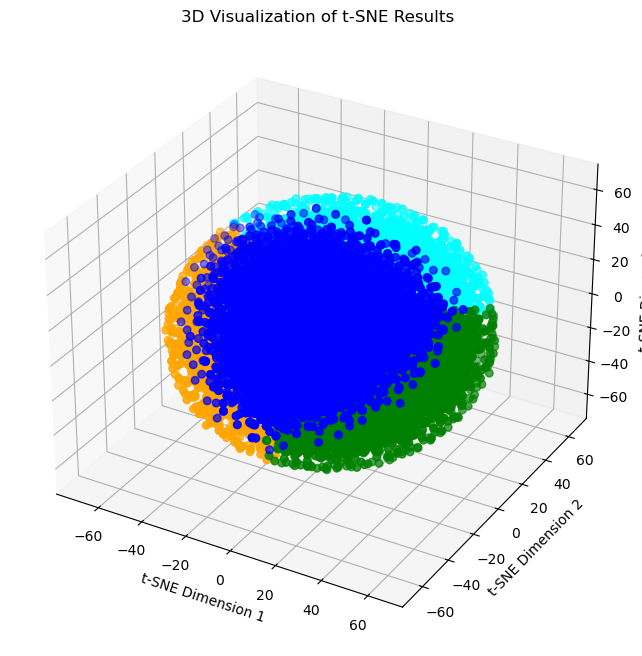

In [585]:
tsne_cluster_plotting(colors4, 4, kmeans4_tsne_diab, X_tsne_diab, pred_tsne4_diab)

In [697]:
def tsne_cluster_rotate(colors, clusters, model, data, pred_labels):
    fig = plt.figure(figsize=(10, 8))
    ax = fig.add_subplot(111, projection='3d')

    # Scatter plot for each cluster
    for cluster in range(clusters):
        cluster_data = data[pred_labels == cluster]
        ax.scatter(cluster_data[:, 0], cluster_data[:, 1], cluster_data[:, 2], 
                   color=colors[cluster], label=f'Cluster {cluster + 1}', s=30)

    # Plotting centroids
    centroids = model.cluster_centers_
    ax.scatter(centroids[:, 0], centroids[:, 1], centroids[:, 2], 
               color='black', marker='X', s=100, label='Centroids')

    ax.set_xlabel('t-SNE Dimension 1')
    ax.set_ylabel('t-SNE Dimension 2')
    ax.set_zlabel('t-SNE Dimension 3')
    plt.title('3D Visualization of t-SNE Results')

    # Set the view to rotate 90 degrees clockwise
    ax.view_init(elev=0.5, azim=15)  # Adjust elev as needed; azim=90 for 90-degree rotation

    plt.show()

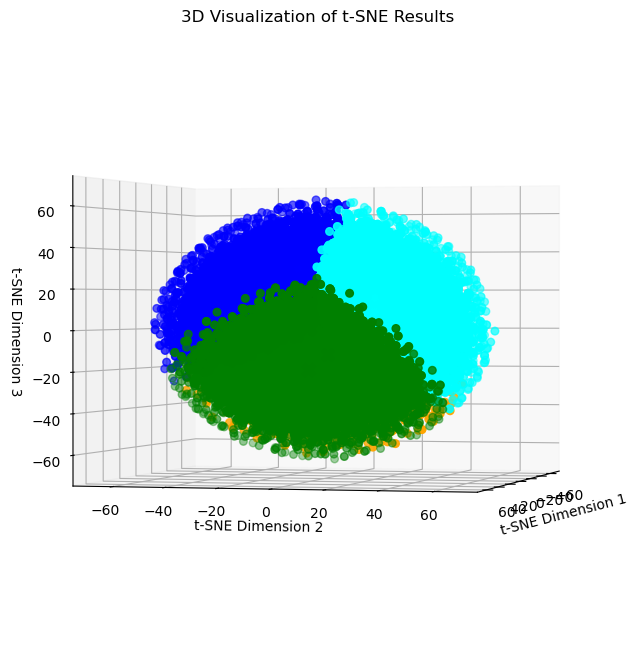

In [698]:
tsne_cluster_rotate(colors4, 4, kmeans4_tsne_diab, X_tsne_diab, pred_tsne4_diab)

In [588]:
# set k =2 for diabetes kmeans_ica
kmeans2_tsne_diab = KMeans(init='k-means++', n_clusters=2, n_init=4, random_state=42)
kmeans2_tsne_diab.fit(X_tsne_diab)

# Fit KMeans and get predictions
pred_tsne2_diab = kmeans2_tsne_diab.fit_predict(X_tsne_diab)
# Create a DataFrame with actual labels and predicted clusters
df_tsne2_diab = pd.DataFrame({'TrueLabel': y_train_diab, 'Cluster': pred_tsne2_diab})

# Dynamically find unique clusters
unique_clusters_tsne2_diab = df_tsne2_diab['Cluster'].unique()

# Map each cluster to the most common true label
cluster_label_map = {}
for cluster in unique_clusters_tsne2_diab:
    # Get the most common label for the current cluster
    common_label = df_tsne2_diab[df_tsne2_diab['Cluster'] == cluster]['TrueLabel'].mode()[0]
    cluster_label_map[cluster] = common_label

# Map the predicted clusters to the corresponding labels using the mapping
mapped_labels = [cluster_label_map[cluster] for cluster in pred_tsne2_diab]

# Calculate accuracy
accuracy = accuracy_score(y_train_diab, mapped_labels)
print(f"Accuracy: {accuracy * 100:.2f}%")

Accuracy: 50.02%


In [589]:
from matplotlib import animation

def tsne_cluster_plotting(colors, clusters, model, data, pred_labels, rotation=False):
    fig = plt.figure(figsize=(10, 8))
    ax = fig.add_subplot(111, projection='3d')

    # Scatter plot for each cluster
    for cluster in range(clusters):
        cluster_data = data[pred_labels == cluster]
        ax.scatter(cluster_data[:, 0], cluster_data[:, 1], cluster_data[:, 2], 
                   color=colors[cluster], label=f'Cluster {cluster + 1}', s=30)

    # Plotting centroids
    centroids = model.cluster_centers_
    ax.scatter(centroids[:, 0], centroids[:, 1], centroids[:, 2], 
               color='black', marker='X', s=100, label='Centroids')

    ax.set_xlabel('t-SNE Dimension 1')
    ax.set_ylabel('t-SNE Dimension 2')
    ax.set_zlabel('t-SNE Dimension 3')
    plt.title('3D Visualization of t-SNE Results')

    if rotation:
        def rotate(angle):
            ax.view_init(elev=30, azim=angle)
        ani = animation.FuncAnimation(fig, rotate, frames=range(0, 360, 2), interval=50)
        plt.show()
    else:
        # Set a fixed initial view
        ax.view_init(elev=30, azim=45)
        plt.show()

# PCA-GMM

Churn Data: PCA-GMM

In [590]:
X_pca.shape

(837, 11)

In [591]:
# Define the covariance types and number of components to test
cov_types = ['full', 'tied', 'diag', 'spherical']
n_components_list = [2, 3, 4, 5, 6, 7, 8]

In [592]:
df_results_pca = run_gmm_and_save_results(X_pca, y_train, cov_types, n_components_list)

    Number of components Type of covariance       BIC score
26                     2               diag 5821.3394613584
0                      2          spherical 5882.4252373252
39                     2               full 5891.2498337513
27                     3               diag 5906.1548741553
1                      3          spherical 5942.2669491197


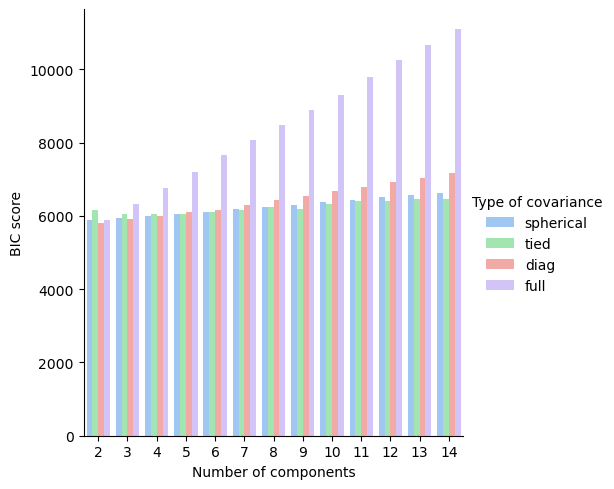

In [593]:
gmm_model_selection(X_pca, comp_range)

In [594]:
df_results_pca.columns 

Index(['Covariance Type', 'n_components', 'Fit Time (s)', 'Homogeneity',
       'Completeness', 'V-Measure', 'Adjusted Rand Index',
       'Adjusted Mutual Info', 'Silhouette Score', 'Log Likelihood(Total)',
       'Log Likelihood(Avg)'],
      dtype='object')

In [595]:
df_results_pca[(df_results_pca['n_components'] == 2) & (df_results_pca['Covariance Type'].isin(['diag', 'spherical','full']) )]

,Covariance Type,n_components,Fit Time (s),Homogeneity,Completeness,V-Measure,Adjusted Rand Index,Adjusted Mutual Info,Silhouette Score,Log Likelihood(Total),Log Likelihood(Avg)
0,full,2,0.0293000000,0.0158000000,0.0219000000,0.0184000000,0.0132000000,0.0174000000,0.1147000000,-12537.4150000000,-14.9790000000
14,diag,2,0.0090000000,0.0075000000,0.0085000000,0.0080000000,0.0079000000,0.0071000000,0.0901000000,-13924.1940000000,-16.6358000000
21,spherical,2,0.0100000000,0.0368000000,0.0376000000,0.0372000000,0.0477000000,0.0364000000,0.0997000000,-14353.9008000000,-17.1492000000


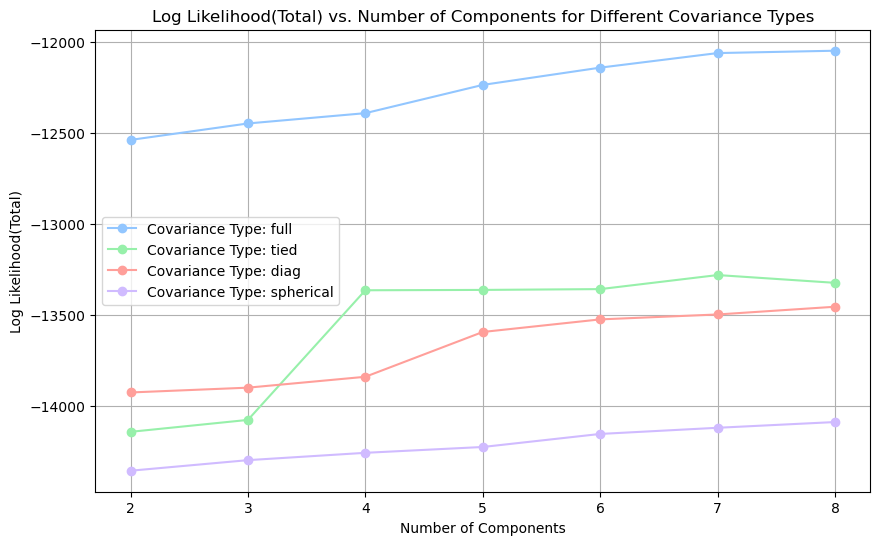

In [596]:
plot_gmm_results(df_results_pca, 'Log Likelihood(Total)')

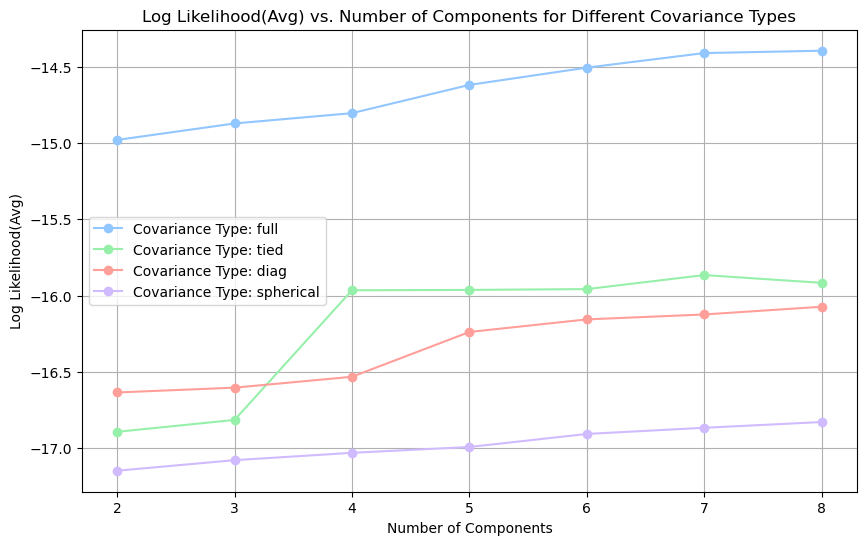

In [597]:
plot_gmm_results(df_results_pca, 'Log Likelihood(Avg)')

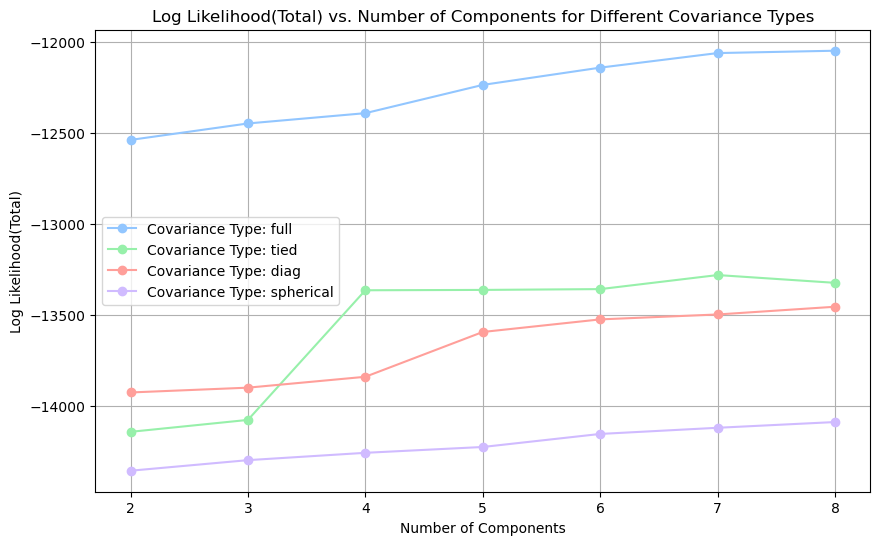

In [598]:
plot_gmm_results(df_results_pca, 'Log Likelihood(Total)')

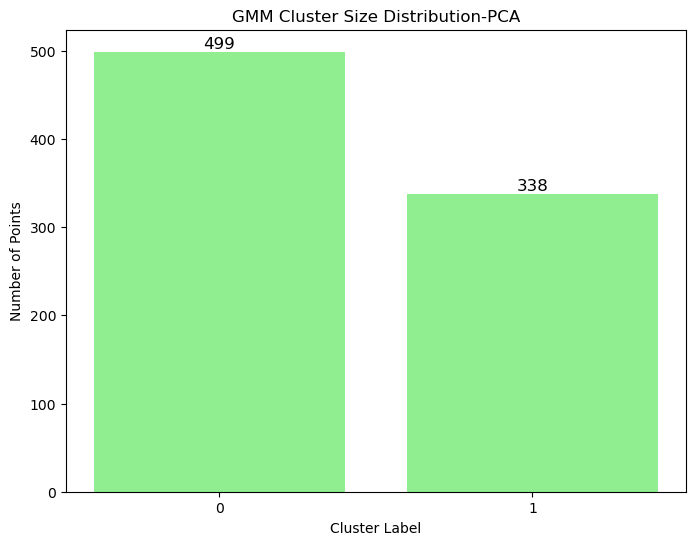

In [599]:
# Fit the best GMM model with X_pca
gmm_pca = GaussianMixture(n_components=2, covariance_type='spherical', random_state=0)
gmm_pca.fit(X_pca)

# Get cluster labels
cluster_labels = gmm_pca.predict(X_pca)

# Create a DataFrame to count the number of points in each cluster
cluster_counts = pd.Series(cluster_labels).value_counts().sort_index()

# Plot Cluster Size Distribution for GMM
plt.figure(figsize=(8, 6))
bars = plt.bar(cluster_counts.index, cluster_counts.values, color='lightgreen')

# Add annotations (number of data points) on top of each bar
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, int(yval), 
             ha='center', va='bottom', fontsize=12)

# Customize the plot
plt.title('GMM Cluster Size Distribution-PCA')
plt.xlabel('Cluster Label')
plt.ylabel('Number of Points')
plt.xticks(cluster_counts.index)
plt.grid(False)
plt.show()

In [600]:
# check if GMM-PCA cluster labels match the ground truth labels- churn data 

# Create a DataFrame with actual labels and predicted clusters
df = pd.DataFrame({'TrueLabel': y_train, 'Cluster': cluster_labels})

# Dynamically find unique clusters
unique_clusters = df['Cluster'].unique()

# Map each cluster to the most common true label
cluster_label_map = {}
for cluster in unique_clusters:
    # Get the most common label for the current cluster
    common_label = df[df['Cluster'] == cluster]['TrueLabel'].mode()[0]
    cluster_label_map[cluster] = common_label

# Map the predicted clusters to the corresponding labels using the mapping
mapped_labels = [cluster_label_map[cluster] for cluster in cluster_labels]

# Calculate accuracy
accuracy = accuracy_score(y_train, mapped_labels)
print(f"Churn-GMM using original data match rate: {accuracy * 100:.2f}%")

Churn-GMM using original data match rate: 61.41%


In [601]:
type(X_pca)

numpy.ndarray

In [602]:
from scipy.spatial.distance import mahalanobis

gmm_pca = GaussianMixture(n_components=2, covariance_type='full', random_state=0)
gmm_pca.fit(X_pca)

intra_cluster_distances_gmm_pca = []  # Initialize list to store distances
for i in range(gmm_pca.n_components):
    mean = gmm_pca.means_[i]
    cov_inv = np.linalg.inv(gmm_pca.covariances_[i])  # Directly use the full 2D covariance matrix
    distances = [
        gmm_pca.predict_proba(X_pca)[j][i] * mahalanobis(X_pca[j], mean, cov_inv) 
        for j in range(len(X_pca))
    ]
    intra_cluster_distances_gmm_pca.append(np.sum(distances) / np.sum(gmm_pca.predict_proba(X_pca)[:, i]))

print("Intra-cluster distances (soft assignment) for each cluster:", np.round(intra_cluster_distances_gmm_pca, 2))

Intra-cluster distances (soft assignment) for each cluster: [3.23 3.25]


In [603]:
# calculate the inter cluster distance in GMM
from scipy.spatial.distance import euclidean

inter_cluster_distances_gmm_pca = []
for i in range(gmm_pca.n_components):
    for j in range(i + 1, gmm_pca.n_components):
        inter_cluster_distances_gmm_pca.append(euclidean(gmm_pca.means_[i], gmm_pca.means_[j]))

print("Inter-cluster distances:", np.round(inter_cluster_distances_gmm_pca,2))

Inter-cluster distances: [2.62]


In [604]:
gmm_churn2 = GaussianMixture(n_components = 2, covariance_type='spherical', random_state=42)
gmm_churn2.fit(X_3pca)

# Get cluster labels
cluster_labels_gmm = gmm_churn2.predict(X_3pca)

In [605]:
gmm_churn2.means_

array([[-0.6822, -0.0583, -0.0076],
       [ 0.867 ,  0.074 ,  0.0097]])

In [606]:
gmm_churn2.covariances_

array([1.9645, 1.8479])

In [607]:
gmm_churn2.weights_

array([0.5596, 0.4404])

In [608]:
gmm_churn2.precisions_

array([0.509 , 0.5411])

In [609]:
gmm_churn2.lower_bound_

-5.372811131191761

In [610]:
def gmm_cluster_plotting(data, labels, colors):
    fig = plt.figure(figsize=(10, 8))
    ax = fig.add_subplot(111, projection='3d')

    # Scatter plot for each cluster
    unique_labels = set(labels)
    for label in unique_labels:
        cluster_data = data[labels == label]
        ax.scatter(cluster_data[:, 0], cluster_data[:, 1], cluster_data[:, 2], 
                   color=colors[label], label=f'Cluster {label + 1}', s=30)

    # Plotting centroids (means)
    centroids = gmm.means_
    ax.scatter(centroids[:, 0], centroids[:, 1], centroids[:, 2], 
               color='black', marker='X', s=100, label='Centroids')

    ax.set_xlabel('PCA Component 1')
    ax.set_ylabel('PCA Component 2')
    ax.set_zlabel('PCA Component 3')
    plt.title('3D Visualization of GMM Clustering Results')
    plt.legend()
    plt.show()

In [611]:
def gmm_cluster_plotting(data, labels, colors, gmm, elev=30, azim=45):
    """
    Parameters
    ----------
    data : ndarray
        Data points to plot in 3D.
    labels : array-like
        Cluster labels for each data point.
    colors : list
        List of colors for each cluster.
    gmm : GaussianMixture instance
        Gaussian Mixture Model with fitted centroids.
    elev : float, optional
        Elevation angle in the z-plane. Default is 30.
    azim : float, optional
        Azimuth angle in the x,y plane. Default is 45.
    """
    
    fig = plt.figure(figsize=(10, 8))
    ax = fig.add_subplot(111, projection='3d')

    # Scatter plot for each cluster
    unique_labels = set(labels)
    for label in unique_labels:
        cluster_data = data[labels == label]
        ax.scatter(cluster_data[:, 0], cluster_data[:, 1], cluster_data[:, 2], 
                   color=colors[label], label=f'Cluster {label + 1}', s=30)

    # Plotting centroids (means)
    centroids = gmm.means_
    ax.scatter(centroids[:, 0], centroids[:, 1], centroids[:, 2], 
               color='black', marker='X', s=100, label='Centroids')

    # Set labels and title
    ax.set_xlabel('PCA Component 1')
    ax.set_ylabel('PCA Component 2')
    ax.set_zlabel('PCA Component 3')
    plt.title('3D Visualization of GMM Clustering Results')
    plt.legend()

    # Set the view to the specified elevation and azimuth angles
    ax.view_init(elev=elev, azim=azim)

    # Show the plot
    plt.show()

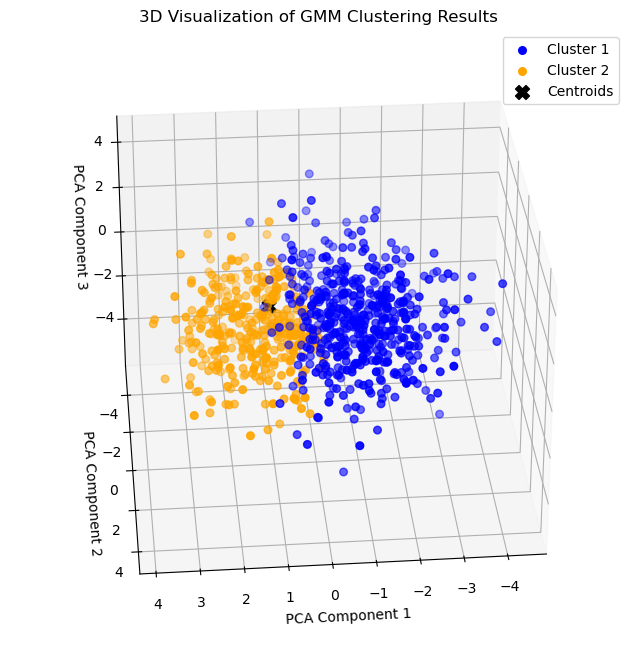

In [612]:
colors2 = ['blue', 'orange']
gmm_cluster_plotting(X_3pca, cluster_labels, colors2, gmm,  elev=30, azim=85)

Diabetes Data

    Number of components Type of covariance         BIC score
82                    21               full 180502.5178696336
83                    22               full 182472.6425413527
80                    19               full 182631.8620982032
81                    20               full 185657.8635518979
76                    15               full 187252.7172229995


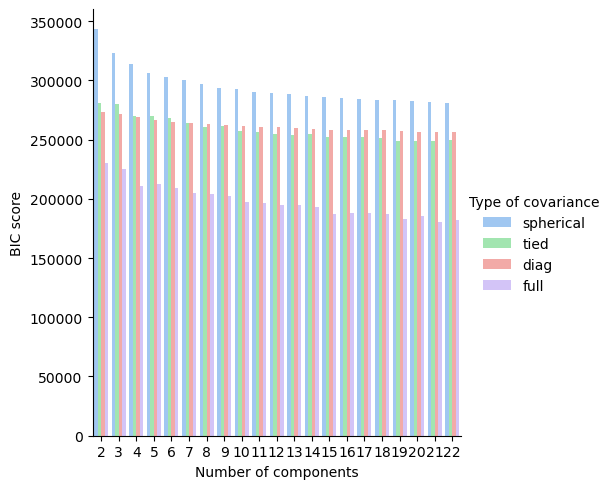

In [613]:
gmm_model_selection(X_pca_diab, comp_range_diab)

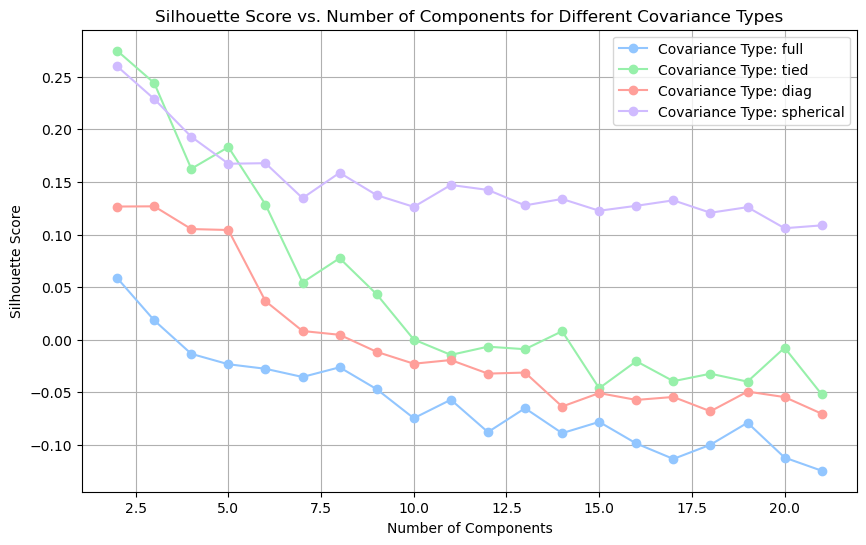

In [614]:
gmm_results_pca_diab = run_gmm_and_save_results(X_pca_diab, y_train_diab, cov_types, n_components_list_diab)
plot_gmm_results(gmm_results_pca_diab, 'Silhouette Score')

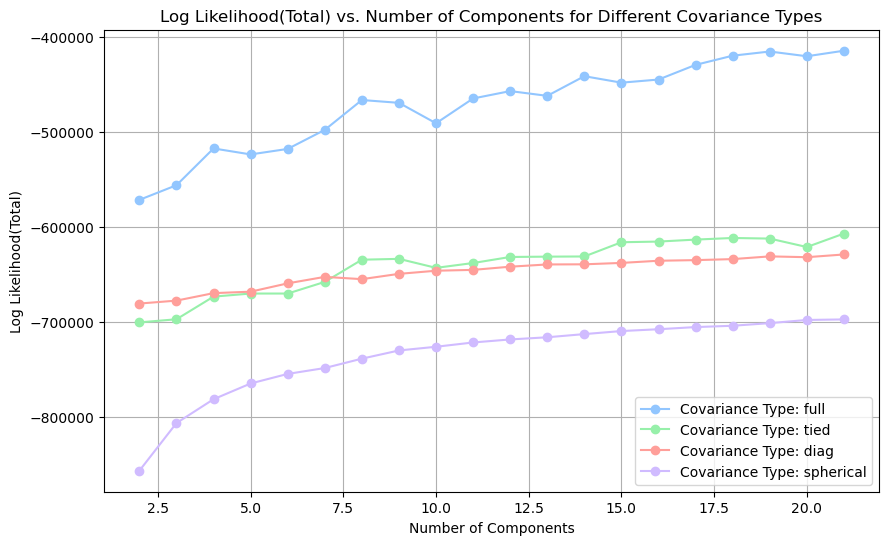

In [615]:
plot_gmm_results(gmm_results_pca_diab, 'Log Likelihood(Total)')

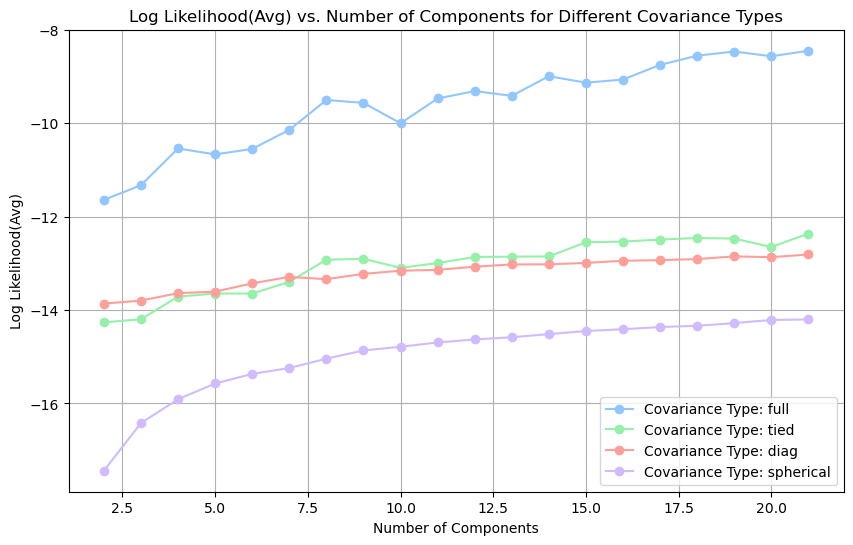

In [616]:
plot_gmm_results(gmm_results_pca_diab, 'Log Likelihood(Avg)')

In [617]:
gmm_results_pca_diab[(gmm_results_pca_diab ['n_components'] == 21) & (gmm_results_pca_diab ['Covariance Type'] == 'full')]

,Covariance Type,n_components,Fit Time (s),Homogeneity,Completeness,V-Measure,Adjusted Rand Index,Adjusted Mutual Info,Silhouette Score,Log Likelihood(Total),Log Likelihood(Avg)
19,full,21,13.6891000000,0.0936000000,0.0230000000,0.0370000000,0.0144000000,0.0369000000,-0.1245000000,-414894.7006000000,-8.4440000000


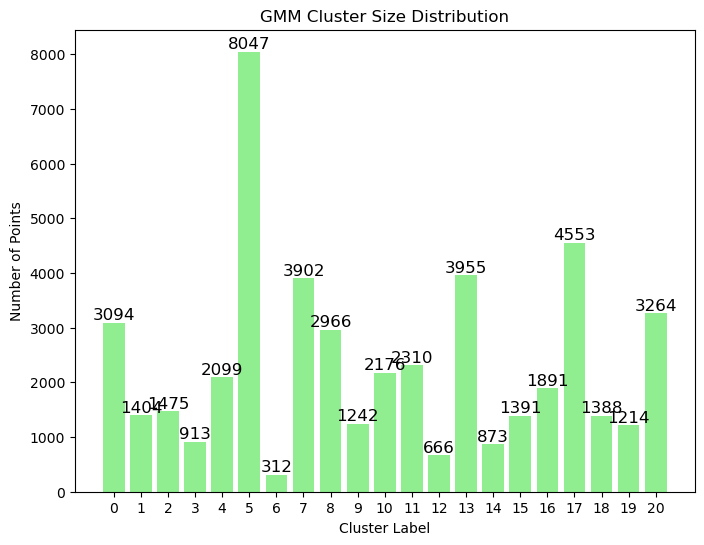

In [618]:
# Fit the best GMM model 
gmm_pca_diab = GaussianMixture(n_components=21, covariance_type='full', random_state=42)
gmm_pca_diab.fit(X_pca_diab)

# Get cluster labels
cluster_labels = gmm_pca_diab.predict(X_pca_diab)

# Create a DataFrame to count the number of points in each cluster
cluster_counts = pd.Series(cluster_labels).value_counts().sort_index()

# Plot Cluster Size Distribution for GMM
plt.figure(figsize=(8, 6))
bars = plt.bar(cluster_counts.index, cluster_counts.values, color='lightgreen')

# Add annotations (number of data points) on top of each bar
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, int(yval), 
             ha='center', va='bottom', fontsize=12)

# Customize the plot
plt.title('GMM Cluster Size Distribution')
plt.xlabel('Cluster Label')
plt.ylabel('Number of Points')
plt.xticks(cluster_counts.index)
plt.grid(False)
plt.show()

In [619]:
# choose two components for the GMM model- Diabetes data 
# Fit the best GMM model 
gmm_diab = GaussianMixture(n_components=2, covariance_type='tied', random_state=42)
gmm_diab.fit(X_pca_diab)

# Get cluster labels
cluster_labels = gmm_diab.predict(X_pca_diab)

# Create a DataFrame with actual labels and predicted clusters
df = pd.DataFrame({'TrueLabel': y_train_diab, 'Cluster': cluster_labels})

# Dynamically find unique clusters
unique_clusters = df['Cluster'].unique()

# Map each cluster to the most common true label
cluster_label_map = {}
for cluster in unique_clusters:
    # Get the most common label for the current cluster
    common_label = df[df['Cluster'] == cluster]['TrueLabel'].mode()[0]
    cluster_label_map[cluster] = common_label

# Map the predicted clusters to the corresponding labels using the mapping
mapped_labels = [cluster_label_map[cluster] for cluster in cluster_labels]

# Calculate accuracy
accuracy = accuracy_score(y_train_diab, mapped_labels)
print(f"Churn-GMM using original data match rate: {accuracy * 100:.2f}%")

Churn-GMM using original data match rate: 63.45%


In [620]:
### Fit the best GMM model on 3 PCA
gmm_diab3 = GaussianMixture(n_components=3, covariance_type='tied', random_state=42)
gmm_diab3.fit(X_3pca_diab)

# Get cluster labels
cluster_labels_3pca = gmm_diab3.predict(X_3pca_diab)

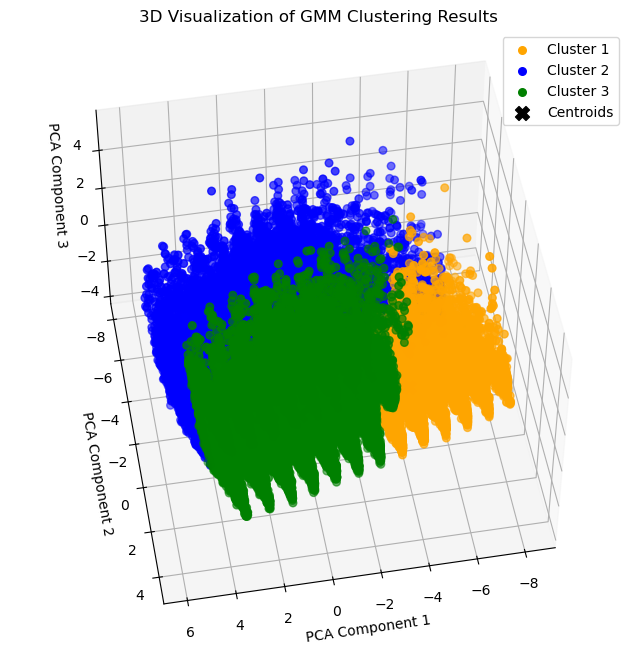

In [621]:
gmm_cluster_plotting(X_3pca_diab, cluster_labels_3pca, colors3, gmm_diab3,  elev=50, azim=80)

# ICA-GMM

Churn Data: ICA-GMM

    Number of components Type of covariance       BIC score
40                     3               full 2654.3422580093
41                     4               full 3248.8621558302
39                     2               full 3556.8266790608
42                     5               full 3729.9584930475
23                    12               tied 3911.6819058243


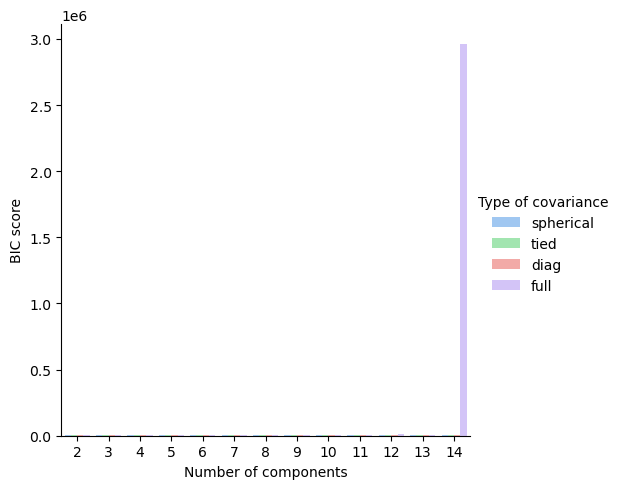

In [622]:
gmm_model_selection(X_churn_ica, comp_range)

In [623]:
X_churn_ica.shape

(837, 14)

In [624]:
n_components_list = [2, 3, 4, 5, 6, 7, 8, 9, 10]

In [625]:
gmm_results_ica = run_gmm_and_save_results(X_churn_ica, y_train, cov_types, n_components_list)

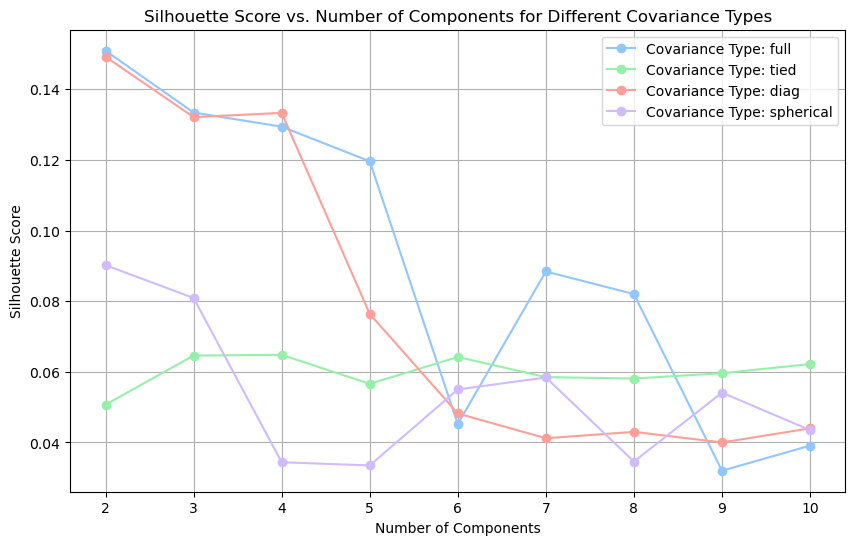

In [626]:
plot_gmm_results(gmm_results_ica, 'Silhouette Score')

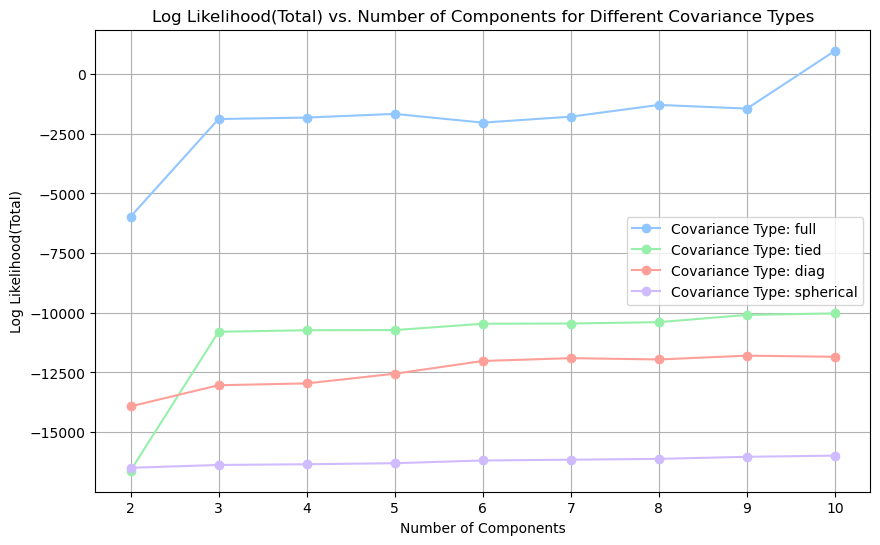

In [627]:
plot_gmm_results(gmm_results_ica, 'Log Likelihood(Total)')

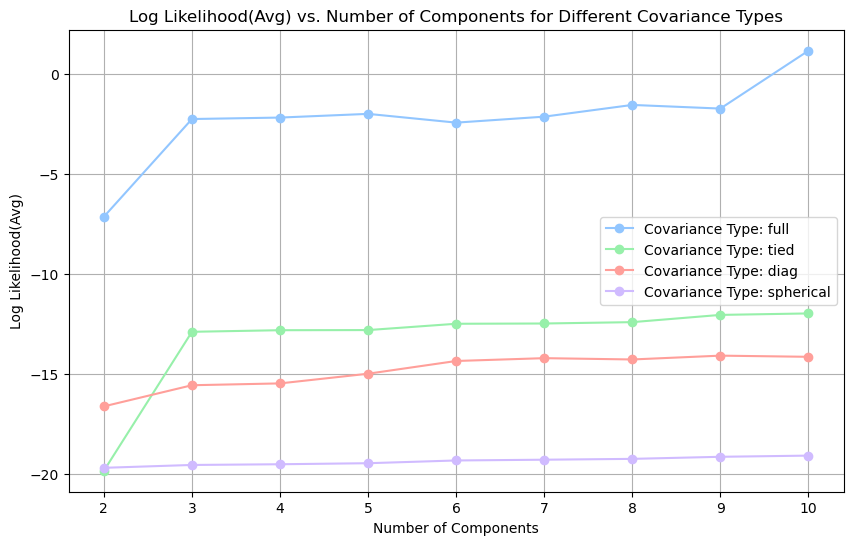

In [628]:
plot_gmm_results(gmm_results_ica, 'Log Likelihood(Avg)')

In [629]:
gmm_results_ica [(gmm_results_ica ['n_components'] == 3) & (gmm_results_ica ['Covariance Type'] == 'full')]

,Covariance Type,n_components,Fit Time (s),Homogeneity,Completeness,V-Measure,Adjusted Rand Index,Adjusted Mutual Info,Silhouette Score,Log Likelihood(Total),Log Likelihood(Avg)
1,full,3,0.0312000000,0.0845000000,0.0676000000,0.0751000000,0.0364000000,0.0737000000,0.1334000000,-1884.3206000000,-2.2513000000


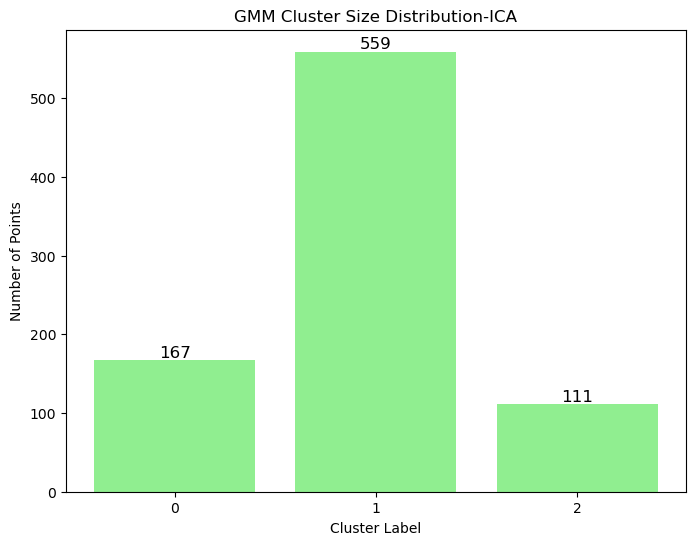

In [630]:
# Fit the best GMM model with X_pca
gmm_ica = GaussianMixture(n_components=3, covariance_type='full', random_state=0)
gmm_ica.fit(X_churn_ica)

# Get cluster labels
cluster_labels = gmm_ica.predict(X_churn_ica)

# Create a DataFrame to count the number of points in each cluster
cluster_counts = pd.Series(cluster_labels).value_counts().sort_index()

# Plot Cluster Size Distribution for GMM
plt.figure(figsize=(8, 6))
bars = plt.bar(cluster_counts.index, cluster_counts.values, color='lightgreen')

# Add annotations (number of data points) on top of each bar
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, int(yval), 
             ha='center', va='bottom', fontsize=12)

# Customize the plot
plt.title('GMM Cluster Size Distribution-ICA')
plt.xlabel('Cluster Label')
plt.ylabel('Number of Points')
plt.xticks(cluster_counts.index)
plt.grid(False)
plt.show()

In [631]:
# Get cluster labels
cluster_labels = gmm_ica.predict(X_churn_ica)

# Create a DataFrame with actual labels and predicted clusters
df = pd.DataFrame({'TrueLabel': y_train, 'Cluster': cluster_labels})

# Dynamically find unique clusters
unique_clusters = df['Cluster'].unique()

# Map each cluster to the most common true label
cluster_label_map = {}
for cluster in unique_clusters:
    # Get the most common label for the current cluster
    common_label = df[df['Cluster'] == cluster]['TrueLabel'].mode()[0]
    cluster_label_map[cluster] = common_label

# Map the predicted clusters to the corresponding labels using the mapping
mapped_labels = [cluster_label_map[cluster] for cluster in cluster_labels]

# Calculate accuracy
accuracy = accuracy_score(y_train, mapped_labels)
print(f"Churn-GMM using ICA data match rate: {accuracy * 100:.2f}%")

Churn-GMM using ICA data match rate: 58.42%


In [632]:
# calculate intra cluster distance 
intra_cluster_distances_gmm_ica = []  # Initialize list to store distances
for i in range(gmm_ica.n_components):
    mean = gmm_ica.means_[i]
    cov_inv = np.linalg.inv(gmm_ica.covariances_[i])  # Directly use the full 2D covariance matrix
    distances = [
        gmm_ica.predict_proba(X_churn_ica)[j][i] * mahalanobis(X_churn_ica[j], mean, cov_inv) 
        for j in range(len(X_churn_ica))
    ]
    intra_cluster_distances_gmm_ica.append(np.sum(distances) / np.sum(gmm_ica.predict_proba(X_churn_ica)[:, i]))

print("Intra-cluster distances (soft assignment) for each cluster:", np.round(intra_cluster_distances_gmm_ica, 2))

Intra-cluster distances (soft assignment) for each cluster: [3.53 3.25 3.25]


In [633]:
# calculate the inter cluster distance in GMM
from scipy.spatial.distance import euclidean

inter_cluster_distances_gmm_ica = []
for i in range(gmm_ica.n_components):
    for j in range(i + 1, gmm_ica.n_components):
        inter_cluster_distances_gmm_ica.append(euclidean(gmm_ica.means_[i], gmm_ica.means_[j]))

print("Inter-cluster distances:", np.round(inter_cluster_distances_gmm_ica,2))

Inter-cluster distances: [2.54 3.35 2.67]


Diabetes Data: ICA-GMM

    Number of components Type of covariance          BIC score
83                    22               full -462336.8446473117
82                    21               full -434485.5567277838
79                    18               full -401872.0841834131
76                    15               full -388500.9380713227
80                    19               full -374624.4786287082


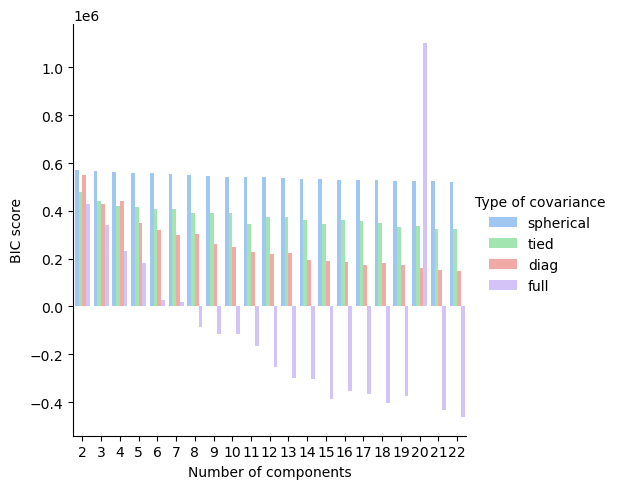

In [634]:
gmm_model_selection(X_diab_ica, comp_range_diab)

In [635]:
df_results_ica_diab = run_gmm_and_save_results(X_diab_ica, y_train_diab, cov_types, n_components_list_diab)

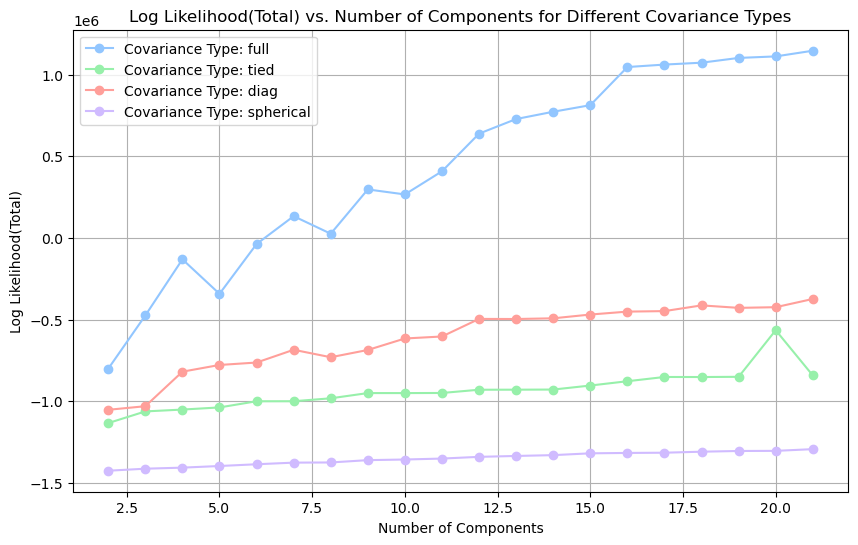

In [636]:
plot_gmm_results(df_results_ica_diab, 'Log Likelihood(Total)')

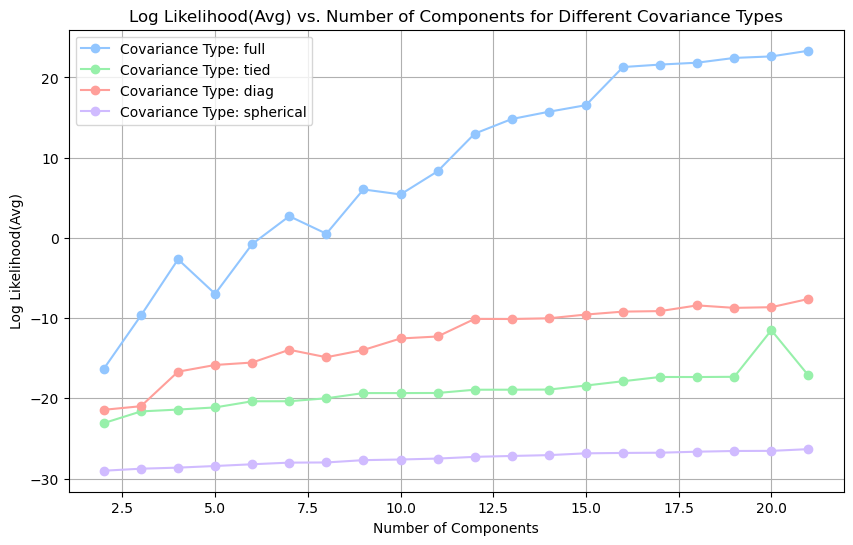

In [637]:
plot_gmm_results(df_results_ica_diab, 'Log Likelihood(Avg)')

In [638]:
df_results_ica_diab [(df_results_ica_diab ['n_components'] == 21) & (df_results_ica_diab ['Covariance Type'] == 'full')]

,Covariance Type,n_components,Fit Time (s),Homogeneity,Completeness,V-Measure,Adjusted Rand Index,Adjusted Mutual Info,Silhouette Score,Log Likelihood(Total),Log Likelihood(Avg)
19,full,21,3.5640000000,0.1056000000,0.0266000000,0.0425000000,0.0190000000,0.0424000000,0.0552000000,1146720.6912000000,23.3382000000


In [639]:
# Fit the best GMM model 
gmm_diab_ica = GaussianMixture(n_components=2, covariance_type='full', random_state=42)
gmm_diab_ica.fit(X_diab_ica)

# Get cluster labels
cluster_labels = gmm_diab_ica.predict(X_diab_ica)

# Create a DataFrame with actual labels and predicted clusters
df = pd.DataFrame({'TrueLabel': y_train_diab, 'Cluster': cluster_labels})

# Dynamically find unique clusters
unique_clusters = df['Cluster'].unique()

# Map each cluster to the most common true label
cluster_label_map = {}
for cluster in unique_clusters:
    # Get the most common label for the current cluster
    common_label = df[df['Cluster'] == cluster]['TrueLabel'].mode()[0]
    cluster_label_map[cluster] = common_label

# Map the predicted clusters to the corresponding labels using the mapping
mapped_labels = [cluster_label_map[cluster] for cluster in cluster_labels]

# Calculate accuracy
accuracy = accuracy_score(y_train_diab, mapped_labels)
print(f"Churn-GMM using original data match rate: {accuracy * 100:.2f}%")

Churn-GMM using original data match rate: 52.40%


# Random Projection - GMM

Diabetes Data : RP - GMM

    Number of components Type of covariance         BIC score
83                    22               full -96281.7119658473
81                    20               full -80757.3184829475
82                    21               full -72900.1167685757
80                    19               full -67529.0452653969
74                    13               full -65796.3689329549


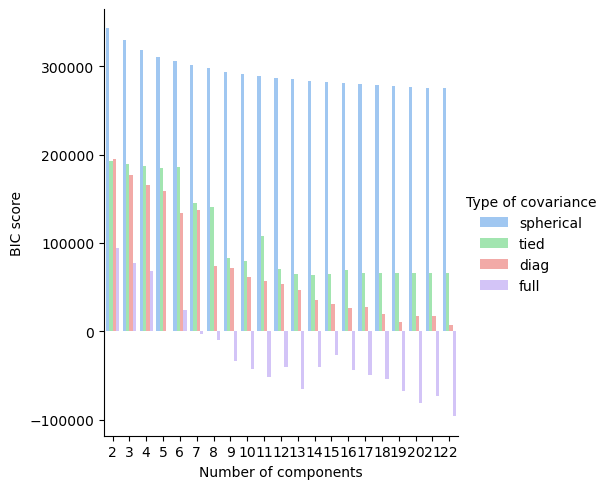

In [640]:
gmm_model_selection(X_rp_sparse_diab, comp_range_diab)

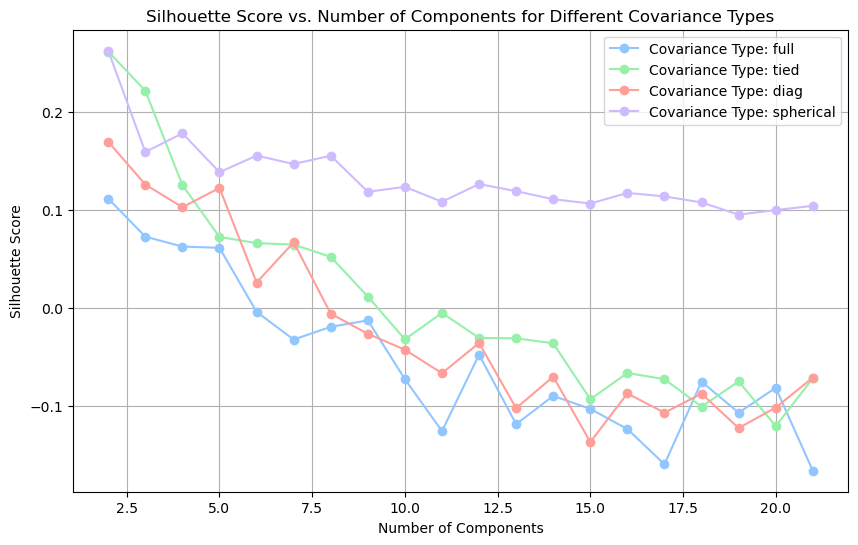

In [641]:
df_results_rp_sparse_diab = run_gmm_and_save_results(X_rp_sparse_diab, y_train_diab, cov_types, n_components_list_diab)
plot_gmm_results(df_results_rp_sparse_diab, 'Silhouette Score')

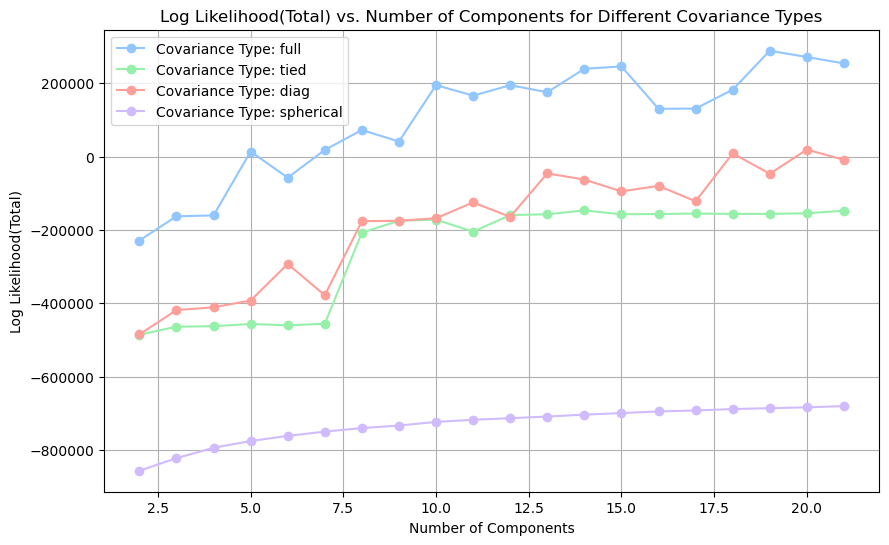

In [642]:
plot_gmm_results(df_results_rp_sparse_diab, 'Log Likelihood(Total)')

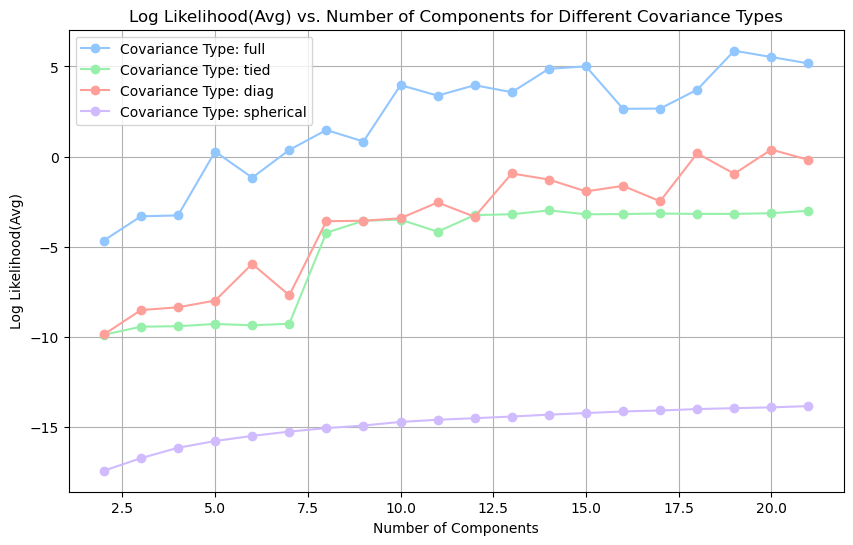

In [643]:
plot_gmm_results(df_results_rp_sparse_diab, 'Log Likelihood(Avg)')

In [644]:
df_results_rp_sparse_diab[(df_results_rp_sparse_diab ['n_components'] == 21) & 
                          (df_results_rp_sparse_diab ['Covariance Type'] == 'full')]

,Covariance Type,n_components,Fit Time (s),Homogeneity,Completeness,V-Measure,Adjusted Rand Index,Adjusted Mutual Info,Silhouette Score,Log Likelihood(Total),Log Likelihood(Avg)
19,full,21,10.4079000000,0.0610000000,0.0200000000,0.0301000000,0.0165000000,0.0299000000,-0.1663000000,253758.5844000000,5.1645000000


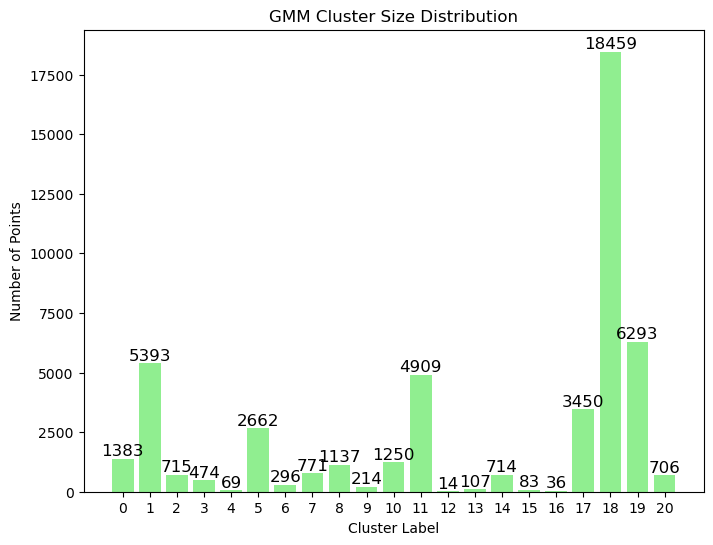

In [645]:
# Fit the best GMM model 
gmm_diab = GaussianMixture(n_components=21, covariance_type='full', random_state=42)
gmm_diab.fit(X_rp_sparse_diab)

# Get cluster labels
cluster_labels = gmm_diab.predict(X_rp_sparse_diab)

# Create a DataFrame to count the number of points in each cluster
cluster_counts = pd.Series(cluster_labels).value_counts().sort_index()

# Plot Cluster Size Distribution for GMM
plt.figure(figsize=(8, 6))
bars = plt.bar(cluster_counts.index, cluster_counts.values, color='lightgreen')

# Add annotations (number of data points) on top of each bar
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, int(yval), 
             ha='center', va='bottom', fontsize=12)

# Customize the plot
plt.title('GMM Cluster Size Distribution')
plt.xlabel('Cluster Label')
plt.ylabel('Number of Points')
plt.xticks(cluster_counts.index)
plt.grid(False)
plt.show()

In [646]:
# choose two components for the GMM model- Diabetes data 
# Fit the best GMM model 
gmm_diab = GaussianMixture(n_components=2, covariance_type='full', random_state=42)
gmm_diab.fit(X_train_diab)

# Get cluster labels
cluster_labels = gmm_diab.predict(X_train_diab)

# Create a DataFrame with actual labels and predicted clusters
df = pd.DataFrame({'TrueLabel': y_train_diab, 'Cluster': cluster_labels})

# Dynamically find unique clusters
unique_clusters = df['Cluster'].unique()

# Map each cluster to the most common true label
cluster_label_map = {}
for cluster in unique_clusters:
    # Get the most common label for the current cluster
    common_label = df[df['Cluster'] == cluster]['TrueLabel'].mode()[0]
    cluster_label_map[cluster] = common_label

# Map the predicted clusters to the corresponding labels using the mapping
mapped_labels = [cluster_label_map[cluster] for cluster in cluster_labels]

# Calculate accuracy
accuracy = accuracy_score(y_train_diab, mapped_labels)
print(f"Churn-GMM using original data match rate: {accuracy * 100:.2f}%")

Churn-GMM using original data match rate: 54.26%


Churn Data: RP-GMM

    Number of components Type of covariance       BIC score
13                     2               tied 4405.7421054508
14                     3               tied 4446.9336220548
15                     4               tied 4483.7769851991
16                     5               tied 4491.1471173884
17                     6               tied 4494.8495774299


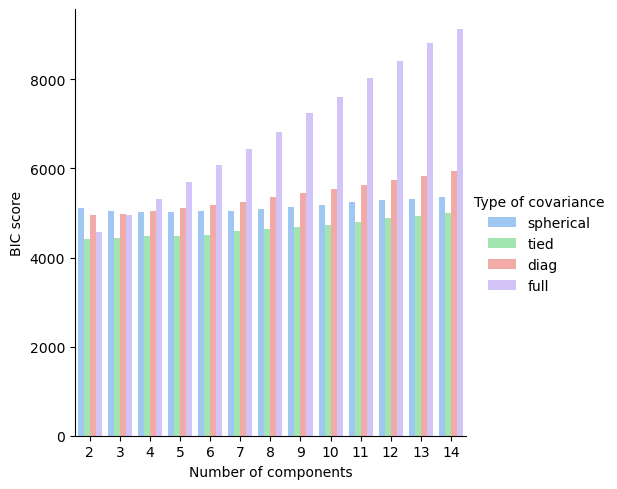

In [647]:
gmm_model_selection(X_rp_sparse, comp_range)

In [648]:
X_rp_sparse.shape

(837, 10)

In [649]:
n_components_list = np.arange(2,13,1)

In [650]:
gmm_results_rp_sparse = run_gmm_and_save_results(X_rp_sparse, y_train, cov_types, n_components_list)

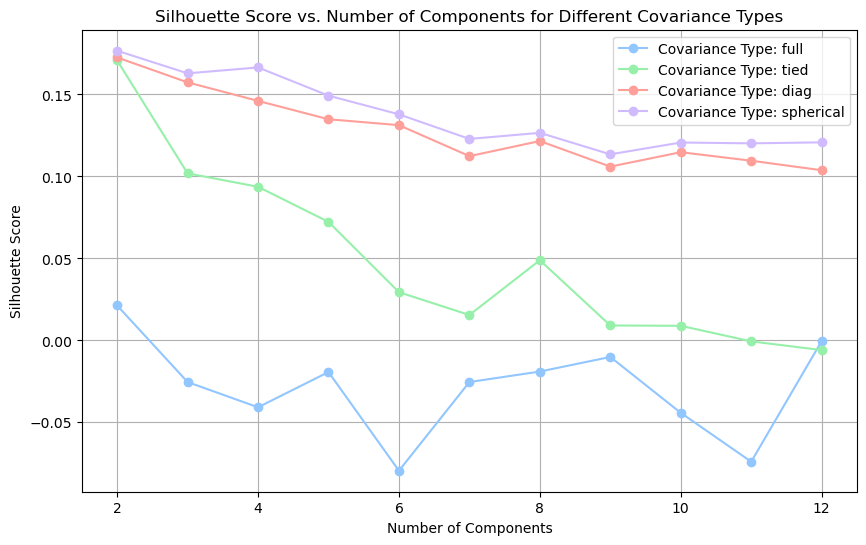

In [651]:
plot_gmm_results(gmm_results_rp_sparse, 'Silhouette Score')

In [652]:
# plot_gmm_results(gmm_results_rp_sparse, 'Homogeneity')

In [653]:
gmm_results_rp_sparse[(gmm_results_rp_sparse ['n_components'] == 2) & (gmm_results_rp_sparse ['Covariance Type'] == 'full')]

,Covariance Type,n_components,Fit Time (s),Homogeneity,Completeness,V-Measure,Adjusted Rand Index,Adjusted Mutual Info,Silhouette Score,Log Likelihood(Total),Log Likelihood(Avg)
0,full,2,0.0272000000,0.0150000000,0.0177000000,0.0163000000,0.0154000000,0.0153000000,0.0213000000,-9602.2237000000,-11.4722000000


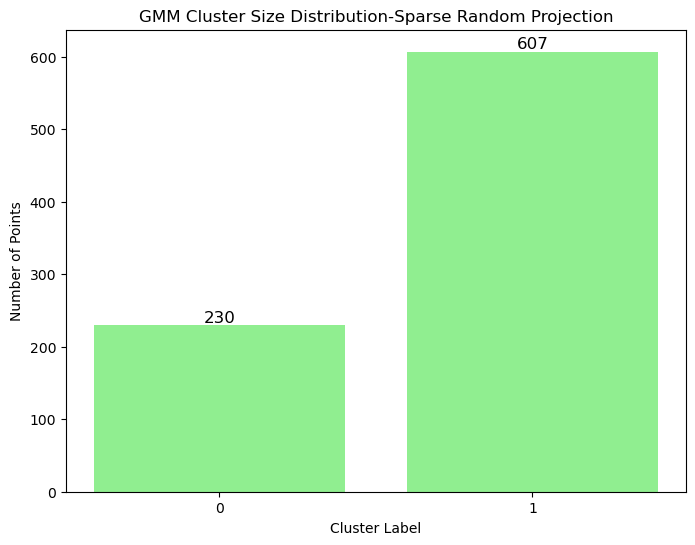

In [654]:
# Fit the best GMM model with X_pca
gmm_rp_sparse = GaussianMixture(n_components=2, covariance_type='full', random_state=0)
gmm_rp_sparse.fit(X_rp_sparse)

# Get cluster labels
cluster_labels = gmm_rp_sparse.predict(X_rp_sparse)

# Create a DataFrame to count the number of points in each cluster
cluster_counts = pd.Series(cluster_labels).value_counts().sort_index()

# Plot Cluster Size Distribution for GMM
plt.figure(figsize=(8, 6))
bars = plt.bar(cluster_counts.index, cluster_counts.values, color='lightgreen')

# Add annotations (number of data points) on top of each bar
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, int(yval), 
             ha='center', va='bottom', fontsize=12)

# Customize the plot
plt.title('GMM Cluster Size Distribution-Sparse Random Projection')
plt.xlabel('Cluster Label')
plt.ylabel('Number of Points')
plt.xticks(cluster_counts.index)
plt.grid(False)
plt.show()

In [655]:
# Fit the best GMM model 
gmm_rp = GaussianMixture(n_components=2, covariance_type='full', random_state=42)
gmm_rp.fit(X_rp_sparse)

# Get cluster labels
cluster_labels = gmm_rp.predict(X_rp_sparse)

# Create a DataFrame with actual labels and predicted clusters
df = pd.DataFrame({'TrueLabel': y_train, 'Cluster': cluster_labels})

# Dynamically find unique clusters
unique_clusters = df['Cluster'].unique()

# Map each cluster to the most common true label
cluster_label_map = {}
for cluster in unique_clusters:
    # Get the most common label for the current cluster
    common_label = df[df['Cluster'] == cluster]['TrueLabel'].mode()[0]
    cluster_label_map[cluster] = common_label

# Map the predicted clusters to the corresponding labels using the mapping
mapped_labels = [cluster_label_map[cluster] for cluster in cluster_labels]

# Calculate accuracy
accuracy = accuracy_score(y_train, mapped_labels)
print(f"Churn-GMM using original data match rate: {accuracy * 100:.2f}%")

Churn-GMM using original data match rate: 56.39%


In [656]:
# calculate intra cluster distance 
intra_cluster_distances_gmm_rp = []  # Initialize list to store distances
for i in range(gmm_rp.n_components):
    mean = gmm_rp.means_[i]
    cov_inv = np.linalg.inv(gmm_rp.covariances_[i])  # Directly use the full 2D covariance matrix
    distances = [
        gmm_rp.predict_proba(X_rp_sparse)[j][i] * mahalanobis(X_rp_sparse[j], mean, cov_inv) 
        for j in range(len(X_rp_sparse))
    ]
    intra_cluster_distances_gmm_rp.append(np.sum(distances) / np.sum(gmm_rp.predict_proba(X_rp_sparse)[:, i]))

print("Intra-cluster distances (soft assignment) for each cluster:", np.round(intra_cluster_distances_gmm_rp, 2))

Intra-cluster distances (soft assignment) for each cluster: [3.07 3.09]


In [657]:
# calculate the inter cluster distance in GMM
inter_cluster_distances_gmm_rp = []
for i in range(gmm_rp.n_components):
    for j in range(i + 1, gmm_rp.n_components):
        inter_cluster_distances_gmm_rp.append(euclidean(gmm_rp.means_[i], gmm_rp.means_[j]))

print("Inter-cluster distances:", np.round(inter_cluster_distances_gmm_rp,2))

Inter-cluster distances: [0.99]


# TSNE-GMM

Churn Data: TSNE-GMM

    Number of components Type of covariance       BIC score
0                      2          spherical 4246.7857878648
1                      3          spherical 4257.8987147258
13                     2               tied 4259.6732944910
26                     2               diag 4261.9587663166
14                     3               tied 4273.8177244236


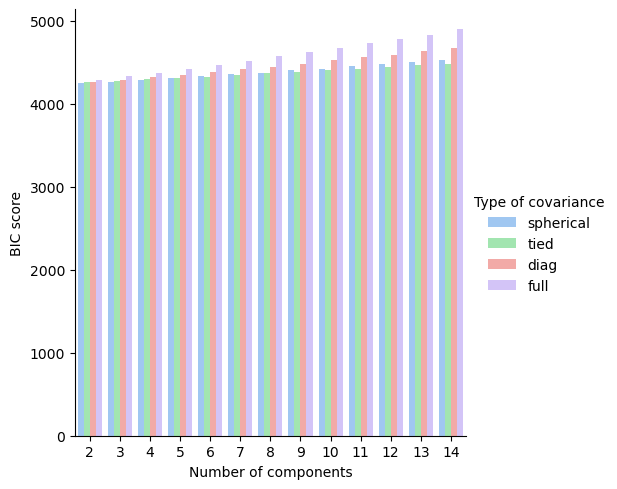

In [658]:
gmm_model_selection(X_transformed, comp_range)

In [659]:
df_results_tsne = run_gmm_and_save_results(X_transformed, y_train, cov_types, n_components_list)

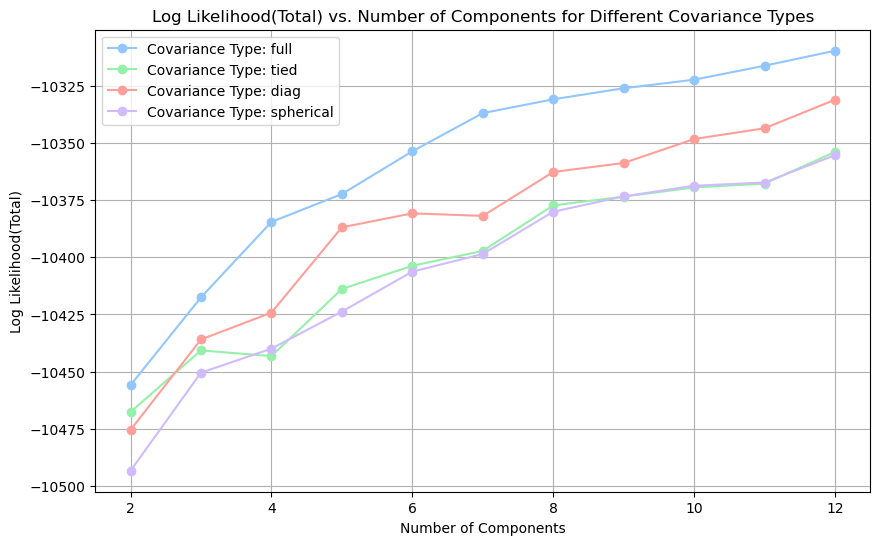

In [660]:
plot_gmm_results(df_results_tsne, 'Log Likelihood(Total)')

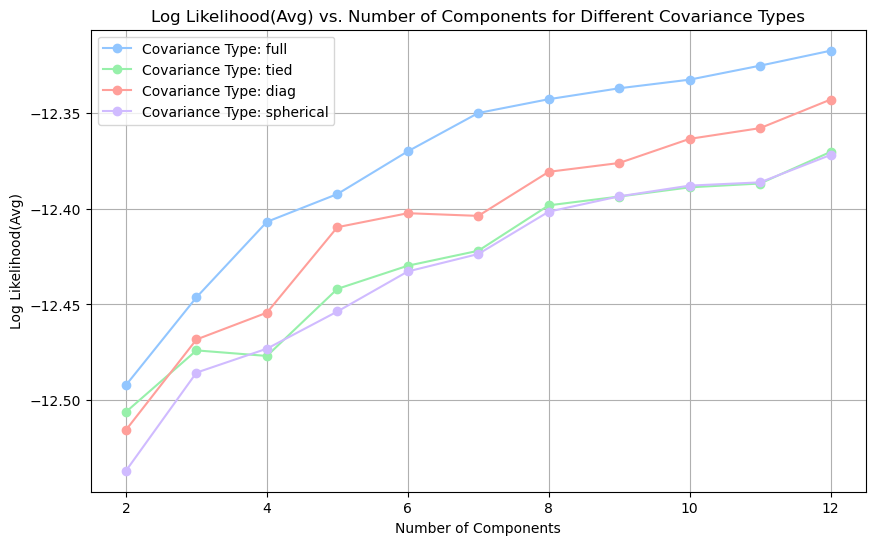

In [661]:
plot_gmm_results(df_results_tsne, 'Log Likelihood(Avg)')

In [662]:
df_results_tsne[(df_results_tsne ['n_components'] == 2) & (df_results_tsne ['Covariance Type'] == 'spherical')]

,Covariance Type,n_components,Fit Time (s),Homogeneity,Completeness,V-Measure,Adjusted Rand Index,Adjusted Mutual Info,Silhouette Score,Log Likelihood(Total),Log Likelihood(Avg)
33,spherical,2,0.0000000000,0.0179000000,0.0179000000,0.0179000000,0.0233000000,0.0170000000,0.2662000060,-10493.2741000000,-12.5368000000


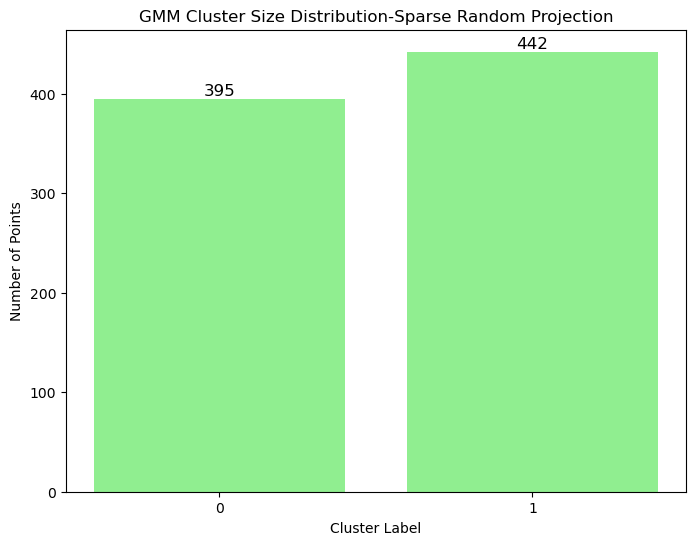

In [663]:
# Fit the best GMM model with X_pca
gmm_tsne = GaussianMixture(n_components=2, covariance_type='full', random_state=0)
gmm_tsne.fit(X_transformed)

# Get cluster labels
cluster_labels = gmm_tsne.predict(X_transformed)

# Create a DataFrame to count the number of points in each cluster
cluster_counts = pd.Series(cluster_labels).value_counts().sort_index()

# Plot Cluster Size Distribution for GMM
plt.figure(figsize=(8, 6))
bars = plt.bar(cluster_counts.index, cluster_counts.values, color='lightgreen')

# Add annotations (number of data points) on top of each bar
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, int(yval), 
             ha='center', va='bottom', fontsize=12)

# Customize the plot
plt.title('GMM Cluster Size Distribution-Sparse Random Projection')
plt.xlabel('Cluster Label')
plt.ylabel('Number of Points')
plt.xticks(cluster_counts.index)
plt.grid(False)
plt.show()

In [664]:
# calculate intra cluster distance 
intra_cluster_distances_gmm_tsne = []  # Initialize list to store distances
for i in range(gmm_tsne.n_components):
    mean = gmm_tsne.means_[i]
    cov_inv = np.linalg.inv(gmm_tsne.covariances_[i])  # Directly use the full 2D covariance matrix
    distances = [
        gmm_tsne.predict_proba(X_transformed)[j][i] * mahalanobis(X_transformed[j], mean, cov_inv) 
        for j in range(len(X_transformed))
    ]
    intra_cluster_distances_gmm_tsne.append(np.sum(distances) / np.sum(gmm_tsne.predict_proba(X_transformed)[:, i]))

print("Intra-cluster distances (soft assignment) for each cluster:", np.round(intra_cluster_distances_gmm_tsne, 2))

Intra-cluster distances (soft assignment) for each cluster: [1.65 1.65]


In [665]:
# calculate the inter cluster distance in GMM
inter_cluster_distances_gmm_tsne = []
for i in range(gmm_tsne.n_components):
    for j in range(i + 1, gmm_tsne.n_components):
        inter_cluster_distances_gmm_tsne.append(euclidean(gmm_tsne.means_[i], gmm_tsne.means_[j]))

print("Inter-cluster distances:", np.round(inter_cluster_distances_gmm_tsne,2))

Inter-cluster distances: [27.73]


In [666]:
# Create a DataFrame with actual labels and predicted clusters
df = pd.DataFrame({'TrueLabel': y_train, 'Cluster': cluster_labels})

# Dynamically find unique clusters
unique_clusters = df['Cluster'].unique()

# Map each cluster to the most common true label
cluster_label_map = {}
for cluster in unique_clusters:
    # Get the most common label for the current cluster
    common_label = df[df['Cluster'] == cluster]['TrueLabel'].mode()[0]
    cluster_label_map[cluster] = common_label

# Map the predicted clusters to the corresponding labels using the mapping
mapped_labels = [cluster_label_map[cluster] for cluster in cluster_labels]

# Calculate accuracy
accuracy = accuracy_score(y_train, mapped_labels)
print(f"Churn-GMM using original data match rate: {accuracy * 100:.2f}%")

Churn-GMM using original data match rate: 58.54%


Diabetes Data: TSNE-GMM

    Number of components Type of covariance         BIC score
67                     6               full 269594.7533750775
48                     8               diag 269631.8481498055
66                     5               full 269633.2759122429
68                     7               full 269649.0744129365
51                    11               diag 269672.8914078739


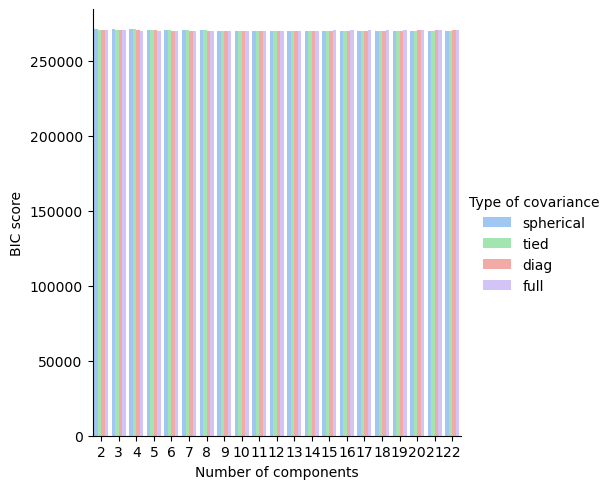

In [667]:
gmm_model_selection(X_tsne_diab, comp_range_diab)

In [668]:
gmm_results_tsne_diab = run_gmm_and_save_results(X_tsne_diab, y_train_diab, cov_types, n_components_list)

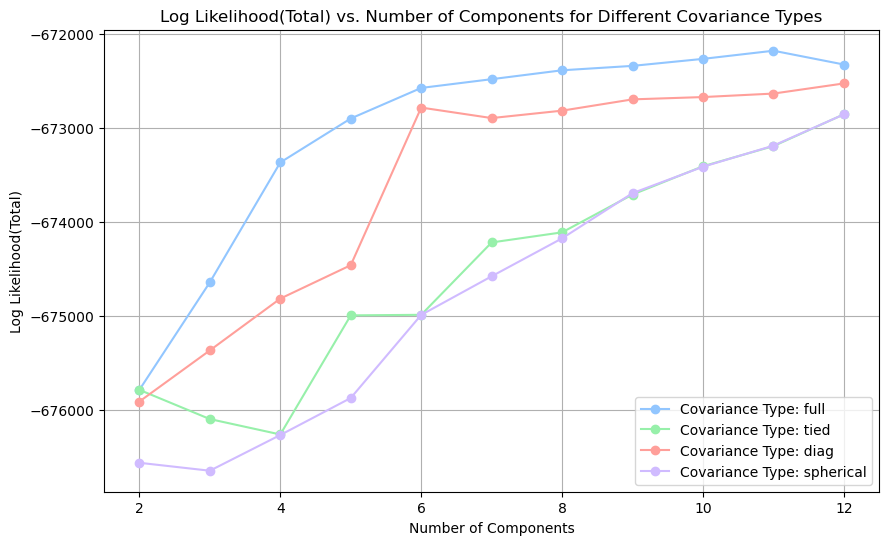

In [669]:
plot_gmm_results(gmm_results_tsne_diab, 'Log Likelihood(Total)')

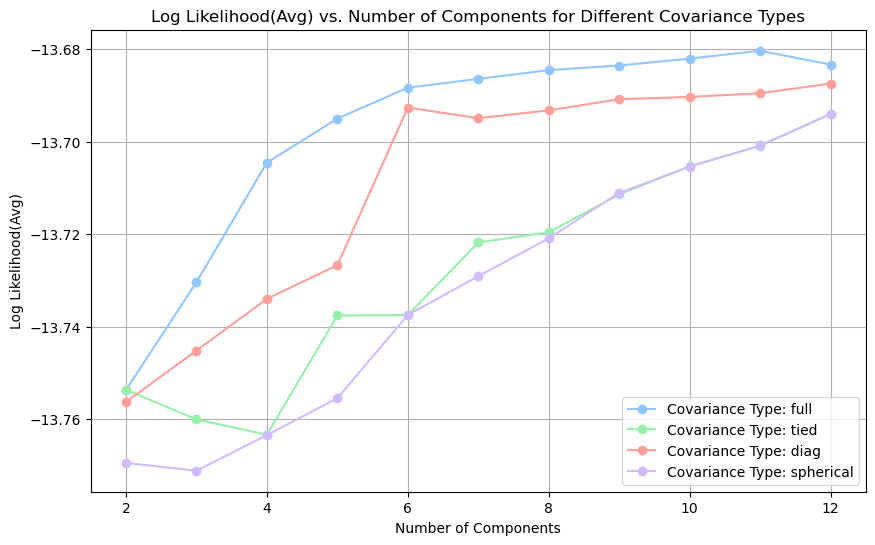

In [670]:
plot_gmm_results(gmm_results_tsne_diab, 'Log Likelihood(Avg)')

In [671]:
gmm_results_tsne_diab[(gmm_results_tsne_diab ['n_components'] == 6) & (gmm_results_tsne_diab['Covariance Type'] == 'full')]

,Covariance Type,n_components,Fit Time (s),Homogeneity,Completeness,V-Measure,Adjusted Rand Index,Adjusted Mutual Info,Silhouette Score,Log Likelihood(Total),Log Likelihood(Avg)
4,full,6,0.3004000000,0.0001000000,0.0000000000,0.0000000000,0.0000000000,0.0000000000,0.2508000135,-672575.8705000000,-13.6883000000


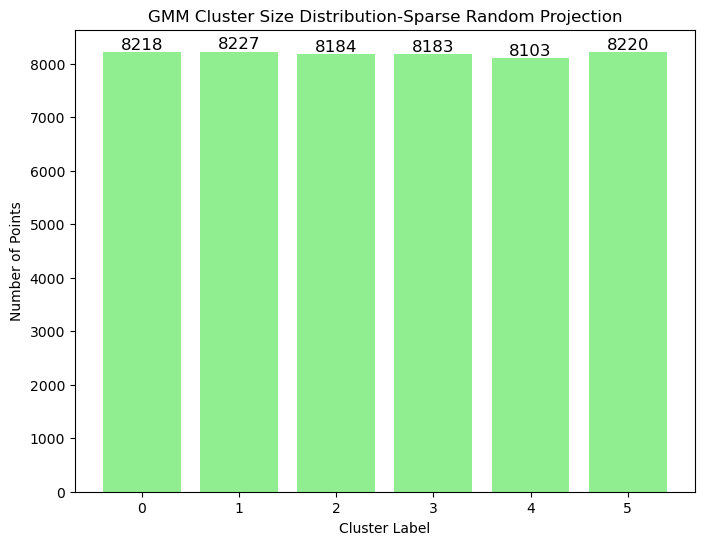

In [672]:
# Fit the best GMM model with X_pca
gmm_tsne_diab = GaussianMixture(n_components=6, covariance_type='full', random_state=0)
gmm_tsne_diab.fit(X_tsne_diab)

# Get cluster labels
cluster_labels = gmm_tsne_diab.predict(X_tsne_diab)

# Create a DataFrame to count the number of points in each cluster
cluster_counts = pd.Series(cluster_labels).value_counts().sort_index()

# Plot Cluster Size Distribution for GMM
plt.figure(figsize=(8, 6))
bars = plt.bar(cluster_counts.index, cluster_counts.values, color='lightgreen')

# Add annotations (number of data points) on top of each bar
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, int(yval), 
             ha='center', va='bottom', fontsize=12)

# Customize the plot
plt.title('GMM Cluster Size Distribution-Sparse Random Projection')
plt.xlabel('Cluster Label')
plt.ylabel('Number of Points')
plt.xticks(cluster_counts.index)
plt.grid(False)
plt.show()

In [673]:
# Fit the best GMM model with X_pca
gmm_tsne2_diab = GaussianMixture(n_components=2, covariance_type='full', random_state=0)
gmm_tsne2_diab.fit(X_tsne_diab)

# Get cluster labels
cluster_labels = gmm_tsne2_diab.predict(X_tsne_diab)

# Create a DataFrame with actual labels and predicted clusters
df = pd.DataFrame({'TrueLabel': y_train_diab, 'Cluster': cluster_labels})

# Dynamically find unique clusters
unique_clusters = df['Cluster'].unique()

# Map each cluster to the most common true label
cluster_label_map = {}
for cluster in unique_clusters:
    # Get the most common label for the current cluster
    common_label = df[df['Cluster'] == cluster]['TrueLabel'].mode()[0]
    cluster_label_map[cluster] = common_label

# Map the predicted clusters to the corresponding labels using the mapping
mapped_labels = [cluster_label_map[cluster] for cluster in cluster_labels]

# Calculate accuracy
accuracy = accuracy_score(y_train_diab, mapped_labels)
print(f"Diabetes-GMM using t-SNE data match rate: {accuracy * 100:.2f}%")

Diabetes-GMM using t-SNE data match rate: 50.21%


# Fit K-Modes model to the Diabetes Data

In [ ]:
pip install kmodes

In [674]:
from kmodes.kmodes import KModes

Original Diabetes Data

In [675]:
k_ranges = np.arange(2,23,1)
cost = []
for k in k_ranges:
    kmodes = KModes(n_clusters=k, init='Huang', n_init=5, verbose=0)
    kmodes.fit(X_train_diab)  
    cost.append(kmodes.cost_)  # Cost for current K

In [676]:
# choose k in k-mode
def k_KMode(data, k_ranges):
    cost = []
    for k in k_ranges:
        kmodes = KModes(n_clusters=k, init='Huang', n_init=5, verbose=0)
        kmodes.fit(data)  
        cost.append(kmodes.cost_)  # Cost for current K

   # Plot cost vs. K
    plt.figure(figsize=(8, 5))
    plt.plot(k_ranges, cost, marker='o')
    plt.xlabel('Number of Clusters (K)')
    plt.ylabel('Cost')
    plt.title('Elbow Method for Optimal K in KModes')
    plt.show()

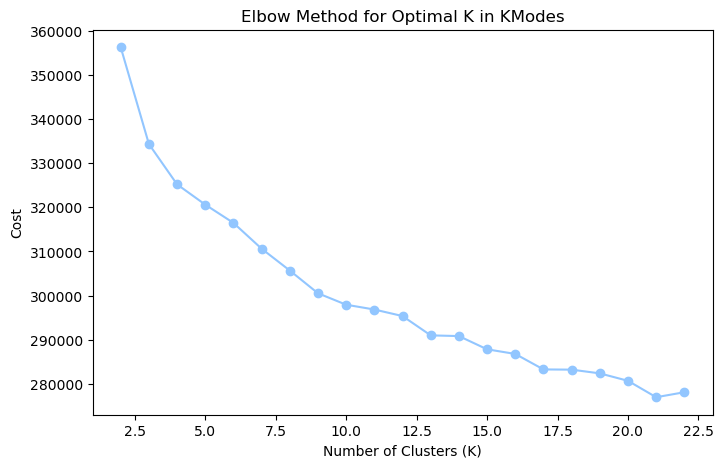

In [677]:
k_ranges = np.arange(2,23,1)
k_KMode(X_train_diab, k_ranges)

In [678]:
# Initialize KModes with the desired number of clusters
kmodes = KModes(n_clusters=11, init='Huang', n_init=5, verbose=1)

# Fit the model and predict clusters
clusters = kmodes.fit_predict(X_train_diab)

# Add the cluster labels to the DataFrame
X_train_diab['Cluster'] = clusters

# Print cluster centroids (modes) and the resulting DataFrame
print("Cluster centroids (modes):")
print(kmodes.cluster_centroids_)

print("\nData with Cluster Assignments:")
print(X_train_diab.head())

Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 1, iteration: 1/100, moves: 15425, cost: 303045.0
Run 1, iteration: 2/100, moves: 508, cost: 303045.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 2, iteration: 1/100, moves: 16324, cost: 301850.0
Run 2, iteration: 2/100, moves: 278, cost: 301850.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 3, iteration: 1/100, moves: 17625, cost: 303896.0
Run 3, iteration: 2/100, moves: 4454, cost: 301989.0
Run 3, iteration: 3/100, moves: 1535, cost: 301214.0
Run 3, iteration: 4/100, moves: 69, cost: 301214.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 4, iteration: 1/100, moves: 15087, cost: 302072.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 5, iteration: 1/100, moves: 13445, cost: 297214.0
Run 5, iteration: 2/100, moves: 1287, cost: 297214.0
Best run was num

In [679]:
# Initialize KModes with the desired number of clusters
kmodes = KModes(n_clusters=2, init='Huang', n_init=5, verbose=1)

# Fit the model and predict clusters
clusters = kmodes.fit_predict(X_train_diab)

# Create a DataFrame with true labels and predicted clusters
df = pd.DataFrame({'TrueLabel': y_train_diab, 'Cluster': clusters})

# Dynamically find unique clusters and map each cluster to the most common true label
unique_clusters = df['Cluster'].unique()
cluster_label_map = {}
for cluster in unique_clusters:
    # Find the most common label in each cluster
    common_label = df[df['Cluster'] == cluster]['TrueLabel'].mode()[0]
    cluster_label_map[cluster] = common_label

# Map the predicted clusters to the corresponding labels using the mapping
mapped_labels = [cluster_label_map[cluster] for cluster in clusters]

# Calculate accuracy
accuracy = accuracy_score(y_train_diab, mapped_labels)
print(f"Accuracy: {accuracy * 100:.2f}%")

# Calculate Adjusted Rand Index (optional for another perspective)
ari = adjusted_rand_score(y_train_diab, mapped_labels)
print(f"Adjusted Rand Index: {ari:.4f}")

Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 1, iteration: 1/100, moves: 6850, cost: 407575.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 2, iteration: 1/100, moves: 9366, cost: 399265.0
Run 2, iteration: 2/100, moves: 4035, cost: 399265.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 3, iteration: 1/100, moves: 10878, cost: 406105.0
Run 3, iteration: 2/100, moves: 3435, cost: 406105.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 4, iteration: 1/100, moves: 8919, cost: 390694.0
Run 4, iteration: 2/100, moves: 5232, cost: 390694.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 5, iteration: 1/100, moves: 9035, cost: 404681.0
Best run was number 4
Accuracy: 64.53%
Adjusted Rand Index: 0.0845


# PCA-Kmodes

In [680]:
cost_pca = []
for k in k_ranges:
    kmodes = KModes(n_clusters=k, init='Huang', n_init=5, verbose=0)
    kmodes.fit(X_pca_diab)  
    cost_pca.append(kmodes.cost_)  # Cost for current K

In [681]:
cost_ica = []
for k in k_ranges:
    kmodes = KModes(n_clusters=k, init='Huang', n_init=5, verbose=0)
    kmodes.fit(X_diab_ica)  
    cost_ica.append(kmodes.cost_)  # Cost for current K

In [682]:
cost_rp_sparse = []
for k in k_ranges:
    kmodes = KModes(n_clusters=k, init='Huang', n_init=5, verbose=0)
    kmodes.fit(X_rp_sparse_diab)  
    cost_rp_sparse.append(kmodes.cost_)  # Cost for current K

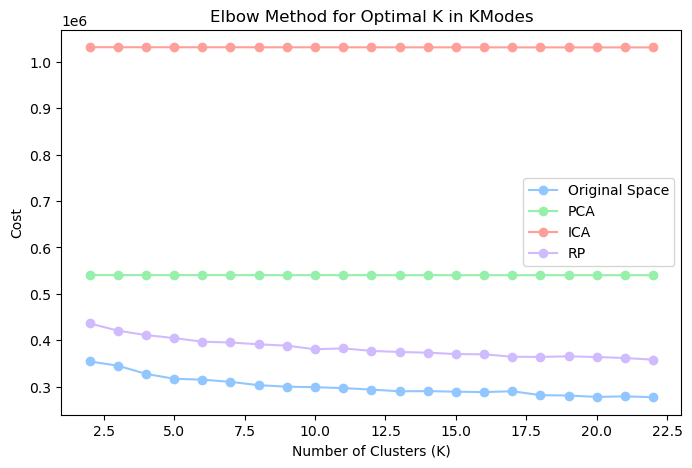

In [683]:
# Plot cost vs. K for different combinations
plt.figure(figsize=(8, 5))
plt.plot(k_ranges, cost, marker='o', label = 'Original Space')
plt.plot(k_ranges, cost_pca, marker='o', label = 'PCA')
plt.plot(k_ranges, cost_ica, marker='o', label = 'ICA')
plt.plot(k_ranges, cost_rp_sparse, marker='o', label = 'RP')
plt.xlabel('Number of Clusters (K)')
plt.ylabel('Cost')
plt.title('Elbow Method for Optimal K in KModes')
plt.legend()
plt.show()

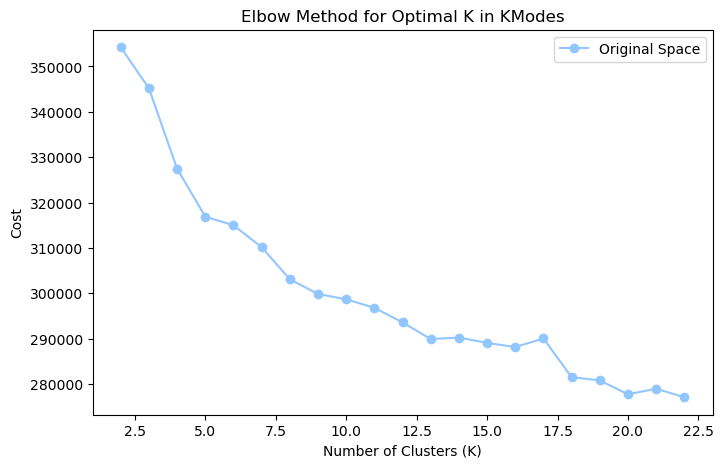

In [684]:
# Plot cost vs. K for different combinations
plt.figure(figsize=(8, 5))
plt.plot(k_ranges, cost, marker='o', label = 'Original Space')
plt.xlabel('Number of Clusters (K)')
plt.ylabel('Cost')
plt.title('Elbow Method for Optimal K in KModes')
plt.legend()
plt.show()

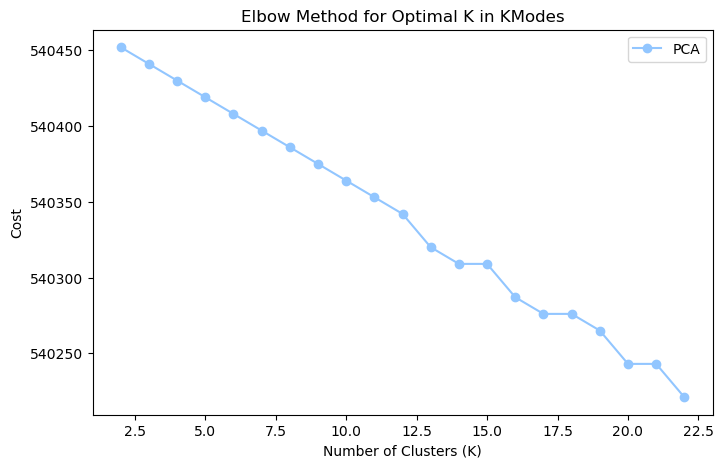

In [685]:
# Plot cost vs. K for different combinations
plt.figure(figsize=(8, 5))
plt.plot(k_ranges, cost_pca, marker='o', label = 'PCA')
plt.xlabel('Number of Clusters (K)')
plt.ylabel('Cost')
plt.title('Elbow Method for Optimal K in KModes')
plt.legend()
plt.show()

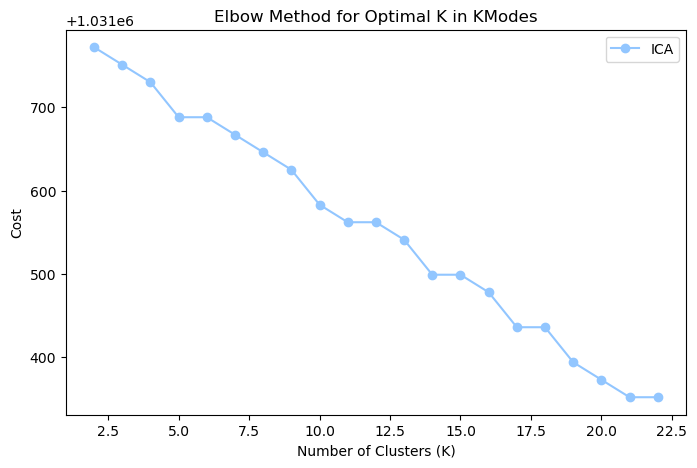

In [686]:
# Plot cost vs. K for different combinations
plt.figure(figsize=(8, 5))
plt.plot(k_ranges, cost_ica, marker='o', label = 'ICA')
plt.xlabel('Number of Clusters (K)')
plt.ylabel('Cost')
plt.title('Elbow Method for Optimal K in KModes')
plt.legend()
plt.show()

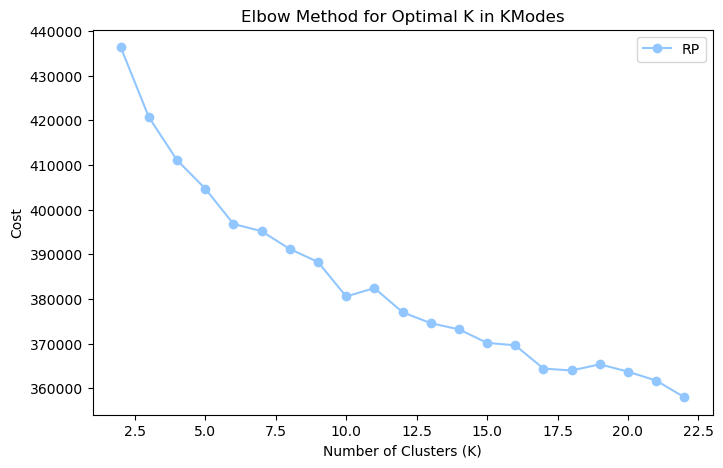

In [687]:
# Plot cost vs. K for different combinations
plt.figure(figsize=(8, 5))
plt.plot(k_ranges, cost_rp_sparse, marker='o', label = 'RP')
plt.xlabel('Number of Clusters (K)')
plt.ylabel('Cost')
plt.title('Elbow Method for Optimal K in KModes')
plt.legend()
plt.show()

In [688]:
# Initialize KModes with the desired number of clusters
kmodes = KModes(n_clusters=2, init='Huang', n_init=5, verbose=1)

# Fit the model and predict clusters
clusters = kmodes.fit_predict(X_pca_diab)

# Create a DataFrame with true labels and predicted clusters
df = pd.DataFrame({'TrueLabel': y_train_diab, 'Cluster': clusters})

# Dynamically find unique clusters and map each cluster to the most common true label
unique_clusters = df['Cluster'].unique()
cluster_label_map = {}
for cluster in unique_clusters:
    # Find the most common label in each cluster
    common_label = df[df['Cluster'] == cluster]['TrueLabel'].mode()[0]
    cluster_label_map[cluster] = common_label

# Map the predicted clusters to the corresponding labels using the mapping
mapped_labels = [cluster_label_map[cluster] for cluster in clusters]

# Calculate accuracy
accuracy = accuracy_score(y_train_diab, mapped_labels)
print(f"Accuracy: {accuracy * 100:.2f}%")

# Calculate Adjusted Rand Index (optional for another perspective)
ari = adjusted_rand_score(y_train_diab, mapped_labels)
print(f"Adjusted Rand Index: {ari:.4f}")

Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 1, iteration: 1/100, moves: 0, cost: 540452.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 2, iteration: 1/100, moves: 0, cost: 540452.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 3, iteration: 1/100, moves: 0, cost: 540452.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 4, iteration: 1/100, moves: 0, cost: 540452.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 5, iteration: 1/100, moves: 0, cost: 540452.0
Best run was number 1
Accuracy: 50.00%
Adjusted Rand Index: -0.0000


In [689]:
# Initialize KModes with the desired number of clusters
kmodes = KModes(n_clusters=2, init='Huang', n_init=5, verbose=1)

# Fit the model and predict clusters
clusters = kmodes.fit_predict(X_diab_ica)

# Create a DataFrame with true labels and predicted clusters
df = pd.DataFrame({'TrueLabel': y_train_diab, 'Cluster': clusters})

# Dynamically find unique clusters and map each cluster to the most common true label
unique_clusters = df['Cluster'].unique()
cluster_label_map = {}
for cluster in unique_clusters:
    # Find the most common label in each cluster
    common_label = df[df['Cluster'] == cluster]['TrueLabel'].mode()[0]
    cluster_label_map[cluster] = common_label

# Map the predicted clusters to the corresponding labels using the mapping
mapped_labels = [cluster_label_map[cluster] for cluster in clusters]

# Calculate accuracy
accuracy = accuracy_score(y_train_diab, mapped_labels)
print(f"Accuracy: {accuracy * 100:.2f}%")

# Calculate Adjusted Rand Index (optional for another perspective)
ari = adjusted_rand_score(y_train_diab, mapped_labels)
print(f"Adjusted Rand Index: {ari:.4f}")

Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 1, iteration: 1/100, moves: 0, cost: 1031772.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 2, iteration: 1/100, moves: 0, cost: 1031772.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 3, iteration: 1/100, moves: 0, cost: 1031772.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 4, iteration: 1/100, moves: 0, cost: 1031772.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 5, iteration: 1/100, moves: 0, cost: 1031772.0
Best run was number 1
Accuracy: 50.00%
Adjusted Rand Index: -0.0000


In [690]:
# Initialize KModes with the desired number of clusters
kmodes = KModes(n_clusters=2, init='Huang', n_init=5, verbose=1)

# Fit the model and predict clusters
clusters = kmodes.fit_predict(X_rp_sparse_diab)

# Create a DataFrame with true labels and predicted clusters
df = pd.DataFrame({'TrueLabel': y_train_diab, 'Cluster': clusters})

# Dynamically find unique clusters and map each cluster to the most common true label
unique_clusters = df['Cluster'].unique()
cluster_label_map = {}
for cluster in unique_clusters:
    # Find the most common label in each cluster
    common_label = df[df['Cluster'] == cluster]['TrueLabel'].mode()[0]
    cluster_label_map[cluster] = common_label

# Map the predicted clusters to the corresponding labels using the mapping
mapped_labels = [cluster_label_map[cluster] for cluster in clusters]

# Calculate accuracy
accuracy = accuracy_score(y_train_diab, mapped_labels)
print(f"Accuracy: {accuracy * 100:.2f}%")

# Calculate Adjusted Rand Index (optional for another perspective)
ari = adjusted_rand_score(y_train_diab, mapped_labels)
print(f"Adjusted Rand Index: {ari:.4f}")

Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 1, iteration: 1/100, moves: 12681, cost: 436712.0
Run 1, iteration: 2/100, moves: 5471, cost: 435864.0
Run 1, iteration: 3/100, moves: 1319, cost: 435864.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 2, iteration: 1/100, moves: 12543, cost: 439942.0
Run 2, iteration: 2/100, moves: 6360, cost: 439942.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 3, iteration: 1/100, moves: 10679, cost: 440189.0
Run 3, iteration: 2/100, moves: 815, cost: 440189.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 4, iteration: 1/100, moves: 9838, cost: 454788.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 5, iteration: 1/100, moves: 7832, cost: 437447.0
Run 5, iteration: 2/100, moves: 3263, cost: 435936.0
Run 5, iteration: 3/100, moves: 70, cost: 435936.0
Best run was numb

# Neural Network using churn data

In [169]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Input, Dense, Dropout
from tensorflow.keras.optimizers import Adam, SGD
from sklearn.model_selection import StratifiedKFold
from tensorflow.keras.callbacks import EarlyStopping 

In [170]:
tf.random.set_seed(88)

# ANN-PCA

In [379]:
df_pca = pd.DataFrame(X_pca)

In [458]:
pca_start_time = time.time()
seeds = np.arange(1,6)
recall_values = []
for seed in seeds:
    ANN_model = Sequential([
        Input(shape=(df_pca.shape[1],)),   
        Dense(60, activation='relu'),
        Dense(5, activation='relu'),
        Dense(1, activation='sigmoid')  # Output layer for binary classification
        ])

    ANN_model.compile(optimizer=Adam(learning_rate=0.01),
                  loss='binary_crossentropy',
                  metrics=['recall'])

    history = ANN_model.fit(df_pca, y_train, batch_size = 30, epochs = 30, validation_split=0.3, verbose = 0, shuffle = False)

    X_pca_test = pca.fit_transform(X_test)
    loss, recall = ANN_model.evaluate(X_pca_test,y_test)
    recall_values.append(recall)
pca_end_time = time.time()
pca_ellapse_time = pca_end_time - pca_start_time
print(f'Test recall: {np.mean(recall_values):.2f}')

12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 1.6061 - recall: 0.6051 
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.3488 - recall: 0.5861 
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 708us/step - loss: 2.5001 - recall: 0.5534
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 753us/step - loss: 2.4506 - recall: 0.7118
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 2.0862 - recall: 0.5571 
Test recall: 0.55


In [381]:
pca_ellapse_time

11.49606990814209

In [382]:
def tune_layer1(features, neurons, hl2neurons, actfunc, lr):
    ## using cross validation find the best number of neurons in the first hidden layer 
    ANN_Neurons_HL1 = {}
    neuron_num_hl1 = neurons

    # Create a stratified K-Fold object for cross-validation
    kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

    for num in neuron_num_hl1:
        cv_recall_scores = []  # To store recall for each fold
    
        for train_idx, val_idx in kfold.split(features, y_train):
           # Split the data
            X_cv_train, X_cv_val = features.iloc[train_idx], features.iloc[val_idx]
            y_cv_train, y_cv_val = y_train.iloc[train_idx], y_train.iloc[val_idx]
        
            # Define the model
            model = Sequential([
               Input(shape=(features.shape[1],)),   
               Dense(num, activation= actfunc),
               Dense(hl2neurons, activation= actfunc), 
               Dense(1, activation='sigmoid')  # Output layer for binary classification
                ])

            # Compile the model
            model.compile(optimizer=Adam(learning_rate=lr),
                      loss='binary_crossentropy',
                      metrics=['recall'])

            # Train the model
            model.fit(X_cv_train, y_cv_train, batch_size=30, epochs=30, verbose=0, shuffle=False)
        
            # Evaluate the model on the validation data
            loss, recall = model.evaluate(X_cv_val, y_cv_val, verbose=0)
        
            # Store recall score for this fold
            cv_recall_scores.append(recall)
    
            # Calculate the average recall across all folds
            mean_recall = np.mean(cv_recall_scores)
    
            # Store the mean recall score for this configuration
            model_name = "ANN-Neuron-HL1={}".format(num)
            ANN_Neurons_HL1[model_name] = mean_recall
    
    ANN_Neurons_HL1 = pd.DataFrame.from_dict( ANN_Neurons_HL1, orient='index', columns=['Recall'])
    
    # plot Recall vs. Neurons in 1st Hidden Layer
    plt.figure(figsize=(12, 6))
    plt.plot(neuron_num_hl1,  ANN_Neurons_HL1["Recall"], marker='o', linestyle='-', color='blue', label='Recall_CV')
    plt.xlabel('Neurons in 1st Hidden Layer')
    plt.ylabel('Recall')
    plt.title('Recall vs. Neurons in 1st Hidden Layer')
    plt.legend()
    plt.grid(True)
    plt.show()

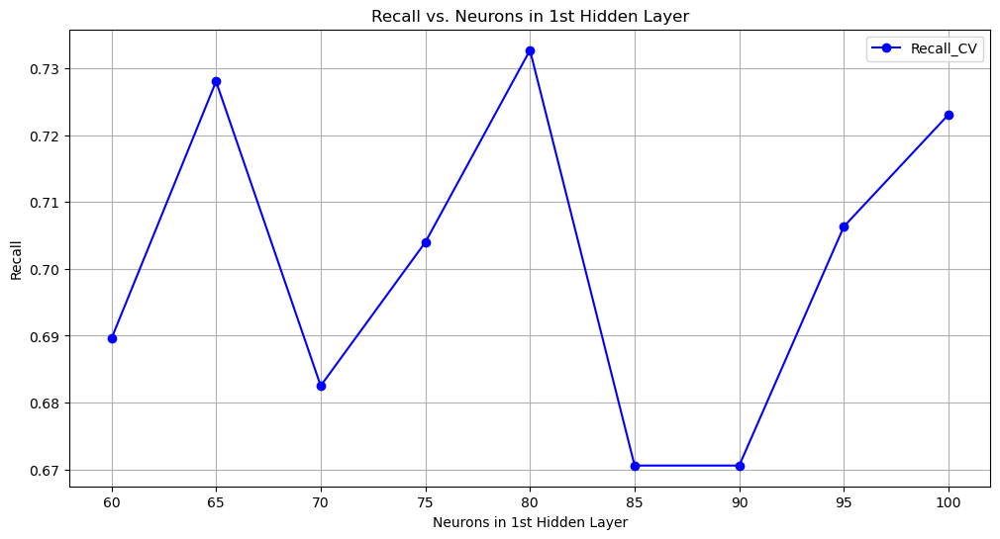

In [383]:
neurons = np.array([60, 65, 70, 75, 80, 85, 90, 95, 100])
tune_layer1(df_pca, neurons, 5, 'relu', 0.01)

In [384]:
def tune_2ndlayer(features, neurons, hl1neurons, actfunc, lr):
    ## using cross validation to find the best best number of neorons in the second hidden layer
    ANN_Neurons_HL2 = {}
    neuron_num_hl2 = neurons 
                          
    # Create a stratified K-Fold object for cross-validation
    kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

    for num_hl2 in neuron_num_hl2:
        cv_recall_scores = []  # To store recall for each fold
    
        for train_idx, val_idx in kfold.split(features, y_train):
            # Split the data
            X_cv_train, X_cv_val = features.iloc[train_idx], features.iloc[val_idx]
            y_cv_train, y_cv_val = y_train.iloc[train_idx], y_train.iloc[val_idx]
            # Define the model
            model = Sequential([
               Input(shape=(features.shape[1],)),   
               Dense(hl1neurons, activation= actfunc),
               Dense(num_hl2, activation= actfunc), 
               Dense(1, activation='sigmoid')  # Output layer for binary classification
                 ])

            # Compile the model
            model.compile(optimizer=Adam(learning_rate=lr),
                  loss='binary_crossentropy',
                  metrics=['recall'])
    
            # Train the model
            model.fit(X_cv_train, y_cv_train, batch_size=30, epochs=30, validation_split=0.3, verbose=0, shuffle=False)
    
            # Evaluate the model on the validation data
            loss, recall = model.evaluate(X_cv_val, y_cv_val, verbose=0)
        
            # Store recall score for this fold
            cv_recall_scores.append(recall)
    
            # Calculate the average recall across all folds
            mean_recall = np.mean(cv_recall_scores)
                          
            # Store the mean recall score for this configuration
            model_name = "ANN-Neuron-HL2={}".format(num_hl2)
            ANN_Neurons_HL2[model_name] = mean_recall
            
    ANN_Neurons_HL2 = pd.DataFrame.from_dict( ANN_Neurons_HL2, orient='index', columns=['Recall'])
    
    # Plot Recall vs. Neurons in 2nd Hidden Layer
    plt.figure(figsize=(12, 6))
    plt.plot(neuron_num_hl2,  ANN_Neurons_HL2["Recall"], marker='o', linestyle='-', color='blue', label='Recall_CV')
    plt.xlabel('Neurons in 2nd Hidden Layer')
    plt.ylabel('Recall')
    plt.title('Recall vs. Neurons in 2nd Hidden Layer')
    plt.legend()
    plt.grid(True)
    plt.show()

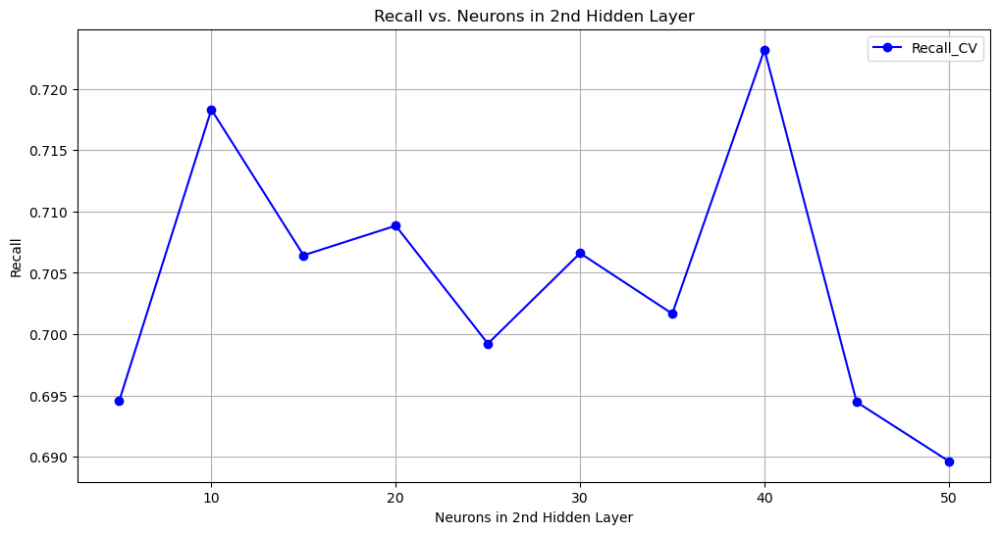

In [387]:
neurons = np.arange(5, 55, 5)
tune_2ndlayer(df_pca, neurons, 80, 'relu', 0.01)

In [388]:
def tune_learningrate(features, hl1neurons, hl2neurons, actfunc, lr):
    ## using cross validation to find the best learning rate
    ANN_LR = {}
    # Create a stratified K-Fold object for cross-validation
    kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

    for lr in lr_values:
        cv_recall_scores = []  # To store recall for each fold
    
        for train_idx, val_idx in kfold.split(features, y_train):
            # Split the data
            X_cv_train, X_cv_val = features.iloc[train_idx], features.iloc[val_idx]
            y_cv_train, y_cv_val = y_train.iloc[train_idx], y_train.iloc[val_idx]
        
            # Define the model
            model = Sequential([
               Input(shape=(features.shape[1],)),   
               Dense(hl1neurons, activation = actfunc),
               Dense(hl2neurons, activation = actfunc), 
               Dense(1, activation='sigmoid')  # Output layer for binary classification
                  ])

             # Compile the model
            model.compile(optimizer=Adam(learning_rate=lr),
                  loss='binary_crossentropy',
                  metrics=['recall'])
    
            # Train the model
            model.fit(X_cv_train, y_cv_train, batch_size=30, epochs=30, validation_split=0.3, verbose=0, shuffle=False)
    
            # Evaluate the model on the validation data
            loss, recall = model.evaluate(X_cv_val, y_cv_val, verbose=0)
        
            # Store recall score for this fold
            cv_recall_scores.append(recall)
    
            # Calculate the average recall across all folds
            mean_recall = np.mean(cv_recall_scores)
                          
            # Store the mean recall score for this configuration
            model_name = "ANN-LR={}".format(lr)
            ANN_LR[model_name] = mean_recall
            
    ANN_LR = pd.DataFrame.from_dict(ANN_LR, orient='index', columns=['Recall'])
    
    # plot Recall vs. Learning Rate in ANN
    plt.figure(figsize=(12, 6))
    plt.plot(lr_values,  ANN_LR["Recall"], marker='o', linestyle='-', color='blue', label='Recall_CV')
    plt.xlabel('Learning Rate')
    plt.ylabel('Recall')
    plt.title('Recall vs. Learning Rate in ANN')
    plt.legend()
    plt.grid(True)
    plt.show()

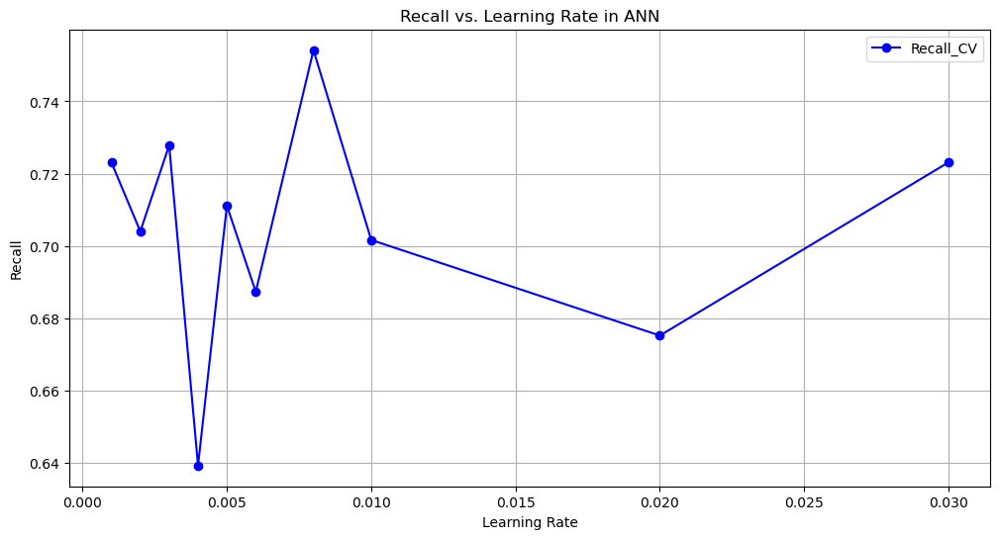

In [389]:
lr_values = np.array([ 0.001, 0.002, 0.003,0.004, 0.005, 0.006, 0.008, 0.01, 0.02, 0.03])
tune_learningrate(df_pca, 80, 40, 'relu', lr_values)

In [390]:
def tune_activations(features, hl1neurons, hl2neurons, actfuncs, lr):
    ANN_actfuncs = {}

    # Create a stratified K-Fold object for cross-validation
    kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

    for actfunc in actfuncs:  # Iterate over each activation function in the list
            cv_recall_scores = []  # To store recall for each fold
        
            for train_idx, val_idx in kfold.split(features, y_train):
                # Split the data
                X_cv_train, X_cv_val = features.iloc[train_idx], features.iloc[val_idx]
                y_cv_train, y_cv_val = y_train.iloc[train_idx], y_train.iloc[val_idx]
            
                # Define the model
                model = Sequential([
                    Input(shape=(features.shape[1],)),   
                    Dense(hl1neurons, activation = actfunc ),  
                    Dense(hl2neurons, activation= actfunc),  
                    Dense(1, activation='sigmoid')  
                ])

                # Compile the model
                model.compile(optimizer=Adam(learning_rate=lr),
                              loss='binary_crossentropy',
                              metrics=['recall'])

                # Train the model
                model.fit(X_cv_train, y_cv_train, batch_size=30, epochs=30, verbose=0, shuffle=False)
            
                # Evaluate the model on the validation data
                loss, recall = model.evaluate(X_cv_val, y_cv_val, verbose=0)
            
                # Store recall score for this fold
                cv_recall_scores.append(recall)
        
            # Calculate the average recall across all folds
            mean_recall = np.round(np.mean(cv_recall_scores),2)
        
            # Store the mean recall score for this configuration
            model_name = "ActFunc={}".format(actfunc)
            ANN_actfuncs[model_name] = mean_recall

    # Convert results to DataFrame
    ANN_actfuncs = pd.DataFrame.from_dict(ANN_actfuncs, orient='index', columns=['Recall'])
    
    # Plot Recall vs. Neurons in 1st Hidden Layer for each activation function
    plt.figure(figsize=(12, 6))
    plt.bar(actfuncs, ANN_actfuncs['Recall'], color='skyblue')
    plt.xlabel('Activation Function')
    plt.ylabel('Recall')
    plt.title('Recall vs. Activation Functions')
    plt.legend()
    plt.grid(False)
    plt.show()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


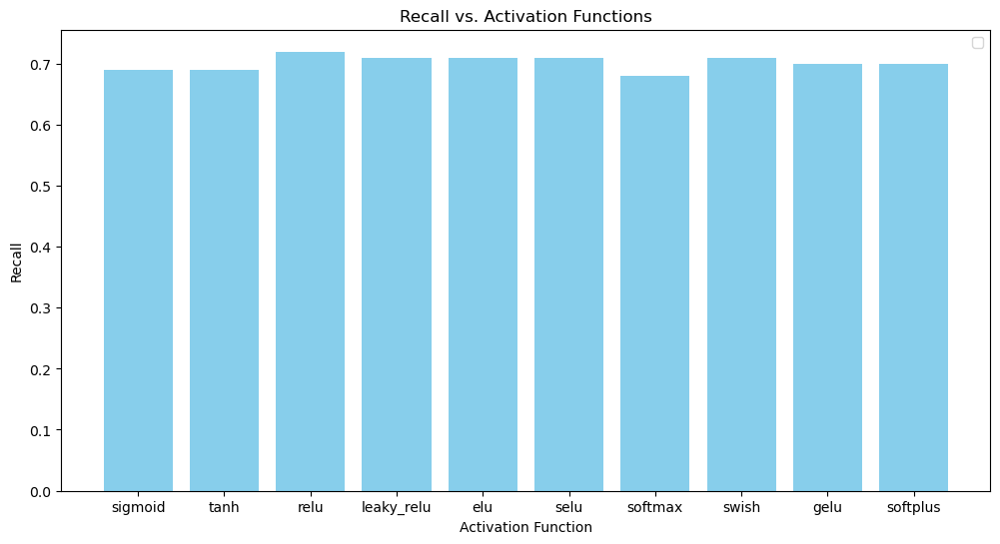

In [391]:
actfuncs = ["sigmoid", "tanh", "relu", "leaky_relu",  "elu", "selu", "softmax", "swish", "gelu", "softplus"]
tune_activations(df_pca, 80, 40, actfuncs, 0.008)

In [466]:
pca_start_time = time.time()
seeds = np.arange(1,6)
recall_values = []
for seed in seeds:
    ANN_model = Sequential([
        Input(shape=(df_pca.shape[1],)),   
        Dense(80, activation='relu'),
        Dense(10, activation='relu'),
        Dense(1, activation='sigmoid')  # Output layer for binary classification
       ])

    ANN_model.compile(optimizer=Adam(learning_rate=0.008),
                  loss='binary_crossentropy',
                  metrics=['recall'])
    history = ANN_model.fit(df_pca, y_train, batch_size = 30, epochs = 30, validation_split=0.3, verbose = 0, shuffle = False)
    loss, recall = ANN_model.evaluate(X_pca_test,y_test)
    print(recall)
    recall_values.append(recall)

print(f'Test recall: {np.mean(recall_values):.2f}')   
pca_end_time = time.time()
pca_ellapse_time = pca_end_time - pca_start_time

12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 962us/step - loss: 2.3430 - recall: 0.5578
0.5139665007591248
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 2.3395 - recall: 0.6420 
0.575419008731842
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.5172 - recall: 0.6169 
0.5698323845863342
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.5100 - recall: 0.6067
0.5865921974182129
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 2.4726 - recall: 0.6871 
0.6536312699317932
Test recall: 0.58


In [467]:
pca_ellapse_time

11.465671062469482

In [468]:
ANN_result = pd.DataFrame(history.history)

In [469]:
pred_binary = np.where(ANN_model.predict(X_pca_test) > 0.5, 1, 0)

12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


In [470]:
pred_binary = pd.DataFrame(pred_binary)
pred_binary.value_counts()

0
1    202
0    157
Name: count, dtype: int64

In [471]:
y_test.value_counts()

churn
0    180
1    179
Name: count, dtype: int64

In [472]:
cm_ann = confusion_matrix(y_test, pred_binary)
cm_ann

array([[ 95,  85],
       [ 62, 117]], dtype=int64)

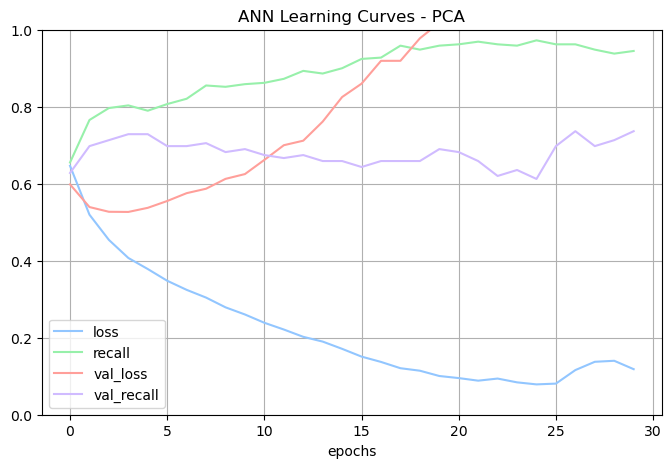

In [473]:
pd.DataFrame(history.history).plot(figsize=(8,5))
plt.title('ANN Learning Curves - PCA')
plt.xlabel('epochs')
plt.legend(loc='best')
plt.grid(True)
plt.gca().set_ylim(0,1)

plt.show()

# ANN-ICA

In [474]:
df_churn_ica = pd.DataFrame(X_churn_ica)

In [501]:
ica_start_time = time.time()
seeds = np.arange(1,6)
recall_values = []
for seed in seeds:
    ANN_model = Sequential([
        Input(shape=(df_churn_ica.shape[1],)),   
        Dense(60, activation='relu'),
        Dense(5, activation='relu'),
        Dense(1, activation='sigmoid')  # Output layer for binary classification
           ])

    ANN_model.compile(optimizer=Adam(learning_rate=0.01),
                  loss='binary_crossentropy',
                  metrics=['recall'])

    history = ANN_model.fit(df_churn_ica, y_train, batch_size = 30, epochs = 30, validation_split=0.3, verbose = 0, shuffle = False)
   
    X_ica_test = ica_churn.fit_transform(X_test)
    loss, recall = ANN_model.evaluate(X_ica_test,y_test)
    recall_values.append(recall)
    
print(f'Test recall: {np.mean(recall_values):.2f}')
ica_end_time = time.time()
ica_ellapse_time = ica_end_time - ica_start_time

12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 782us/step - loss: 2.8896 - recall: 0.4810
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.6480 - recall: 0.5008  
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 841us/step - loss: 2.8414 - recall: 0.5252
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 2.7563 - recall: 0.5324 
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 922us/step - loss: 3.6350 - recall: 0.3865
Test recall: 0.47


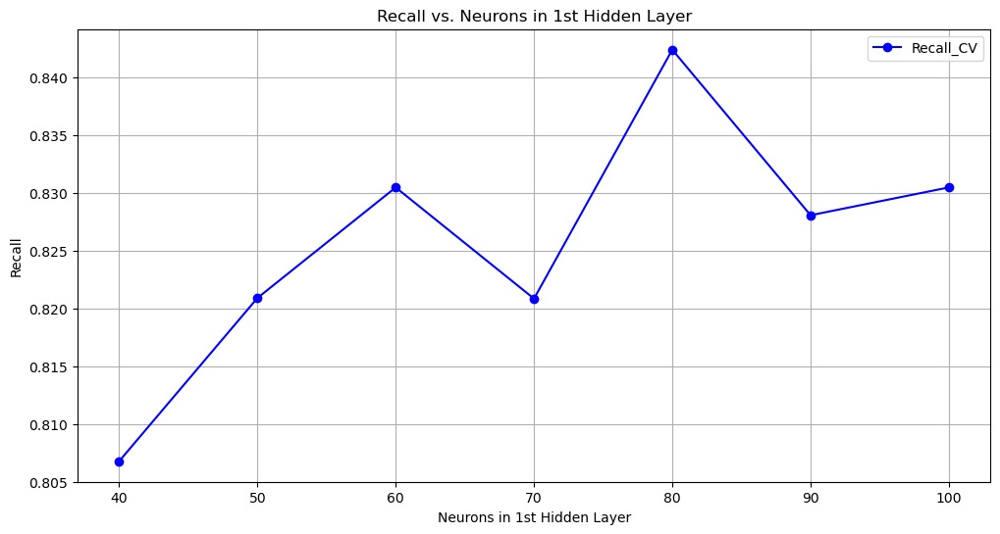

In [477]:
neurons = np.array([ 40, 50, 60, 70, 80, 90, 100])
tune_layer1(df_churn_ica, neurons, 30, 'relu', 0.0005)

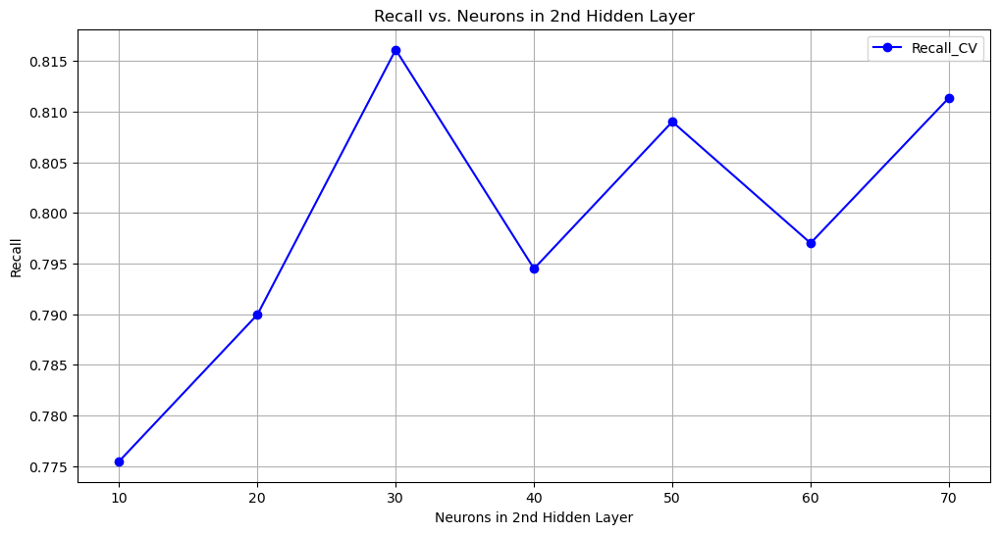

In [478]:
neurons = np.array([10,20,30, 40, 50, 60, 70])
tune_2ndlayer(df_churn_ica, neurons, 80, 'relu', 0.0005)

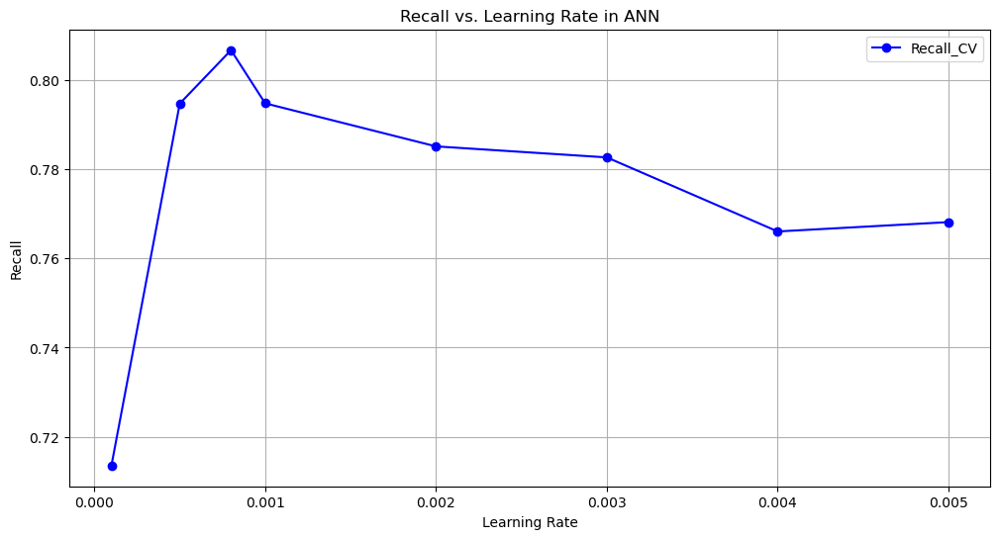

In [506]:
lr_values = np.array([0.0001, 0.0005, 0.0008, 0.001, 0.002, 0.003,0.004, 0.005])
tune_learningrate(df_churn_ica, 80, 30, 'relu', lr_values)

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


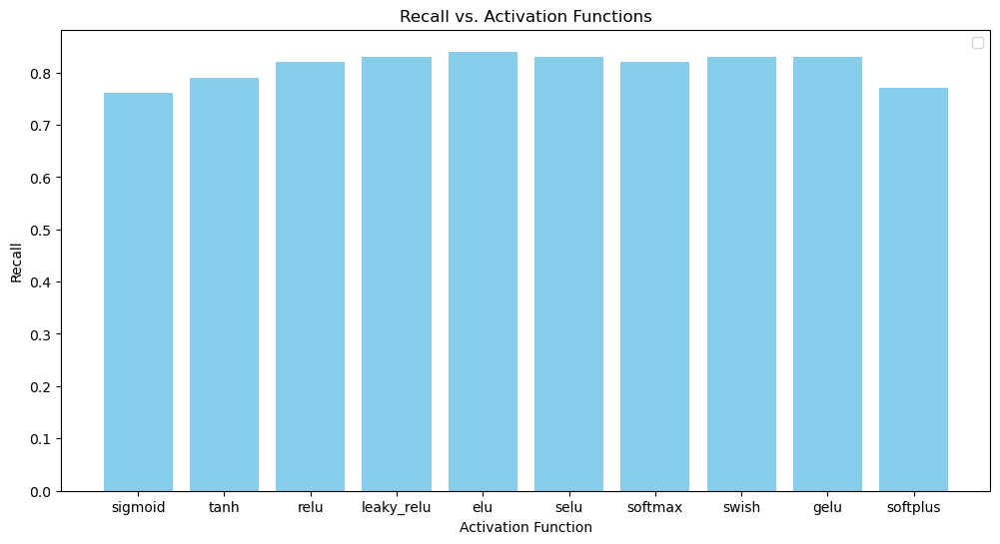

In [507]:
actfuncs = ["sigmoid", "tanh", "relu", "leaky_relu",  "elu", "selu", "softmax", "swish", "gelu", "softplus"]
tune_activations(df_churn_ica, 80, 30, actfuncs, 0.0008)

In [516]:
start_time_ica = time.time()
seeds = np.arange(1,6)
recall_values = []
for seed in seeds:
    ANN_model = Sequential([
        Input(shape=(df_churn_ica.shape[1],)),   
        Dense(80, activation='elu'),
        Dense(20, activation='elu'),
        Dense(1, activation='sigmoid')  # Output layer for binary classification
        ])

    ANN_model.compile(optimizer=Adam(learning_rate=0.01),
                  loss='binary_crossentropy',
                  metrics=['recall'])

    history = ANN_model.fit(df_churn_ica, y_train, batch_size = 30, epochs = 30, validation_split=0.3, verbose = 0, shuffle = False)
    X_ica_test = ica_churn.fit_transform(X_test)
    loss, recall = ANN_model.evaluate(X_ica_test,y_test)
    recall_values.append(recall)
    
print(f'Test recall: {np.mean(recall_values):.2f}')
end_time_ica = time.time()
ellapsed_time_ica = end_time_ica  - start_time_ica

12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 3.2107 - recall: 0.4845 
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 893us/step - loss: 2.7135 - recall: 0.5474
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 4.1829 - recall: 0.4883 
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 857us/step - loss: 2.1117 - recall: 0.5776
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 3.2695 - recall: 0.4586 
Test recall: 0.51


In [517]:
ellapsed_time_ica

11.940192937850952

In [518]:
pred_binary = np.where(ANN_model.predict(X_ica_test) > 0.5, 1, 0)
pred_binary = pd.DataFrame(pred_binary)
pred_binary.value_counts()

12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


0
0    205
1    154
Name: count, dtype: int64

In [519]:
cm_ann = confusion_matrix(y_test, pred_binary)
cm_ann

array([[103,  77],
       [102,  77]], dtype=int64)

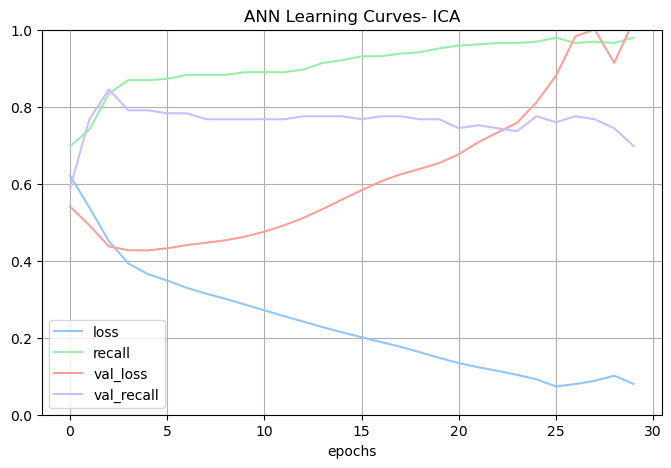

In [520]:
pd.DataFrame(history.history).plot(figsize=(8,5))
plt.title('ANN Learning Curves- ICA')
plt.xlabel('epochs')
plt.legend(loc='best')
plt.grid(True)
plt.gca().set_ylim(0,1)

plt.show()

# ANN-Sparse Random Projection

In [175]:
df_rp_sparse = pd.DataFrame(X_rp_sparse)

In [497]:
rp_start_time = time.time()
seeds = np.arange(1,6)
recall_values = []
for seed in seeds:
    ANN_model = Sequential([
        Input(shape=(df_rp_sparse.shape[1],)),   
        Dense(60, activation='relu'),
        Dense(5, activation='relu'),
        Dense(1, activation='sigmoid')  # Output layer for binary classification
         ])

    ANN_model.compile(optimizer=Adam(learning_rate=0.01),
                  loss='binary_crossentropy',
                  metrics=['recall'])

    history = ANN_model.fit(df_rp_sparse, y_train, batch_size = 30, epochs = 30, validation_split=0.3, verbose = 0, shuffle = False)

    X_rp_sparse_test = transformer_sparse.fit_transform(X_test)
    loss, recall = ANN_model.evaluate(X_rp_sparse_test,y_test)
    recall_values.append(recall)
print(f'Test recall: {np.mean(recall_values):.2f}')
rp_end_time = time.time()
rp_ellapse_time = rp_end_time - rp_start_time

12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 4.7512 - recall: 0.7173
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 838us/step - loss: 3.2555 - recall: 0.3656
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 4.0016 - recall: 0.6752 
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 7.6560 - recall: 0.5938
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 927us/step - loss: 3.9120 - recall: 0.4342
Test recall: 0.57


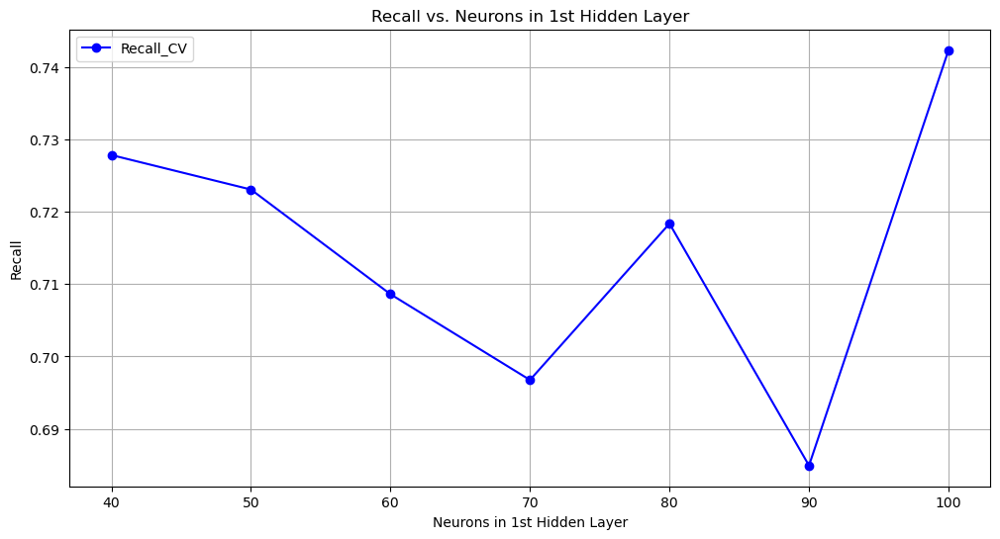

In [179]:
neurons = np.array([ 40, 50, 60, 70, 80, 90, 100])
tune_layer1(df_rp_sparse, neurons, 5, 'relu', 0.01)

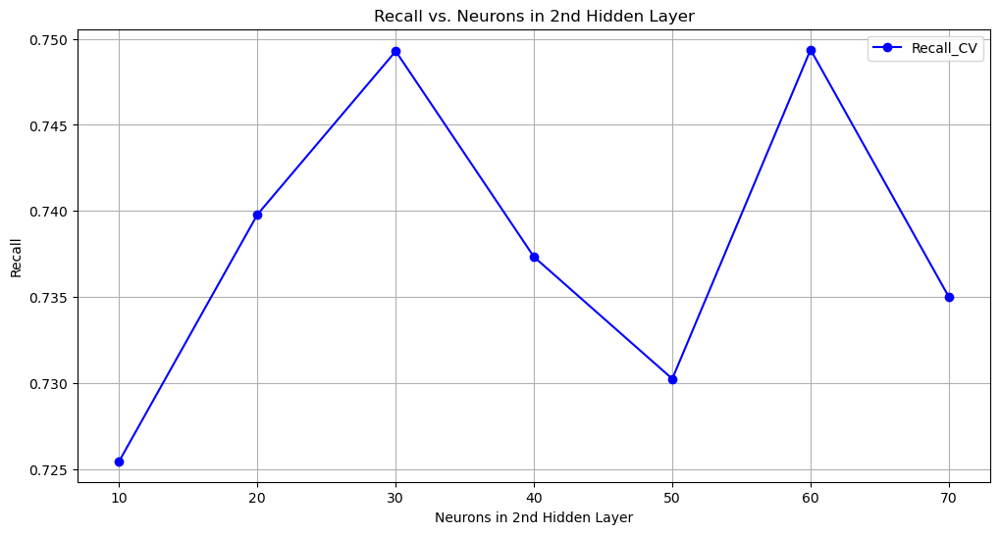

In [180]:
neurons = np.array([10, 20, 30,  40,50, 60, 70])
tune_2ndlayer(df_rp_sparse, neurons,100, 'relu', 0.001)

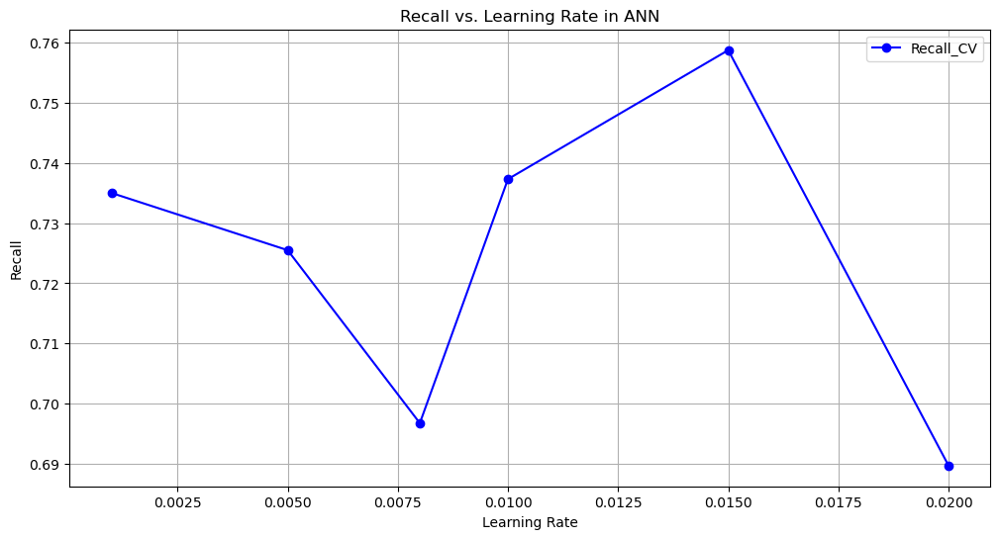

In [208]:
lr_values = np.array([0.001, 0.005, 0.008, 0.01, 0.015, 0.02 ])
tune_learningrate(df_rp_sparse, 80, 10, 'relu', lr_values)

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


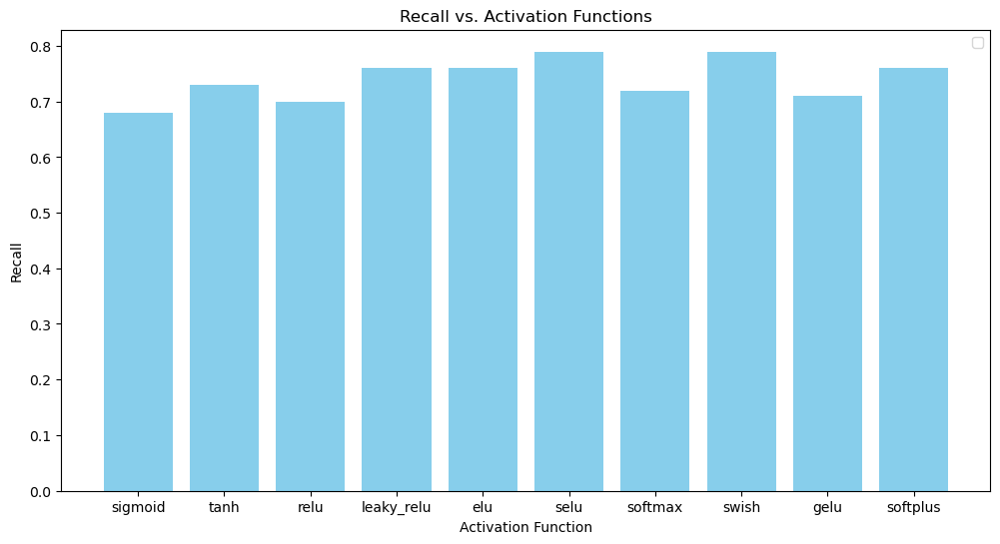

In [210]:
actfuncs = ["sigmoid", "tanh", "relu", "leaky_relu",  "elu", "selu", "softmax", "swish", "gelu", "softplus"]
tune_activations(df_rp_sparse, 80, 10, actfuncs, 0.015)

In [499]:
rp_start_time = time.time()
seeds = np.arange(1,6)
recall_values = []
for seed in seeds:
    ANN_model = Sequential([
        Input(shape=(df_rp_sparse.shape[1],)),   
        Dense(80, activation='selu'),
        Dense(30, activation='selu'),
        Dense(1, activation='sigmoid')  # Output layer for binary classification
       ])

    ANN_model.compile(optimizer=Adam(learning_rate=0.015),
                  loss='binary_crossentropy',
                  metrics=['recall'])
    history = ANN_model.fit(df_rp_sparse, y_train, batch_size = 30, epochs = 30, validation_split=0.3, verbose = 0, shuffle = False)
    X_rpsparse_test = transformer_sparse.fit_transform(X_test)
    loss, recall = ANN_model.evaluate(X_rpsparse_test,y_test)
    print(recall)
    recall_values.append(recall)
    
print(f'Test recall: {np.mean(recall_values):.2f}')
rp_end_time = time.time()
ellapsed_time_rp = rp_end_time - rp_start_time

12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 3.7399 - recall: 0.7104 
0.6703910827636719
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 878us/step - loss: 3.4891 - recall: 0.7689
0.7318435907363892
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 3.4577 - recall: 0.7337 
0.7318435907363892
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 3.7414 - recall: 0.6756 
0.7262569665908813
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 4.6997 - recall: 0.6899 
0.6648044586181641
Test recall: 0.71


In [500]:
ellapsed_time_rp

11.757025241851807

In [221]:
pred_binary = np.where(ANN_model.predict(X_rpsparse_test) > 0.5, 1, 0)
pred_binary = pd.DataFrame(pred_binary)
pred_binary.value_counts()

12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


0
1    249
0    110
Name: count, dtype: int64

In [222]:
cm_ann = confusion_matrix(y_test, pred_binary)
cm_ann

array([[ 72, 108],
       [ 38, 141]], dtype=int64)

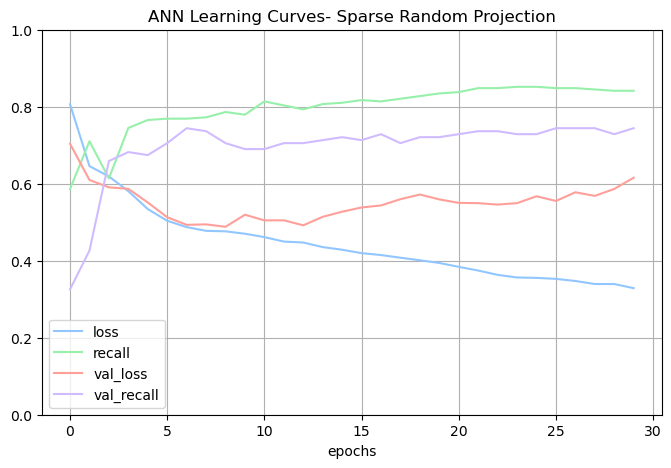

In [223]:
pd.DataFrame(history.history).plot(figsize=(8,5))
plt.title('ANN Learning Curves- Sparse Random Projection')
plt.xlabel('epochs')
plt.legend(loc='best')
plt.grid(True)
plt.gca().set_ylim(0,1)

plt.show()

# ANN with Clustered Data 

# ANN-KMeans

In [224]:
X_kmeans.shape

(837, 3)

In [225]:
kmeans_features = X_kmeans.copy()
kmeans_features = pd.DataFrame(kmeans_features)

In [226]:
kmeans3 = KMeans(init='k-means++', n_clusters=3, n_init=4, random_state=42)
df_kmeans = kmeans3.fit_transform(X_train)

In [227]:
kmeans_labels = kmeans3.fit_predict(X_train)
kmeans_labels  = np.array(kmeans_labels )

In [228]:
from sklearn.preprocessing import OneHotEncoder
# One-hot encode the labels
encoder = OneHotEncoder(sparse_output=False)
labels_one_hot = encoder.fit_transform(kmeans_labels.reshape(-1, 1))

# Convert to DataFrame for easier use
labels_one_hot_df = pd.DataFrame(labels_one_hot, columns=[f'cluster_{i}' for i in range(kmeans3.n_clusters)])

# Concatenate the one-hot encoded labels with the original data (optional)
X_kmeans_features = pd.concat([kmeans_features, labels_one_hot_df], axis=1)

In [229]:
centroids = kmeans3.cluster_centers_

In [230]:
# Calculate distances from each data point to each centroid
distances = cdist(X_train, kmeans3.cluster_centers_, metric='euclidean')

# Find the minimum distance to any centroid for each data point
min_distances = np.min(distances, axis=1)

In [231]:
min_distances.shape

(837,)

In [232]:
X_kmeans_features['min_distances'] = min_distances

In [233]:
# Calculate Silhouette Scores for Each Data Point 
from sklearn.metrics import silhouette_samples

silhouette_values = silhouette_samples(X_train, kmeans3.labels_)

In [234]:
X_kmeans_features['silhouette'] =silhouette_values 

In [235]:
X_kmeans_features.shape

(837, 8)

In [236]:
kmeans_train = pd.concat([X_train.reset_index(drop=True), X_kmeans_features.reset_index(drop=True)], axis=1)

In [237]:
kmeans_train.shape

(837, 26)

Extract the same features from the testing set

In [238]:
X_kmeans3_test = kmeans3.fit_transform(X_test)

In [239]:
kmeans3_test_df = pd.DataFrame(X_kmeans3_test)

In [240]:
test_labels = kmeans3.fit_predict(X_test)

In [241]:
test_labels_one_hot = encoder.fit_transform(test_labels.reshape(-1, 1))

# Convert to DataFrame for easier use
test_labels_one_hot_df = pd.DataFrame(test_labels_one_hot, columns=[f'cluster_{i}' for i in range(kmeans3.n_clusters)])

# Concatenate the one-hot encoded labels with the original data (optional)
test_kmeans_features = pd.concat([kmeans3_test_df, test_labels_one_hot_df], axis=1)

In [242]:
test_distances = cdist(X_test, kmeans3.cluster_centers_, metric='euclidean')

# Find the minimum distance to any centroid for each data point
test_min_distances = np.min(test_distances, axis=1)

In [243]:
silhouette_test = silhouette_samples(X_test, test_labels)

In [244]:
test_kmeans_features['min_distances'] = test_min_distances

In [245]:
test_kmeans_features['silhouette'] = silhouette_test 

In [246]:
test_kmeans_features.shape

(359, 8)

In [247]:
kmeans_test = pd.concat([X_test.reset_index(drop=True), test_kmeans_features.reset_index(drop=True)], axis=1)

In [248]:
kmeans_test.shape

(359, 26)

In [495]:
kmeans_start_time = time.time()

seeds = np.arange(1,6)
recall_values = []
for seed in seeds:
    ANN_model = Sequential([
        Input(shape=(kmeans_train.shape[1],)),   
        Dense(60, activation='relu'),
        Dense(5, activation='relu'),
        Dense(1, activation='sigmoid')  # Output layer for binary classification
        ])

    ANN_model.compile(optimizer=Adam(learning_rate=0.01),
                  loss='binary_crossentropy',
                  metrics=['recall'])

    history = ANN_model.fit(kmeans_train, y_train, batch_size = 30, epochs = 30, validation_split=0.3, verbose = 0, shuffle = False)

    loss, recall = ANN_model.evaluate(kmeans_test,y_test)
    recall_values.append(recall)
    
print(f'Test recall: {np.mean(recall_values):.2f}')
kmeans_end_time = time.time()
kmeans_ellapse_time = kmeans_end_time - kmeans_start_time

12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7916 - recall: 0.6374
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 790us/step - loss: 0.6413 - recall: 0.7408
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.9431 - recall: 0.6761 
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4807 - recall: 0.8153
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1603 - recall: 0.4921 
Test recall: 0.70


In [251]:
kmeans_ellapse_time

11.369456768035889

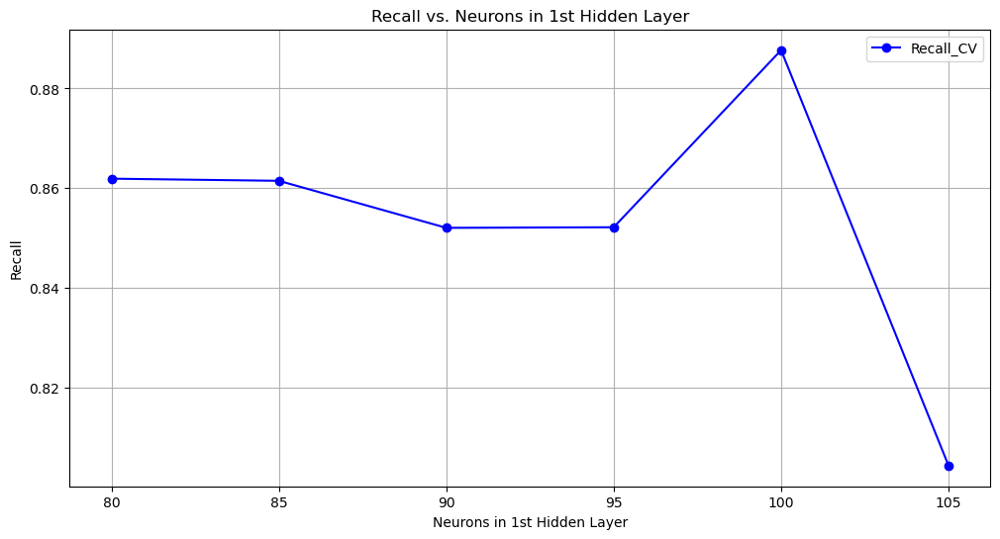

In [252]:
neurons = np.array([80, 85, 90, 95, 100, 105])
tune_layer1(kmeans_train, neurons, 5, 'relu', 0.01)

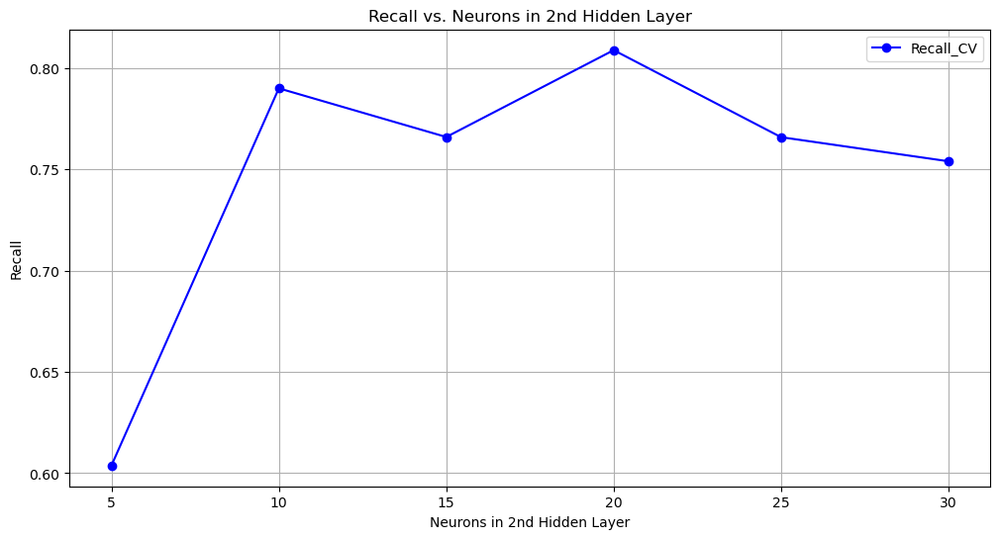

In [253]:
neurons = np.array([5, 10, 15, 20, 25, 30])
tune_2ndlayer(kmeans_train, neurons, 100, 'relu', 0.01)

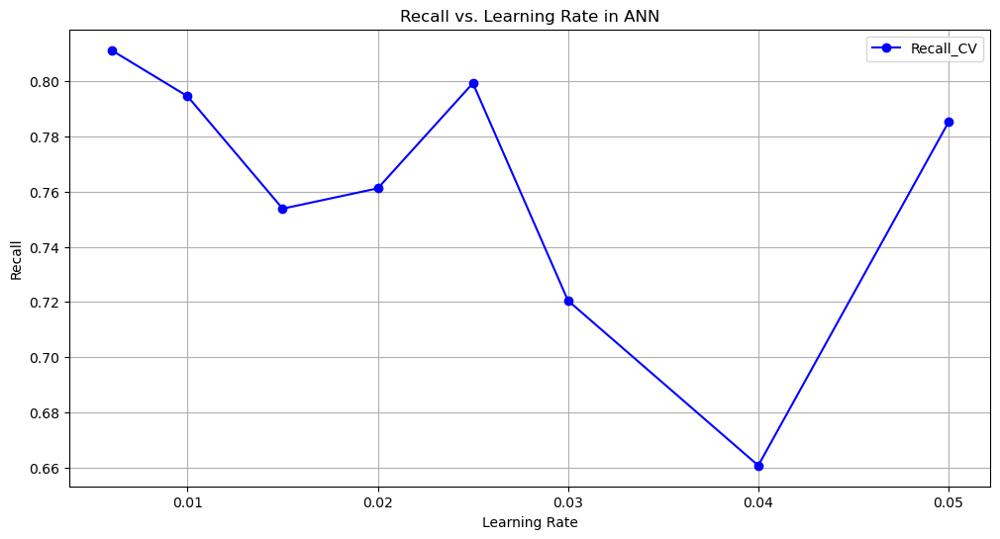

In [254]:
lr_values = np.array([0.006, 0.01,  0.015, 0.02, 0.025, 0.03, 0.04, 0.05])
tune_learningrate(kmeans_train, 100, 20, 'relu', lr_values)

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


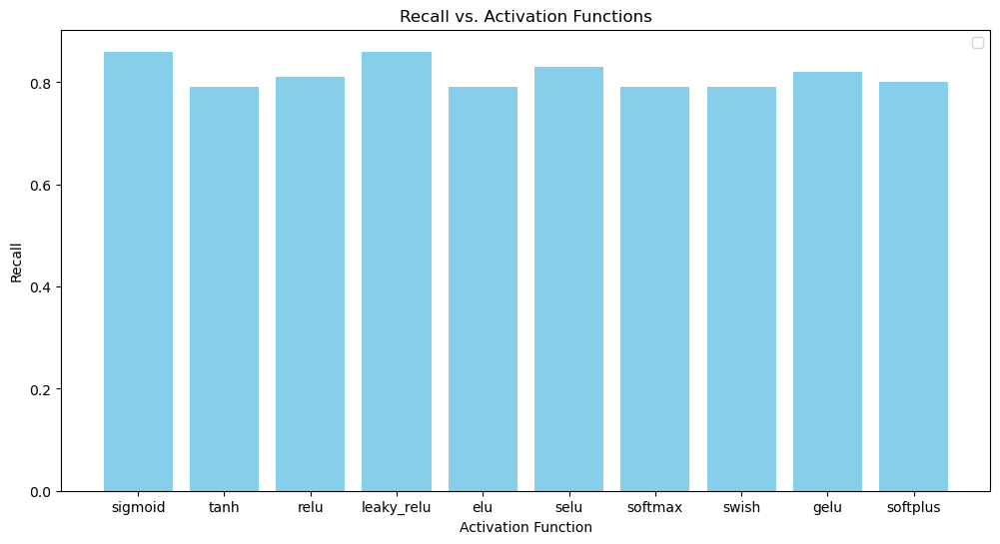

In [255]:
actfuncs = ["sigmoid", "tanh", "relu", "leaky_relu",  "elu", "selu", "softmax", "swish", "gelu", "softplus"]
tune_activations(kmeans_train, 100, 20, actfuncs, 0.006)

In [493]:
kmeans_start_time = time.time()
seeds = np.arange(1,6)
recall_values = []
for seed in seeds:
    ANN_model = Sequential([
        Input(shape=(kmeans_train.shape[1],)),   
        Dense(100, activation='sigmoid'),
        Dense(20, activation='sigmoid'),
        Dense(1, activation='sigmoid')  # Output layer for binary classification
       ])

    ANN_model.compile(optimizer=Adam(learning_rate=0.006),
                  loss='binary_crossentropy',
                  metrics=['recall'])
    history = ANN_model.fit(kmeans_train, y_train, batch_size = 30, epochs = 30, validation_split=0.3, verbose = 0, shuffle = False)
    loss, recall = ANN_model.evaluate(kmeans_test,y_test)
    recall_values.append(recall)
    
print(f'Test recall: {np.mean(recall_values):.2f}')
kmeans_end_time = time.time()
kmeans_ellapse_time = kmeans_end_time - kmeans_start_time

12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4836 - recall: 0.7679 
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 826us/step - loss: 0.4879 - recall: 0.7896
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 876us/step - loss: 0.5098 - recall: 0.7778
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 958us/step - loss: 0.5131 - recall: 0.7405
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4738 - recall: 0.7958
Test recall: 0.82


In [494]:
kmeans_ellapse_time

20.500908851623535

In [329]:
pred_binary = np.where(ANN_model.predict(kmeans_test) > 0.5, 1, 0)

12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


In [330]:
pred_binary = pd.DataFrame(pred_binary)
pred_binary.value_counts()

0
0    180
1    179
Name: count, dtype: int64

In [331]:
cm_ann = confusion_matrix(y_test, pred_binary)
cm_ann

array([[149,  31],
       [ 31, 148]], dtype=int64)

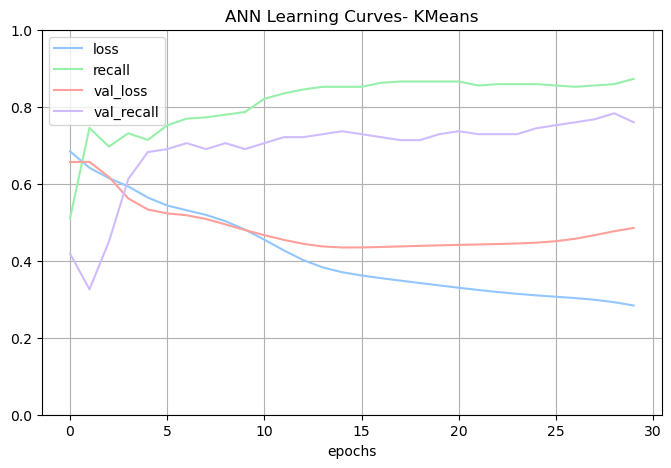

In [332]:
pd.DataFrame(history.history).plot(figsize=(8,5))
plt.title('ANN Learning Curves- KMeans')
plt.xlabel('epochs')
plt.legend(loc='best')
plt.grid(True)
plt.gca().set_ylim(0,1)

plt.show()

# ANN-GMM

Extract new features from GMM model

In [333]:
# Fit the best GMM model 
gmm_churn = GaussianMixture(n_components=2, covariance_type='tied', random_state=42)
gmm_churn.fit(X_train)

# Get cluster labels
cluster_labels = gmm_churn.predict(X_train)

In [339]:
gmm_labels_one_hot = encoder.fit_transform(cluster_labels.reshape(-1, 1))

# Convert to DataFrame for easier use
gmm_labels_one_hot_df = pd.DataFrame(gmm_labels_one_hot, columns=[f'cluster_{i}' for i in range(2)])

# Concatenate the one-hot encoded labels with the original data (optional)
# X_kmeans_features = pd.concat([kmeans_features, labels_one_hot_df], axis=1)

In [340]:
# calculate the cluster membership probability 
cluster_probabilities = np.round(gmm_churn.predict_proba(X_train),4)

In [341]:
pd.set_option('display.float_format', '{:.10f}'.format)
np.set_printoptions(suppress=True, precision=4) 

In [342]:
# calculate the log likelihood for each datapoint
log_likelihoods = gmm_churn.score_samples(X_train)

In [343]:
# calculate cluster entropy
from scipy.stats import entropy
cluster_probabilities = gmm_churn.predict_proba(X_train)
entropy_values = entropy(cluster_probabilities, axis=1)

In [344]:
# calculate Mahalanobis Distance to Cluster Centroids
mahalanobis_distances=[]
for i, label in enumerate(gmm_churn.predict(X_train)):
    cluster_mean = gmm_churn.means_[label]
    cluster_cov = gmm_churn.covariances_[label] if gmm_churn.covariance_type != 'tied' else gmm_churn.covariances_
    inv_cov = np.linalg.inv(cluster_cov)
    distance = mahalanobis(X_train.iloc[i], cluster_mean, inv_cov)
    mahalanobis_distances.append(distance)

In [345]:
# Distance Ratios or Probability Ratios Between Top Clusters
cluster_probabilities = gmm_churn.predict_proba(X_train)
sorted_probs = np.sort(cluster_probabilities, axis=1)
probability_ratio = sorted_probs[:, -1] / sorted_probs[:, -2]  # ratio of top two probabilities

In [346]:
X_train_gmm = X_train.copy()
X_train_gmm['log_likelihoods'] = log_likelihoods
X_train_gmm['entropy'] = entropy_values
X_train_gmm['mahalanobis_distances'] = mahalanobis_distances
X_train_gmm['probability_ratio'] = probability_ratio

In [349]:
X_train_gmm = pd.concat([X_train_gmm.reset_index(drop=True), gmm_labels_one_hot_df.reset_index(drop=True)], axis=1)

Tuning the ANN model trained by new features extraced from GMM

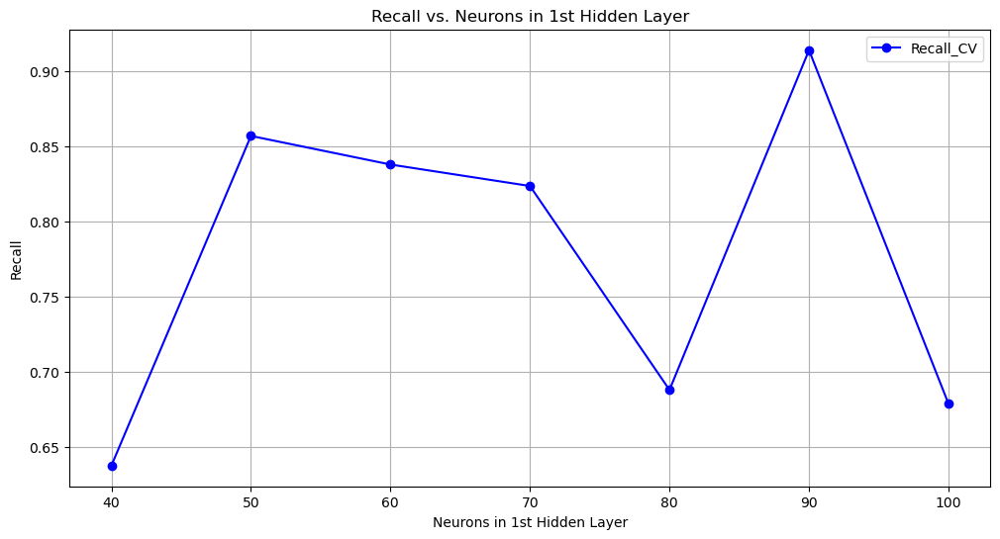

In [352]:
neurons = np.array([ 40, 50, 60, 70, 80, 90, 100])
tune_layer1(X_train_gmm, neurons, 5, 'relu', 0.01)

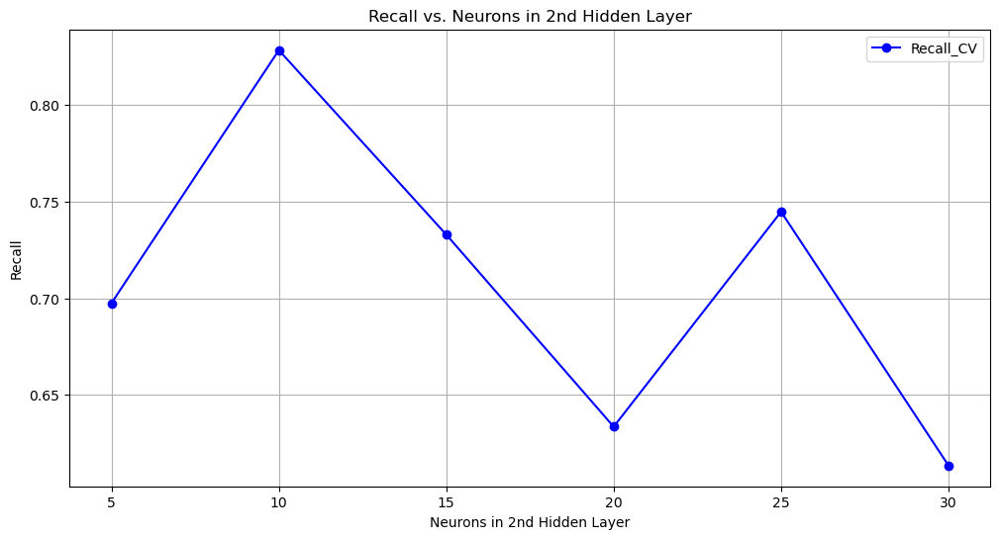

In [357]:
neurons = np.array([5, 10, 15, 20, 25, 30])
tune_2ndlayer(X_train_gmm, neurons, 90, 'relu', 0.01)

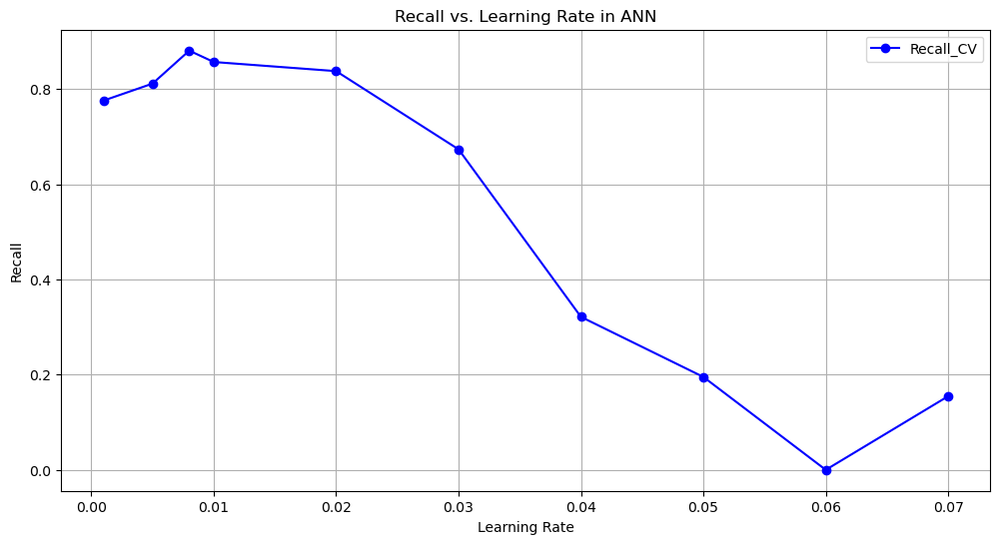

In [358]:
lr_values = np.array([0.001, 0.005, 0.008, 0.01, 0.02, 0.03, 0.04, 0.05, 0.06, 0.07])
tune_learningrate(X_train_gmm, 90, 5, 'relu', lr_values)

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


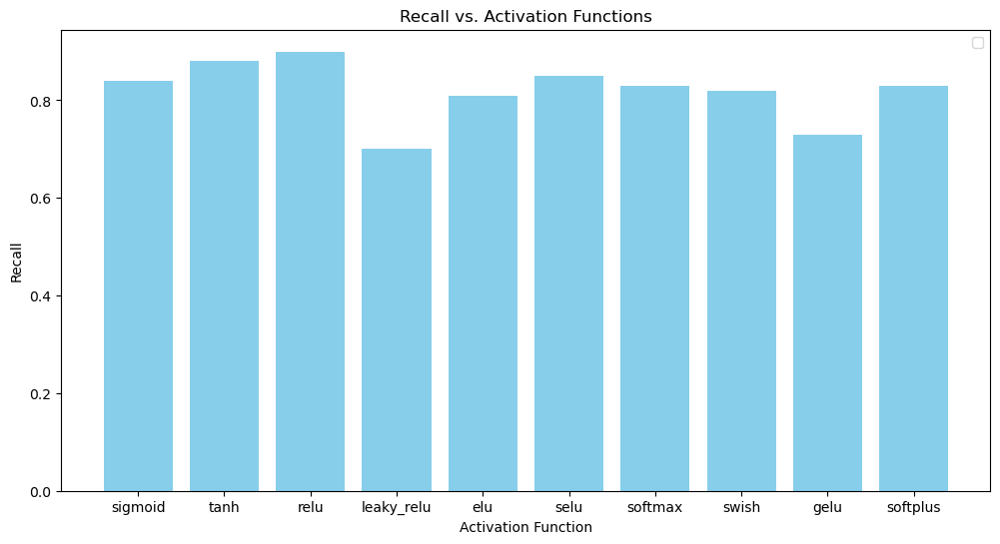

In [359]:
actfuncs = ["sigmoid", "tanh", "relu", "leaky_relu",  "elu", "selu", "softmax", "swish", "gelu", "softplus"]
tune_activations(X_train_gmm, 90, 5, actfuncs, 0.008)

# extract the same features from the test data

In [360]:
# calculate the cluster membership probability 
cluster_probabilities_test = np.round(gmm_churn.predict_proba(X_test),4)

In [361]:
# calculate the log likelihood for each datapoint
log_likelihoods_test = gmm_churn.score_samples(X_test)

In [362]:
cluster_probabilities_test = gmm_churn.predict_proba(X_test)
entropy_values_test = entropy(cluster_probabilities_test, axis=1)

In [363]:
# calculate Mahalanobis Distance to Cluster Centroids
mahalanobis_distances_test=[]
for i, label in enumerate(gmm_churn.predict(X_test)):
    cluster_mean = gmm_churn.means_[label]
    cluster_cov = gmm_churn.covariances_[label] if gmm_churn.covariance_type != 'tied' else gmm_churn.covariances_
    inv_cov = np.linalg.inv(cluster_cov)
    distance = mahalanobis(X_test.iloc[i], cluster_mean, inv_cov)
    mahalanobis_distances_test.append(distance)

In [364]:
# Distance Ratios or Probability Ratios Between Top Clusters
cluster_probabilities_test = gmm_churn.predict_proba(X_test)
sorted_probs_test = np.sort(cluster_probabilities_test, axis=1)
probability_ratio_test = sorted_probs_test[:, -1] / sorted_probs_test[:, -2]  # ratio of top two probabilities

In [365]:
X_test_gmm = X_test.copy()
X_test_gmm['log_likelihoods'] = log_likelihoods_test
X_test_gmm['entropy'] = entropy_values_test
X_test_gmm['mahalanobis_distances'] = mahalanobis_distances_test
X_test_gmm['probability_ratio'] = probability_ratio_test

In [366]:
# Get cluster labels
cluster_labels_test = gmm_churn.predict(X_test)

In [367]:
gmm_test_labels_one_hot = encoder.fit_transform(cluster_labels_test.reshape(-1, 1))

# Convert to DataFrame for easier use
gmm_test_labels_one_hot_df = pd.DataFrame(gmm_test_labels_one_hot, columns=[f'cluster_{i}' for i in range(2)])

In [368]:
X_test_gmm = pd.concat([X_test_gmm.reset_index(drop=True), gmm_test_labels_one_hot_df.reset_index(drop=True)], axis=1)

In [479]:
gmm_start_time = time.time()

seeds = np.arange(1,6)
recall_values = []
for seed in seeds:
    ANN_model = Sequential([
        Input(shape=(X_train_gmm.shape[1],)),   
        Dense(60, activation='relu'),
        Dense(5, activation='relu'),
        Dense(1, activation='sigmoid')  # Output layer for binary classification
        ])

    ANN_model.compile(optimizer=Adam(learning_rate=0.01),
                  loss='binary_crossentropy',
                  metrics=['recall'])

    history = ANN_model.fit(X_train_gmm, y_train, batch_size = 30, epochs = 30, validation_split=0.3, verbose = 0, 
                            shuffle = False)

    loss, recall = ANN_model.evaluate(X_test_gmm,y_test)
    recall_values.append(recall)
    
print(f'Test recall: {np.mean(recall_values):.2f}')
gmm_end_time = time.time()
gmm_ellapse_time = kmeans_end_time - kmeans_start_time

12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 838us/step - loss: 0.9087 - recall: 0.8013
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 909us/step - loss: 0.8751 - recall: 0.8713
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7518 - recall: 0.7334
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 816us/step - loss: 0.5558 - recall: 0.7979
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 986us/step - loss: 0.8271 - recall: 0.8150
Test recall: 0.83


In [802]:
gmm_start_time = time.time()
# fit the ANN with the A1 architecture to the new data
recall_values = []
for seed in seeds:
    ANN_model = Sequential([
        Input(shape=(X_train_gmm.shape[1],)),   
        Dense(90, activation='relu'),
        Dense(10, activation='relu'),
        Dense(1, activation='sigmoid')  # Output layer for binary classification
        ])

    ANN_model.compile(optimizer=Adam(learning_rate=0.008),
                  loss='binary_crossentropy',
                  metrics=['recall'])

    history = ANN_model.fit(X_train_gmm, y_train, batch_size = 50, epochs = 20, validation_split=0.3, 
                            verbose = 0, shuffle = False)
    loss, recall = ANN_model.evaluate(X_test_gmm,y_test)
    recall_values.append(recall)

print(f'Test recall: {np.mean(recall_values):.2f}')

gmm_end_time = time.time()
gmm_ellapse_time = kmeans_end_time - kmeans_start_time

12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 254.4737 - recall: 0.7482
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6497 - recall: 0.7981 
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 956us/step - loss: 0.6955 - recall: 0.7925
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 2.7538 - recall: 0.7424 
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 911us/step - loss: 0.6229 - recall: 0.0036   
Test recall: 0.65


In [803]:
gmm_ellapse_time

11.666114091873169

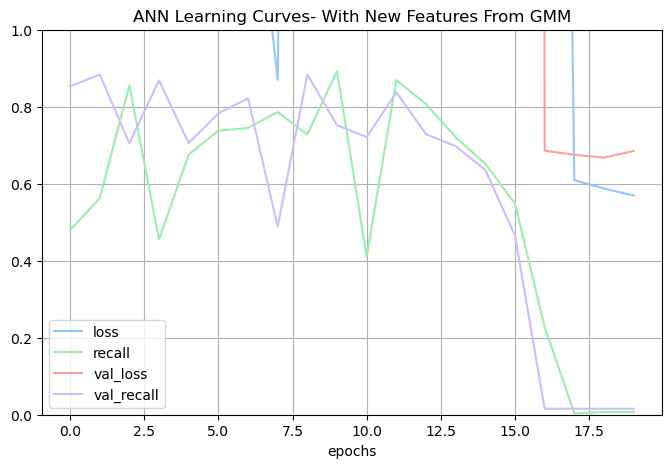

In [804]:
pd.DataFrame(history.history).plot(figsize=(8,5))
plt.title('ANN Learning Curves- With New Features From GMM')
plt.xlabel('epochs')
plt.legend(loc='best')
plt.grid(True)
plt.gca().set_ylim(0,1)

plt.show()